In [1]:
import gc
from glob import glob
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from pathlib import Path
import time

import category_encoders as ce
import lightgbm as lgb

from sklearn import metrics
from sklearn.model_selection import StratifiedKFold

pd.set_option('display.max_columns', None)

In [2]:
DATASET_VERSION = "06"

***
## loading data

In [3]:
raw = pd.read_parquet(
    "../data/ext/amex-data-integer-dtypes-parquet-format/test.parquet", 
    columns=["customer_ID","S_2"]
)
raw["S_2"] = pd.to_datetime(raw["S_2"])
raw = raw.groupby("customer_ID")["S_2"].max().reset_index()
raw["S_2_month"] = raw.S_2.dt.month
raw.loc[raw.query("S_2_month == 4").index,"which"]  = "pub"
raw.loc[raw.query("S_2_month == 10").index,"which"] = "priv"
raw

,customer_ID,S_2,S_2_month,which
0,00000469ba478561f23a92a868bd366de6f6527a684c9a...,2019-10-12,10,priv
1,00001bf2e77ff879fab36aa4fac689b9ba411dae63ae39...,2019-04-15,4,pub
2,0000210045da4f81e5f122c6bde5c2a617d03eef67f82c...,2019-10-16,10,priv
3,00003b41e58ede33b8daf61ab56d9952f17c9ad1c3976c...,2019-04-22,4,pub
4,00004b22eaeeeb0ec976890c1d9bfc14fd9427e98c4ee9...,2019-10-22,10,priv
...,...,...,...,...
924616,ffff952c631f2c911b8a2a8ca56ea6e656309a83d2f64c...,2019-04-14,4,pub
924617,ffffcf5df59e5e0bba2a5ac4578a34e2b5aa64a1546cd3...,2019-10-19,10,priv
924618,ffffd61f098cc056dbd7d2a21380c4804bbfe60856f475...,2019-04-06,4,pub
924619,ffffddef1fc3643ea179c93245b68dca0f36941cd83977...,2019-04-08,4,pub


In [4]:
raw = raw[["customer_ID","which"]].set_index("customer_ID")
raw

,which
customer_ID,
00000469ba478561f23a92a868bd366de6f6527a684c9a2e78fb826dcac3b9b7,priv
00001bf2e77ff879fab36aa4fac689b9ba411dae63ae397d4263dafa1daedef5,pub
0000210045da4f81e5f122c6bde5c2a617d03eef67f82c5e400fc98e7bd43ce8,priv
00003b41e58ede33b8daf61ab56d9952f17c9ad1c3976cf6e56734528702d694,pub
00004b22eaeeeb0ec976890c1d9bfc14fd9427e98c4ee9a4693dd914fca22557,priv
...,...
ffff952c631f2c911b8a2a8ca56ea6e656309a83d2f64c5d60460dba6dedc41e,pub
ffffcf5df59e5e0bba2a5ac4578a34e2b5aa64a1546cd3a4f0ca3de613b0b2ad,priv
ffffd61f098cc056dbd7d2a21380c4804bbfe60856f475cb095d2443a68030f1,pub


In [5]:
train = pd.read_parquet(f"../data/processed/dsv{DATASET_VERSION}/train.parquet")
test = pd.read_parquet(f"../data/processed/dsv{DATASET_VERSION}/test.parquet")

In [6]:
test = pd.merge(test, raw, how="inner", left_index=True, right_index=True)
test_pub = test.query("which == 'pub'").copy()
test_priv = test.query("which == 'priv'").copy()
del test; gc.collect()

12

In [7]:
input_feats = train.columns.tolist()
len(input_feats)

1308

In [8]:
train["target"] = 0
test_pub["target"] = 1
test_priv["target"] = 1

In [9]:
#dset = pd.concat([train,test_pub], ignore_index=True)
dset = pd.concat([train,test_priv], ignore_index=True)
dset.target.value_counts() 

0    458913
1    456655
Name: target, dtype: int64

***
## training the adversarial classifier

In [10]:
model_params = {
    'objective': 'binary',
    'metric': 'auc',
    'num_iterations': 5000,
    'num_leaves': 31,
    'learning_rate': 0.05,
    'max_bin': 127,
    'bin_construct_sample_cnt': 100000000,
    'bagging_freq': 1,
    'bagging_fraction': 1.0,
    'feature_fraction': 0.2,
    'lambda_l1': 6,
    'lambda_l2': 2,
    'min_data_in_leaf': 1000,
    'path_smooth': 1.5,
    'min_gain_to_split': 0.3,
    'seed': 2112,
    'force_col_wise': True,
    'feature_pre_filter': True,
    'verbosity': -1,
}

In [11]:
skf = StratifiedKFold(n_splits=3, shuffle=True, random_state=2112)
skf_split = list(skf.split(dset, dset["target"].values))

----------------------------------------------------------------------------------------------------
ITER: 1/100


/opt/conda/lib/python3.7/site-packages/lightgbm/engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99995
[100]	valid_0's auc: 0.999973
[150]	valid_0's auc: 0.999985
[200]	valid_0's auc: 0.999992
[250]	valid_0's auc: 0.999994
[300]	valid_0's auc: 0.999996
[350]	valid_0's auc: 0.999996
[400]	valid_0's auc: 0.999997
[450]	valid_0's auc: 0.999997
[500]	valid_0's auc: 0.999997
[550]	valid_0's auc: 0.999997
[600]	valid_0's auc: 0.999997
[650]	valid_0's auc: 0.999997
[700]	valid_0's auc: 0.999997
Early stopping, best iteration is:
[649]	valid_0's auc: 0.999997


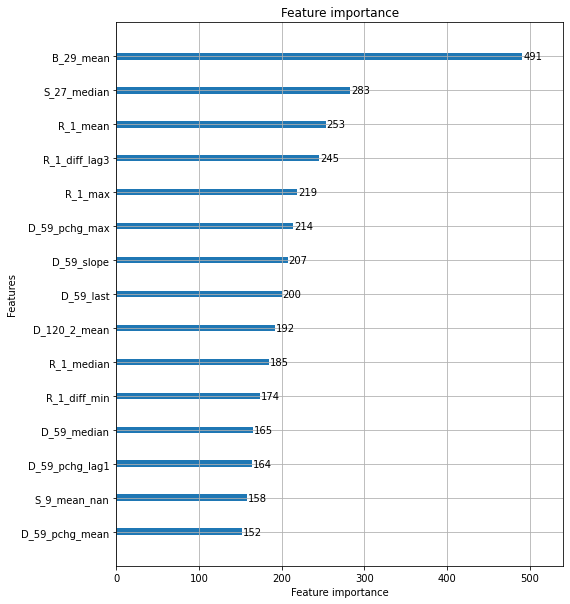

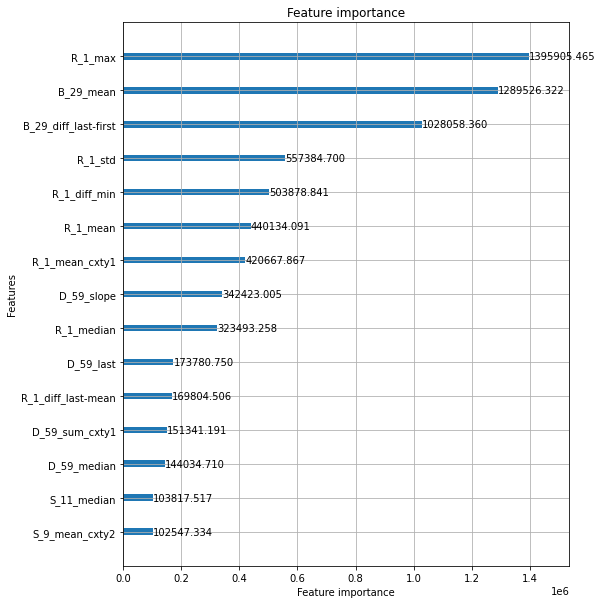

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999962
[100]	valid_0's auc: 0.999982
[150]	valid_0's auc: 0.999992
[200]	valid_0's auc: 0.999996
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999999
[550]	valid_0's auc: 0.999999
[600]	valid_0's auc: 0.999999
[650]	valid_0's auc: 0.999999
[700]	valid_0's auc: 0.999999
Early stopping, best iteration is:
[641]	valid_0's auc: 0.999999


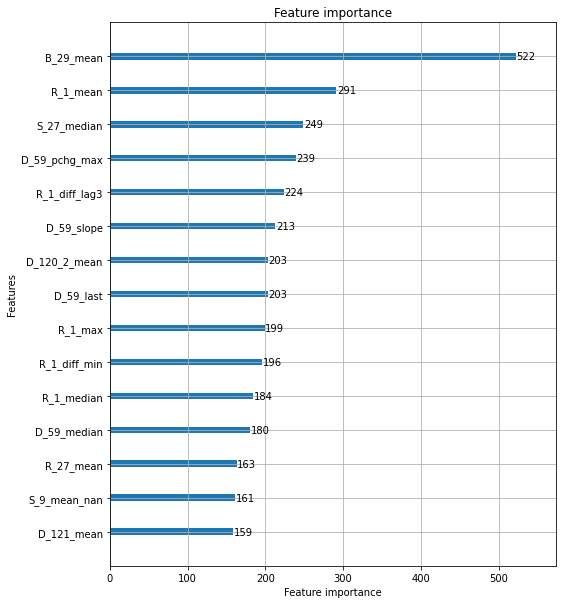

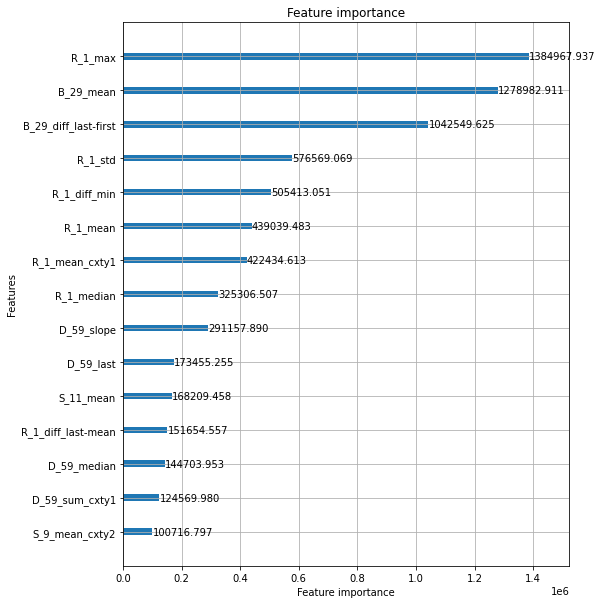

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999964
[100]	valid_0's auc: 0.999983
[150]	valid_0's auc: 0.999992
[200]	valid_0's auc: 0.999996
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999999
[550]	valid_0's auc: 0.999999
[600]	valid_0's auc: 0.999999
[650]	valid_0's auc: 0.999999
[700]	valid_0's auc: 0.999999
Early stopping, best iteration is:
[640]	valid_0's auc: 0.999999


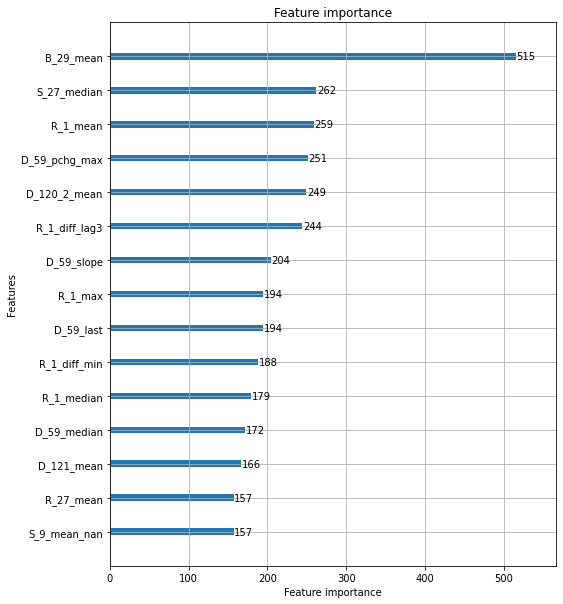

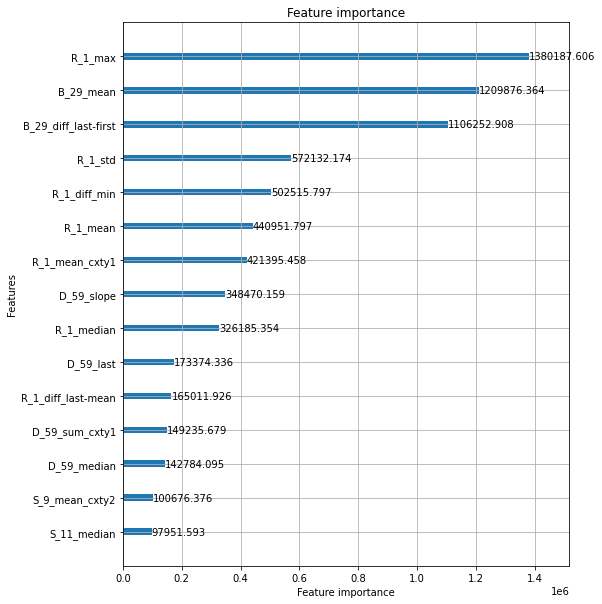

feature to remove: R_1_max
Elapsed time: 5.790245374043782 min.
----------------------------------------------------------------------------------------------------
ITER: 2/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999967
[100]	valid_0's auc: 0.999976
[150]	valid_0's auc: 0.999986
[200]	valid_0's auc: 0.999992
[250]	valid_0's auc: 0.999995
[300]	valid_0's auc: 0.999996
[350]	valid_0's auc: 0.999996
[400]	valid_0's auc: 0.999997
[450]	valid_0's auc: 0.999997
[500]	valid_0's auc: 0.999997
[550]	valid_0's auc: 0.999997
[600]	valid_0's auc: 0.999997
[650]	valid_0's auc: 0.999997
[700]	valid_0's auc: 0.999997
Early stopping, best iteration is:
[613]	valid_0's auc: 0.999997


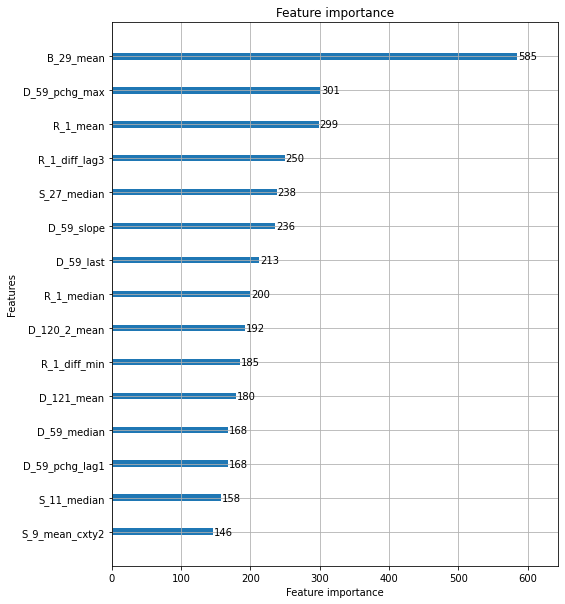

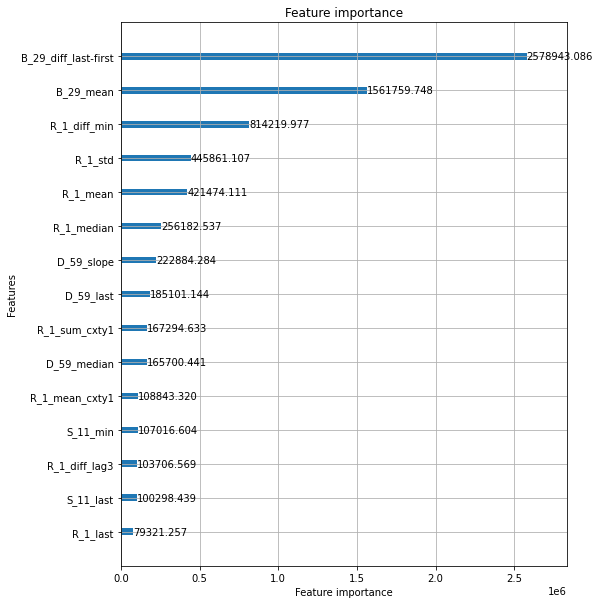

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999975
[100]	valid_0's auc: 0.999984
[150]	valid_0's auc: 0.999992
[200]	valid_0's auc: 0.999995
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999997
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
[700]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[619]	valid_0's auc: 0.999998


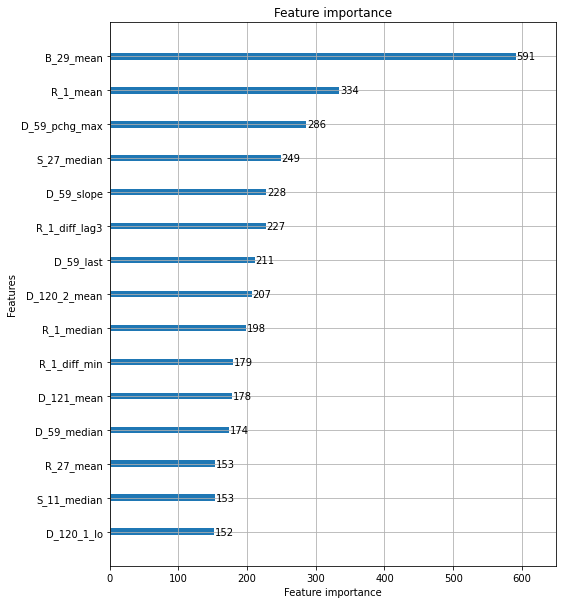

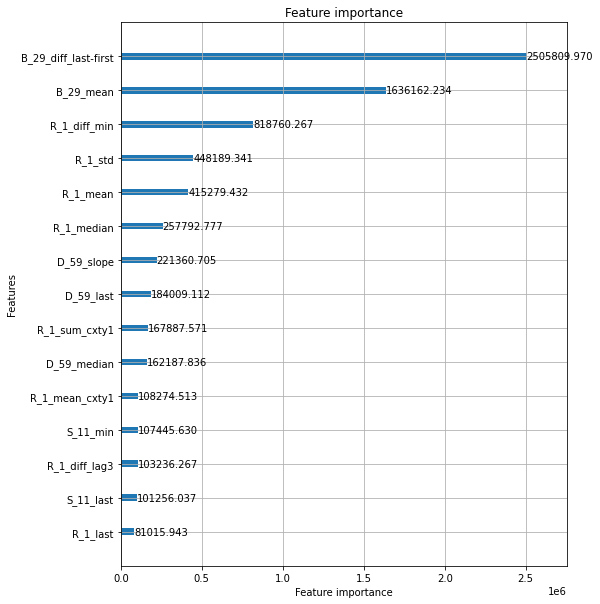

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999976
[100]	valid_0's auc: 0.999985
[150]	valid_0's auc: 0.999993
[200]	valid_0's auc: 0.999996
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[592]	valid_0's auc: 0.999998


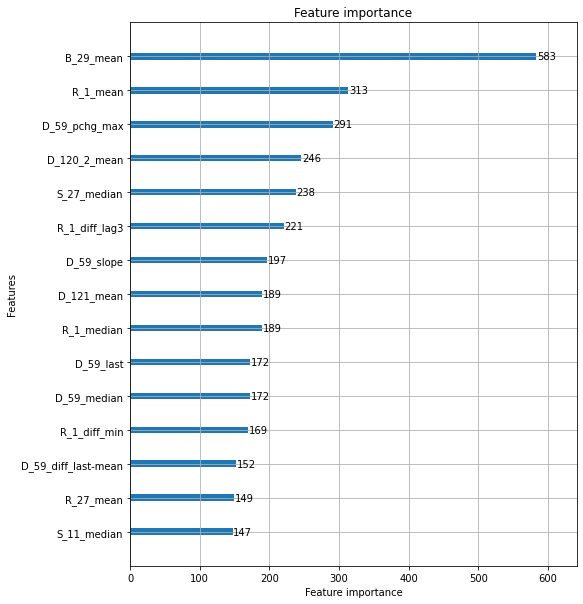

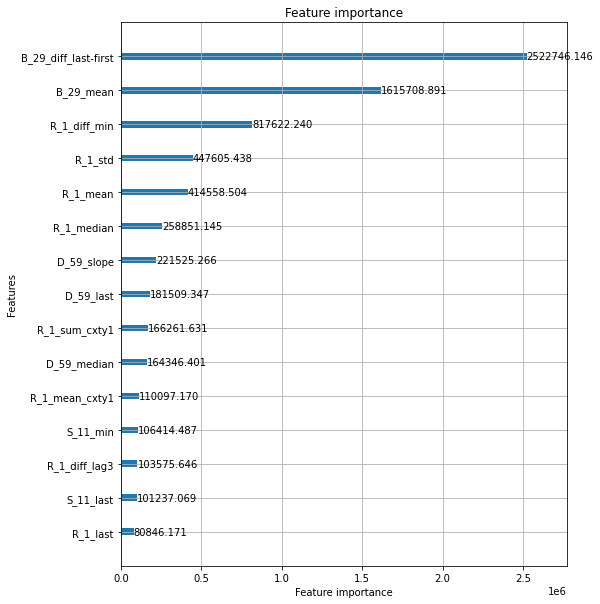

feature to remove: B_29_diff_last-first
Elapsed time: 5.60495437781016 min.
----------------------------------------------------------------------------------------------------
ITER: 3/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99994
[100]	valid_0's auc: 0.999976
[150]	valid_0's auc: 0.999987
[200]	valid_0's auc: 0.999992
[250]	valid_0's auc: 0.999995
[300]	valid_0's auc: 0.999996
[350]	valid_0's auc: 0.999997
[400]	valid_0's auc: 0.999997
[450]	valid_0's auc: 0.999997
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
[700]	valid_0's auc: 0.999998
[750]	valid_0's auc: 0.999998
[800]	valid_0's auc: 0.999998
[850]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[764]	valid_0's auc: 0.999998


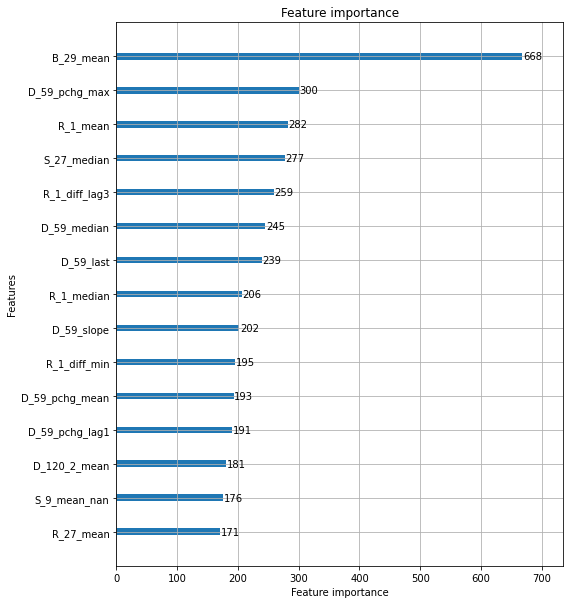

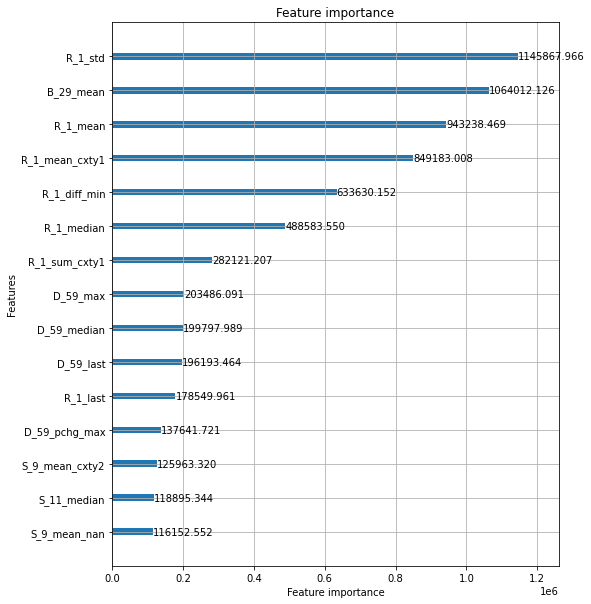

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999948
[100]	valid_0's auc: 0.999983
[150]	valid_0's auc: 0.999993
[200]	valid_0's auc: 0.999996
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999999
[450]	valid_0's auc: 0.999999
[500]	valid_0's auc: 0.999999
[550]	valid_0's auc: 0.999999
[600]	valid_0's auc: 0.999999
[650]	valid_0's auc: 0.999999
[700]	valid_0's auc: 0.999999
[750]	valid_0's auc: 0.999999
Early stopping, best iteration is:
[682]	valid_0's auc: 0.999999


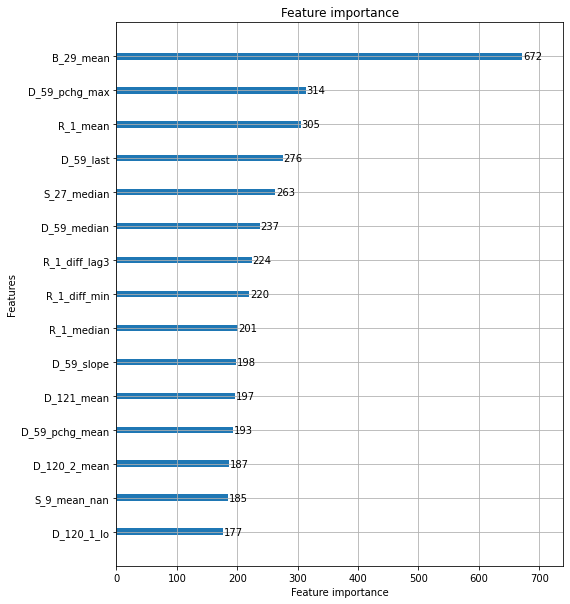

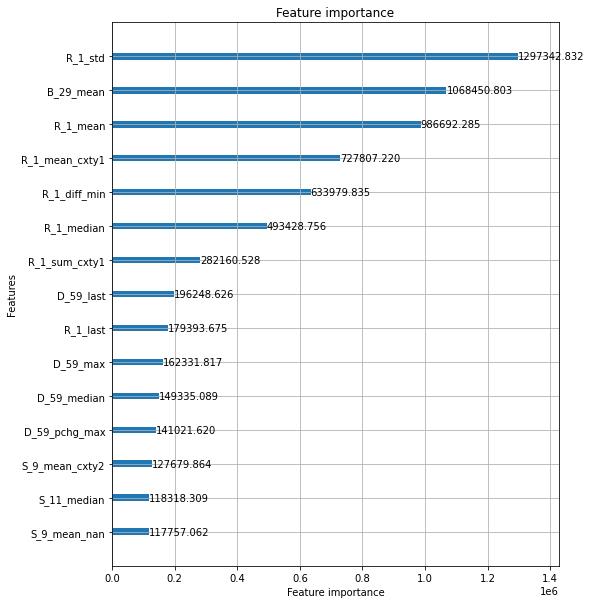

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999946
[100]	valid_0's auc: 0.999981
[150]	valid_0's auc: 0.999991
[200]	valid_0's auc: 0.999995
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999997
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
[700]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[643]	valid_0's auc: 0.999998


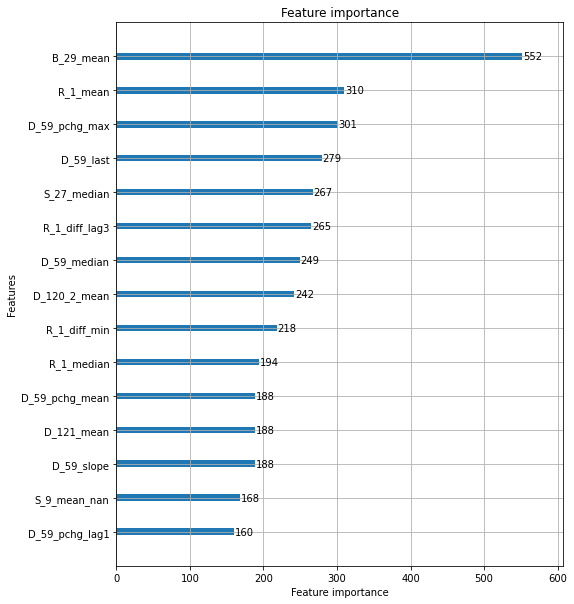

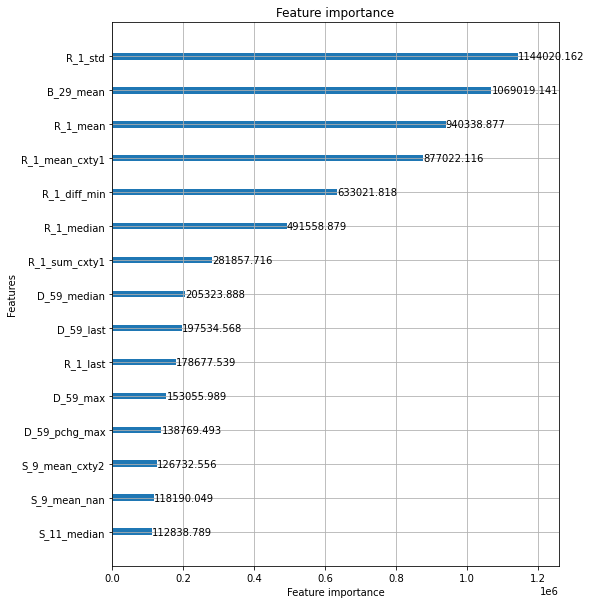

feature to remove: R_1_std
Elapsed time: 5.927158359686533 min.
----------------------------------------------------------------------------------------------------
ITER: 4/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99994
[100]	valid_0's auc: 0.999978
[150]	valid_0's auc: 0.999988
[200]	valid_0's auc: 0.999993
[250]	valid_0's auc: 0.999995
[300]	valid_0's auc: 0.999997
[350]	valid_0's auc: 0.999997
[400]	valid_0's auc: 0.999997
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
[700]	valid_0's auc: 0.999998
[750]	valid_0's auc: 0.999998
[800]	valid_0's auc: 0.999998
[850]	valid_0's auc: 0.999998
[900]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[814]	valid_0's auc: 0.999998


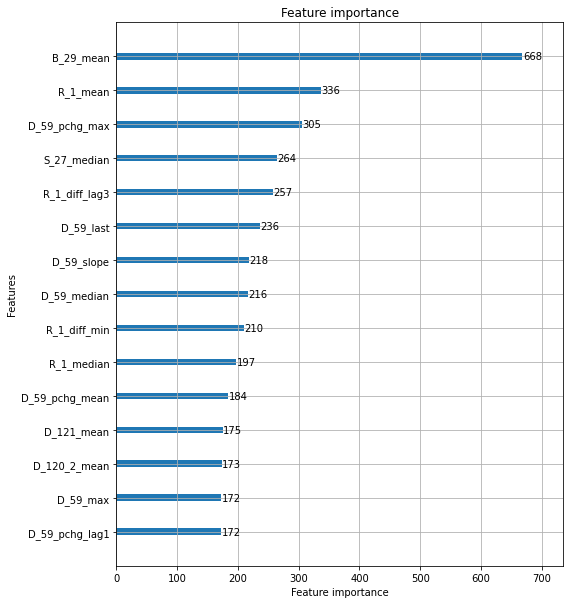

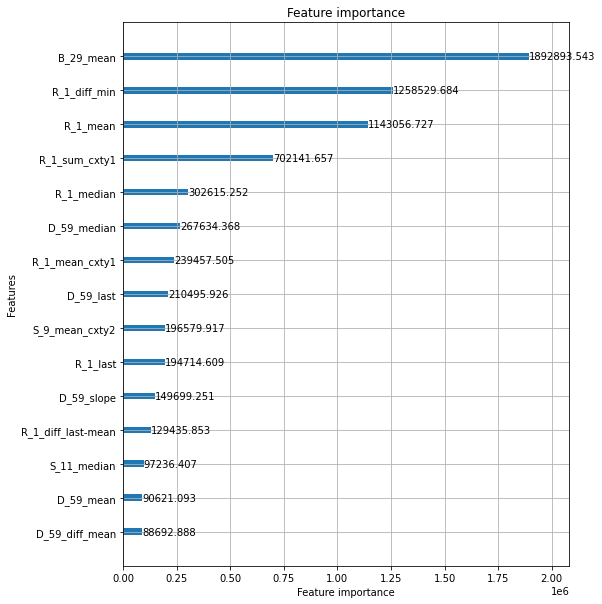

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999952
[100]	valid_0's auc: 0.999986
[150]	valid_0's auc: 0.999993
[200]	valid_0's auc: 0.999996
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999999
[450]	valid_0's auc: 0.999999
[500]	valid_0's auc: 0.999999
[550]	valid_0's auc: 0.999999
[600]	valid_0's auc: 0.999999
[650]	valid_0's auc: 0.999999
[700]	valid_0's auc: 0.999999
[750]	valid_0's auc: 0.999999
[800]	valid_0's auc: 0.999999
Early stopping, best iteration is:
[709]	valid_0's auc: 0.999999


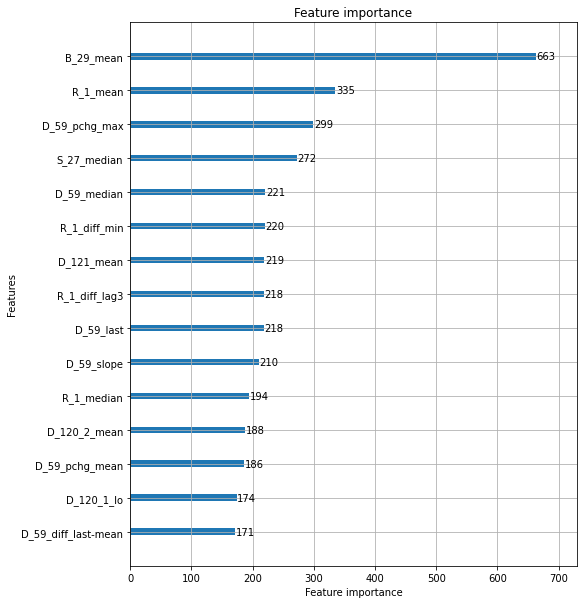

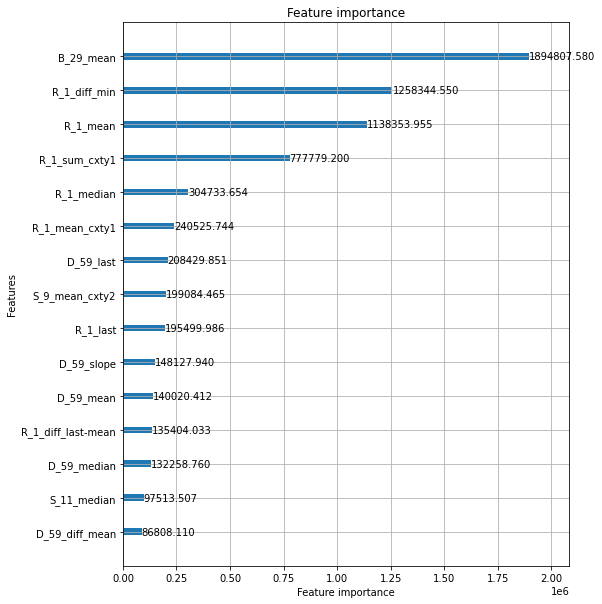

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999951
[100]	valid_0's auc: 0.999984
[150]	valid_0's auc: 0.999992
[200]	valid_0's auc: 0.999995
[250]	valid_0's auc: 0.999997
[300]	valid_0's auc: 0.999998
[350]	valid_0's auc: 0.999998
[400]	valid_0's auc: 0.999998
[450]	valid_0's auc: 0.999998
[500]	valid_0's auc: 0.999998
[550]	valid_0's auc: 0.999998
[600]	valid_0's auc: 0.999998
[650]	valid_0's auc: 0.999998
[700]	valid_0's auc: 0.999998
Early stopping, best iteration is:
[648]	valid_0's auc: 0.999998


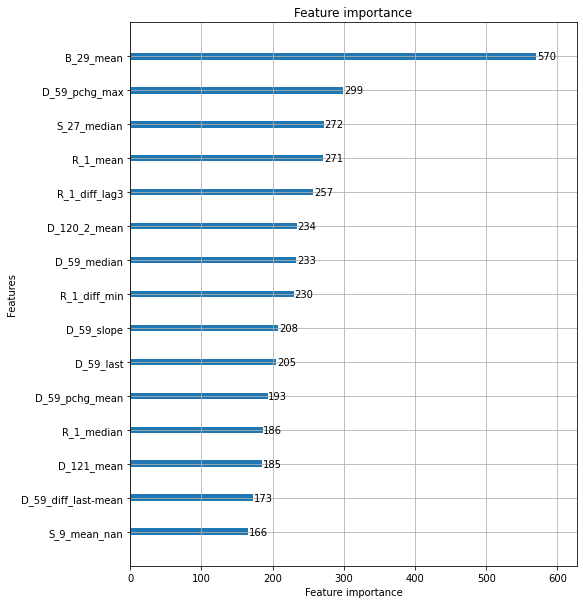

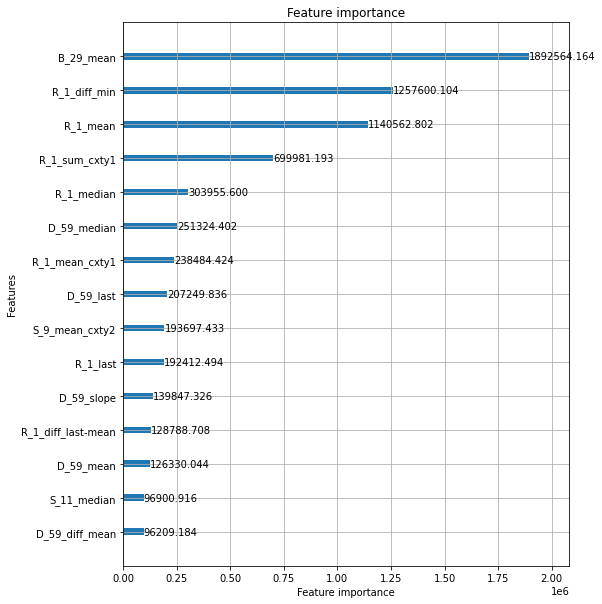

feature to remove: B_29_mean
Elapsed time: 5.966650334993998 min.
----------------------------------------------------------------------------------------------------
ITER: 5/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999811
[100]	valid_0's auc: 0.999925
[150]	valid_0's auc: 0.999961
[200]	valid_0's auc: 0.999977
[250]	valid_0's auc: 0.999985
[300]	valid_0's auc: 0.999988
[350]	valid_0's auc: 0.999991
[400]	valid_0's auc: 0.999992
[450]	valid_0's auc: 0.999993
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999994
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999995
[700]	valid_0's auc: 0.999995
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[882]	valid_0's auc: 0.999995


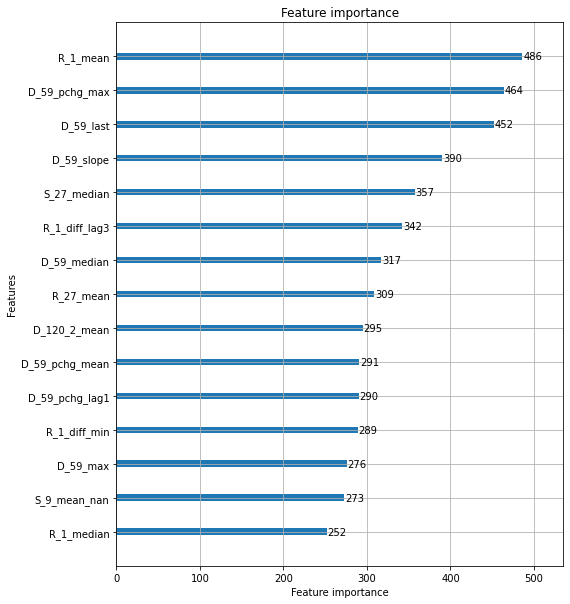

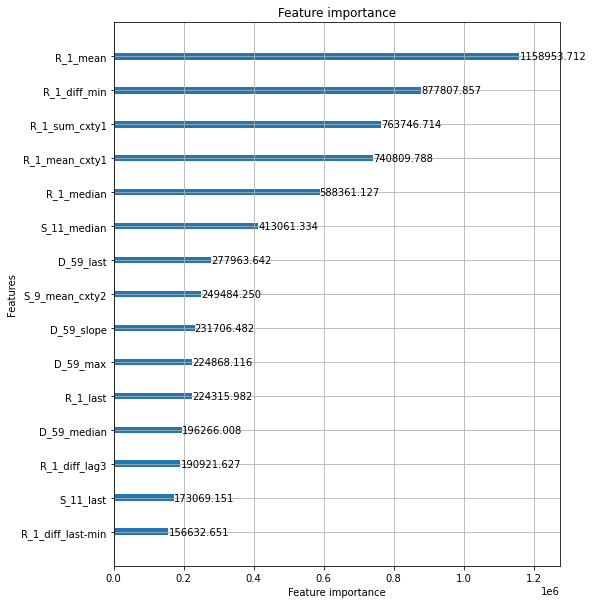

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999818
[100]	valid_0's auc: 0.99993
[150]	valid_0's auc: 0.999966
[200]	valid_0's auc: 0.999981
[250]	valid_0's auc: 0.999987
[300]	valid_0's auc: 0.99999
[350]	valid_0's auc: 0.999993
[400]	valid_0's auc: 0.999994
[450]	valid_0's auc: 0.999995
[500]	valid_0's auc: 0.999995
[550]	valid_0's auc: 0.999996
[600]	valid_0's auc: 0.999996
[650]	valid_0's auc: 0.999996
[700]	valid_0's auc: 0.999996
[750]	valid_0's auc: 0.999996
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[869]	valid_0's auc: 0.999996


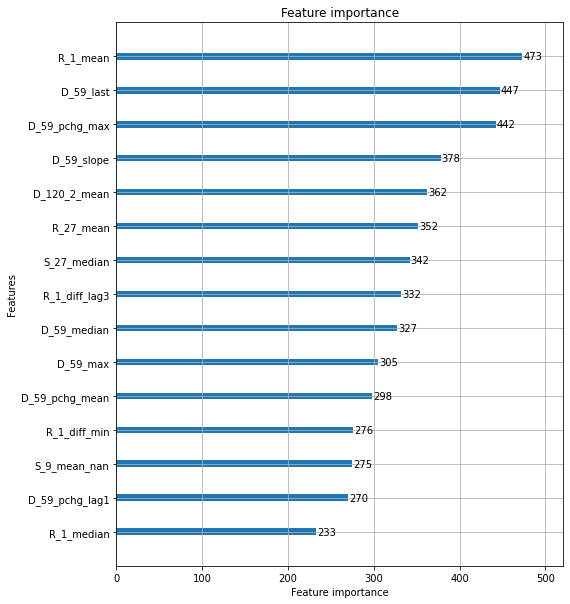

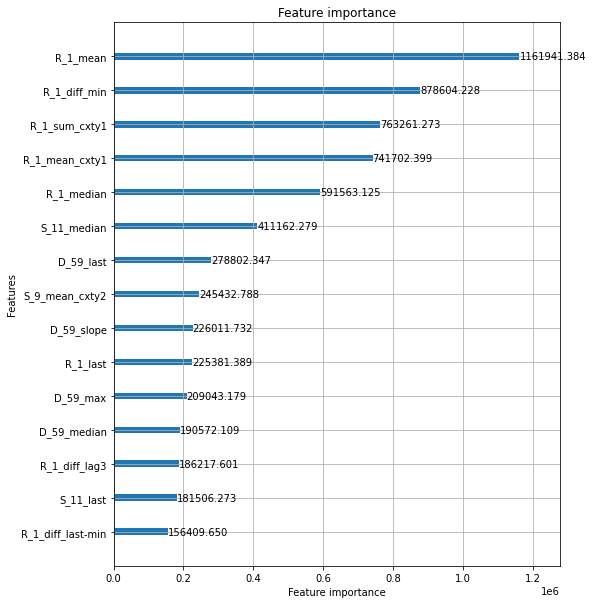

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999818
[100]	valid_0's auc: 0.999921
[150]	valid_0's auc: 0.999958
[200]	valid_0's auc: 0.999976
[250]	valid_0's auc: 0.999983
[300]	valid_0's auc: 0.999987
[350]	valid_0's auc: 0.99999
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999994
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999995
[700]	valid_0's auc: 0.999995
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[841]	valid_0's auc: 0.999995


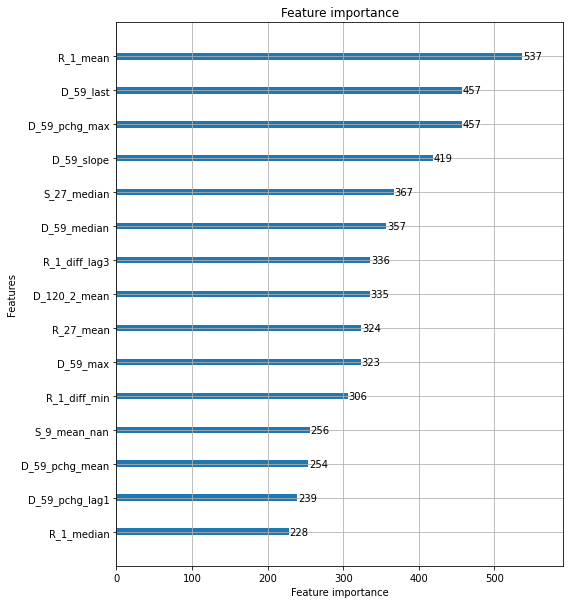

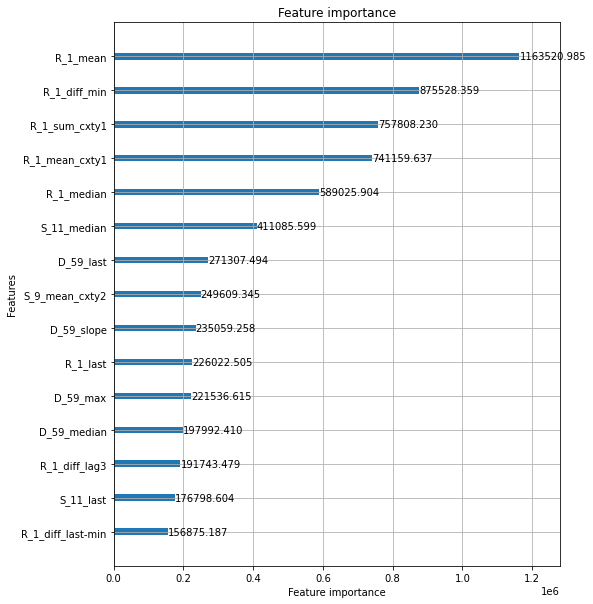

feature to remove: R_1_mean
Elapsed time: 6.8301868836085005 min.
----------------------------------------------------------------------------------------------------
ITER: 6/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999775
[100]	valid_0's auc: 0.999908
[150]	valid_0's auc: 0.999953
[200]	valid_0's auc: 0.999973
[250]	valid_0's auc: 0.999982
[300]	valid_0's auc: 0.999987
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999994
[800]	valid_0's auc: 0.999994
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[871]	valid_0's auc: 0.999995


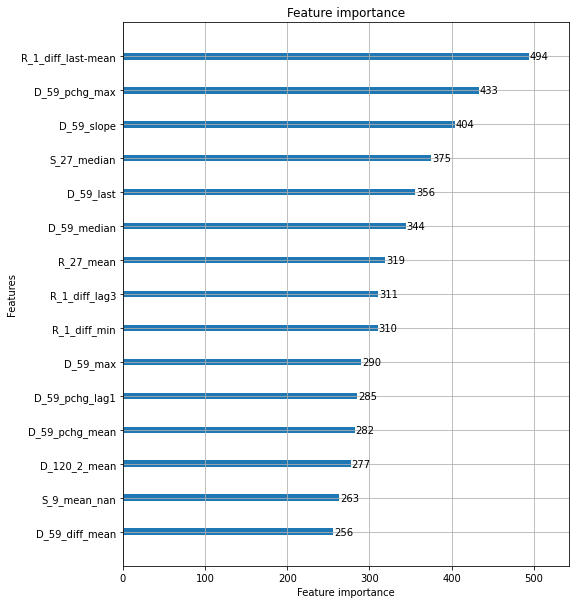

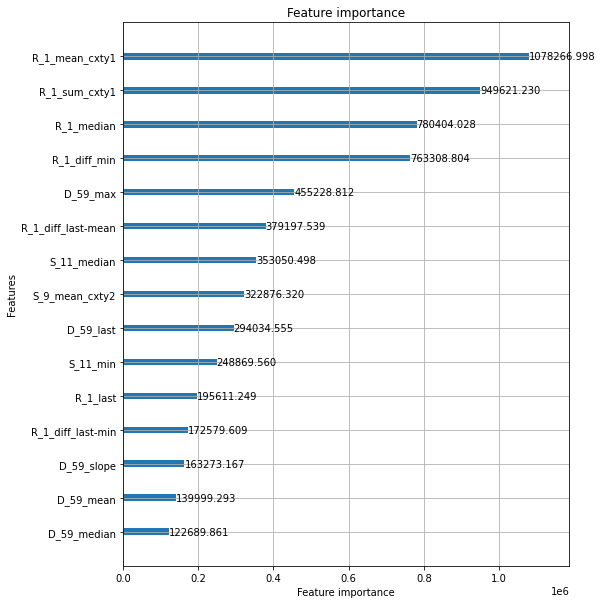

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.9998
[100]	valid_0's auc: 0.999924
[150]	valid_0's auc: 0.999962
[200]	valid_0's auc: 0.999978
[250]	valid_0's auc: 0.999986
[300]	valid_0's auc: 0.99999
[350]	valid_0's auc: 0.999992
[400]	valid_0's auc: 0.999994
[450]	valid_0's auc: 0.999995
[500]	valid_0's auc: 0.999995
[550]	valid_0's auc: 0.999995
[600]	valid_0's auc: 0.999996
[650]	valid_0's auc: 0.999996
[700]	valid_0's auc: 0.999996
[750]	valid_0's auc: 0.999996
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[850]	valid_0's auc: 0.999996


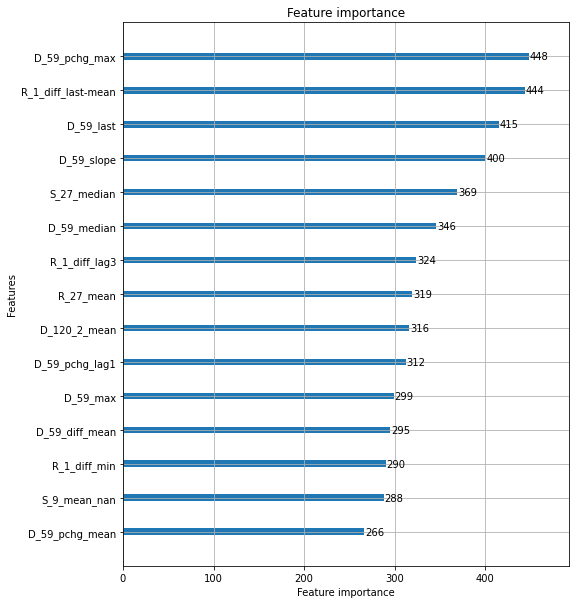

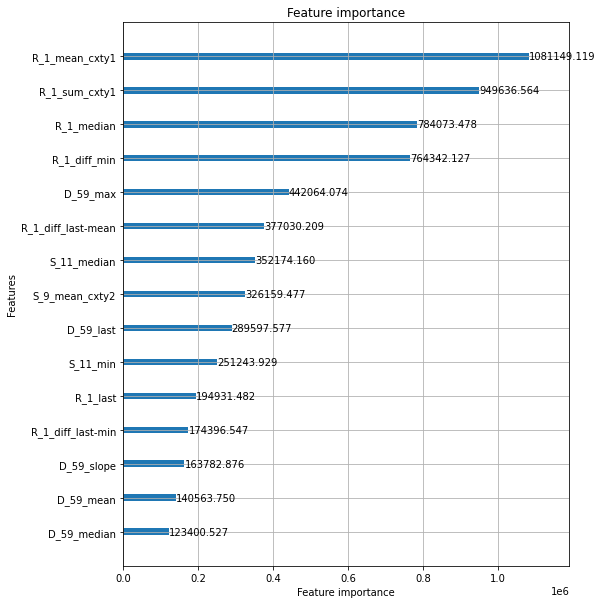

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999792
[100]	valid_0's auc: 0.999912
[150]	valid_0's auc: 0.999953
[200]	valid_0's auc: 0.999971
[250]	valid_0's auc: 0.999981
[300]	valid_0's auc: 0.999986
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999994
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[882]	valid_0's auc: 0.999995


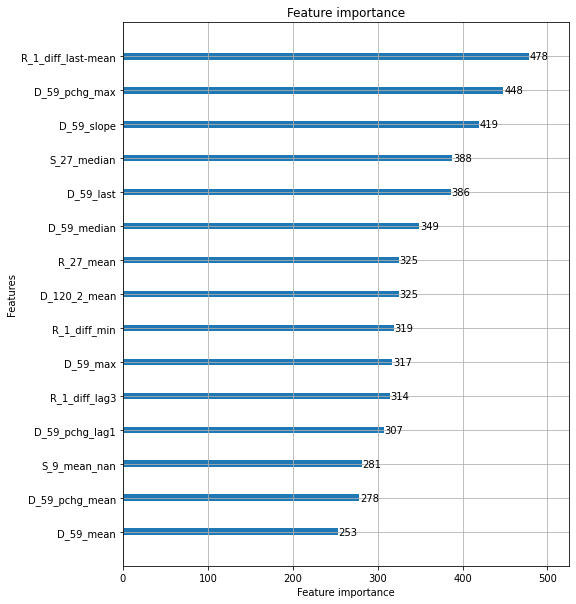

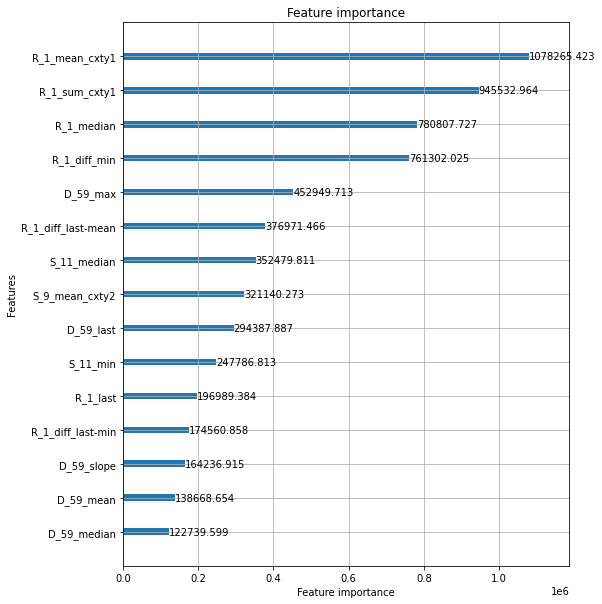

feature to remove: R_1_mean_cxty1
Elapsed time: 6.87870512008667 min.
----------------------------------------------------------------------------------------------------
ITER: 7/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999817
[100]	valid_0's auc: 0.999921
[150]	valid_0's auc: 0.999959
[200]	valid_0's auc: 0.999977
[250]	valid_0's auc: 0.999984
[300]	valid_0's auc: 0.999988
[350]	valid_0's auc: 0.99999
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[871]	valid_0's auc: 0.999995


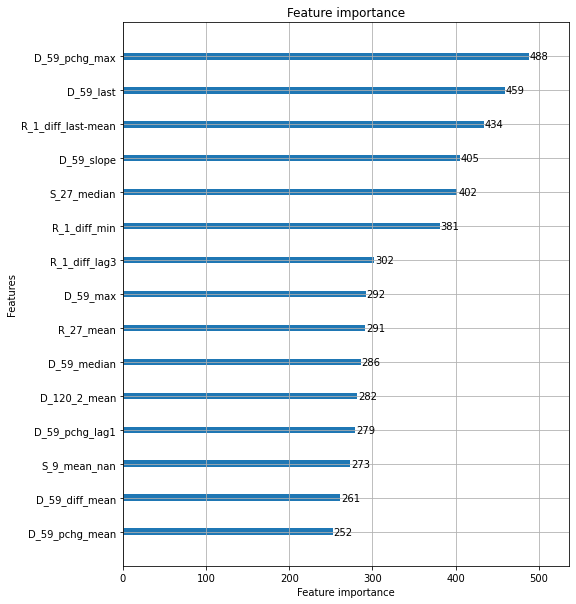

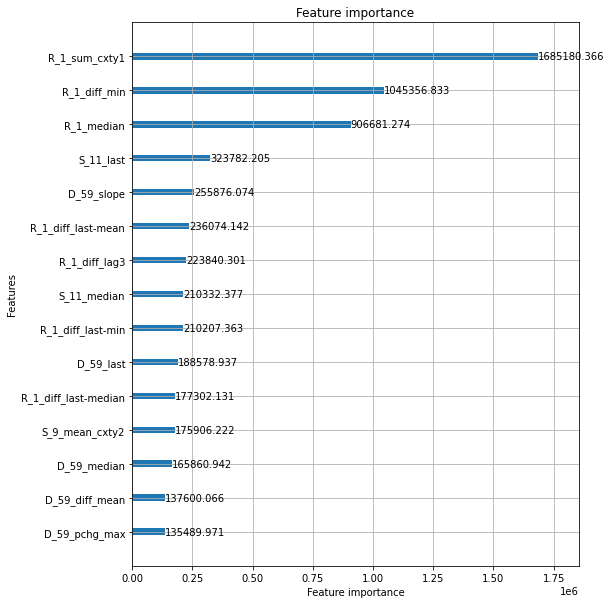

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999829
[100]	valid_0's auc: 0.99993
[150]	valid_0's auc: 0.999965
[200]	valid_0's auc: 0.99998
[250]	valid_0's auc: 0.999986
[300]	valid_0's auc: 0.99999
[350]	valid_0's auc: 0.999992
[400]	valid_0's auc: 0.999994
[450]	valid_0's auc: 0.999994
[500]	valid_0's auc: 0.999995
[550]	valid_0's auc: 0.999995
[600]	valid_0's auc: 0.999996
[650]	valid_0's auc: 0.999996
[700]	valid_0's auc: 0.999996
[750]	valid_0's auc: 0.999996
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
[1000]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[900]	valid_0's auc: 0.999996


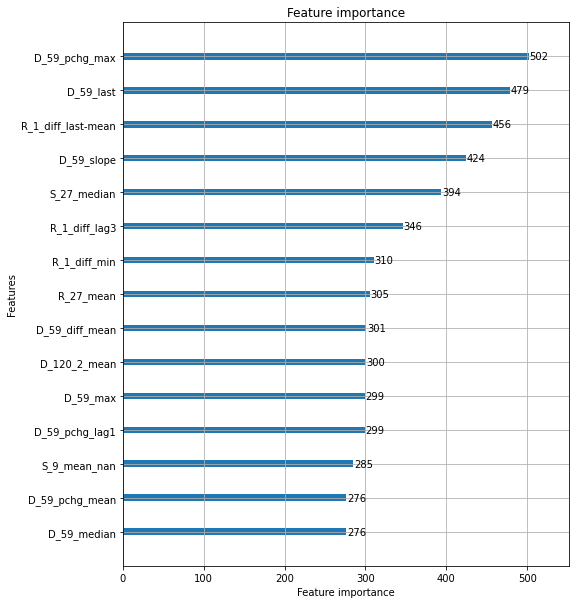

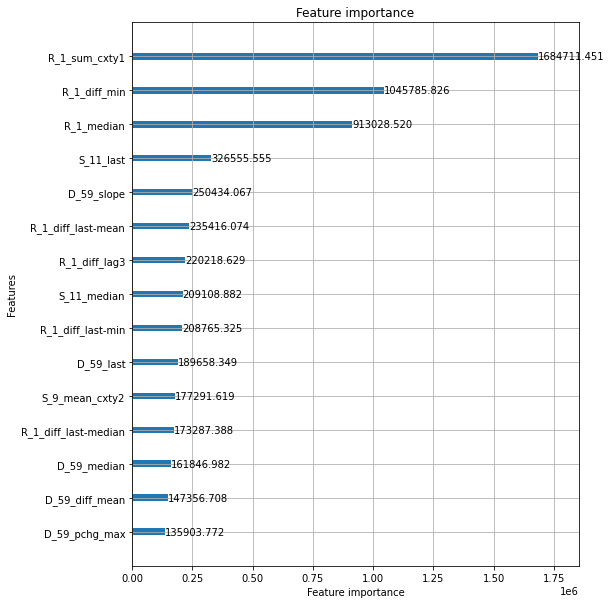

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999819
[100]	valid_0's auc: 0.999918
[150]	valid_0's auc: 0.999957
[200]	valid_0's auc: 0.999974
[250]	valid_0's auc: 0.999982
[300]	valid_0's auc: 0.999987
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[871]	valid_0's auc: 0.999995


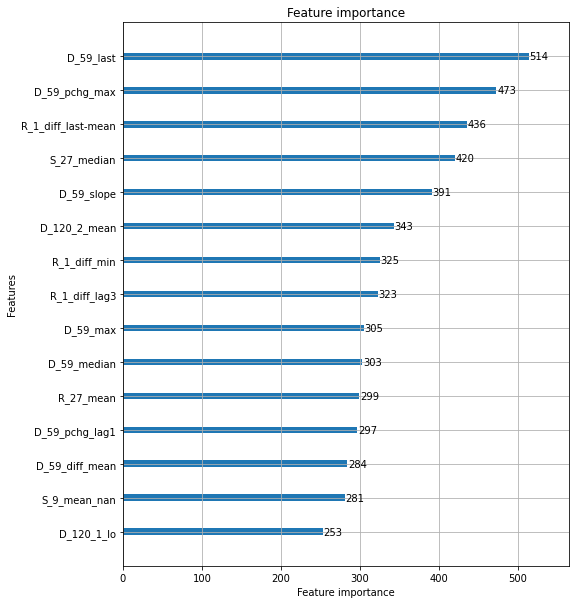

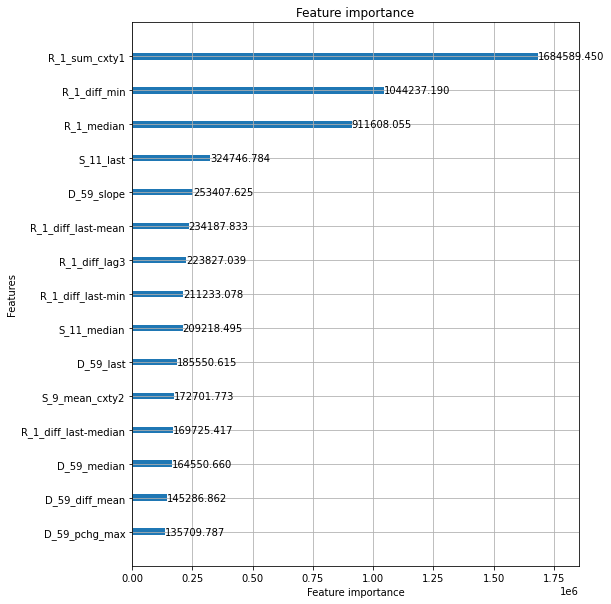

feature to remove: R_1_sum_cxty1
Elapsed time: 6.874418596426646 min.
----------------------------------------------------------------------------------------------------
ITER: 8/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999779
[100]	valid_0's auc: 0.999912
[150]	valid_0's auc: 0.999958
[200]	valid_0's auc: 0.999977
[250]	valid_0's auc: 0.999984
[300]	valid_0's auc: 0.999989
[350]	valid_0's auc: 0.999991
[400]	valid_0's auc: 0.999993
[450]	valid_0's auc: 0.999994
[500]	valid_0's auc: 0.999994
[550]	valid_0's auc: 0.999995
[600]	valid_0's auc: 0.999995
[650]	valid_0's auc: 0.999995
[700]	valid_0's auc: 0.999995
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[854]	valid_0's auc: 0.999995


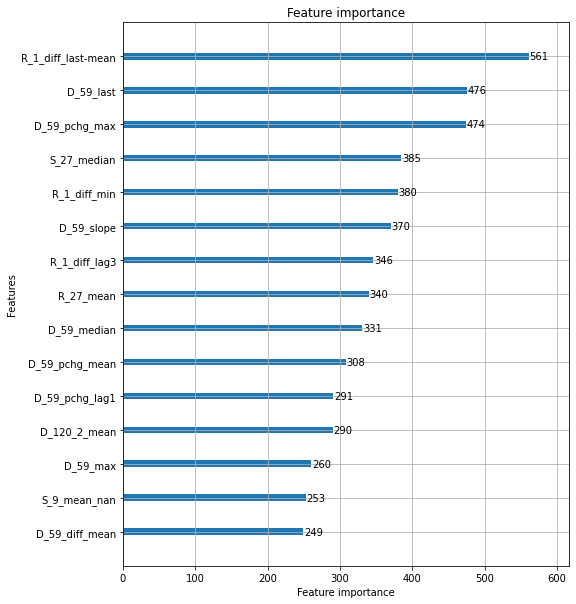

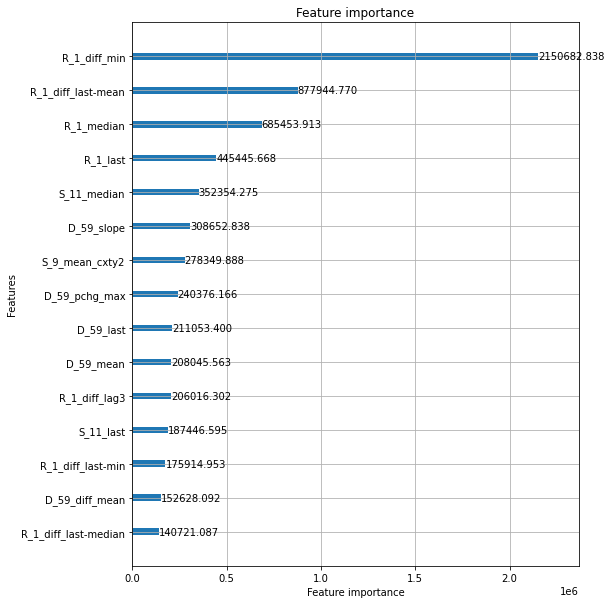

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999801
[100]	valid_0's auc: 0.999922
[150]	valid_0's auc: 0.999963
[200]	valid_0's auc: 0.99998
[250]	valid_0's auc: 0.999986
[300]	valid_0's auc: 0.99999
[350]	valid_0's auc: 0.999992
[400]	valid_0's auc: 0.999993
[450]	valid_0's auc: 0.999994
[500]	valid_0's auc: 0.999995
[550]	valid_0's auc: 0.999995
[600]	valid_0's auc: 0.999996
[650]	valid_0's auc: 0.999996
[700]	valid_0's auc: 0.999996
[750]	valid_0's auc: 0.999996
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[868]	valid_0's auc: 0.999996


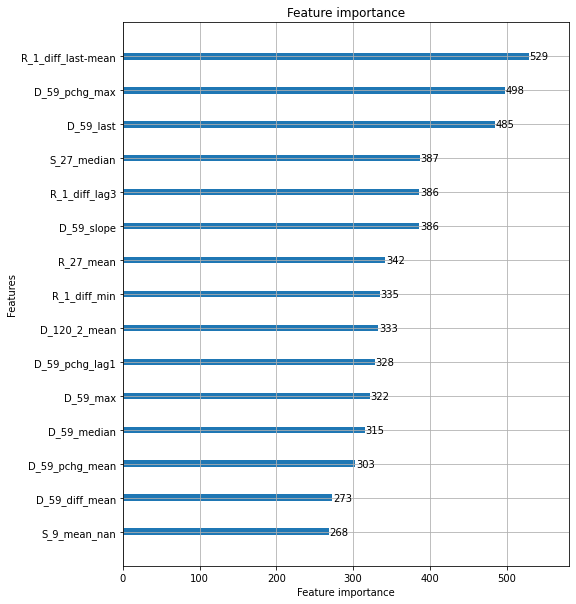

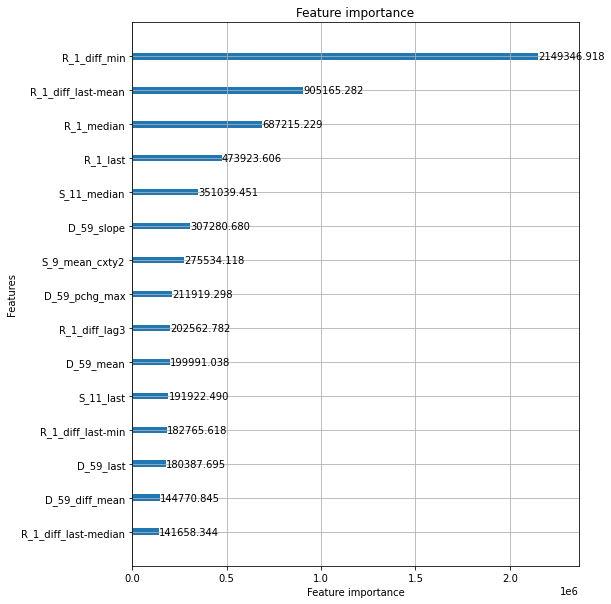

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999779
[100]	valid_0's auc: 0.999911
[150]	valid_0's auc: 0.999954
[200]	valid_0's auc: 0.999974
[250]	valid_0's auc: 0.999982
[300]	valid_0's auc: 0.999987
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[896]	valid_0's auc: 0.999995


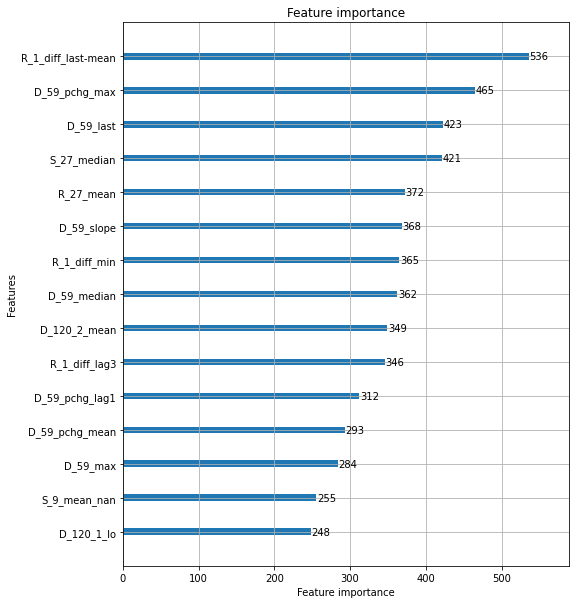

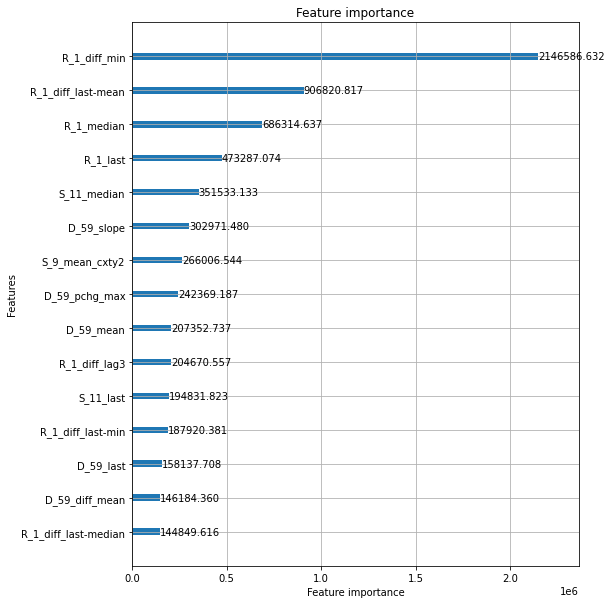

feature to remove: R_1_diff_min
Elapsed time: 6.9112783392270405 min.
----------------------------------------------------------------------------------------------------
ITER: 9/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999634
[100]	valid_0's auc: 0.999879
[150]	valid_0's auc: 0.999952
[200]	valid_0's auc: 0.999974
[250]	valid_0's auc: 0.999982
[300]	valid_0's auc: 0.999987
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[885]	valid_0's auc: 0.999995


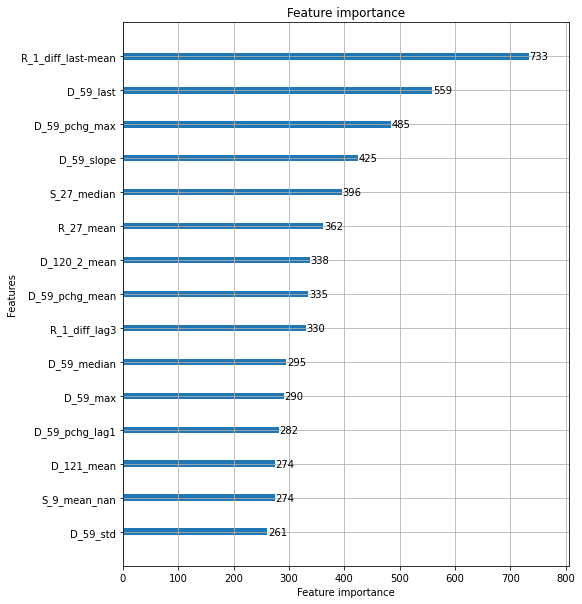

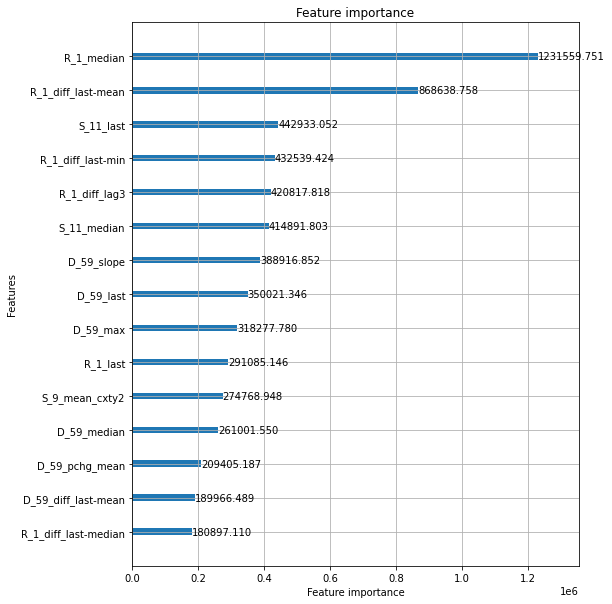

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999654
[100]	valid_0's auc: 0.999888
[150]	valid_0's auc: 0.999953
[200]	valid_0's auc: 0.999975
[250]	valid_0's auc: 0.999983
[300]	valid_0's auc: 0.999988
[350]	valid_0's auc: 0.999991
[400]	valid_0's auc: 0.999992
[450]	valid_0's auc: 0.999993
[500]	valid_0's auc: 0.999994
[550]	valid_0's auc: 0.999994
[600]	valid_0's auc: 0.999995
[650]	valid_0's auc: 0.999995
[700]	valid_0's auc: 0.999995
[750]	valid_0's auc: 0.999996
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
[1000]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[921]	valid_0's auc: 0.999996


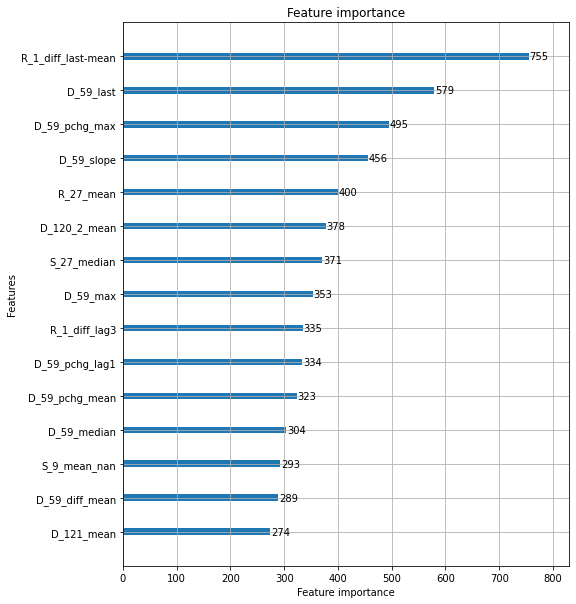

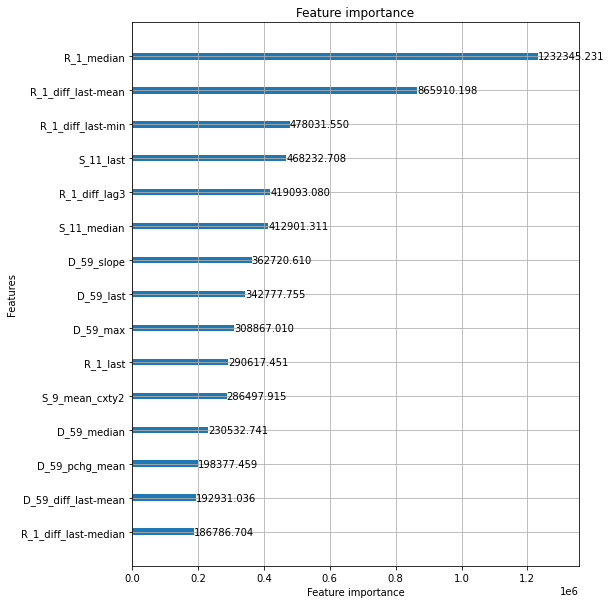

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999645
[100]	valid_0's auc: 0.999878
[150]	valid_0's auc: 0.999949
[200]	valid_0's auc: 0.999972
[250]	valid_0's auc: 0.99998
[300]	valid_0's auc: 0.999985
[350]	valid_0's auc: 0.999988
[400]	valid_0's auc: 0.99999
[450]	valid_0's auc: 0.999991
[500]	valid_0's auc: 0.999992
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999993
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999994
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
[1000]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[939]	valid_0's auc: 0.999995


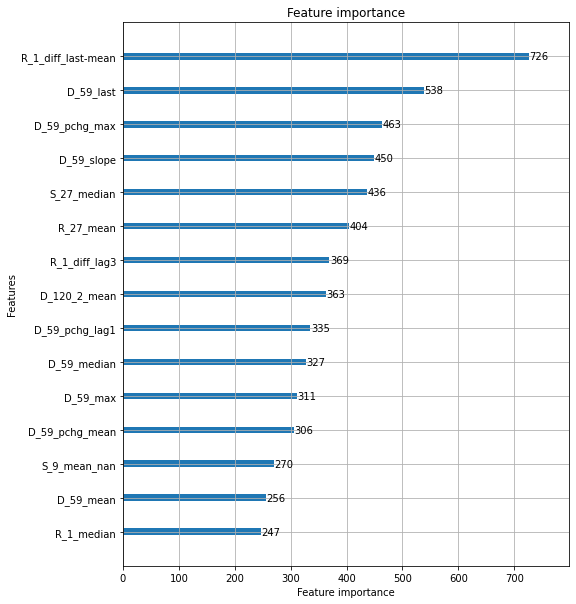

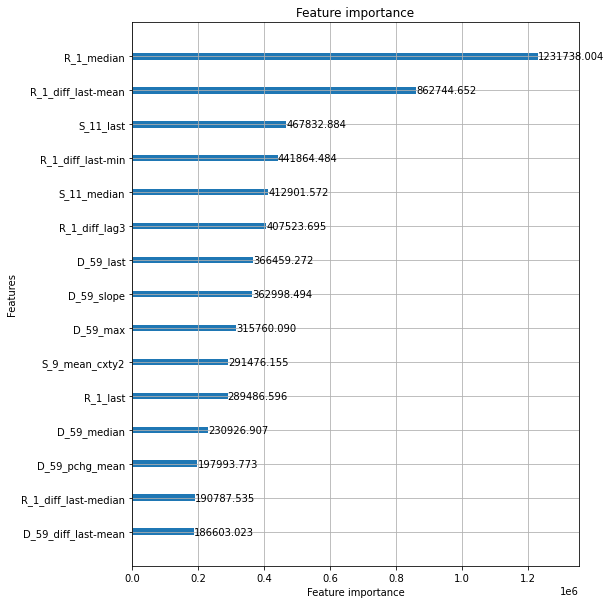

feature to remove: R_1_median
Elapsed time: 7.191219067573547 min.
----------------------------------------------------------------------------------------------------
ITER: 10/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999578
[100]	valid_0's auc: 0.999858
[150]	valid_0's auc: 0.999939
[200]	valid_0's auc: 0.999969
[250]	valid_0's auc: 0.99998
[300]	valid_0's auc: 0.999985
[350]	valid_0's auc: 0.999988
[400]	valid_0's auc: 0.999991
[450]	valid_0's auc: 0.999992
[500]	valid_0's auc: 0.999993
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
[1000]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[933]	valid_0's auc: 0.999995


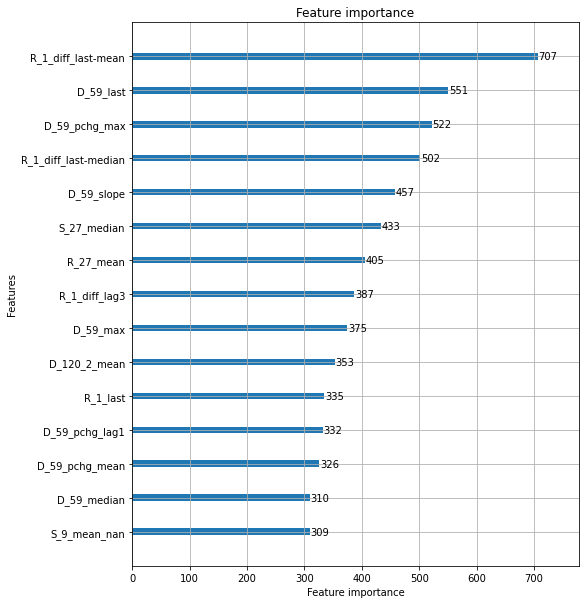

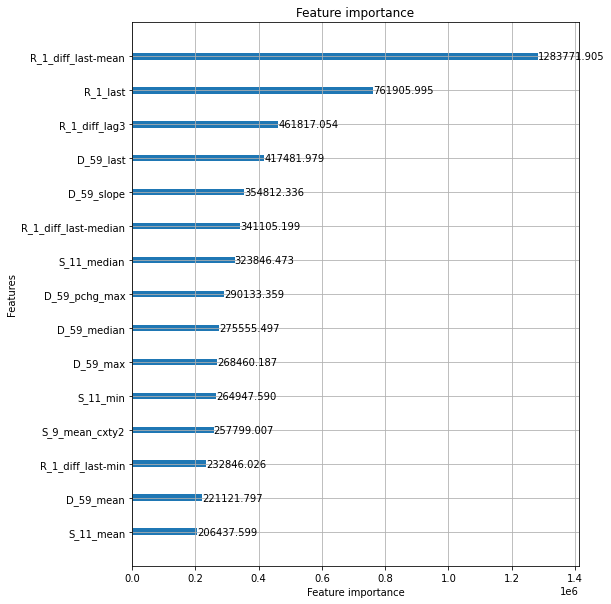

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999613
[100]	valid_0's auc: 0.999871
[150]	valid_0's auc: 0.999944
[200]	valid_0's auc: 0.99997
[250]	valid_0's auc: 0.999981
[300]	valid_0's auc: 0.999986
[350]	valid_0's auc: 0.999989
[400]	valid_0's auc: 0.999992
[450]	valid_0's auc: 0.999993
[500]	valid_0's auc: 0.999994
[550]	valid_0's auc: 0.999994
[600]	valid_0's auc: 0.999995
[650]	valid_0's auc: 0.999995
[700]	valid_0's auc: 0.999995
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999996
[850]	valid_0's auc: 0.999996
[900]	valid_0's auc: 0.999996
[950]	valid_0's auc: 0.999996
[1000]	valid_0's auc: 0.999996
[1050]	valid_0's auc: 0.999996
Early stopping, best iteration is:
[994]	valid_0's auc: 0.999996


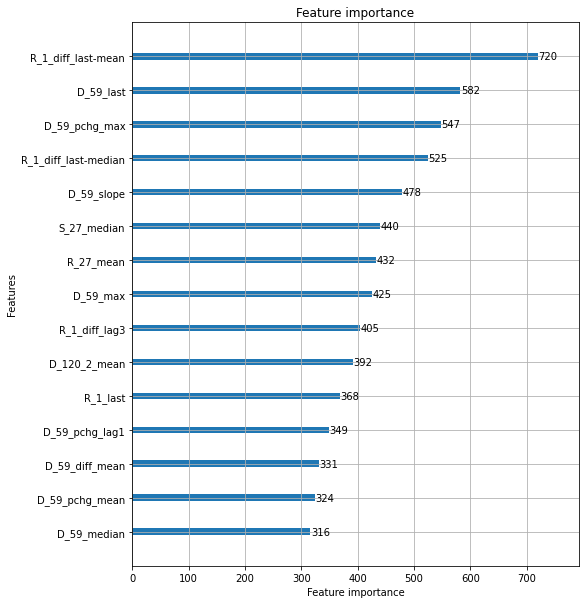

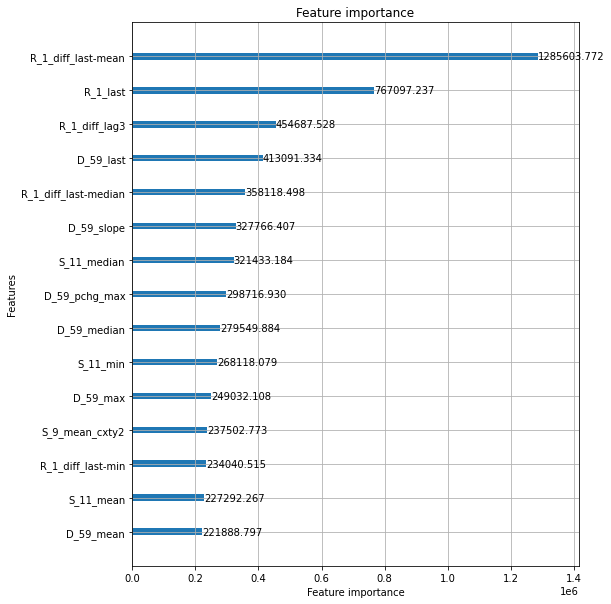

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.999613
[100]	valid_0's auc: 0.999866
[150]	valid_0's auc: 0.999941
[200]	valid_0's auc: 0.999967
[250]	valid_0's auc: 0.999979
[300]	valid_0's auc: 0.999984
[350]	valid_0's auc: 0.999988
[400]	valid_0's auc: 0.99999
[450]	valid_0's auc: 0.999991
[500]	valid_0's auc: 0.999992
[550]	valid_0's auc: 0.999993
[600]	valid_0's auc: 0.999994
[650]	valid_0's auc: 0.999994
[700]	valid_0's auc: 0.999994
[750]	valid_0's auc: 0.999995
[800]	valid_0's auc: 0.999995
[850]	valid_0's auc: 0.999995
[900]	valid_0's auc: 0.999995
[950]	valid_0's auc: 0.999995
[1000]	valid_0's auc: 0.999995
[1050]	valid_0's auc: 0.999995
Early stopping, best iteration is:
[980]	valid_0's auc: 0.999995


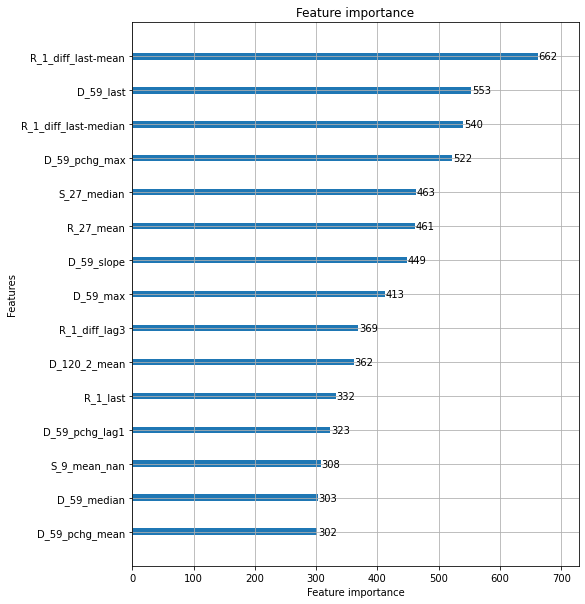

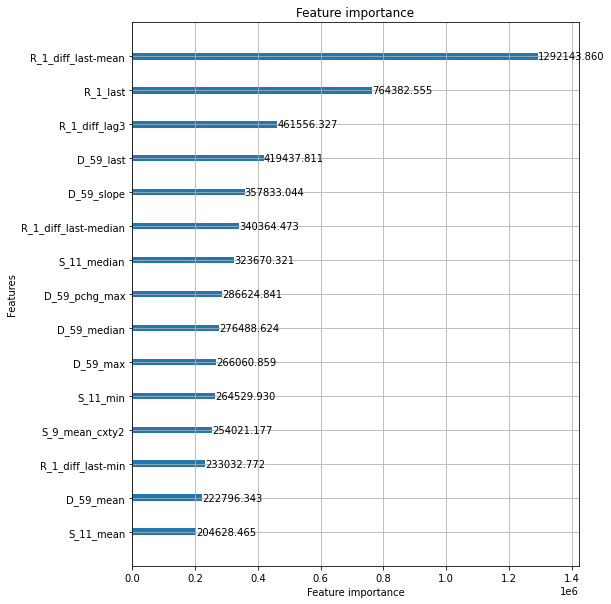

feature to remove: R_1_diff_last-mean
Elapsed time: 7.441663471857707 min.
----------------------------------------------------------------------------------------------------
ITER: 11/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998848
[100]	valid_0's auc: 0.999552
[150]	valid_0's auc: 0.999785
[200]	valid_0's auc: 0.999875
[250]	valid_0's auc: 0.999918
[300]	valid_0's auc: 0.999941
[350]	valid_0's auc: 0.999955
[400]	valid_0's auc: 0.999964
[450]	valid_0's auc: 0.99997
[500]	valid_0's auc: 0.999973
[550]	valid_0's auc: 0.999976
[600]	valid_0's auc: 0.999978
[650]	valid_0's auc: 0.99998
[700]	valid_0's auc: 0.999981
[750]	valid_0's auc: 0.999982
[800]	valid_0's auc: 0.999983
[850]	valid_0's auc: 0.999984
[900]	valid_0's auc: 0.999984
[950]	valid_0's auc: 0.999985
[1000]	valid_0's auc: 0.999985
[1050]	valid_0's auc: 0.999985
[1100]	valid_0's auc: 0.999986
[1150]	valid_0's auc: 0.999986
[1200]	valid_0's auc: 0.999986
[1250]	valid_0's auc: 0.999

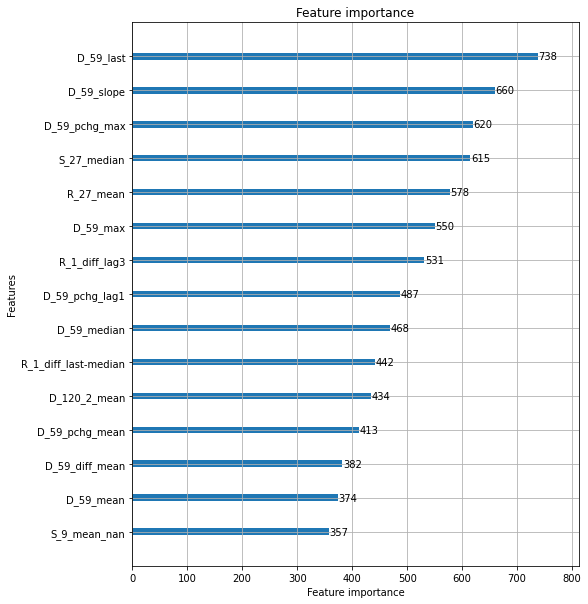

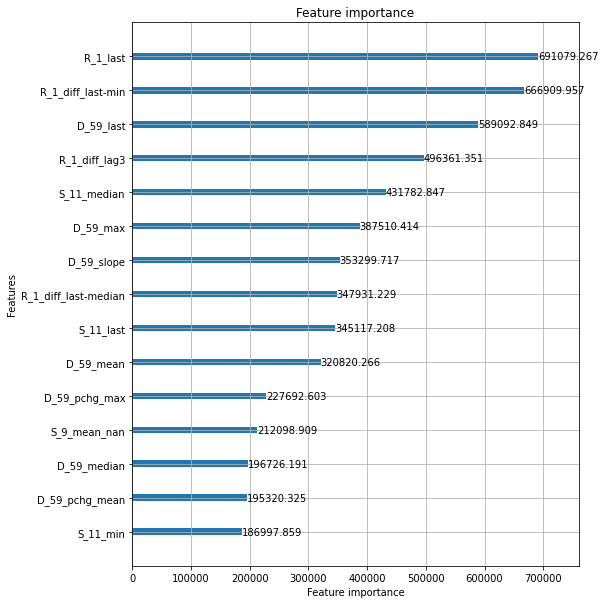

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998913
[100]	valid_0's auc: 0.999566
[150]	valid_0's auc: 0.999783
[200]	valid_0's auc: 0.999872
[250]	valid_0's auc: 0.999914
[300]	valid_0's auc: 0.999937
[350]	valid_0's auc: 0.999952
[400]	valid_0's auc: 0.999961
[450]	valid_0's auc: 0.999967
[500]	valid_0's auc: 0.999971
[550]	valid_0's auc: 0.999974
[600]	valid_0's auc: 0.999976
[650]	valid_0's auc: 0.999978
[700]	valid_0's auc: 0.999979
[750]	valid_0's auc: 0.99998
[800]	valid_0's auc: 0.999981
[850]	valid_0's auc: 0.999982
[900]	valid_0's auc: 0.999982
[950]	valid_0's auc: 0.999983
[1000]	valid_0's auc: 0.999983
[1050]	valid_0's auc: 0.999983
[1100]	valid_0's auc: 0.999983
[1150]	valid_0's auc: 0.999984
[1200]	valid_0's auc: 0.999984
[1250]	valid_0's auc: 0.999984
[1300]	valid_0's auc: 0.999984
Early stopping, best iteration is:
[1225]	valid_0's auc: 0.999984


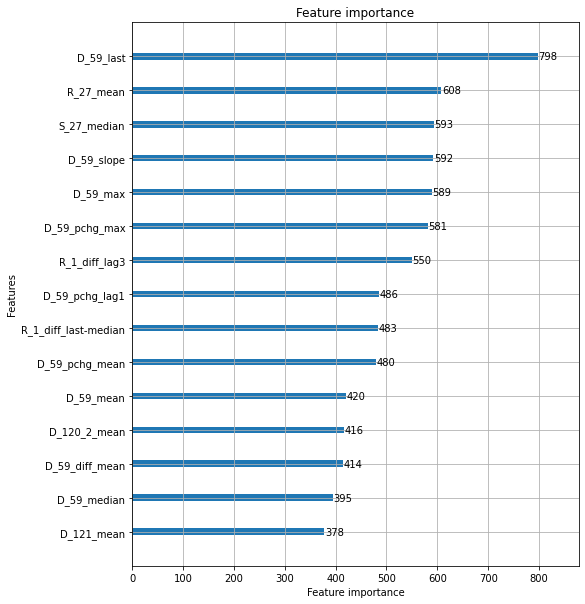

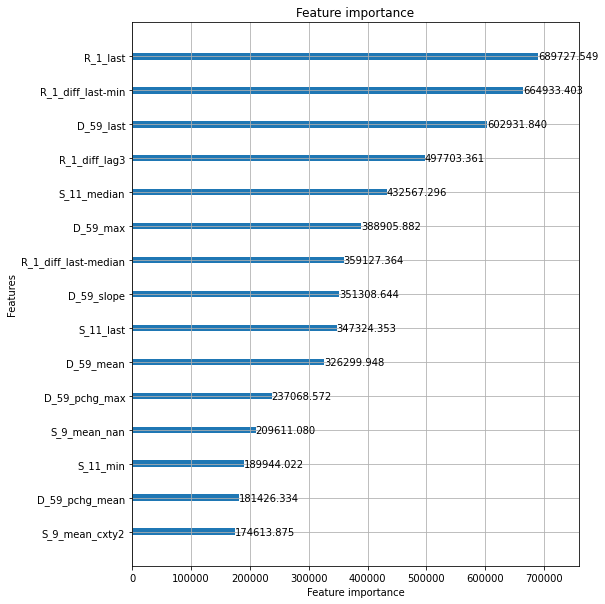

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998918
[100]	valid_0's auc: 0.999567
[150]	valid_0's auc: 0.999781
[200]	valid_0's auc: 0.999874
[250]	valid_0's auc: 0.999915
[300]	valid_0's auc: 0.99994
[350]	valid_0's auc: 0.999953
[400]	valid_0's auc: 0.999963
[450]	valid_0's auc: 0.99997
[500]	valid_0's auc: 0.999973
[550]	valid_0's auc: 0.999976
[600]	valid_0's auc: 0.999978
[650]	valid_0's auc: 0.99998
[700]	valid_0's auc: 0.999981
[750]	valid_0's auc: 0.999982
[800]	valid_0's auc: 0.999983
[850]	valid_0's auc: 0.999984
[900]	valid_0's auc: 0.999984
[950]	valid_0's auc: 0.999985
[1000]	valid_0's auc: 0.999985
[1050]	valid_0's auc: 0.999985
[1100]	valid_0's auc: 0.999985
[1150]	valid_0's auc: 0.999986
[1200]	valid_0's auc: 0.999986
[1250]	valid_0's auc: 0.999986
[1300]	valid_0's auc: 0.999986
Early stopping, best iteration is:
[1217]	valid_0's auc: 0.999986


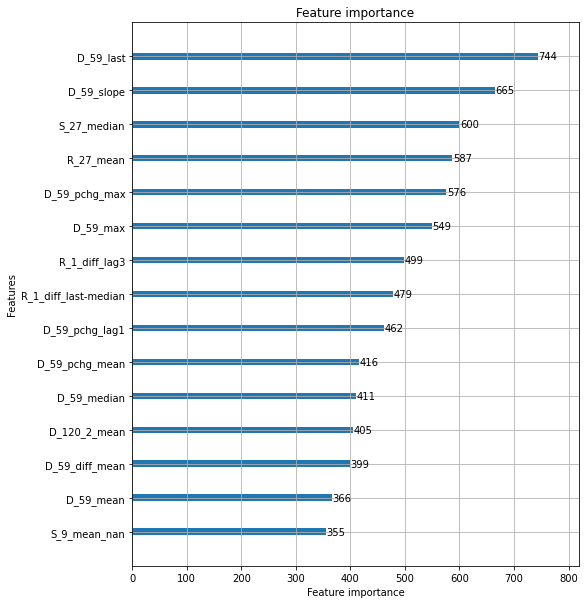

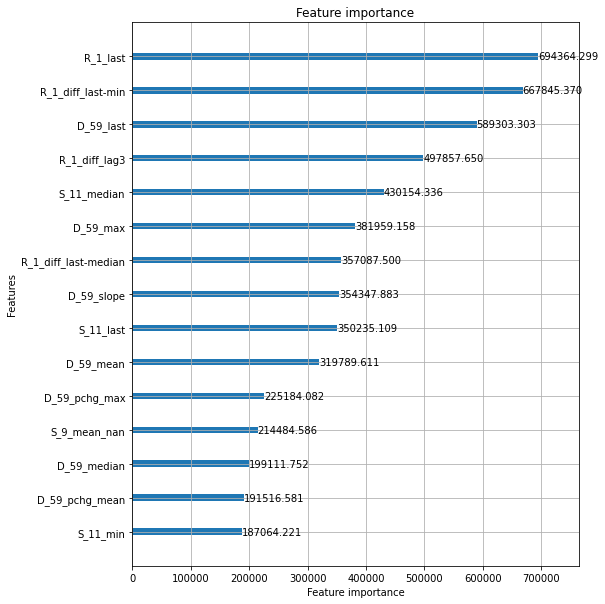

feature to remove: R_1_last
Elapsed time: 8.784952040513357 min.
----------------------------------------------------------------------------------------------------
ITER: 12/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998872
[100]	valid_0's auc: 0.99957
[150]	valid_0's auc: 0.999797
[200]	valid_0's auc: 0.99988
[250]	valid_0's auc: 0.99992
[300]	valid_0's auc: 0.999942
[350]	valid_0's auc: 0.999955
[400]	valid_0's auc: 0.999965
[450]	valid_0's auc: 0.99997
[500]	valid_0's auc: 0.999974
[550]	valid_0's auc: 0.999976
[600]	valid_0's auc: 0.999979
[650]	valid_0's auc: 0.99998
[700]	valid_0's auc: 0.999982
[750]	valid_0's auc: 0.999982
[800]	valid_0's auc: 0.999983
[850]	valid_0's auc: 0.999984
[900]	valid_0's auc: 0.999984
[950]	valid_0's auc: 0.999985
[1000]	valid_0's auc: 0.999985
[1050]	valid_0's auc: 0.999986
[1100]	valid_0's auc: 0.999986
[1150]	valid_0's auc: 0.999986
[1200]	valid_0's auc: 0.999986
[1250]	valid_0's auc: 0.999986
[1300]	va

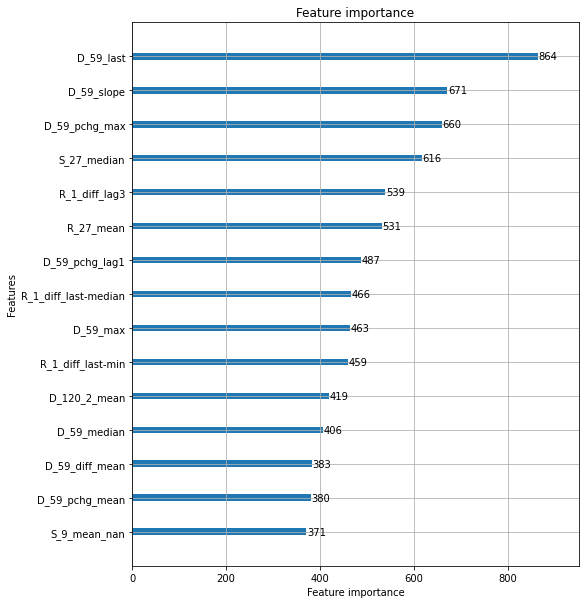

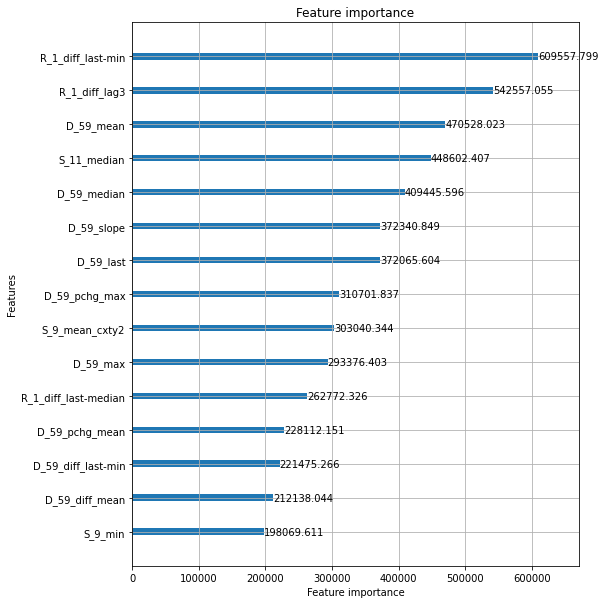

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998926
[100]	valid_0's auc: 0.999587
[150]	valid_0's auc: 0.999795
[200]	valid_0's auc: 0.999874
[250]	valid_0's auc: 0.999914
[300]	valid_0's auc: 0.999938
[350]	valid_0's auc: 0.999951
[400]	valid_0's auc: 0.99996
[450]	valid_0's auc: 0.999966
[500]	valid_0's auc: 0.99997
[550]	valid_0's auc: 0.999973
[600]	valid_0's auc: 0.999975
[650]	valid_0's auc: 0.999977
[700]	valid_0's auc: 0.999978
[750]	valid_0's auc: 0.99998
[800]	valid_0's auc: 0.999981
[850]	valid_0's auc: 0.999981
[900]	valid_0's auc: 0.999982
[950]	valid_0's auc: 0.999982
[1000]	valid_0's auc: 0.999983
[1050]	valid_0's auc: 0.999983
[1100]	valid_0's auc: 0.999983
[1150]	valid_0's auc: 0.999983
[1200]	valid_0's auc: 0.999983
[1250]	valid_0's auc: 0.999983
[1300]	valid_0's auc: 0.999983
[1350]	valid_0's auc: 0.999983
Early stopping, best iteration is:
[1270]	valid_0's auc: 0.999983


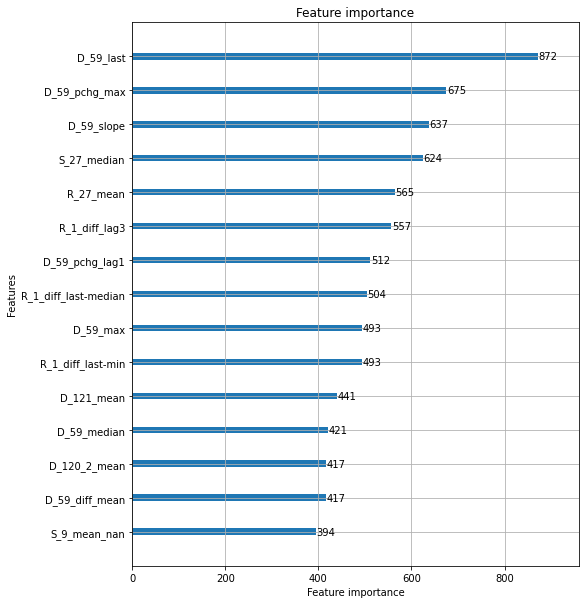

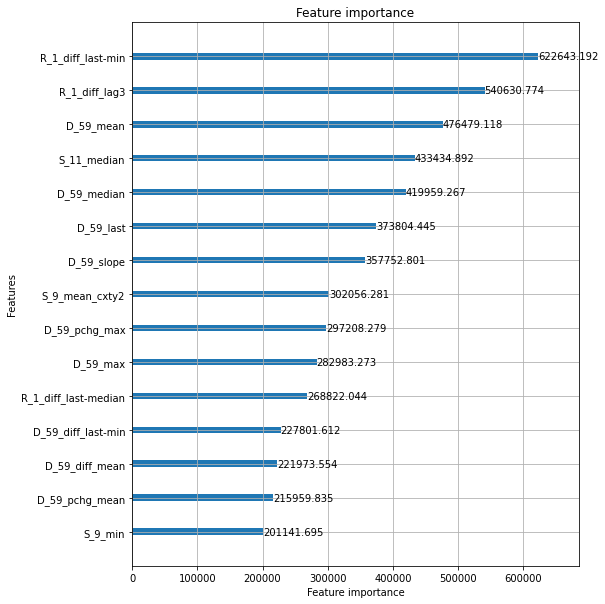

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998955
[100]	valid_0's auc: 0.999585
[150]	valid_0's auc: 0.999798
[200]	valid_0's auc: 0.999877
[250]	valid_0's auc: 0.999918
[300]	valid_0's auc: 0.999939
[350]	valid_0's auc: 0.999953
[400]	valid_0's auc: 0.999963
[450]	valid_0's auc: 0.999969
[500]	valid_0's auc: 0.999974
[550]	valid_0's auc: 0.999976
[600]	valid_0's auc: 0.999978
[650]	valid_0's auc: 0.99998
[700]	valid_0's auc: 0.999981
[750]	valid_0's auc: 0.999982
[800]	valid_0's auc: 0.999983
[850]	valid_0's auc: 0.999983
[900]	valid_0's auc: 0.999984
[950]	valid_0's auc: 0.999985
[1000]	valid_0's auc: 0.999985
[1050]	valid_0's auc: 0.999985
[1100]	valid_0's auc: 0.999986
[1150]	valid_0's auc: 0.999986
[1200]	valid_0's auc: 0.999986
[1250]	valid_0's auc: 0.999986
[1300]	valid_0's auc: 0.999986
Early stopping, best iteration is:
[1247]	valid_0's auc: 0.999986


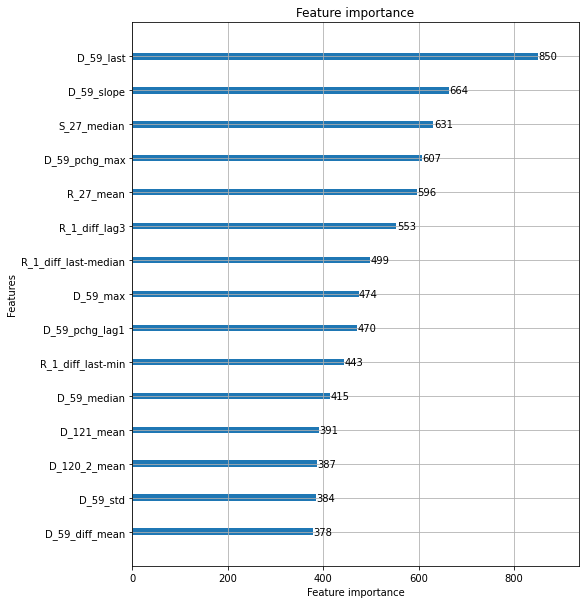

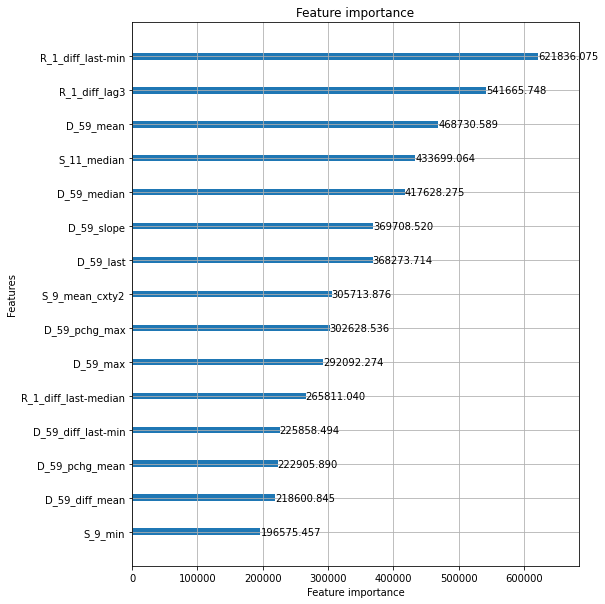

feature to remove: R_1_diff_last-min
Elapsed time: 8.889295729001363 min.
----------------------------------------------------------------------------------------------------
ITER: 13/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998351
[100]	valid_0's auc: 0.999355
[150]	valid_0's auc: 0.999667
[200]	valid_0's auc: 0.999803
[250]	valid_0's auc: 0.999867
[300]	valid_0's auc: 0.999909
[350]	valid_0's auc: 0.999931
[400]	valid_0's auc: 0.999946
[450]	valid_0's auc: 0.999955
[500]	valid_0's auc: 0.99996
[550]	valid_0's auc: 0.999965
[600]	valid_0's auc: 0.999967
[650]	valid_0's auc: 0.99997
[700]	valid_0's auc: 0.999972
[750]	valid_0's auc: 0.999973
[800]	valid_0's auc: 0.999975
[850]	valid_0's auc: 0.999976
[900]	valid_0's auc: 0.999977
[950]	valid_0's auc: 0.999978
[1000]	valid_0's auc: 0.999978
[1050]	valid_0's auc: 0.999979
[1100]	valid_0's auc: 0.999979
[1150]	valid_0's auc: 0.999979
[1200]	valid_0's auc: 0.99998
[1250]	valid_0's auc: 0.99998

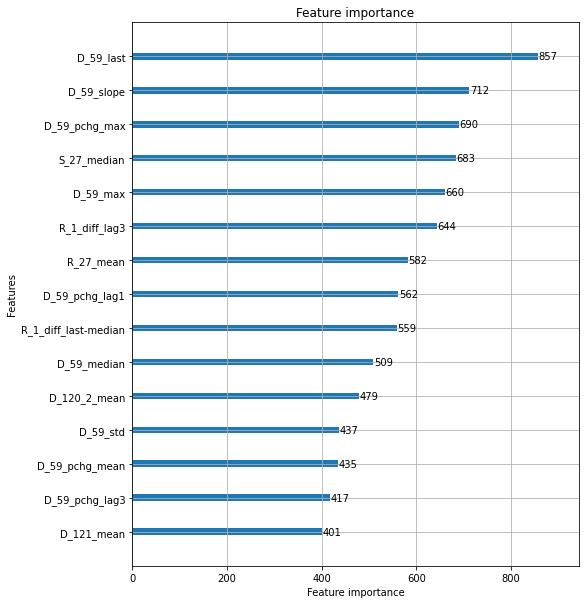

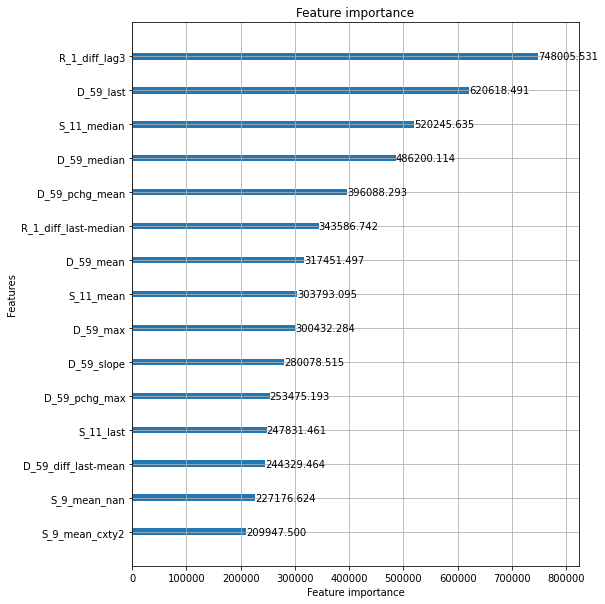

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998388
[100]	valid_0's auc: 0.999371
[150]	valid_0's auc: 0.999674
[200]	valid_0's auc: 0.999797
[250]	valid_0's auc: 0.999861
[300]	valid_0's auc: 0.9999
[350]	valid_0's auc: 0.999922
[400]	valid_0's auc: 0.999938
[450]	valid_0's auc: 0.999946
[500]	valid_0's auc: 0.999952
[550]	valid_0's auc: 0.999957
[600]	valid_0's auc: 0.999961
[650]	valid_0's auc: 0.999964
[700]	valid_0's auc: 0.999966
[750]	valid_0's auc: 0.999968
[800]	valid_0's auc: 0.999969
[850]	valid_0's auc: 0.999971
[900]	valid_0's auc: 0.999972
[950]	valid_0's auc: 0.999973
[1000]	valid_0's auc: 0.999974
[1050]	valid_0's auc: 0.999974
[1100]	valid_0's auc: 0.999975
[1150]	valid_0's auc: 0.999975
[1200]	valid_0's auc: 0.999975
[1250]	valid_0's auc: 0.999976
[1300]	valid_0's auc: 0.999976
[1350]	valid_0's auc: 0.999976
[1400]	valid_0's auc: 0.999976
[1450]	valid_0's auc: 0.999976
Early stopping, best iteration is:
[1394]	valid_0's auc: 0.99

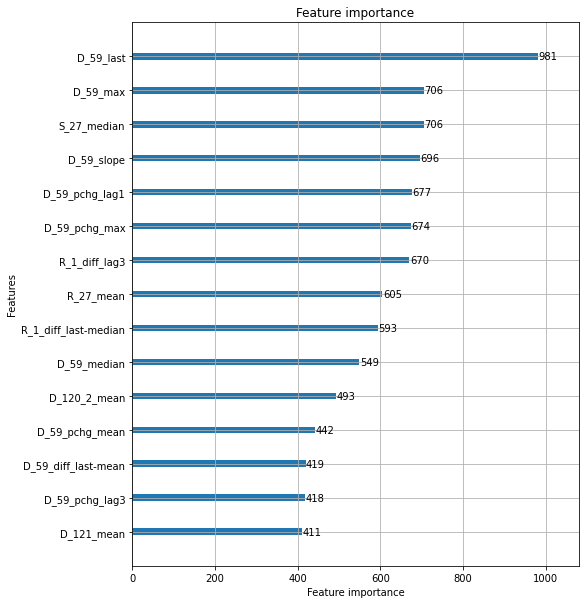

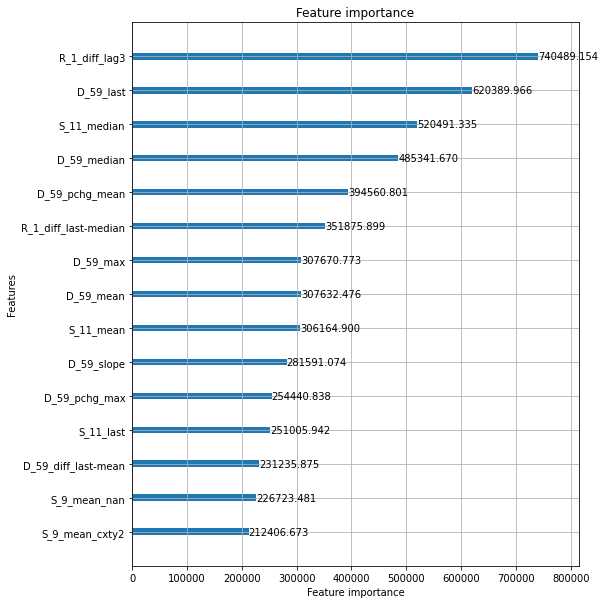

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.998455
[100]	valid_0's auc: 0.999411
[150]	valid_0's auc: 0.999687
[200]	valid_0's auc: 0.999811
[250]	valid_0's auc: 0.99987
[300]	valid_0's auc: 0.999908
[350]	valid_0's auc: 0.999929
[400]	valid_0's auc: 0.999944
[450]	valid_0's auc: 0.999953
[500]	valid_0's auc: 0.99996
[550]	valid_0's auc: 0.999964
[600]	valid_0's auc: 0.999967
[650]	valid_0's auc: 0.99997
[700]	valid_0's auc: 0.999972
[750]	valid_0's auc: 0.999973
[800]	valid_0's auc: 0.999974
[850]	valid_0's auc: 0.999976
[900]	valid_0's auc: 0.999976
[950]	valid_0's auc: 0.999977
[1000]	valid_0's auc: 0.999978
[1050]	valid_0's auc: 0.999978
[1100]	valid_0's auc: 0.999979
[1150]	valid_0's auc: 0.999979
[1200]	valid_0's auc: 0.99998
[1250]	valid_0's auc: 0.99998
[1300]	valid_0's auc: 0.99998
[1350]	valid_0's auc: 0.99998
[1400]	valid_0's auc: 0.99998
[1450]	valid_0's auc: 0.99998
Early stopping, best iteration is:
[1378]	valid_0's auc: 0.99998


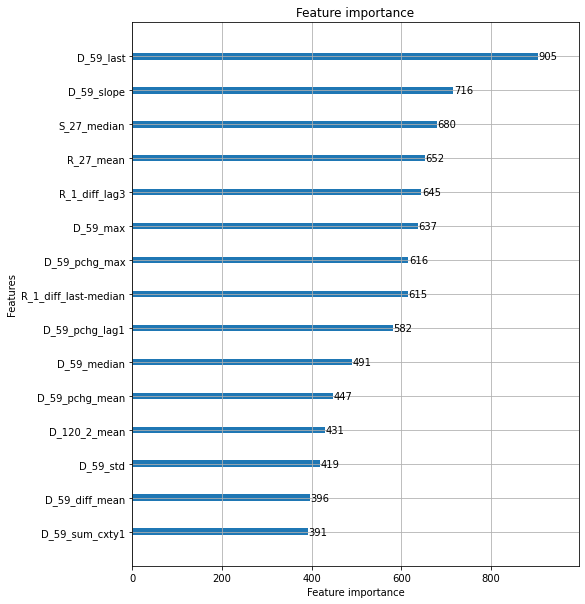

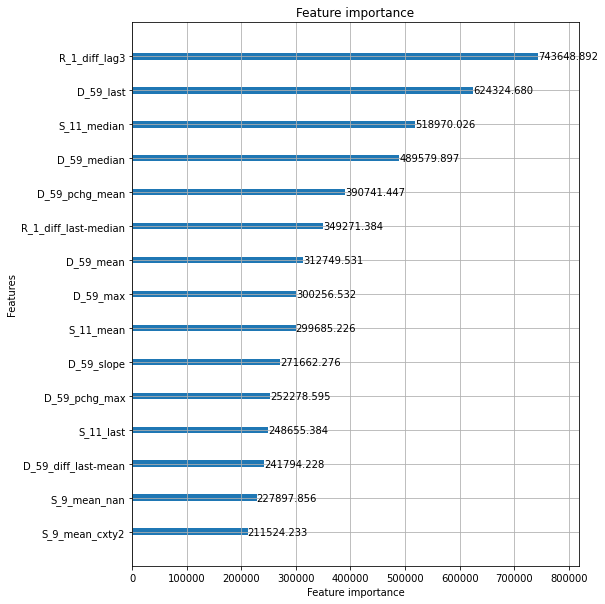

feature to remove: R_1_diff_lag3
Elapsed time: 9.628371715545654 min.
----------------------------------------------------------------------------------------------------
ITER: 14/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997656
[100]	valid_0's auc: 0.998939
[150]	valid_0's auc: 0.999471
[200]	valid_0's auc: 0.999672
[250]	valid_0's auc: 0.99977
[300]	valid_0's auc: 0.999848
[350]	valid_0's auc: 0.999882
[400]	valid_0's auc: 0.999906
[450]	valid_0's auc: 0.999922
[500]	valid_0's auc: 0.999934
[550]	valid_0's auc: 0.999941
[600]	valid_0's auc: 0.999947
[650]	valid_0's auc: 0.999952
[700]	valid_0's auc: 0.999956
[750]	valid_0's auc: 0.999959
[800]	valid_0's auc: 0.999961
[850]	valid_0's auc: 0.999963
[900]	valid_0's auc: 0.999964
[950]	valid_0's auc: 0.999965
[1000]	valid_0's auc: 0.999966
[1050]	valid_0's auc: 0.999967
[1100]	valid_0's auc: 0.999969
[1150]	valid_0's auc: 0.999969
[1200]	valid_0's auc: 0.99997
[1250]	valid_0's auc: 0.999971
[

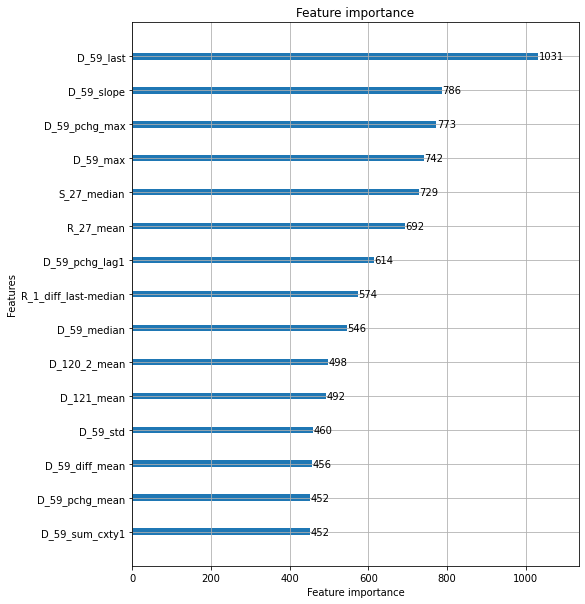

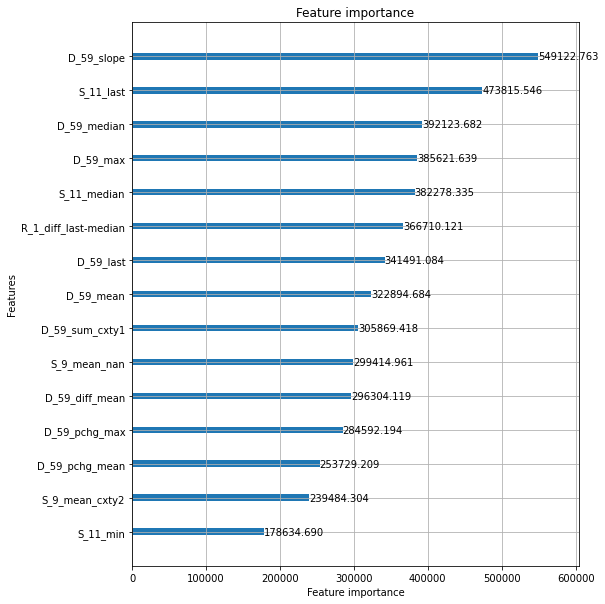

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997759
[100]	valid_0's auc: 0.999001
[150]	valid_0's auc: 0.999492
[200]	valid_0's auc: 0.999685
[250]	valid_0's auc: 0.999781
[300]	valid_0's auc: 0.99985
[350]	valid_0's auc: 0.999881
[400]	valid_0's auc: 0.999904
[450]	valid_0's auc: 0.999919
[500]	valid_0's auc: 0.999929
[550]	valid_0's auc: 0.999937
[600]	valid_0's auc: 0.999943
[650]	valid_0's auc: 0.999948
[700]	valid_0's auc: 0.999952
[750]	valid_0's auc: 0.999955
[800]	valid_0's auc: 0.999957
[850]	valid_0's auc: 0.999959
[900]	valid_0's auc: 0.999961
[950]	valid_0's auc: 0.999963
[1000]	valid_0's auc: 0.999963
[1050]	valid_0's auc: 0.999965
[1100]	valid_0's auc: 0.999965
[1150]	valid_0's auc: 0.999966
[1200]	valid_0's auc: 0.999967
[1250]	valid_0's auc: 0.999967
[1300]	valid_0's auc: 0.999968
[1350]	valid_0's auc: 0.999968
[1400]	valid_0's auc: 0.999968
[1450]	valid_0's auc: 0.999968
[1500]	valid_0's auc: 0.999969
[1550]	valid_0's auc: 0.99996

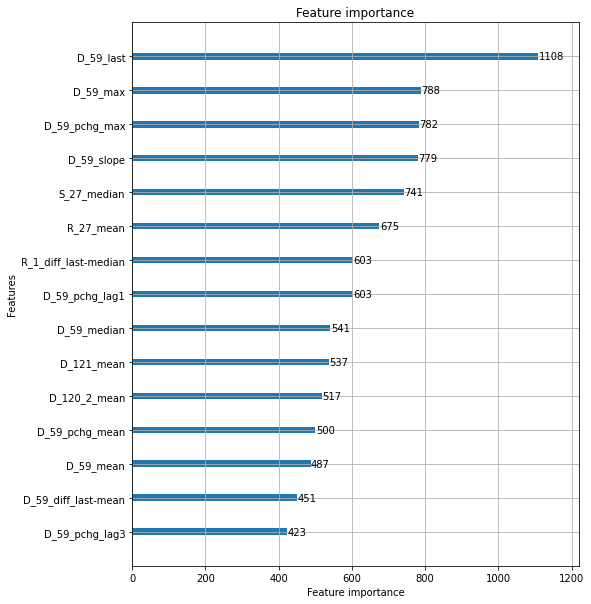

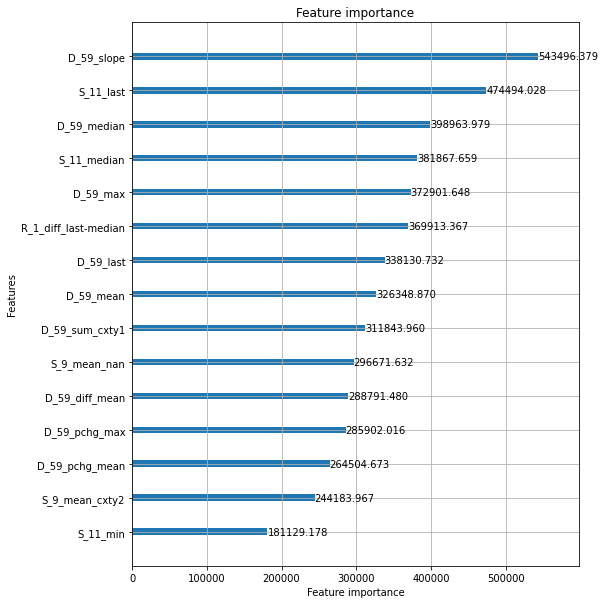

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997699
[100]	valid_0's auc: 0.998996
[150]	valid_0's auc: 0.9995
[200]	valid_0's auc: 0.999688
[250]	valid_0's auc: 0.999786
[300]	valid_0's auc: 0.999851
[350]	valid_0's auc: 0.999885
[400]	valid_0's auc: 0.999907
[450]	valid_0's auc: 0.999923
[500]	valid_0's auc: 0.999933
[550]	valid_0's auc: 0.99994
[600]	valid_0's auc: 0.999946
[650]	valid_0's auc: 0.99995
[700]	valid_0's auc: 0.999954
[750]	valid_0's auc: 0.999957
[800]	valid_0's auc: 0.999959
[850]	valid_0's auc: 0.999961
[900]	valid_0's auc: 0.999963
[950]	valid_0's auc: 0.999964
[1000]	valid_0's auc: 0.999966
[1050]	valid_0's auc: 0.999967
[1100]	valid_0's auc: 0.999968
[1150]	valid_0's auc: 0.999969
[1200]	valid_0's auc: 0.99997
[1250]	valid_0's auc: 0.99997
[1300]	valid_0's auc: 0.99997
[1350]	valid_0's auc: 0.999971
[1400]	valid_0's auc: 0.999971
[1450]	valid_0's auc: 0.999971
[1500]	valid_0's auc: 0.999971
[1550]	valid_0's auc: 0.999972
[160

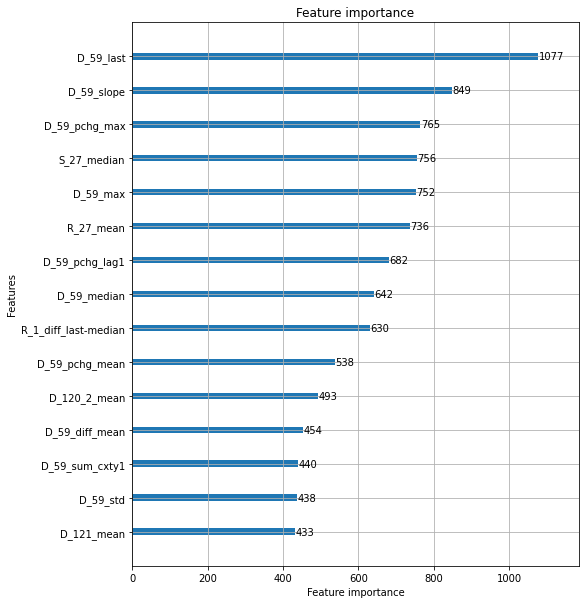

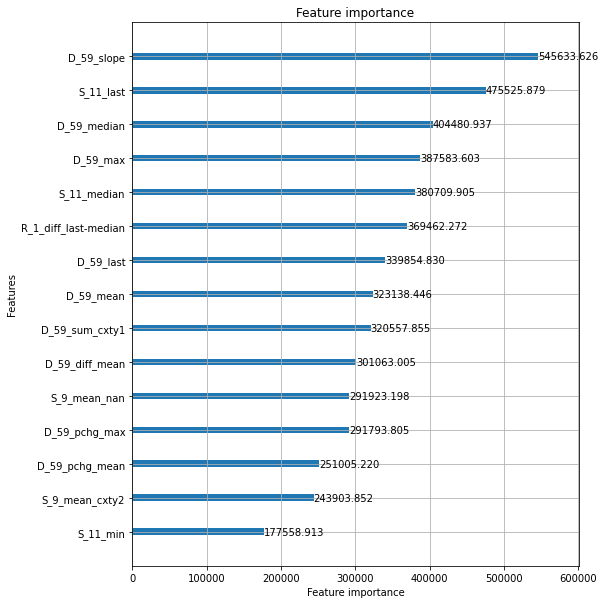

feature to remove: D_59_slope
Elapsed time: 10.417380475997925 min.
----------------------------------------------------------------------------------------------------
ITER: 15/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997462
[100]	valid_0's auc: 0.998992
[150]	valid_0's auc: 0.999463
[200]	valid_0's auc: 0.999676
[250]	valid_0's auc: 0.999776
[300]	valid_0's auc: 0.999833
[350]	valid_0's auc: 0.999874
[400]	valid_0's auc: 0.9999
[450]	valid_0's auc: 0.999918
[500]	valid_0's auc: 0.999928
[550]	valid_0's auc: 0.999936
[600]	valid_0's auc: 0.999943
[650]	valid_0's auc: 0.999948
[700]	valid_0's auc: 0.999952
[750]	valid_0's auc: 0.999956
[800]	valid_0's auc: 0.999959
[850]	valid_0's auc: 0.999961
[900]	valid_0's auc: 0.999963
[950]	valid_0's auc: 0.999964
[1000]	valid_0's auc: 0.999966
[1050]	valid_0's auc: 0.999967
[1100]	valid_0's auc: 0.999968
[1150]	valid_0's auc: 0.999968
[1200]	valid_0's auc: 0.999969
[1250]	valid_0's auc: 0.999969
[13

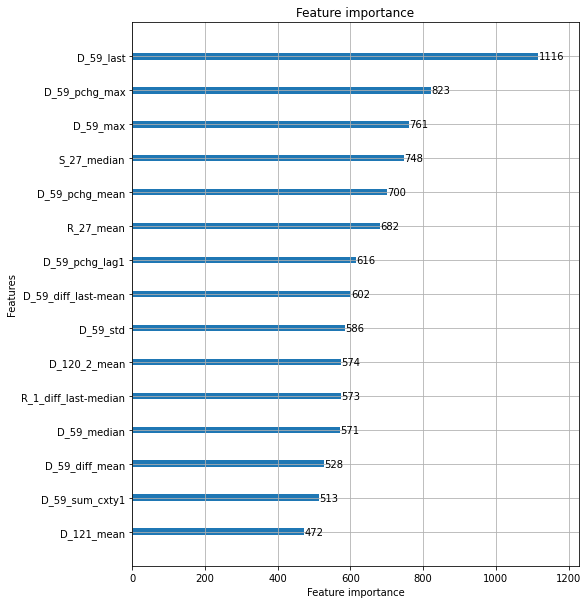

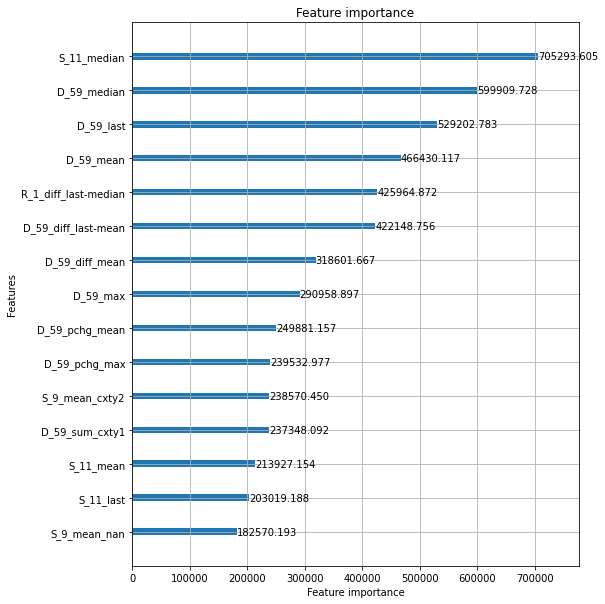

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997593
[100]	valid_0's auc: 0.999005
[150]	valid_0's auc: 0.999457
[200]	valid_0's auc: 0.999677
[250]	valid_0's auc: 0.999778
[300]	valid_0's auc: 0.999834
[350]	valid_0's auc: 0.999875
[400]	valid_0's auc: 0.999897
[450]	valid_0's auc: 0.999914
[500]	valid_0's auc: 0.999926
[550]	valid_0's auc: 0.999933
[600]	valid_0's auc: 0.99994
[650]	valid_0's auc: 0.999945
[700]	valid_0's auc: 0.999949
[750]	valid_0's auc: 0.999953
[800]	valid_0's auc: 0.999955
[850]	valid_0's auc: 0.999957
[900]	valid_0's auc: 0.999959
[950]	valid_0's auc: 0.999961
[1000]	valid_0's auc: 0.999962
[1050]	valid_0's auc: 0.999963
[1100]	valid_0's auc: 0.999964
[1150]	valid_0's auc: 0.999965
[1200]	valid_0's auc: 0.999966
[1250]	valid_0's auc: 0.999966
[1300]	valid_0's auc: 0.999967
[1350]	valid_0's auc: 0.999968
[1400]	valid_0's auc: 0.999968
[1450]	valid_0's auc: 0.999968
[1500]	valid_0's auc: 0.999969
[1550]	valid_0's auc: 0.99996

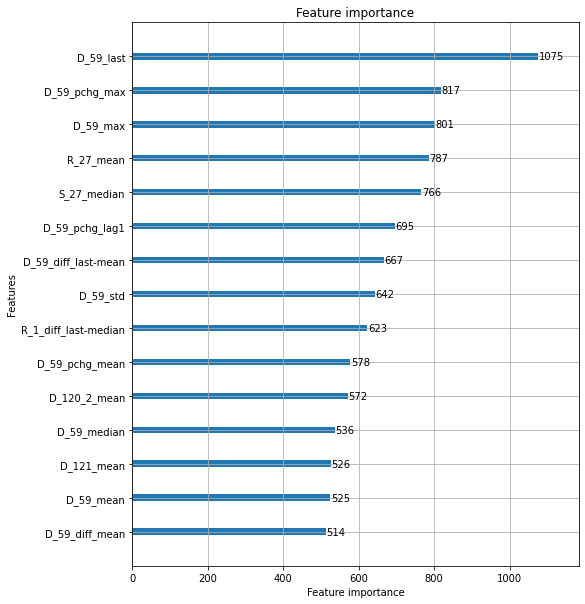

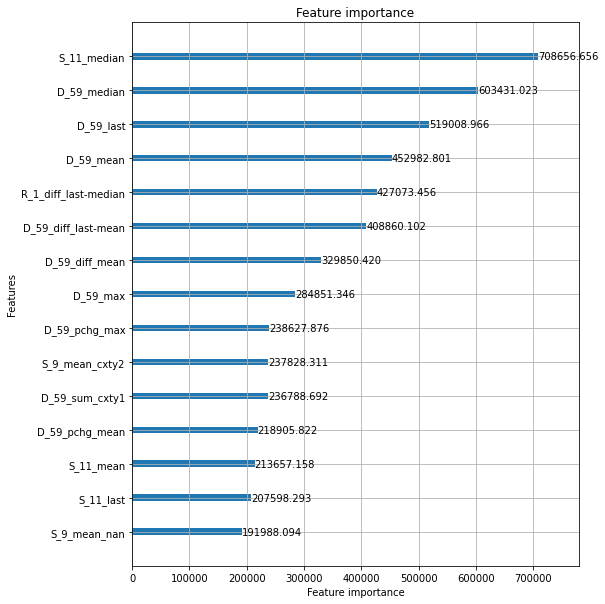

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997583
[100]	valid_0's auc: 0.998982
[150]	valid_0's auc: 0.999459
[200]	valid_0's auc: 0.999668
[250]	valid_0's auc: 0.999767
[300]	valid_0's auc: 0.999831
[350]	valid_0's auc: 0.999871
[400]	valid_0's auc: 0.999897
[450]	valid_0's auc: 0.999914
[500]	valid_0's auc: 0.999925
[550]	valid_0's auc: 0.999933
[600]	valid_0's auc: 0.99994
[650]	valid_0's auc: 0.999945
[700]	valid_0's auc: 0.99995
[750]	valid_0's auc: 0.999952
[800]	valid_0's auc: 0.999955
[850]	valid_0's auc: 0.999957
[900]	valid_0's auc: 0.999959
[950]	valid_0's auc: 0.999961
[1000]	valid_0's auc: 0.999962
[1050]	valid_0's auc: 0.999963
[1100]	valid_0's auc: 0.999964
[1150]	valid_0's auc: 0.999965
[1200]	valid_0's auc: 0.999966
[1250]	valid_0's auc: 0.999967
[1300]	valid_0's auc: 0.999967
[1350]	valid_0's auc: 0.999968
[1400]	valid_0's auc: 0.999968
[1450]	valid_0's auc: 0.999969
[1500]	valid_0's auc: 0.999969
[1550]	valid_0's auc: 0.999969

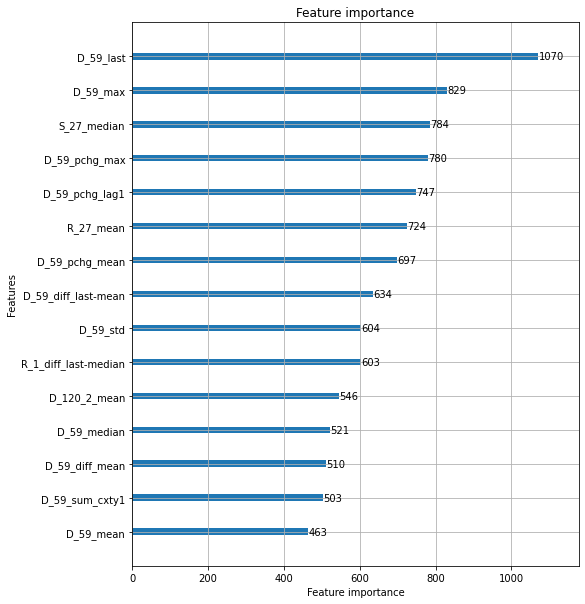

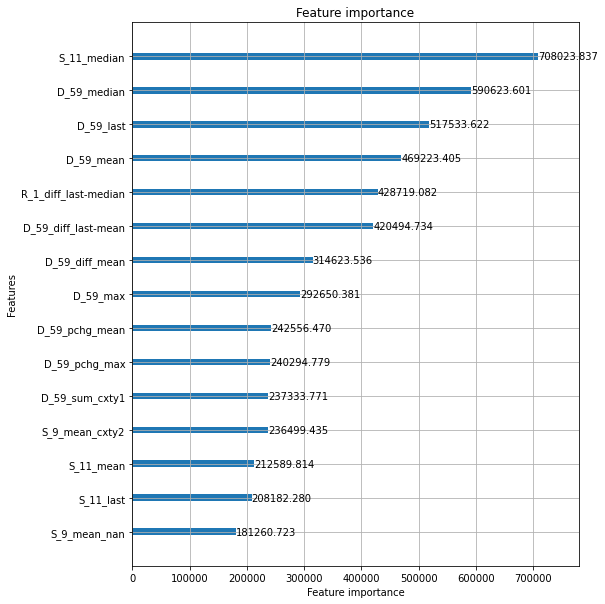

feature to remove: S_11_median
Elapsed time: 10.537102198600769 min.
----------------------------------------------------------------------------------------------------
ITER: 16/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997772
[100]	valid_0's auc: 0.999058
[150]	valid_0's auc: 0.999464
[200]	valid_0's auc: 0.999672
[250]	valid_0's auc: 0.99978
[300]	valid_0's auc: 0.99984
[350]	valid_0's auc: 0.999877
[400]	valid_0's auc: 0.9999
[450]	valid_0's auc: 0.999917
[500]	valid_0's auc: 0.999929
[550]	valid_0's auc: 0.999937
[600]	valid_0's auc: 0.999944
[650]	valid_0's auc: 0.999948
[700]	valid_0's auc: 0.999952
[750]	valid_0's auc: 0.999956
[800]	valid_0's auc: 0.999958
[850]	valid_0's auc: 0.999961
[900]	valid_0's auc: 0.999963
[950]	valid_0's auc: 0.999965
[1000]	valid_0's auc: 0.999966
[1050]	valid_0's auc: 0.999967
[1100]	valid_0's auc: 0.999968
[1150]	valid_0's auc: 0.999969
[1200]	valid_0's auc: 0.99997
[1250]	valid_0's auc: 0.99997
[1300]

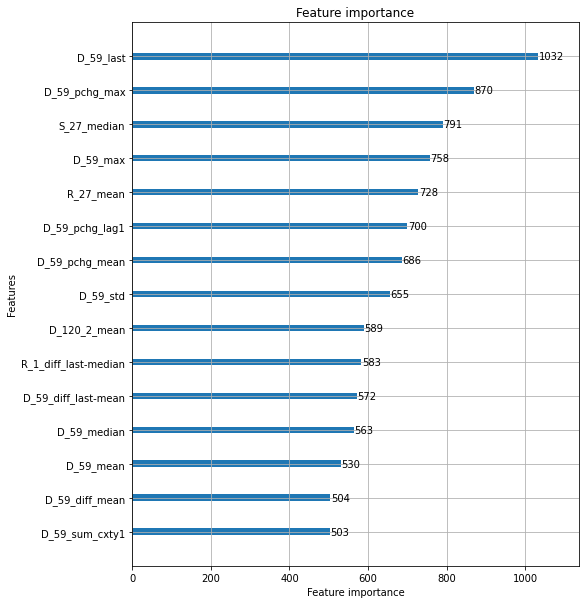

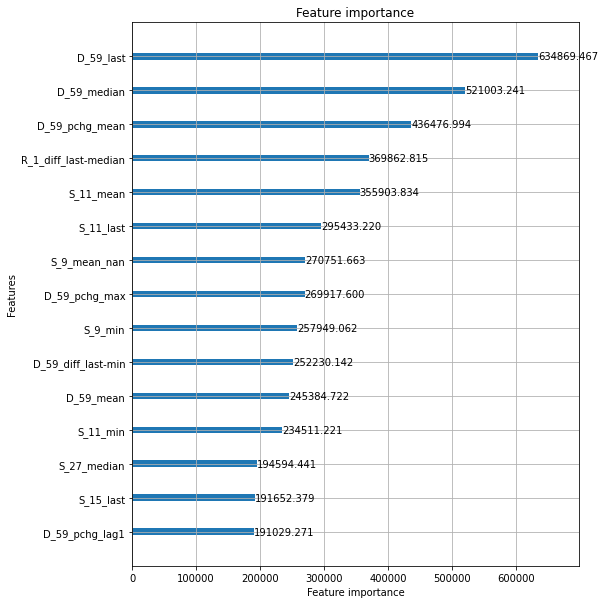

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997849
[100]	valid_0's auc: 0.999098
[150]	valid_0's auc: 0.999483
[200]	valid_0's auc: 0.999673
[250]	valid_0's auc: 0.999779
[300]	valid_0's auc: 0.99984
[350]	valid_0's auc: 0.999875
[400]	valid_0's auc: 0.999896
[450]	valid_0's auc: 0.999912
[500]	valid_0's auc: 0.999923
[550]	valid_0's auc: 0.999932
[600]	valid_0's auc: 0.999939
[650]	valid_0's auc: 0.999943
[700]	valid_0's auc: 0.999947
[750]	valid_0's auc: 0.99995
[800]	valid_0's auc: 0.999953
[850]	valid_0's auc: 0.999956
[900]	valid_0's auc: 0.999958
[950]	valid_0's auc: 0.999959
[1000]	valid_0's auc: 0.999961
[1050]	valid_0's auc: 0.999962
[1100]	valid_0's auc: 0.999963
[1150]	valid_0's auc: 0.999964
[1200]	valid_0's auc: 0.999964
[1250]	valid_0's auc: 0.999965
[1300]	valid_0's auc: 0.999966
[1350]	valid_0's auc: 0.999966
[1400]	valid_0's auc: 0.999967
[1450]	valid_0's auc: 0.999967
[1500]	valid_0's auc: 0.999968
[1550]	valid_0's auc: 0.999968

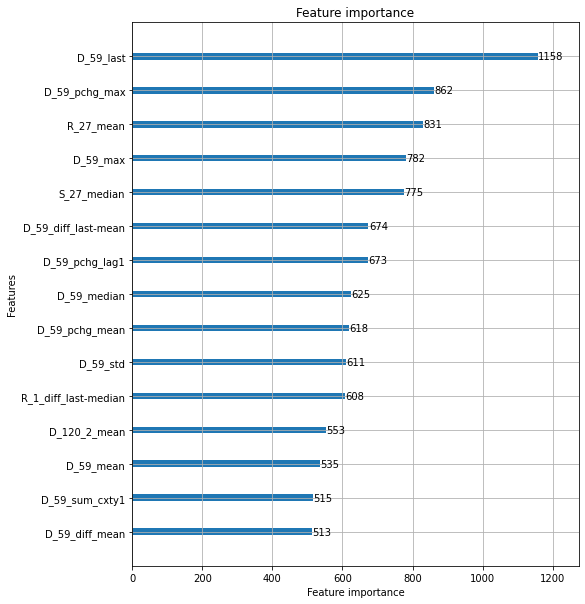

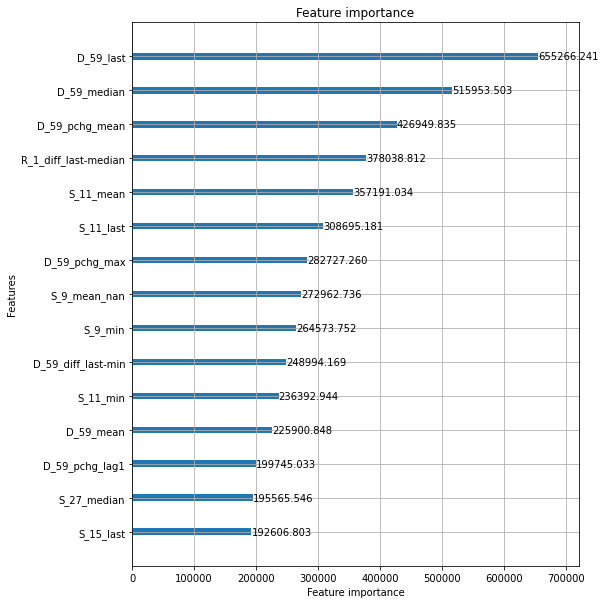

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997928
[100]	valid_0's auc: 0.999109
[150]	valid_0's auc: 0.999485
[200]	valid_0's auc: 0.999682
[250]	valid_0's auc: 0.999782
[300]	valid_0's auc: 0.999836
[350]	valid_0's auc: 0.999875
[400]	valid_0's auc: 0.999896
[450]	valid_0's auc: 0.999914
[500]	valid_0's auc: 0.999925
[550]	valid_0's auc: 0.999934
[600]	valid_0's auc: 0.999941
[650]	valid_0's auc: 0.999945
[700]	valid_0's auc: 0.999949
[750]	valid_0's auc: 0.999952
[800]	valid_0's auc: 0.999955
[850]	valid_0's auc: 0.999957
[900]	valid_0's auc: 0.999959
[950]	valid_0's auc: 0.999961
[1000]	valid_0's auc: 0.999962
[1050]	valid_0's auc: 0.999964
[1100]	valid_0's auc: 0.999965
[1150]	valid_0's auc: 0.999966
[1200]	valid_0's auc: 0.999966
[1250]	valid_0's auc: 0.999967
[1300]	valid_0's auc: 0.999967
[1350]	valid_0's auc: 0.999968
[1400]	valid_0's auc: 0.999968
[1450]	valid_0's auc: 0.999969
[1500]	valid_0's auc: 0.999969
[1550]	valid_0's auc: 0.9999

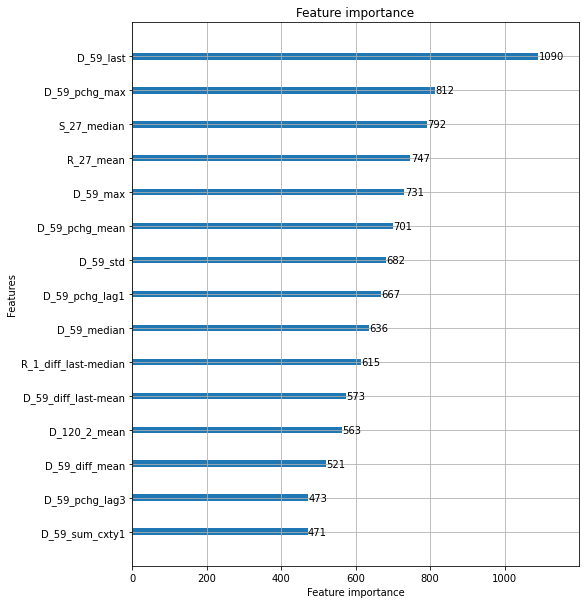

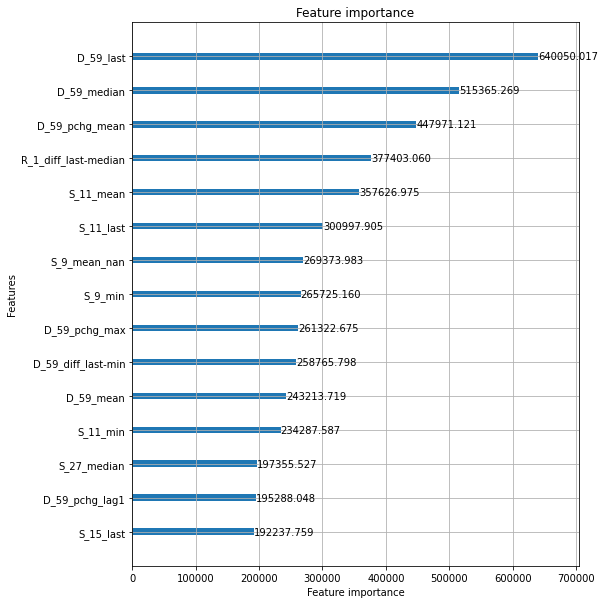

feature to remove: D_59_last
Elapsed time: 10.669712070624033 min.
----------------------------------------------------------------------------------------------------
ITER: 17/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997699
[100]	valid_0's auc: 0.998943
[150]	valid_0's auc: 0.999436
[200]	valid_0's auc: 0.999658
[250]	valid_0's auc: 0.99976
[300]	valid_0's auc: 0.999826
[350]	valid_0's auc: 0.999865
[400]	valid_0's auc: 0.999891
[450]	valid_0's auc: 0.999911
[500]	valid_0's auc: 0.999923
[550]	valid_0's auc: 0.999933
[600]	valid_0's auc: 0.99994
[650]	valid_0's auc: 0.999945
[700]	valid_0's auc: 0.999949
[750]	valid_0's auc: 0.999953
[800]	valid_0's auc: 0.999955
[850]	valid_0's auc: 0.999958
[900]	valid_0's auc: 0.999959
[950]	valid_0's auc: 0.999961
[1000]	valid_0's auc: 0.999963
[1050]	valid_0's auc: 0.999964
[1100]	valid_0's auc: 0.999965
[1150]	valid_0's auc: 0.999966
[1200]	valid_0's auc: 0.999967
[1250]	valid_0's auc: 0.999967
[130

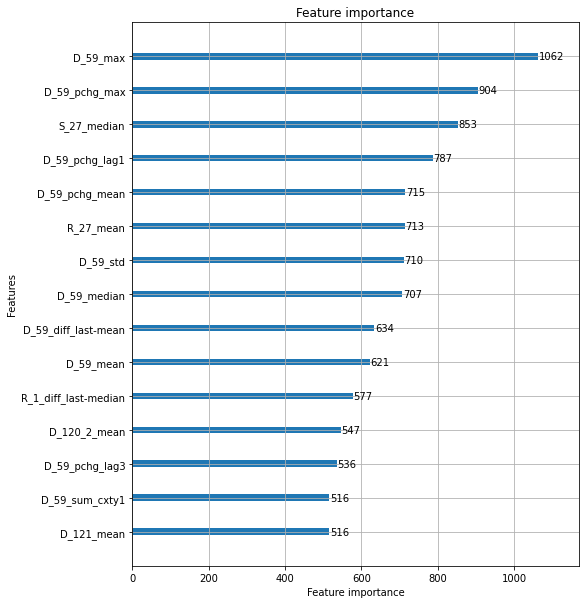

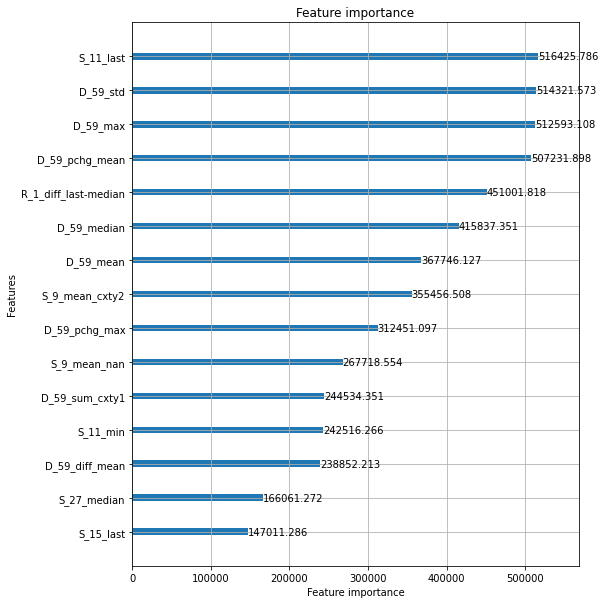

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997663
[100]	valid_0's auc: 0.998919
[150]	valid_0's auc: 0.999442
[200]	valid_0's auc: 0.999655
[250]	valid_0's auc: 0.999754
[300]	valid_0's auc: 0.999817
[350]	valid_0's auc: 0.99986
[400]	valid_0's auc: 0.999885
[450]	valid_0's auc: 0.999904
[500]	valid_0's auc: 0.999917
[550]	valid_0's auc: 0.999926
[600]	valid_0's auc: 0.999934
[650]	valid_0's auc: 0.999939
[700]	valid_0's auc: 0.999944
[750]	valid_0's auc: 0.999947
[800]	valid_0's auc: 0.99995
[850]	valid_0's auc: 0.999953
[900]	valid_0's auc: 0.999955
[950]	valid_0's auc: 0.999957
[1000]	valid_0's auc: 0.999958
[1050]	valid_0's auc: 0.99996
[1100]	valid_0's auc: 0.999961
[1150]	valid_0's auc: 0.999962
[1200]	valid_0's auc: 0.999963
[1250]	valid_0's auc: 0.999963
[1300]	valid_0's auc: 0.999964
[1350]	valid_0's auc: 0.999964
[1400]	valid_0's auc: 0.999965
[1450]	valid_0's auc: 0.999965
[1500]	valid_0's auc: 0.999966
[1550]	valid_0's auc: 0.999966


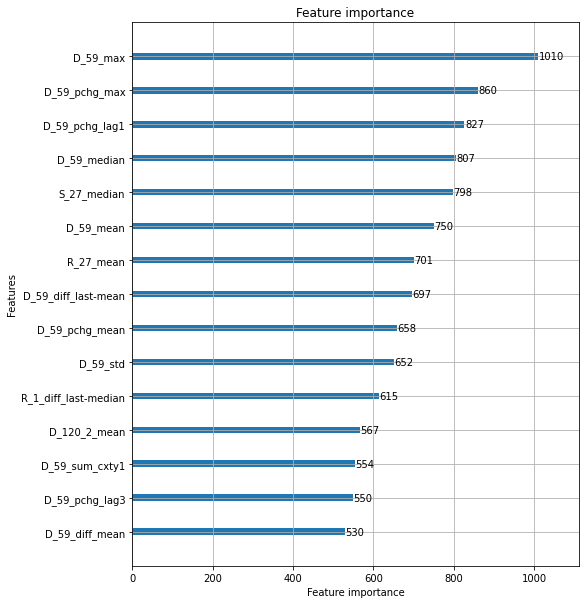

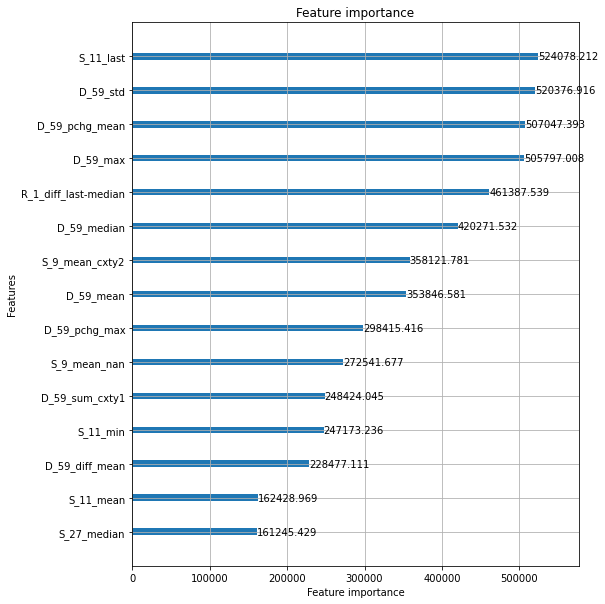

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997703
[100]	valid_0's auc: 0.998917
[150]	valid_0's auc: 0.999435
[200]	valid_0's auc: 0.99966
[250]	valid_0's auc: 0.99976
[300]	valid_0's auc: 0.999821
[350]	valid_0's auc: 0.999861
[400]	valid_0's auc: 0.999887
[450]	valid_0's auc: 0.999904
[500]	valid_0's auc: 0.999917
[550]	valid_0's auc: 0.999926
[600]	valid_0's auc: 0.999934
[650]	valid_0's auc: 0.99994
[700]	valid_0's auc: 0.999945
[750]	valid_0's auc: 0.999948
[800]	valid_0's auc: 0.999952
[850]	valid_0's auc: 0.999954
[900]	valid_0's auc: 0.999956
[950]	valid_0's auc: 0.999957
[1000]	valid_0's auc: 0.999959
[1050]	valid_0's auc: 0.999961
[1100]	valid_0's auc: 0.999962
[1150]	valid_0's auc: 0.999963
[1200]	valid_0's auc: 0.999964
[1250]	valid_0's auc: 0.999965
[1300]	valid_0's auc: 0.999965
[1350]	valid_0's auc: 0.999966
[1400]	valid_0's auc: 0.999966
[1450]	valid_0's auc: 0.999967
[1500]	valid_0's auc: 0.999967
[1550]	valid_0's auc: 0.999967


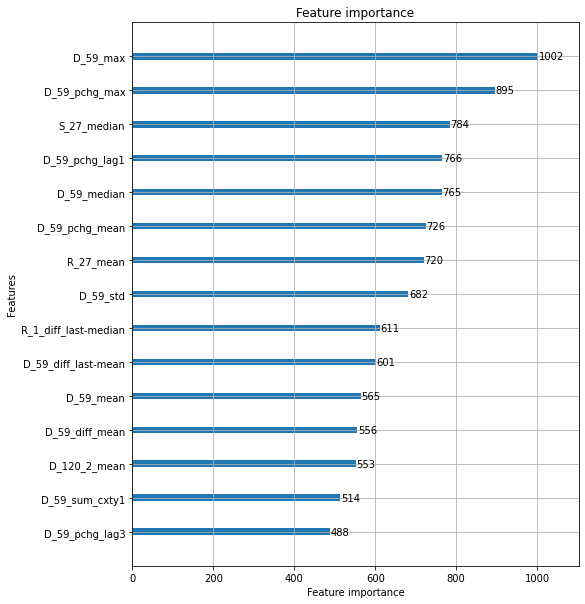

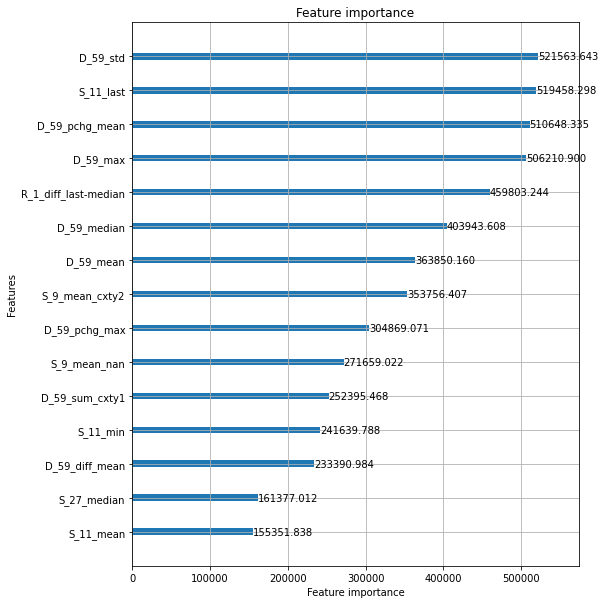

feature to remove: S_11_last
Elapsed time: 10.737725885709127 min.
----------------------------------------------------------------------------------------------------
ITER: 18/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99782
[100]	valid_0's auc: 0.999043
[150]	valid_0's auc: 0.999482
[200]	valid_0's auc: 0.999667
[250]	valid_0's auc: 0.999769
[300]	valid_0's auc: 0.999827
[350]	valid_0's auc: 0.999869
[400]	valid_0's auc: 0.999898
[450]	valid_0's auc: 0.999913
[500]	valid_0's auc: 0.999923
[550]	valid_0's auc: 0.999932
[600]	valid_0's auc: 0.99994
[650]	valid_0's auc: 0.999945
[700]	valid_0's auc: 0.999949
[750]	valid_0's auc: 0.999953
[800]	valid_0's auc: 0.999955
[850]	valid_0's auc: 0.999958
[900]	valid_0's auc: 0.99996
[950]	valid_0's auc: 0.999962
[1000]	valid_0's auc: 0.999963
[1050]	valid_0's auc: 0.999964
[1100]	valid_0's auc: 0.999965
[1150]	valid_0's auc: 0.999966
[1200]	valid_0's auc: 0.999967
[1250]	valid_0's auc: 0.999968
[1300

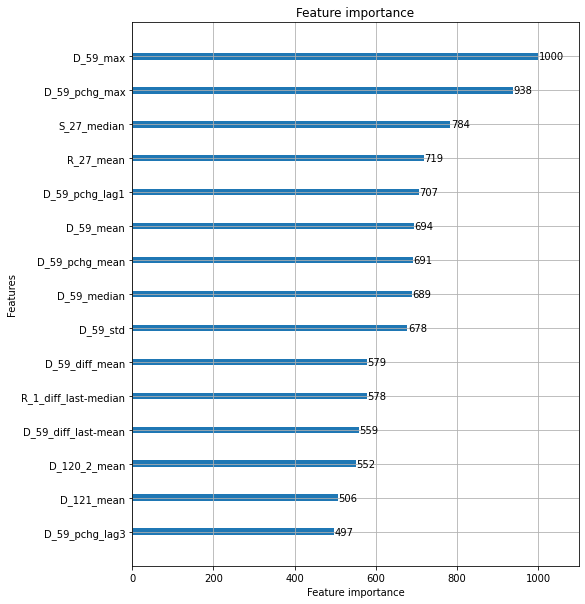

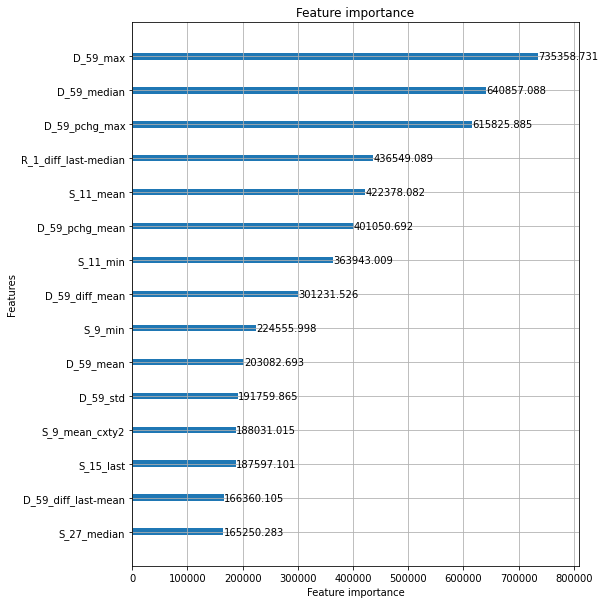

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997843
[100]	valid_0's auc: 0.999035
[150]	valid_0's auc: 0.9995
[200]	valid_0's auc: 0.99967
[250]	valid_0's auc: 0.999759
[300]	valid_0's auc: 0.999822
[350]	valid_0's auc: 0.999863
[400]	valid_0's auc: 0.999889
[450]	valid_0's auc: 0.999904
[500]	valid_0's auc: 0.999916
[550]	valid_0's auc: 0.999925
[600]	valid_0's auc: 0.999932
[650]	valid_0's auc: 0.999937
[700]	valid_0's auc: 0.999942
[750]	valid_0's auc: 0.999945
[800]	valid_0's auc: 0.999949
[850]	valid_0's auc: 0.999951
[900]	valid_0's auc: 0.999953
[950]	valid_0's auc: 0.999955
[1000]	valid_0's auc: 0.999956
[1050]	valid_0's auc: 0.999958
[1100]	valid_0's auc: 0.999959
[1150]	valid_0's auc: 0.999961
[1200]	valid_0's auc: 0.999961
[1250]	valid_0's auc: 0.999962
[1300]	valid_0's auc: 0.999963
[1350]	valid_0's auc: 0.999964
[1400]	valid_0's auc: 0.999964
[1450]	valid_0's auc: 0.999965
[1500]	valid_0's auc: 0.999965
[1550]	valid_0's auc: 0.999965


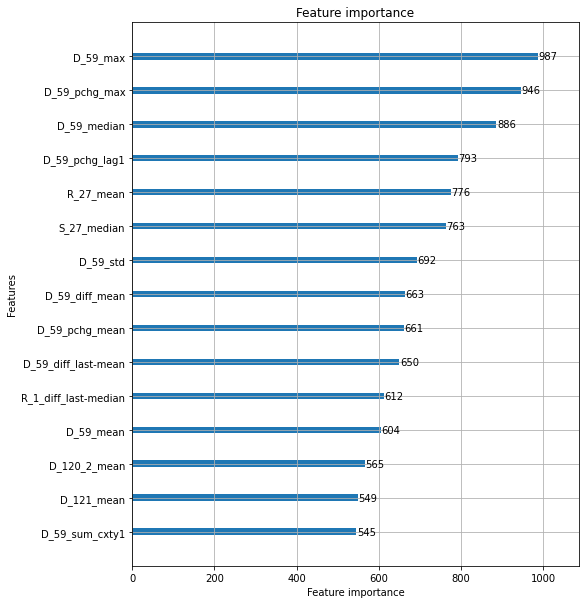

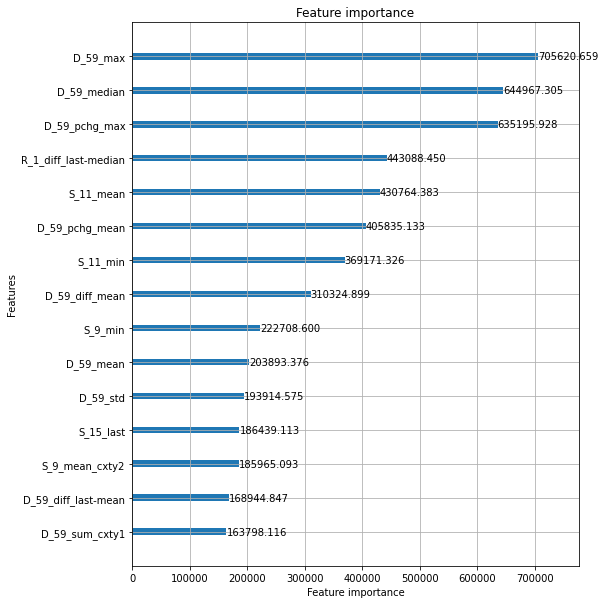

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997948
[100]	valid_0's auc: 0.999073
[150]	valid_0's auc: 0.99951
[200]	valid_0's auc: 0.999682
[250]	valid_0's auc: 0.999765
[300]	valid_0's auc: 0.999829
[350]	valid_0's auc: 0.999866
[400]	valid_0's auc: 0.999892
[450]	valid_0's auc: 0.999906
[500]	valid_0's auc: 0.999919
[550]	valid_0's auc: 0.999929
[600]	valid_0's auc: 0.999936
[650]	valid_0's auc: 0.999942
[700]	valid_0's auc: 0.999946
[750]	valid_0's auc: 0.999949
[800]	valid_0's auc: 0.999952
[850]	valid_0's auc: 0.999954
[900]	valid_0's auc: 0.999957
[950]	valid_0's auc: 0.999959
[1000]	valid_0's auc: 0.999961
[1050]	valid_0's auc: 0.999961
[1100]	valid_0's auc: 0.999962
[1150]	valid_0's auc: 0.999963
[1200]	valid_0's auc: 0.999964
[1250]	valid_0's auc: 0.999965
[1300]	valid_0's auc: 0.999965
[1350]	valid_0's auc: 0.999966
[1400]	valid_0's auc: 0.999967
[1450]	valid_0's auc: 0.999967
[1500]	valid_0's auc: 0.999967
[1550]	valid_0's auc: 0.99996

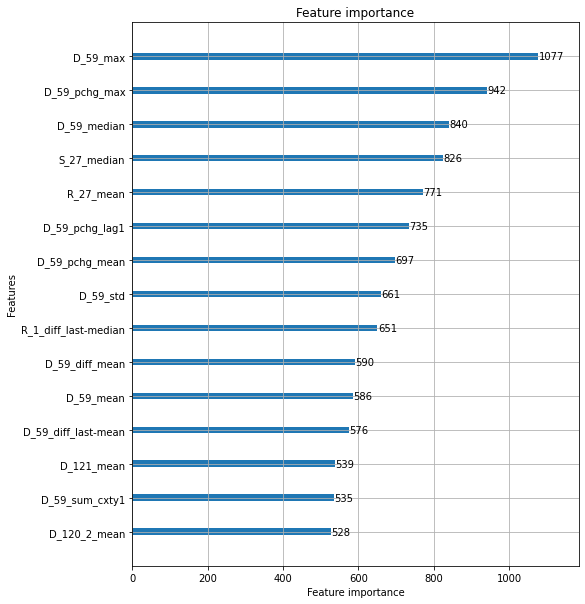

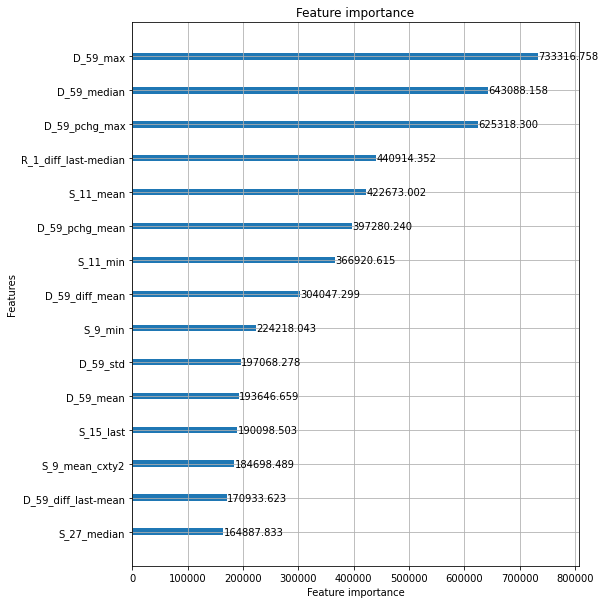

feature to remove: D_59_max
Elapsed time: 10.819646700223286 min.
----------------------------------------------------------------------------------------------------
ITER: 19/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997893
[100]	valid_0's auc: 0.99904
[150]	valid_0's auc: 0.999448
[200]	valid_0's auc: 0.999646
[250]	valid_0's auc: 0.999749
[300]	valid_0's auc: 0.999826
[350]	valid_0's auc: 0.999862
[400]	valid_0's auc: 0.999886
[450]	valid_0's auc: 0.999905
[500]	valid_0's auc: 0.999918
[550]	valid_0's auc: 0.999927
[600]	valid_0's auc: 0.999934
[650]	valid_0's auc: 0.99994
[700]	valid_0's auc: 0.999944
[750]	valid_0's auc: 0.999949
[800]	valid_0's auc: 0.999952
[850]	valid_0's auc: 0.999954
[900]	valid_0's auc: 0.999957
[950]	valid_0's auc: 0.999958
[1000]	valid_0's auc: 0.99996
[1050]	valid_0's auc: 0.999961
[1100]	valid_0's auc: 0.999962
[1150]	valid_0's auc: 0.999963
[1200]	valid_0's auc: 0.999964
[1250]	valid_0's auc: 0.999964
[1300]

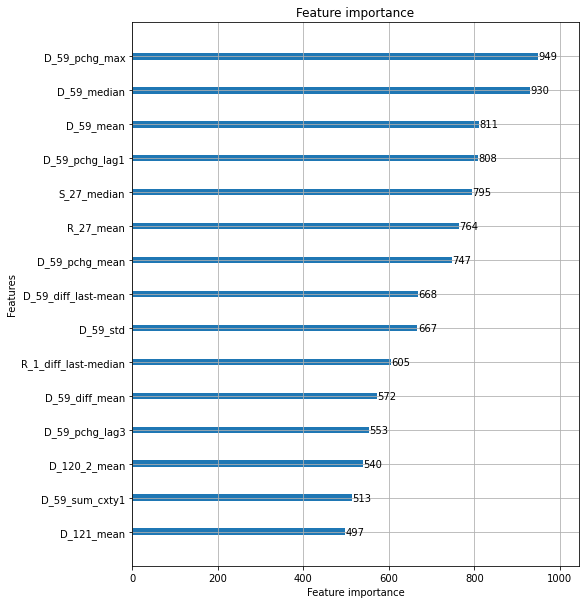

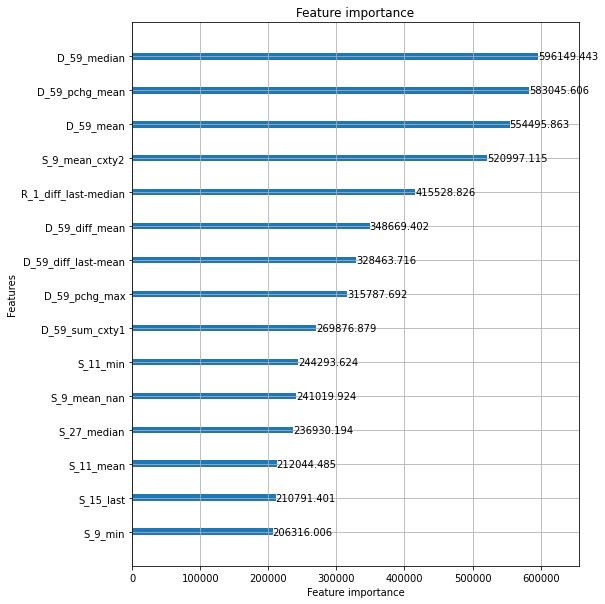

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997952
[100]	valid_0's auc: 0.999074
[150]	valid_0's auc: 0.999448
[200]	valid_0's auc: 0.999645
[250]	valid_0's auc: 0.999744
[300]	valid_0's auc: 0.999812
[350]	valid_0's auc: 0.99985
[400]	valid_0's auc: 0.999878
[450]	valid_0's auc: 0.999896
[500]	valid_0's auc: 0.999911
[550]	valid_0's auc: 0.99992
[600]	valid_0's auc: 0.999928
[650]	valid_0's auc: 0.999935
[700]	valid_0's auc: 0.999939
[750]	valid_0's auc: 0.999943
[800]	valid_0's auc: 0.999946
[850]	valid_0's auc: 0.999949
[900]	valid_0's auc: 0.999951
[950]	valid_0's auc: 0.999953
[1000]	valid_0's auc: 0.999954
[1050]	valid_0's auc: 0.999956
[1100]	valid_0's auc: 0.999957
[1150]	valid_0's auc: 0.999958
[1200]	valid_0's auc: 0.999959
[1250]	valid_0's auc: 0.99996
[1300]	valid_0's auc: 0.99996
[1350]	valid_0's auc: 0.999961
[1400]	valid_0's auc: 0.999961
[1450]	valid_0's auc: 0.999962
[1500]	valid_0's auc: 0.999962
[1550]	valid_0's auc: 0.999962
[

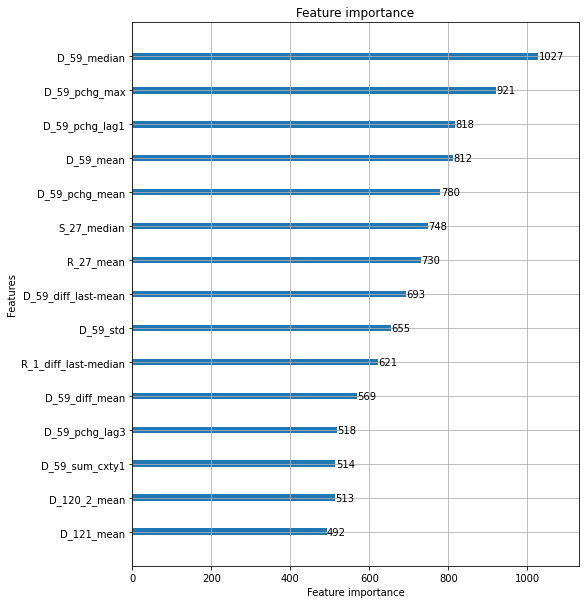

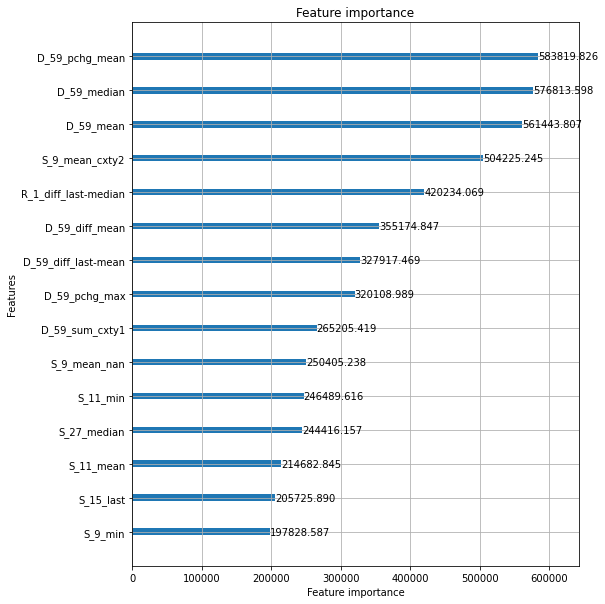

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997974
[100]	valid_0's auc: 0.99908
[150]	valid_0's auc: 0.999455
[200]	valid_0's auc: 0.999656
[250]	valid_0's auc: 0.999753
[300]	valid_0's auc: 0.99982
[350]	valid_0's auc: 0.999858
[400]	valid_0's auc: 0.999884
[450]	valid_0's auc: 0.999901
[500]	valid_0's auc: 0.999915
[550]	valid_0's auc: 0.999925
[600]	valid_0's auc: 0.999931
[650]	valid_0's auc: 0.999937
[700]	valid_0's auc: 0.999943
[750]	valid_0's auc: 0.999947
[800]	valid_0's auc: 0.99995
[850]	valid_0's auc: 0.999952
[900]	valid_0's auc: 0.999954
[950]	valid_0's auc: 0.999956
[1000]	valid_0's auc: 0.999958
[1050]	valid_0's auc: 0.999959
[1100]	valid_0's auc: 0.99996
[1150]	valid_0's auc: 0.999961
[1200]	valid_0's auc: 0.999962
[1250]	valid_0's auc: 0.999963
[1300]	valid_0's auc: 0.999964
[1350]	valid_0's auc: 0.999964
[1400]	valid_0's auc: 0.999965
[1450]	valid_0's auc: 0.999965
[1500]	valid_0's auc: 0.999965
[1550]	valid_0's auc: 0.999966
[

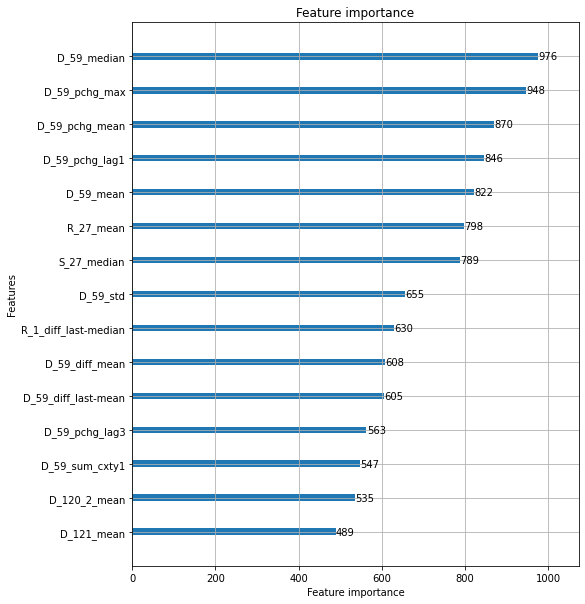

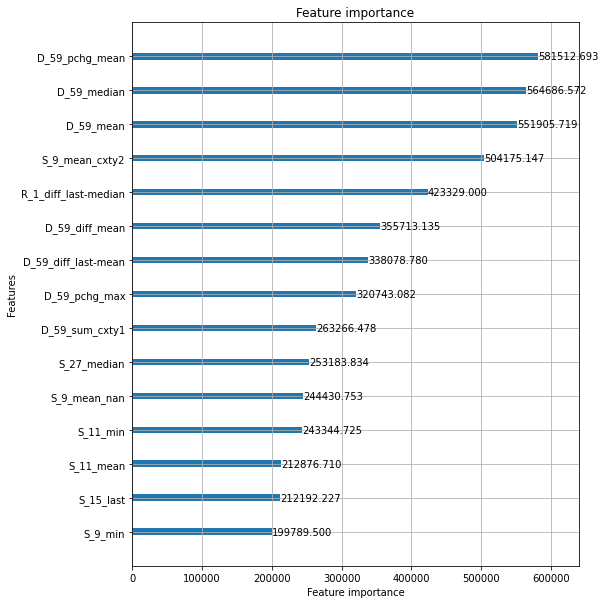

feature to remove: D_59_pchg_mean
Elapsed time: 10.917580874760946 min.
----------------------------------------------------------------------------------------------------
ITER: 20/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997719
[100]	valid_0's auc: 0.998974
[150]	valid_0's auc: 0.999439
[200]	valid_0's auc: 0.999647
[250]	valid_0's auc: 0.999736
[300]	valid_0's auc: 0.999815
[350]	valid_0's auc: 0.999856
[400]	valid_0's auc: 0.999885
[450]	valid_0's auc: 0.999904
[500]	valid_0's auc: 0.999916
[550]	valid_0's auc: 0.999928
[600]	valid_0's auc: 0.999934
[650]	valid_0's auc: 0.999939
[700]	valid_0's auc: 0.999943
[750]	valid_0's auc: 0.999946
[800]	valid_0's auc: 0.99995
[850]	valid_0's auc: 0.999953
[900]	valid_0's auc: 0.999955
[950]	valid_0's auc: 0.999957
[1000]	valid_0's auc: 0.999959
[1050]	valid_0's auc: 0.99996
[1100]	valid_0's auc: 0.999961
[1150]	valid_0's auc: 0.999962
[1200]	valid_0's auc: 0.999963
[1250]	valid_0's auc: 0.999964

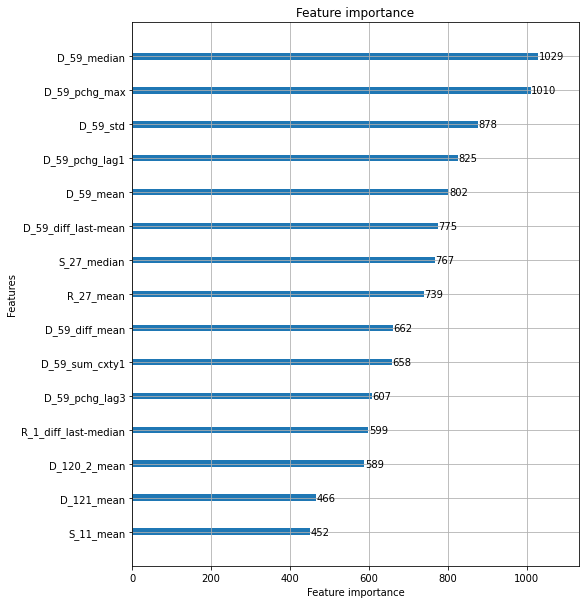

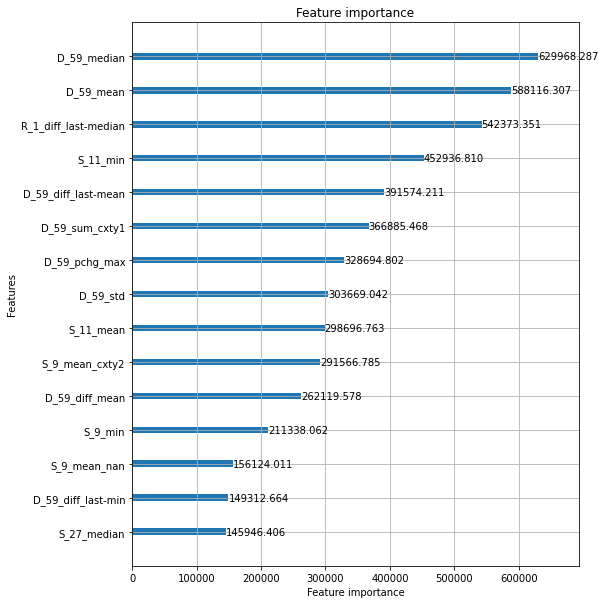

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997738
[100]	valid_0's auc: 0.998976
[150]	valid_0's auc: 0.999441
[200]	valid_0's auc: 0.999651
[250]	valid_0's auc: 0.999739
[300]	valid_0's auc: 0.999816
[350]	valid_0's auc: 0.999855
[400]	valid_0's auc: 0.99988
[450]	valid_0's auc: 0.999898
[500]	valid_0's auc: 0.99991
[550]	valid_0's auc: 0.999921
[600]	valid_0's auc: 0.999928
[650]	valid_0's auc: 0.999933
[700]	valid_0's auc: 0.999937
[750]	valid_0's auc: 0.999942
[800]	valid_0's auc: 0.999946
[850]	valid_0's auc: 0.999949
[900]	valid_0's auc: 0.999951
[950]	valid_0's auc: 0.999953
[1000]	valid_0's auc: 0.999955
[1050]	valid_0's auc: 0.999957
[1100]	valid_0's auc: 0.999958
[1150]	valid_0's auc: 0.999959
[1200]	valid_0's auc: 0.99996
[1250]	valid_0's auc: 0.99996
[1300]	valid_0's auc: 0.999961
[1350]	valid_0's auc: 0.999962
[1400]	valid_0's auc: 0.999962
[1450]	valid_0's auc: 0.999963
[1500]	valid_0's auc: 0.999963
[1550]	valid_0's auc: 0.999964
[

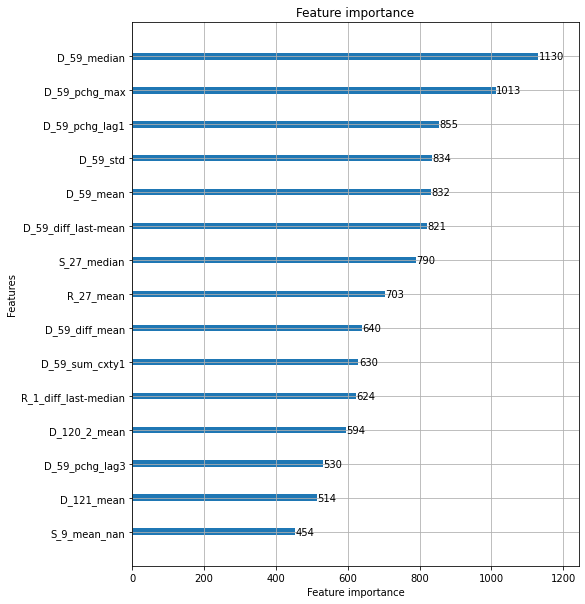

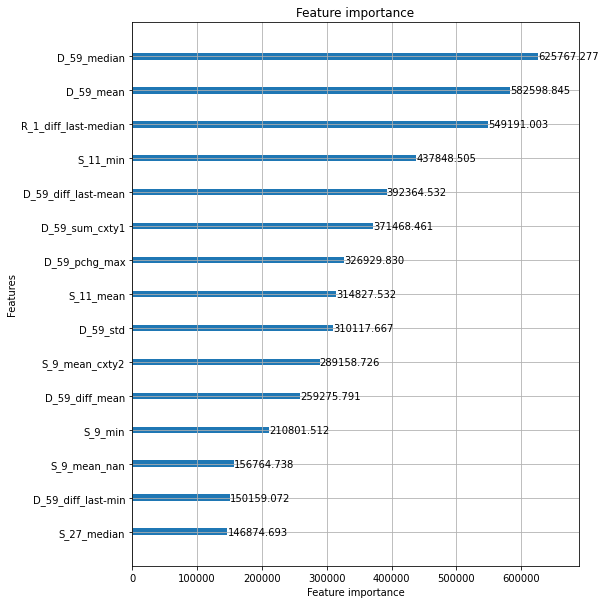

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99783
[100]	valid_0's auc: 0.99899
[150]	valid_0's auc: 0.999446
[200]	valid_0's auc: 0.99966
[250]	valid_0's auc: 0.999742
[300]	valid_0's auc: 0.999812
[350]	valid_0's auc: 0.999855
[400]	valid_0's auc: 0.999881
[450]	valid_0's auc: 0.999901
[500]	valid_0's auc: 0.999913
[550]	valid_0's auc: 0.999924
[600]	valid_0's auc: 0.99993
[650]	valid_0's auc: 0.999936
[700]	valid_0's auc: 0.99994
[750]	valid_0's auc: 0.999944
[800]	valid_0's auc: 0.999948
[850]	valid_0's auc: 0.999951
[900]	valid_0's auc: 0.999953
[950]	valid_0's auc: 0.999955
[1000]	valid_0's auc: 0.999956
[1050]	valid_0's auc: 0.999958
[1100]	valid_0's auc: 0.999959
[1150]	valid_0's auc: 0.99996
[1200]	valid_0's auc: 0.999961
[1250]	valid_0's auc: 0.999962
[1300]	valid_0's auc: 0.999962
[1350]	valid_0's auc: 0.999963
[1400]	valid_0's auc: 0.999964
[1450]	valid_0's auc: 0.999964
[1500]	valid_0's auc: 0.999965
[1550]	valid_0's auc: 0.999965
[16

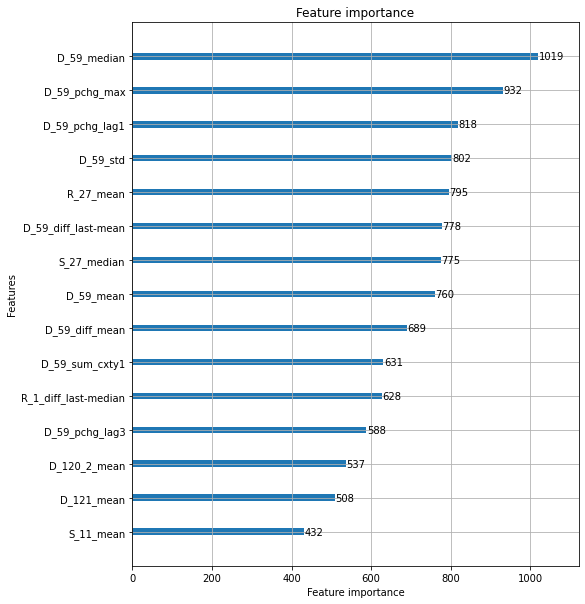

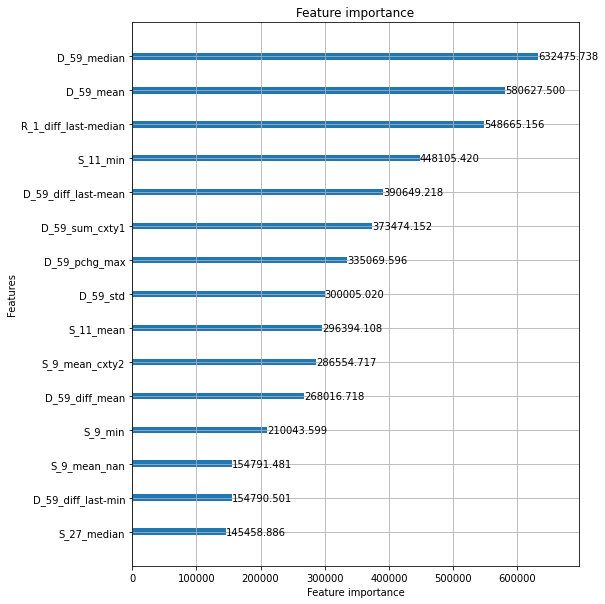

feature to remove: D_59_median
Elapsed time: 10.961032275358836 min.
----------------------------------------------------------------------------------------------------
ITER: 21/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997732
[100]	valid_0's auc: 0.998864
[150]	valid_0's auc: 0.999392
[200]	valid_0's auc: 0.999617
[250]	valid_0's auc: 0.999725
[300]	valid_0's auc: 0.999797
[350]	valid_0's auc: 0.999845
[400]	valid_0's auc: 0.999875
[450]	valid_0's auc: 0.999897
[500]	valid_0's auc: 0.999911
[550]	valid_0's auc: 0.999921
[600]	valid_0's auc: 0.99993
[650]	valid_0's auc: 0.999936
[700]	valid_0's auc: 0.999941
[750]	valid_0's auc: 0.999945
[800]	valid_0's auc: 0.999949
[850]	valid_0's auc: 0.999952
[900]	valid_0's auc: 0.999954
[950]	valid_0's auc: 0.999956
[1000]	valid_0's auc: 0.999957
[1050]	valid_0's auc: 0.999959
[1100]	valid_0's auc: 0.99996
[1150]	valid_0's auc: 0.999961
[1200]	valid_0's auc: 0.999963
[1250]	valid_0's auc: 0.999963
[1

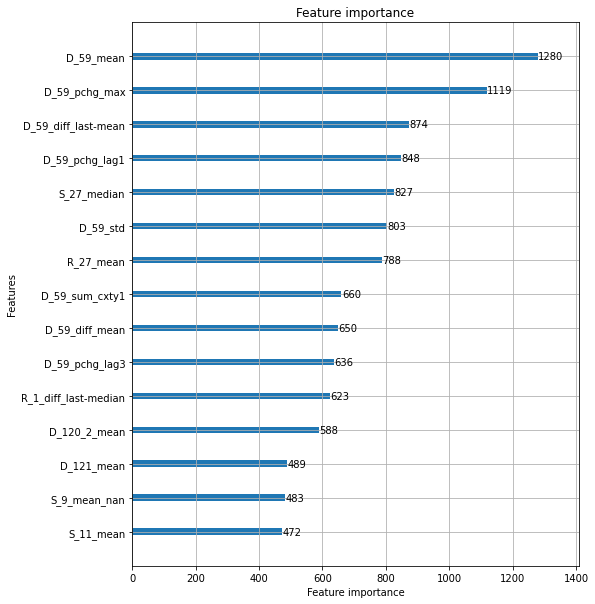

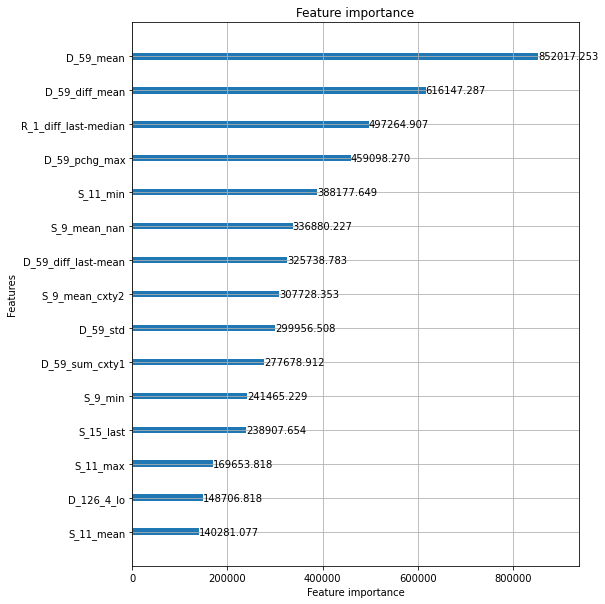

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997704
[100]	valid_0's auc: 0.998883
[150]	valid_0's auc: 0.999399
[200]	valid_0's auc: 0.999622
[250]	valid_0's auc: 0.999727
[300]	valid_0's auc: 0.999801
[350]	valid_0's auc: 0.999843
[400]	valid_0's auc: 0.999875
[450]	valid_0's auc: 0.999894
[500]	valid_0's auc: 0.999906
[550]	valid_0's auc: 0.999917
[600]	valid_0's auc: 0.999925
[650]	valid_0's auc: 0.999931
[700]	valid_0's auc: 0.999936
[750]	valid_0's auc: 0.99994
[800]	valid_0's auc: 0.999944
[850]	valid_0's auc: 0.999947
[900]	valid_0's auc: 0.99995
[950]	valid_0's auc: 0.999951
[1000]	valid_0's auc: 0.999954
[1050]	valid_0's auc: 0.999955
[1100]	valid_0's auc: 0.999956
[1150]	valid_0's auc: 0.999957
[1200]	valid_0's auc: 0.999958
[1250]	valid_0's auc: 0.999959
[1300]	valid_0's auc: 0.99996
[1350]	valid_0's auc: 0.99996
[1400]	valid_0's auc: 0.999961
[1450]	valid_0's auc: 0.999962
[1500]	valid_0's auc: 0.999962
[1550]	valid_0's auc: 0.999963
[

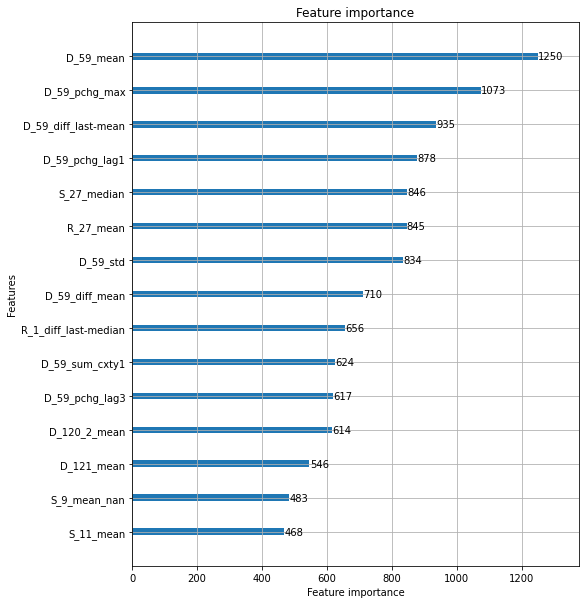

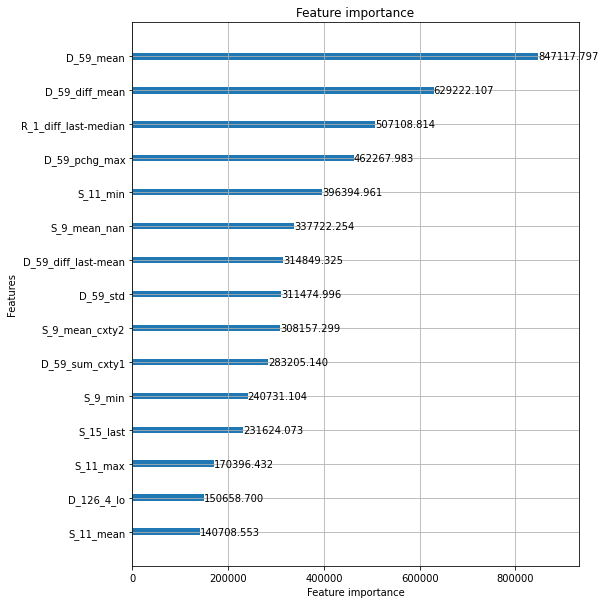

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997739
[100]	valid_0's auc: 0.998911
[150]	valid_0's auc: 0.999401
[200]	valid_0's auc: 0.999637
[250]	valid_0's auc: 0.999744
[300]	valid_0's auc: 0.999812
[350]	valid_0's auc: 0.999851
[400]	valid_0's auc: 0.999881
[450]	valid_0's auc: 0.9999
[500]	valid_0's auc: 0.999912
[550]	valid_0's auc: 0.999923
[600]	valid_0's auc: 0.99993
[650]	valid_0's auc: 0.999936
[700]	valid_0's auc: 0.99994
[750]	valid_0's auc: 0.999944
[800]	valid_0's auc: 0.999948
[850]	valid_0's auc: 0.999951
[900]	valid_0's auc: 0.999954
[950]	valid_0's auc: 0.999956
[1000]	valid_0's auc: 0.999957
[1050]	valid_0's auc: 0.999958
[1100]	valid_0's auc: 0.999959
[1150]	valid_0's auc: 0.99996
[1200]	valid_0's auc: 0.999961
[1250]	valid_0's auc: 0.999962
[1300]	valid_0's auc: 0.999963
[1350]	valid_0's auc: 0.999963
[1400]	valid_0's auc: 0.999964
[1450]	valid_0's auc: 0.999965
[1500]	valid_0's auc: 0.999965
[1550]	valid_0's auc: 0.999966
[1

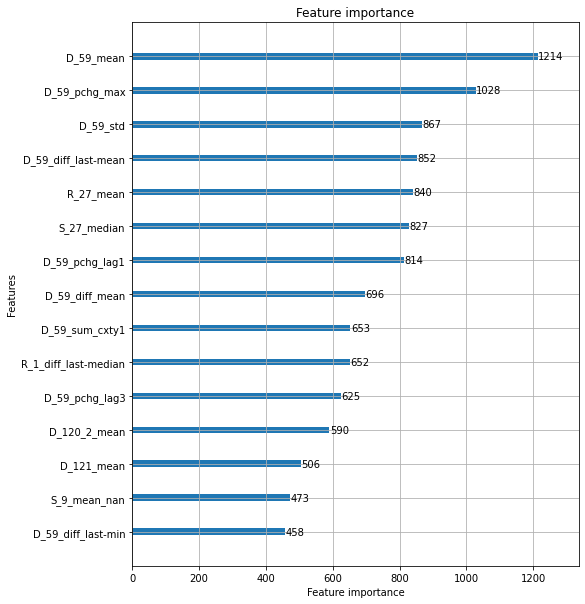

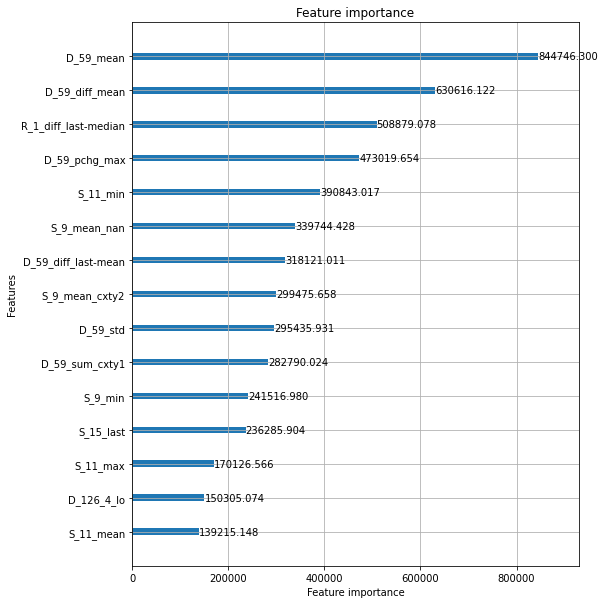

feature to remove: D_59_mean
Elapsed time: 11.089661900202433 min.
----------------------------------------------------------------------------------------------------
ITER: 22/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99705
[100]	valid_0's auc: 0.998634
[150]	valid_0's auc: 0.999208
[200]	valid_0's auc: 0.999488
[250]	valid_0's auc: 0.999634
[300]	valid_0's auc: 0.999729
[350]	valid_0's auc: 0.999796
[400]	valid_0's auc: 0.999828
[450]	valid_0's auc: 0.999854
[500]	valid_0's auc: 0.999874
[550]	valid_0's auc: 0.999889
[600]	valid_0's auc: 0.999901
[650]	valid_0's auc: 0.999908
[700]	valid_0's auc: 0.999915
[750]	valid_0's auc: 0.999922
[800]	valid_0's auc: 0.999927
[850]	valid_0's auc: 0.999931
[900]	valid_0's auc: 0.999935
[950]	valid_0's auc: 0.999938
[1000]	valid_0's auc: 0.999941
[1050]	valid_0's auc: 0.999945
[1100]	valid_0's auc: 0.999946
[1150]	valid_0's auc: 0.999948
[1200]	valid_0's auc: 0.999949
[1250]	valid_0's auc: 0.99995
[130

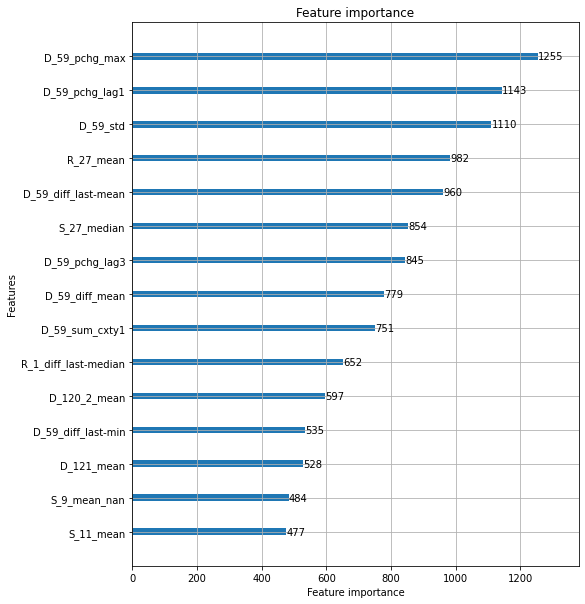

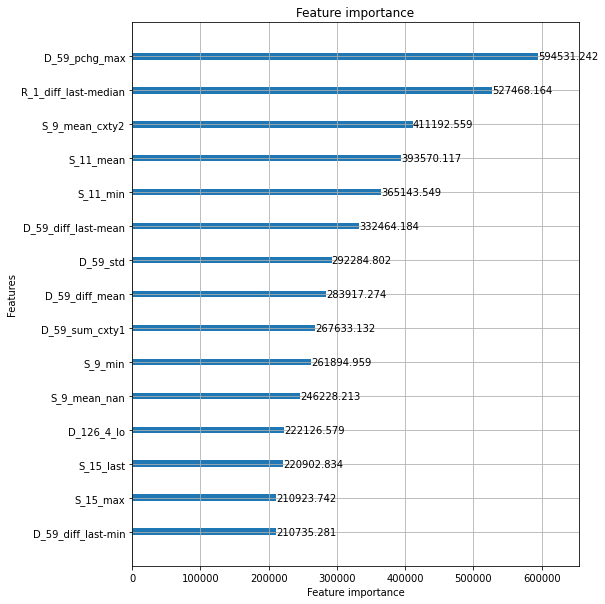

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997062
[100]	valid_0's auc: 0.998684
[150]	valid_0's auc: 0.999258
[200]	valid_0's auc: 0.999506
[250]	valid_0's auc: 0.999645
[300]	valid_0's auc: 0.999744
[350]	valid_0's auc: 0.999801
[400]	valid_0's auc: 0.999839
[450]	valid_0's auc: 0.999864
[500]	valid_0's auc: 0.99988
[550]	valid_0's auc: 0.999891
[600]	valid_0's auc: 0.999902
[650]	valid_0's auc: 0.99991
[700]	valid_0's auc: 0.999917
[750]	valid_0's auc: 0.999923
[800]	valid_0's auc: 0.999927
[850]	valid_0's auc: 0.999931
[900]	valid_0's auc: 0.999934
[950]	valid_0's auc: 0.999937
[1000]	valid_0's auc: 0.999939
[1050]	valid_0's auc: 0.999942
[1100]	valid_0's auc: 0.999944
[1150]	valid_0's auc: 0.999946
[1200]	valid_0's auc: 0.999947
[1250]	valid_0's auc: 0.999948
[1300]	valid_0's auc: 0.999949
[1350]	valid_0's auc: 0.999951
[1400]	valid_0's auc: 0.999952
[1450]	valid_0's auc: 0.999952
[1500]	valid_0's auc: 0.999952
[1550]	valid_0's auc: 0.999953

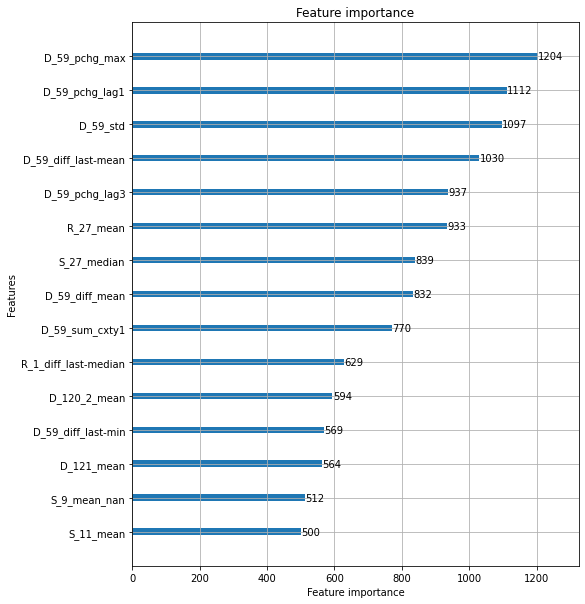

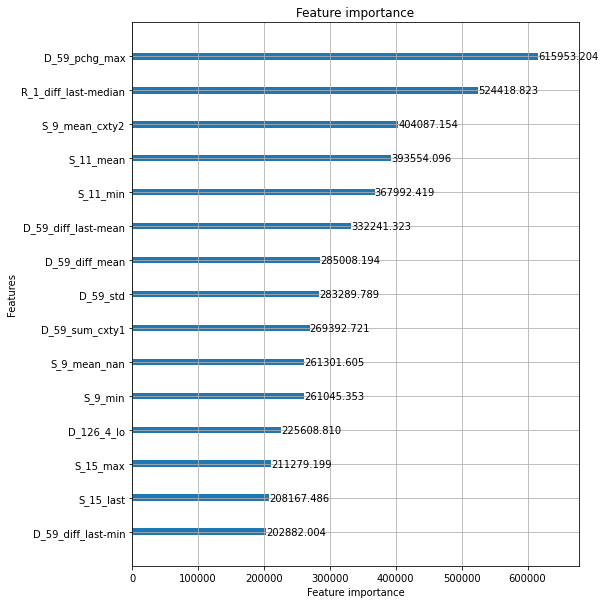

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.997091
[100]	valid_0's auc: 0.998664
[150]	valid_0's auc: 0.999222
[200]	valid_0's auc: 0.999504
[250]	valid_0's auc: 0.99966
[300]	valid_0's auc: 0.999751
[350]	valid_0's auc: 0.999809
[400]	valid_0's auc: 0.999843
[450]	valid_0's auc: 0.999867
[500]	valid_0's auc: 0.999886
[550]	valid_0's auc: 0.999899
[600]	valid_0's auc: 0.99991
[650]	valid_0's auc: 0.999918
[700]	valid_0's auc: 0.999925
[750]	valid_0's auc: 0.999931
[800]	valid_0's auc: 0.999934
[850]	valid_0's auc: 0.999938
[900]	valid_0's auc: 0.999941
[950]	valid_0's auc: 0.999943
[1000]	valid_0's auc: 0.999946
[1050]	valid_0's auc: 0.999949
[1100]	valid_0's auc: 0.99995
[1150]	valid_0's auc: 0.999951
[1200]	valid_0's auc: 0.999952
[1250]	valid_0's auc: 0.999953
[1300]	valid_0's auc: 0.999955
[1350]	valid_0's auc: 0.999955
[1400]	valid_0's auc: 0.999957
[1450]	valid_0's auc: 0.999958
[1500]	valid_0's auc: 0.999958
[1550]	valid_0's auc: 0.999959


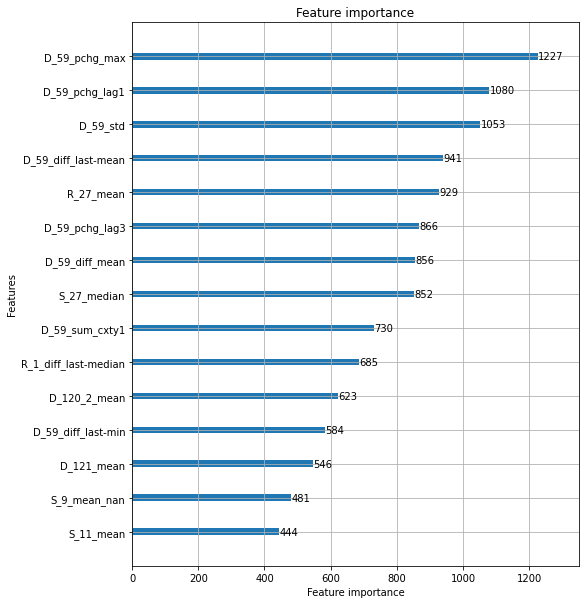

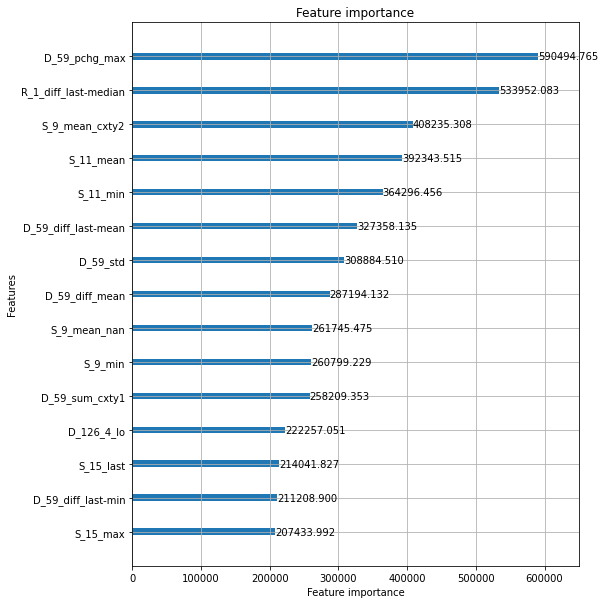

feature to remove: D_59_pchg_max
Elapsed time: 11.637888979911803 min.
----------------------------------------------------------------------------------------------------
ITER: 23/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.996334
[100]	valid_0's auc: 0.998384
[150]	valid_0's auc: 0.999134
[200]	valid_0's auc: 0.999428
[250]	valid_0's auc: 0.9996
[300]	valid_0's auc: 0.999696
[350]	valid_0's auc: 0.999769
[400]	valid_0's auc: 0.999812
[450]	valid_0's auc: 0.999843
[500]	valid_0's auc: 0.999864
[550]	valid_0's auc: 0.999879
[600]	valid_0's auc: 0.999891
[650]	valid_0's auc: 0.999902
[700]	valid_0's auc: 0.99991
[750]	valid_0's auc: 0.999915
[800]	valid_0's auc: 0.99992
[850]	valid_0's auc: 0.999925
[900]	valid_0's auc: 0.999929
[950]	valid_0's auc: 0.999932
[1000]	valid_0's auc: 0.999935
[1050]	valid_0's auc: 0.999937
[1100]	valid_0's auc: 0.999939
[1150]	valid_0's auc: 0.999941
[1200]	valid_0's auc: 0.999943
[1250]	valid_0's auc: 0.999944
[1

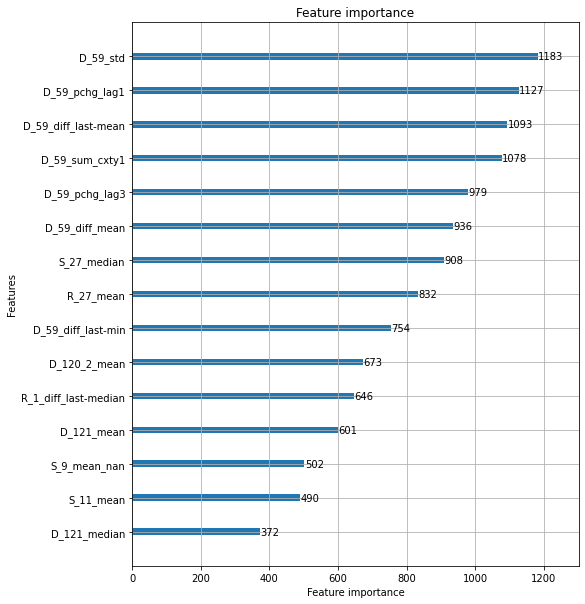

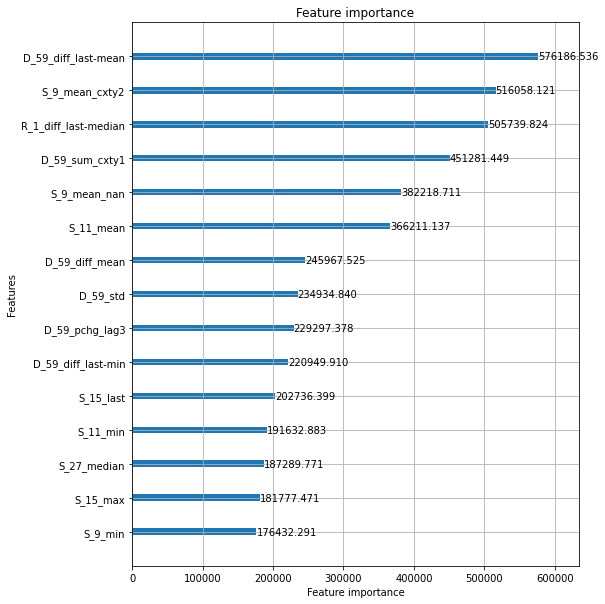

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.996297
[100]	valid_0's auc: 0.998402
[150]	valid_0's auc: 0.999142
[200]	valid_0's auc: 0.999439
[250]	valid_0's auc: 0.999619
[300]	valid_0's auc: 0.999715
[350]	valid_0's auc: 0.999779
[400]	valid_0's auc: 0.999825
[450]	valid_0's auc: 0.999852
[500]	valid_0's auc: 0.99987
[550]	valid_0's auc: 0.999883
[600]	valid_0's auc: 0.999894
[650]	valid_0's auc: 0.999903
[700]	valid_0's auc: 0.999908
[750]	valid_0's auc: 0.999914
[800]	valid_0's auc: 0.99992
[850]	valid_0's auc: 0.999925
[900]	valid_0's auc: 0.999927
[950]	valid_0's auc: 0.999931
[1000]	valid_0's auc: 0.999934
[1050]	valid_0's auc: 0.999935
[1100]	valid_0's auc: 0.999938
[1150]	valid_0's auc: 0.999939
[1200]	valid_0's auc: 0.999941
[1250]	valid_0's auc: 0.999942
[1300]	valid_0's auc: 0.999943
[1350]	valid_0's auc: 0.999944
[1400]	valid_0's auc: 0.999945
[1450]	valid_0's auc: 0.999946
[1500]	valid_0's auc: 0.999946
[1550]	valid_0's auc: 0.999947

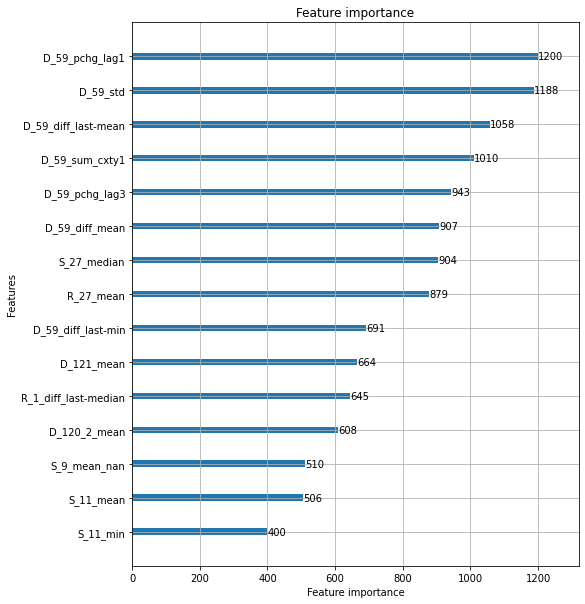

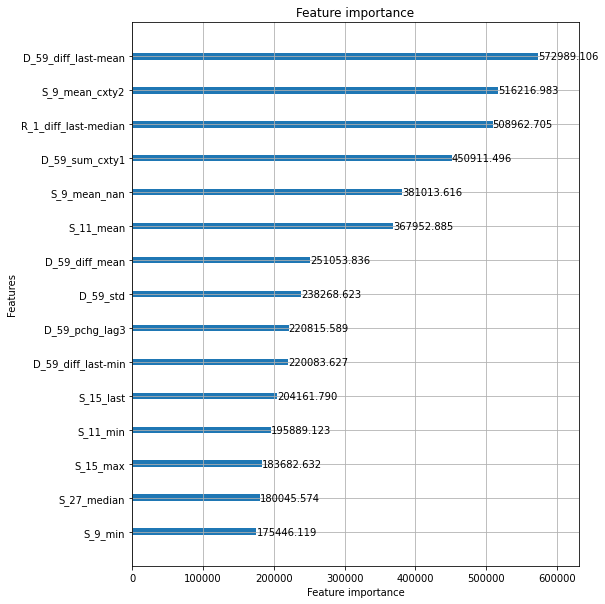

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.996394
[100]	valid_0's auc: 0.998384
[150]	valid_0's auc: 0.999159
[200]	valid_0's auc: 0.99945
[250]	valid_0's auc: 0.999613
[300]	valid_0's auc: 0.999711
[350]	valid_0's auc: 0.999784
[400]	valid_0's auc: 0.999821
[450]	valid_0's auc: 0.999852
[500]	valid_0's auc: 0.999868
[550]	valid_0's auc: 0.999884
[600]	valid_0's auc: 0.999896
[650]	valid_0's auc: 0.999906
[700]	valid_0's auc: 0.999913
[750]	valid_0's auc: 0.999919
[800]	valid_0's auc: 0.999924
[850]	valid_0's auc: 0.999928
[900]	valid_0's auc: 0.999931
[950]	valid_0's auc: 0.999934
[1000]	valid_0's auc: 0.999937
[1050]	valid_0's auc: 0.99994
[1100]	valid_0's auc: 0.999942
[1150]	valid_0's auc: 0.999943
[1200]	valid_0's auc: 0.999945
[1250]	valid_0's auc: 0.999946
[1300]	valid_0's auc: 0.999948
[1350]	valid_0's auc: 0.999948
[1400]	valid_0's auc: 0.999949
[1450]	valid_0's auc: 0.99995
[1500]	valid_0's auc: 0.999951
[1550]	valid_0's auc: 0.999952


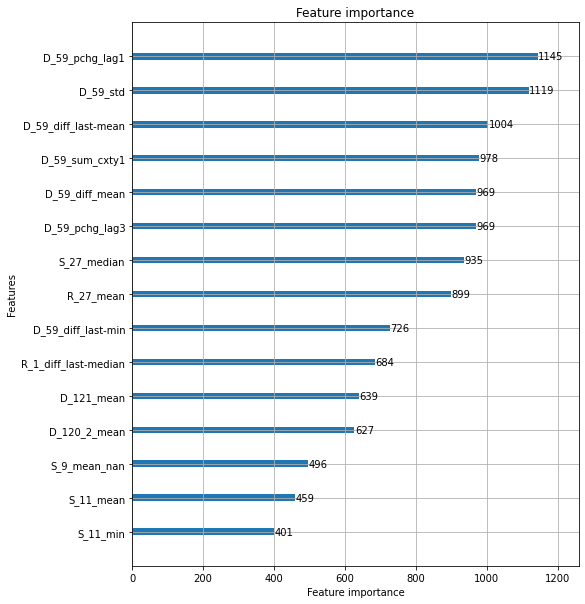

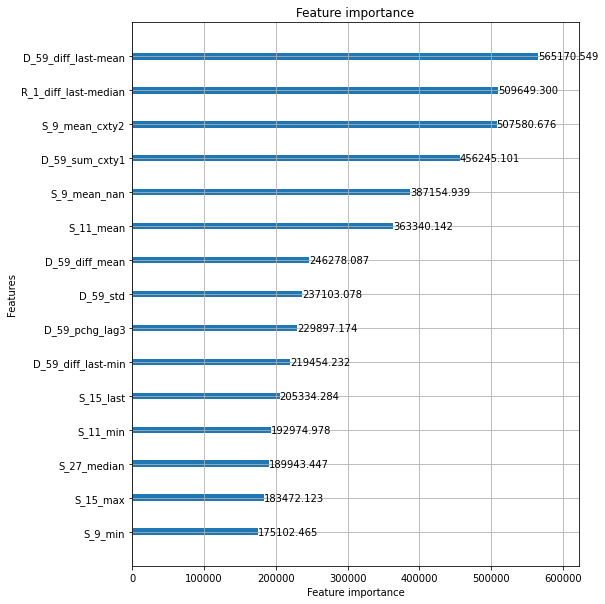

feature to remove: D_59_diff_last-mean
Elapsed time: 11.896261791388193 min.
----------------------------------------------------------------------------------------------------
ITER: 24/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.996103
[100]	valid_0's auc: 0.998243
[150]	valid_0's auc: 0.999019
[200]	valid_0's auc: 0.999324
[250]	valid_0's auc: 0.999567
[300]	valid_0's auc: 0.999677
[350]	valid_0's auc: 0.99975
[400]	valid_0's auc: 0.999801
[450]	valid_0's auc: 0.999828
[500]	valid_0's auc: 0.999853
[550]	valid_0's auc: 0.99987
[600]	valid_0's auc: 0.999884
[650]	valid_0's auc: 0.999895
[700]	valid_0's auc: 0.999903
[750]	valid_0's auc: 0.999908
[800]	valid_0's auc: 0.999912
[850]	valid_0's auc: 0.999918
[900]	valid_0's auc: 0.999922
[950]	valid_0's auc: 0.999925
[1000]	valid_0's auc: 0.999928
[1050]	valid_0's auc: 0.999931
[1100]	valid_0's auc: 0.999933
[1150]	valid_0's auc: 0.999934
[1200]	valid_0's auc: 0.999936
[1250]	valid_0's auc: 0.9

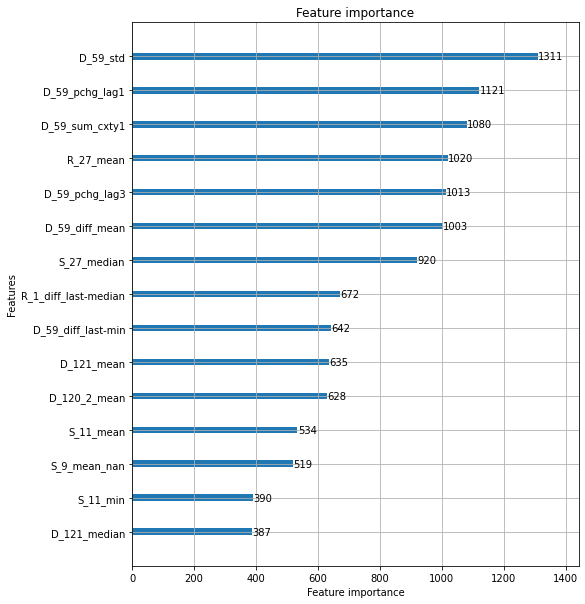

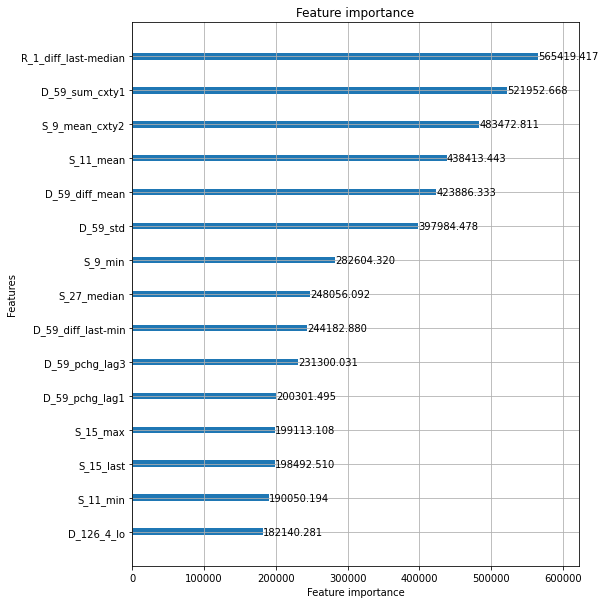

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.996046
[100]	valid_0's auc: 0.99825
[150]	valid_0's auc: 0.999038
[200]	valid_0's auc: 0.999336
[250]	valid_0's auc: 0.999579
[300]	valid_0's auc: 0.999681
[350]	valid_0's auc: 0.99975
[400]	valid_0's auc: 0.999798
[450]	valid_0's auc: 0.999828
[500]	valid_0's auc: 0.99985
[550]	valid_0's auc: 0.999868
[600]	valid_0's auc: 0.999883
[650]	valid_0's auc: 0.999892
[700]	valid_0's auc: 0.999901
[750]	valid_0's auc: 0.999906
[800]	valid_0's auc: 0.999911
[850]	valid_0's auc: 0.999916
[900]	valid_0's auc: 0.99992
[950]	valid_0's auc: 0.999923
[1000]	valid_0's auc: 0.999926
[1050]	valid_0's auc: 0.999928
[1100]	valid_0's auc: 0.99993
[1150]	valid_0's auc: 0.999932
[1200]	valid_0's auc: 0.999934
[1250]	valid_0's auc: 0.999936
[1300]	valid_0's auc: 0.999937
[1350]	valid_0's auc: 0.999938
[1400]	valid_0's auc: 0.99994
[1450]	valid_0's auc: 0.999941
[1500]	valid_0's auc: 0.999941
[1550]	valid_0's auc: 0.999942
[16

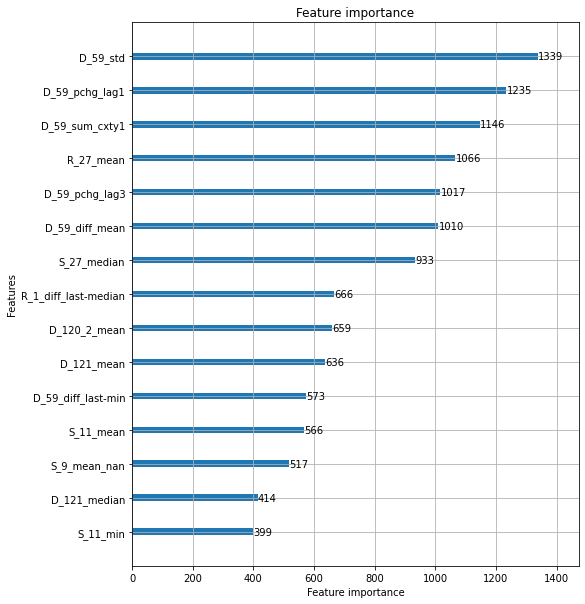

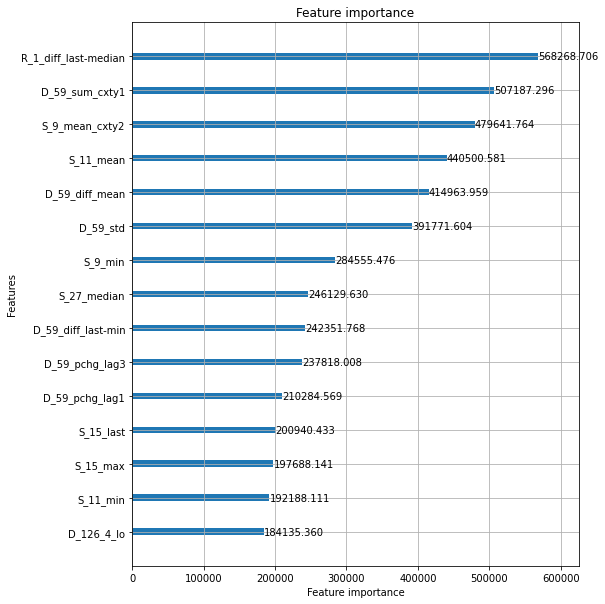

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.995973
[100]	valid_0's auc: 0.998255
[150]	valid_0's auc: 0.999016
[200]	valid_0's auc: 0.999331
[250]	valid_0's auc: 0.999577
[300]	valid_0's auc: 0.999691
[350]	valid_0's auc: 0.999759
[400]	valid_0's auc: 0.999805
[450]	valid_0's auc: 0.999834
[500]	valid_0's auc: 0.999854
[550]	valid_0's auc: 0.999871
[600]	valid_0's auc: 0.999887
[650]	valid_0's auc: 0.999898
[700]	valid_0's auc: 0.999905
[750]	valid_0's auc: 0.999912
[800]	valid_0's auc: 0.999918
[850]	valid_0's auc: 0.999922
[900]	valid_0's auc: 0.999926
[950]	valid_0's auc: 0.999929
[1000]	valid_0's auc: 0.999932
[1050]	valid_0's auc: 0.999934
[1100]	valid_0's auc: 0.999937
[1150]	valid_0's auc: 0.999939
[1200]	valid_0's auc: 0.99994
[1250]	valid_0's auc: 0.999942
[1300]	valid_0's auc: 0.999943
[1350]	valid_0's auc: 0.999944
[1400]	valid_0's auc: 0.999945
[1450]	valid_0's auc: 0.999946
[1500]	valid_0's auc: 0.999947
[1550]	valid_0's auc: 0.99994

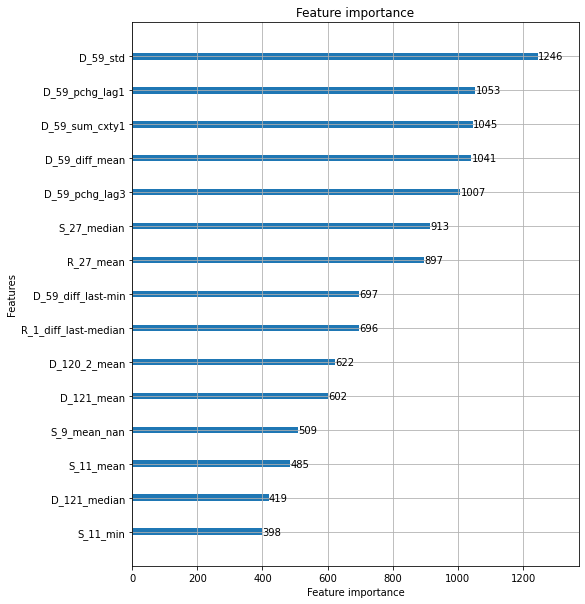

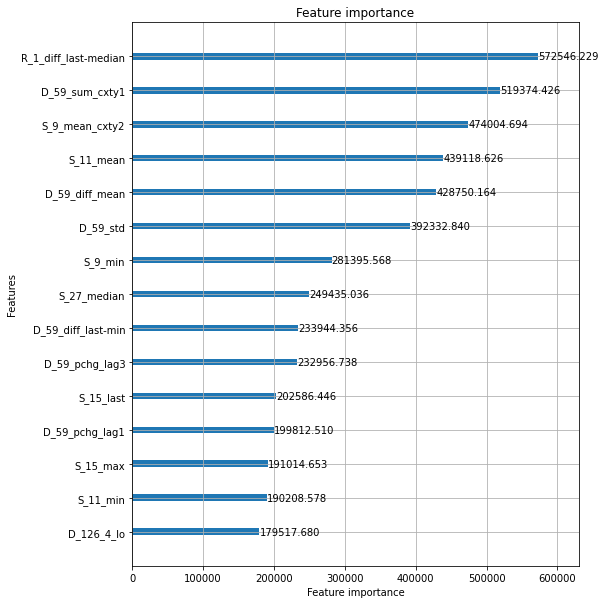

feature to remove: R_1_diff_last-median
Elapsed time: 12.104142574469249 min.
----------------------------------------------------------------------------------------------------
ITER: 25/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994526
[100]	valid_0's auc: 0.997689
[150]	valid_0's auc: 0.99874
[200]	valid_0's auc: 0.999163
[250]	valid_0's auc: 0.999407
[300]	valid_0's auc: 0.999549
[350]	valid_0's auc: 0.999636
[400]	valid_0's auc: 0.999704
[450]	valid_0's auc: 0.999751
[500]	valid_0's auc: 0.999782
[550]	valid_0's auc: 0.999811
[600]	valid_0's auc: 0.99983
[650]	valid_0's auc: 0.999845
[700]	valid_0's auc: 0.999857
[750]	valid_0's auc: 0.999869
[800]	valid_0's auc: 0.999879
[850]	valid_0's auc: 0.999885
[900]	valid_0's auc: 0.99989
[950]	valid_0's auc: 0.999895
[1000]	valid_0's auc: 0.9999
[1050]	valid_0's auc: 0.999903
[1100]	valid_0's auc: 0.999906
[1150]	valid_0's auc: 0.999908
[1200]	valid_0's auc: 0.99991
[1250]	valid_0's auc: 0.9999

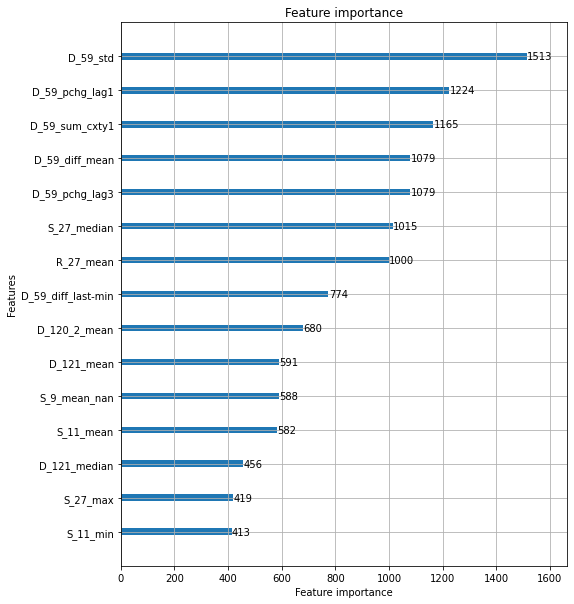

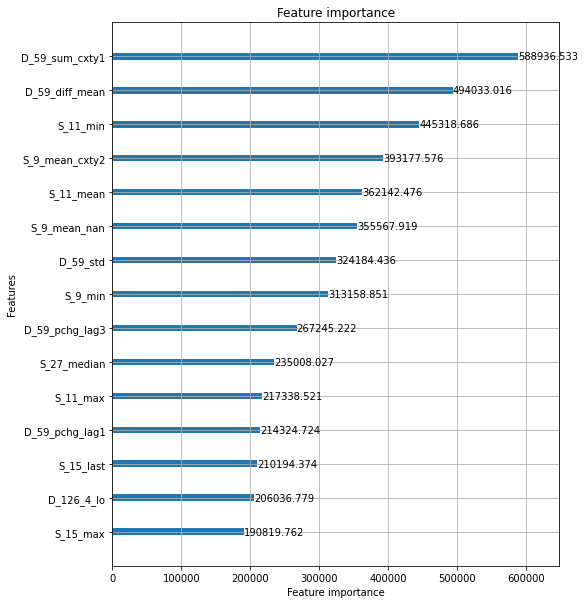

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994682
[100]	valid_0's auc: 0.99778
[150]	valid_0's auc: 0.998795
[200]	valid_0's auc: 0.999193
[250]	valid_0's auc: 0.999437
[300]	valid_0's auc: 0.999568
[350]	valid_0's auc: 0.99966
[400]	valid_0's auc: 0.999719
[450]	valid_0's auc: 0.999757
[500]	valid_0's auc: 0.999789
[550]	valid_0's auc: 0.999814
[600]	valid_0's auc: 0.99983
[650]	valid_0's auc: 0.999846
[700]	valid_0's auc: 0.999858
[750]	valid_0's auc: 0.999868
[800]	valid_0's auc: 0.999877
[850]	valid_0's auc: 0.999883
[900]	valid_0's auc: 0.999889
[950]	valid_0's auc: 0.999894
[1000]	valid_0's auc: 0.999898
[1050]	valid_0's auc: 0.999903
[1100]	valid_0's auc: 0.999905
[1150]	valid_0's auc: 0.999908
[1200]	valid_0's auc: 0.999911
[1250]	valid_0's auc: 0.999913
[1300]	valid_0's auc: 0.999915
[1350]	valid_0's auc: 0.999917
[1400]	valid_0's auc: 0.999918
[1450]	valid_0's auc: 0.999919
[1500]	valid_0's auc: 0.999921
[1550]	valid_0's auc: 0.999922


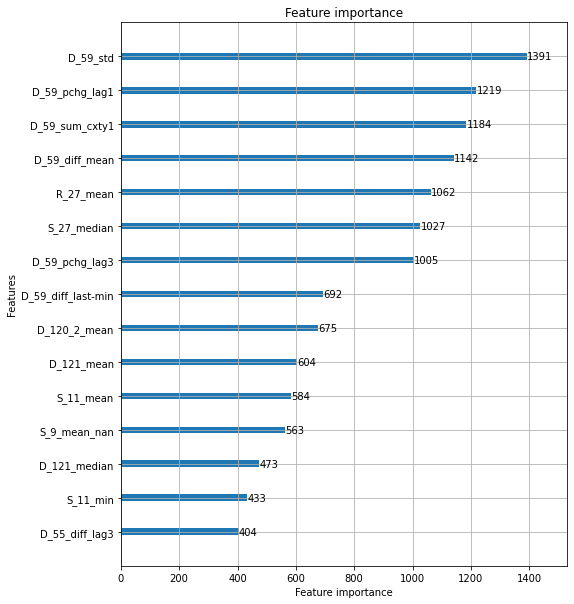

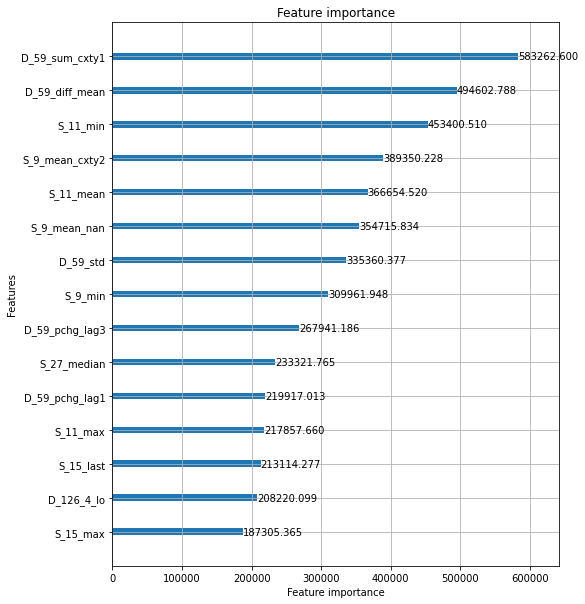

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994696
[100]	valid_0's auc: 0.997814
[150]	valid_0's auc: 0.998778
[200]	valid_0's auc: 0.999208
[250]	valid_0's auc: 0.999426
[300]	valid_0's auc: 0.999567
[350]	valid_0's auc: 0.999653
[400]	valid_0's auc: 0.999726
[450]	valid_0's auc: 0.999767
[500]	valid_0's auc: 0.999798
[550]	valid_0's auc: 0.999823
[600]	valid_0's auc: 0.999841
[650]	valid_0's auc: 0.999856
[700]	valid_0's auc: 0.999868
[750]	valid_0's auc: 0.999878
[800]	valid_0's auc: 0.999886
[850]	valid_0's auc: 0.999893
[900]	valid_0's auc: 0.999898
[950]	valid_0's auc: 0.999902
[1000]	valid_0's auc: 0.999907
[1050]	valid_0's auc: 0.999912
[1100]	valid_0's auc: 0.999914
[1150]	valid_0's auc: 0.999918
[1200]	valid_0's auc: 0.99992
[1250]	valid_0's auc: 0.999923
[1300]	valid_0's auc: 0.999925
[1350]	valid_0's auc: 0.999926
[1400]	valid_0's auc: 0.999928
[1450]	valid_0's auc: 0.999928
[1500]	valid_0's auc: 0.99993
[1550]	valid_0's auc: 0.999932

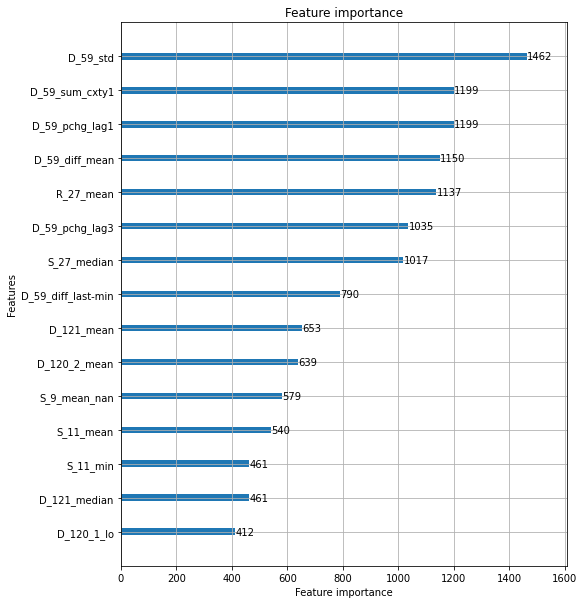

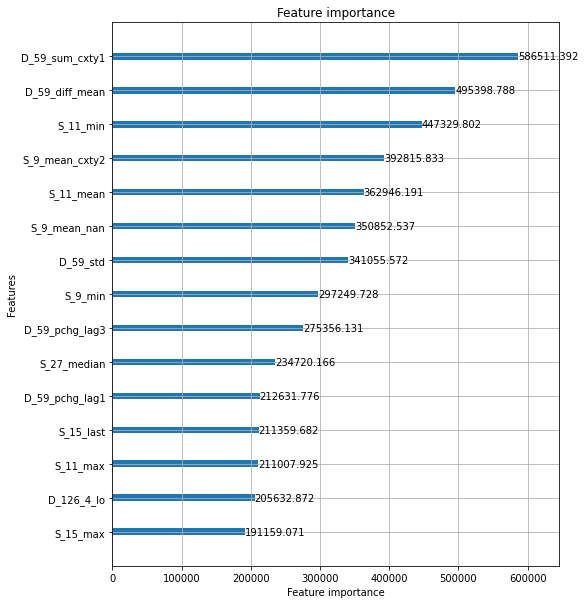

feature to remove: D_59_sum_cxty1
Elapsed time: 12.870866318543753 min.
----------------------------------------------------------------------------------------------------
ITER: 26/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.993815
[100]	valid_0's auc: 0.997712
[150]	valid_0's auc: 0.99871
[200]	valid_0's auc: 0.999125
[250]	valid_0's auc: 0.9994
[300]	valid_0's auc: 0.999552
[350]	valid_0's auc: 0.999636
[400]	valid_0's auc: 0.999704
[450]	valid_0's auc: 0.999738
[500]	valid_0's auc: 0.999771
[550]	valid_0's auc: 0.999795
[600]	valid_0's auc: 0.999818
[650]	valid_0's auc: 0.999833
[700]	valid_0's auc: 0.999847
[750]	valid_0's auc: 0.999856
[800]	valid_0's auc: 0.999864
[850]	valid_0's auc: 0.999871
[900]	valid_0's auc: 0.999877
[950]	valid_0's auc: 0.999882
[1000]	valid_0's auc: 0.999888
[1050]	valid_0's auc: 0.999891
[1100]	valid_0's auc: 0.999895
[1150]	valid_0's auc: 0.999898
[1200]	valid_0's auc: 0.999901
[1250]	valid_0's auc: 0.999904


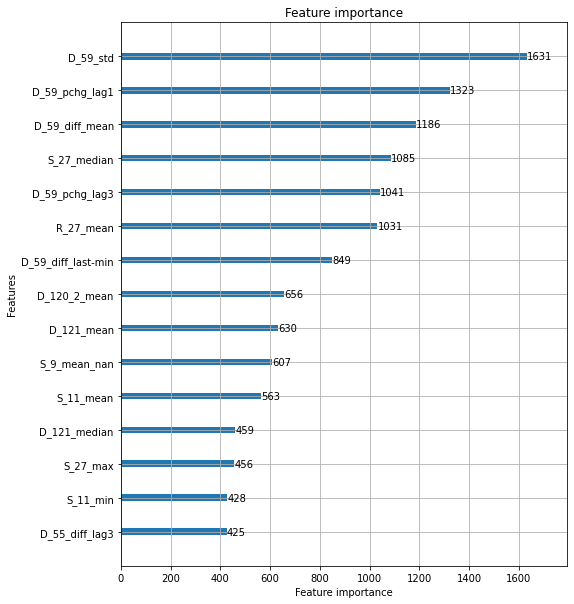

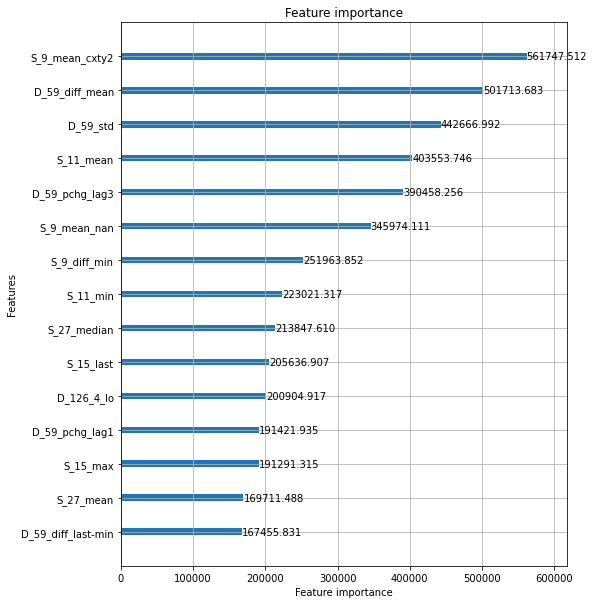

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994059
[100]	valid_0's auc: 0.99772
[150]	valid_0's auc: 0.998736
[200]	valid_0's auc: 0.999156
[250]	valid_0's auc: 0.999393
[300]	valid_0's auc: 0.999569
[350]	valid_0's auc: 0.999645
[400]	valid_0's auc: 0.999709
[450]	valid_0's auc: 0.999749
[500]	valid_0's auc: 0.999781
[550]	valid_0's auc: 0.9998
[600]	valid_0's auc: 0.999819
[650]	valid_0's auc: 0.999835
[700]	valid_0's auc: 0.999846
[750]	valid_0's auc: 0.999854
[800]	valid_0's auc: 0.999864
[850]	valid_0's auc: 0.99987
[900]	valid_0's auc: 0.999878
[950]	valid_0's auc: 0.999882
[1000]	valid_0's auc: 0.999886
[1050]	valid_0's auc: 0.99989
[1100]	valid_0's auc: 0.999894
[1150]	valid_0's auc: 0.999896
[1200]	valid_0's auc: 0.999898
[1250]	valid_0's auc: 0.9999
[1300]	valid_0's auc: 0.999903
[1350]	valid_0's auc: 0.999905
[1400]	valid_0's auc: 0.999906
[1450]	valid_0's auc: 0.999908
[1500]	valid_0's auc: 0.999909
[1550]	valid_0's auc: 0.999911
[160

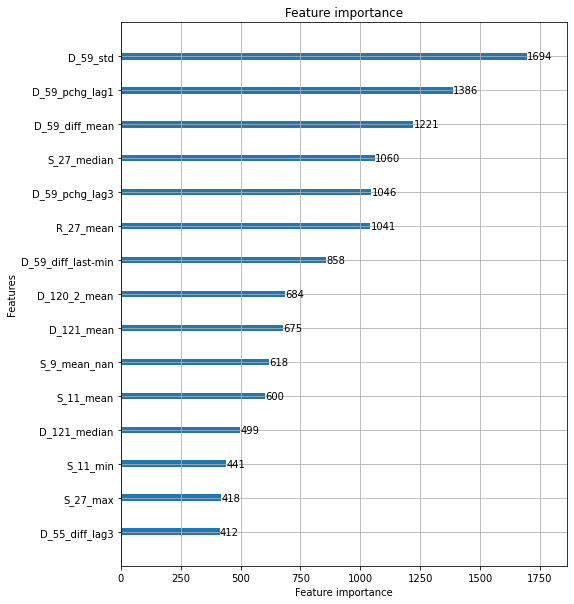

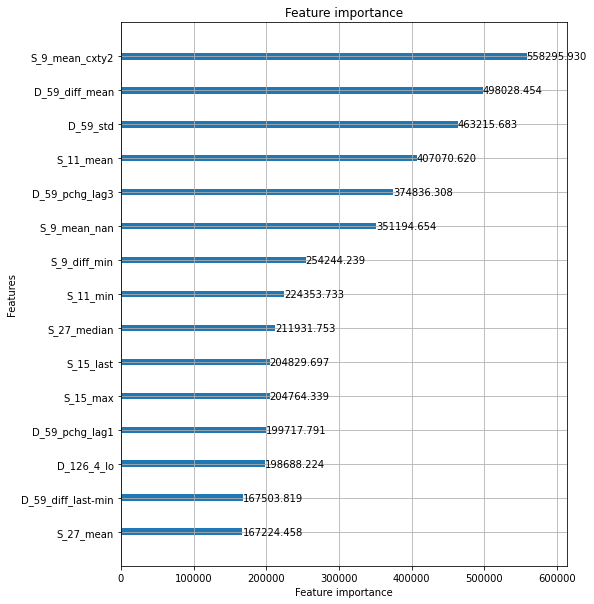

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994097
[100]	valid_0's auc: 0.99779
[150]	valid_0's auc: 0.998732
[200]	valid_0's auc: 0.999188
[250]	valid_0's auc: 0.999424
[300]	valid_0's auc: 0.999569
[350]	valid_0's auc: 0.999665
[400]	valid_0's auc: 0.999724
[450]	valid_0's auc: 0.999755
[500]	valid_0's auc: 0.999781
[550]	valid_0's auc: 0.999805
[600]	valid_0's auc: 0.999825
[650]	valid_0's auc: 0.99984
[700]	valid_0's auc: 0.999853
[750]	valid_0's auc: 0.999863
[800]	valid_0's auc: 0.999872
[850]	valid_0's auc: 0.99988
[900]	valid_0's auc: 0.999886
[950]	valid_0's auc: 0.999891
[1000]	valid_0's auc: 0.999894
[1050]	valid_0's auc: 0.999898
[1100]	valid_0's auc: 0.999902
[1150]	valid_0's auc: 0.999905
[1200]	valid_0's auc: 0.999908
[1250]	valid_0's auc: 0.99991
[1300]	valid_0's auc: 0.999912
[1350]	valid_0's auc: 0.999914
[1400]	valid_0's auc: 0.999916
[1450]	valid_0's auc: 0.999918
[1500]	valid_0's auc: 0.999919
[1550]	valid_0's auc: 0.99992
[1

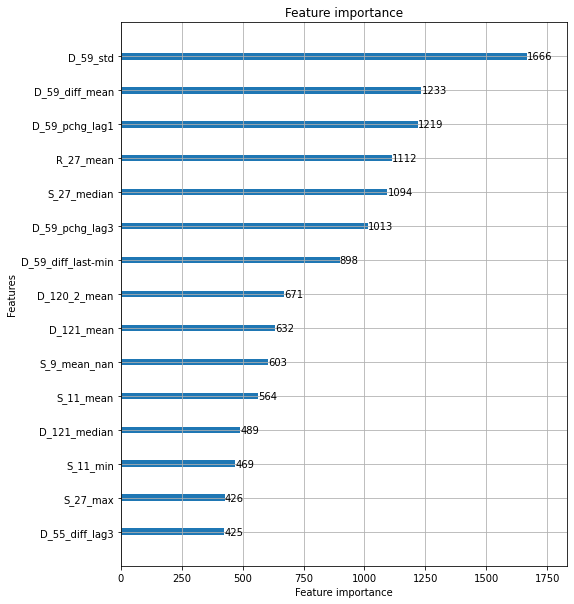

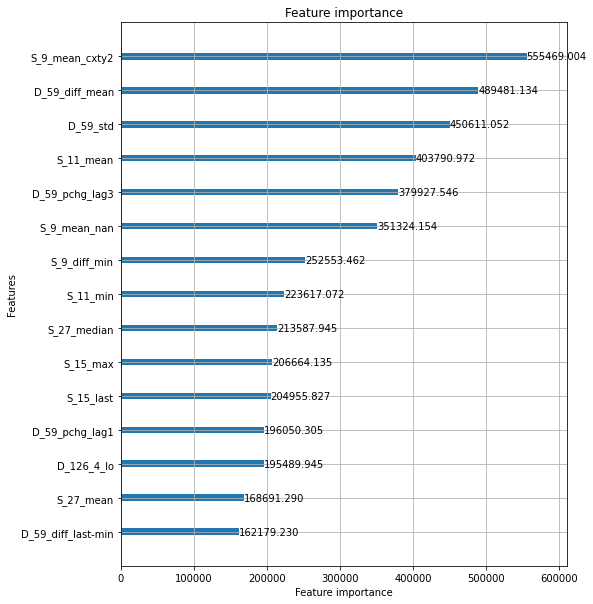

feature to remove: S_9_mean_cxty2
Elapsed time: 13.181466003259024 min.
----------------------------------------------------------------------------------------------------
ITER: 27/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994869
[100]	valid_0's auc: 0.997688
[150]	valid_0's auc: 0.99869
[200]	valid_0's auc: 0.999155
[250]	valid_0's auc: 0.999398
[300]	valid_0's auc: 0.999548
[350]	valid_0's auc: 0.999641
[400]	valid_0's auc: 0.999699
[450]	valid_0's auc: 0.999736
[500]	valid_0's auc: 0.999767
[550]	valid_0's auc: 0.999792
[600]	valid_0's auc: 0.999813
[650]	valid_0's auc: 0.999829
[700]	valid_0's auc: 0.99984
[750]	valid_0's auc: 0.999851
[800]	valid_0's auc: 0.999859
[850]	valid_0's auc: 0.999868
[900]	valid_0's auc: 0.999875
[950]	valid_0's auc: 0.999881
[1000]	valid_0's auc: 0.999886
[1050]	valid_0's auc: 0.99989
[1100]	valid_0's auc: 0.999895
[1150]	valid_0's auc: 0.999897
[1200]	valid_0's auc: 0.9999
[1250]	valid_0's auc: 0.999903
[1

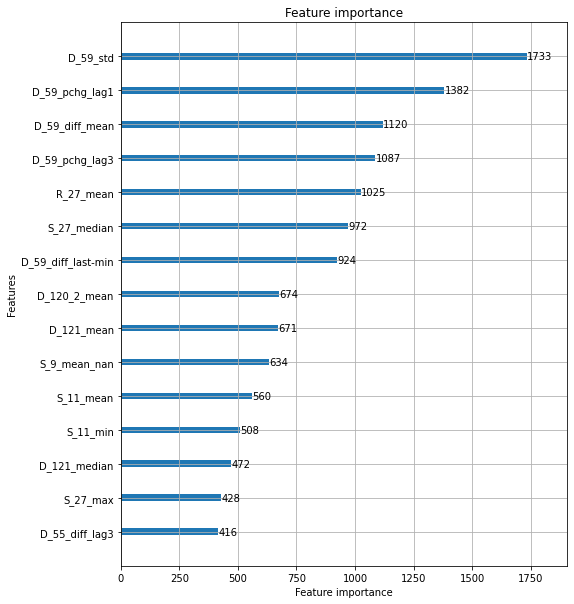

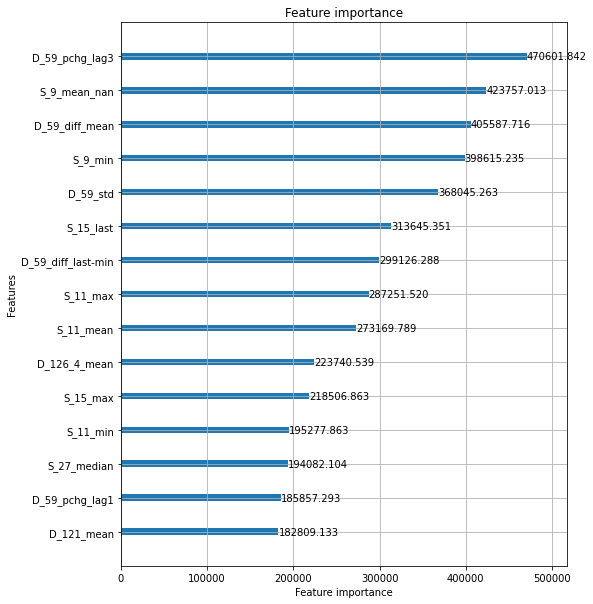

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994892
[100]	valid_0's auc: 0.997702
[150]	valid_0's auc: 0.998692
[200]	valid_0's auc: 0.999181
[250]	valid_0's auc: 0.999416
[300]	valid_0's auc: 0.999565
[350]	valid_0's auc: 0.999649
[400]	valid_0's auc: 0.999703
[450]	valid_0's auc: 0.999742
[500]	valid_0's auc: 0.999777
[550]	valid_0's auc: 0.999799
[600]	valid_0's auc: 0.999817
[650]	valid_0's auc: 0.999831
[700]	valid_0's auc: 0.999843
[750]	valid_0's auc: 0.999853
[800]	valid_0's auc: 0.999862
[850]	valid_0's auc: 0.999869
[900]	valid_0's auc: 0.999874
[950]	valid_0's auc: 0.999879
[1000]	valid_0's auc: 0.999883
[1050]	valid_0's auc: 0.999886
[1100]	valid_0's auc: 0.999892
[1150]	valid_0's auc: 0.999894
[1200]	valid_0's auc: 0.999898
[1250]	valid_0's auc: 0.9999
[1300]	valid_0's auc: 0.999903
[1350]	valid_0's auc: 0.999904
[1400]	valid_0's auc: 0.999905
[1450]	valid_0's auc: 0.999906
[1500]	valid_0's auc: 0.999908
[1550]	valid_0's auc: 0.99991


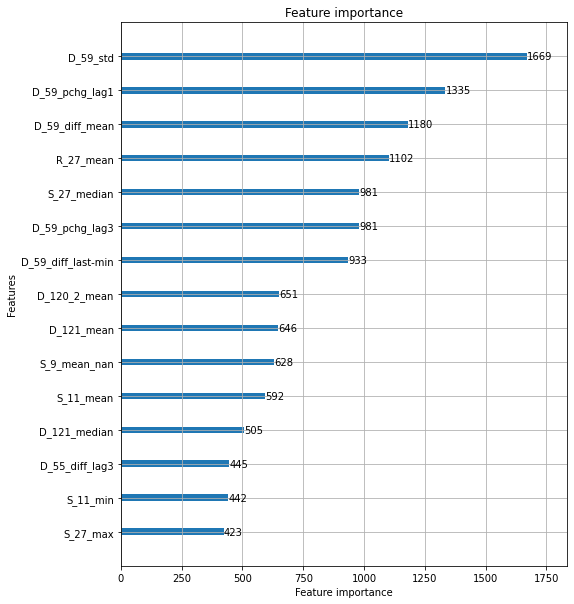

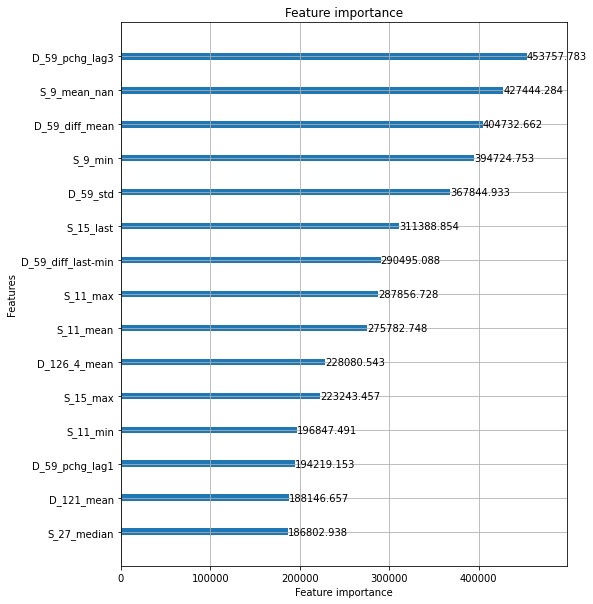

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994976
[100]	valid_0's auc: 0.997672
[150]	valid_0's auc: 0.998705
[200]	valid_0's auc: 0.999179
[250]	valid_0's auc: 0.999403
[300]	valid_0's auc: 0.999566
[350]	valid_0's auc: 0.999655
[400]	valid_0's auc: 0.999709
[450]	valid_0's auc: 0.999751
[500]	valid_0's auc: 0.999784
[550]	valid_0's auc: 0.999806
[600]	valid_0's auc: 0.999825
[650]	valid_0's auc: 0.999842
[700]	valid_0's auc: 0.999854
[750]	valid_0's auc: 0.999864
[800]	valid_0's auc: 0.99987
[850]	valid_0's auc: 0.999878
[900]	valid_0's auc: 0.999885
[950]	valid_0's auc: 0.99989
[1000]	valid_0's auc: 0.999894
[1050]	valid_0's auc: 0.999898
[1100]	valid_0's auc: 0.999902
[1150]	valid_0's auc: 0.999905
[1200]	valid_0's auc: 0.999907
[1250]	valid_0's auc: 0.99991
[1300]	valid_0's auc: 0.999912
[1350]	valid_0's auc: 0.999914
[1400]	valid_0's auc: 0.999916
[1450]	valid_0's auc: 0.999918
[1500]	valid_0's auc: 0.999919
[1550]	valid_0's auc: 0.99992
[

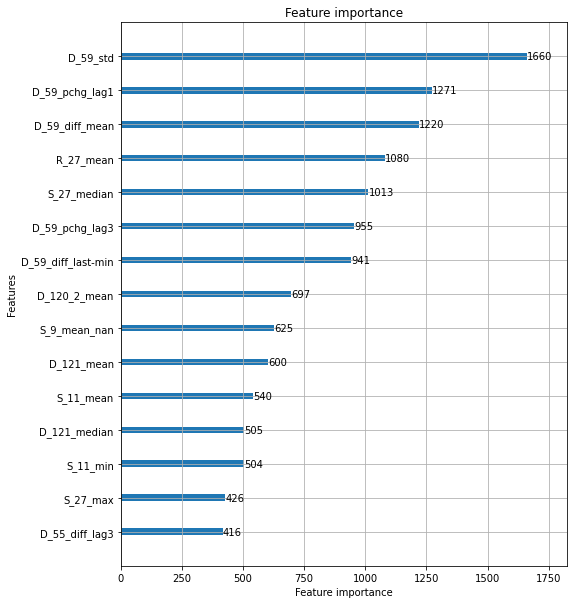

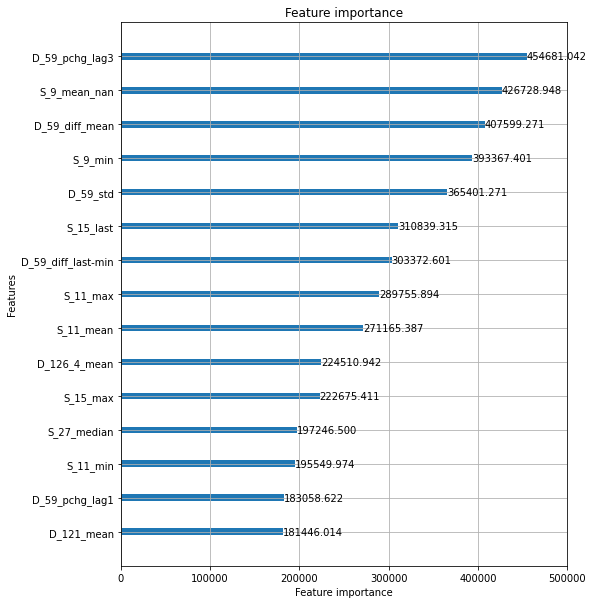

feature to remove: D_59_pchg_lag3
Elapsed time: 13.258449470996856 min.
----------------------------------------------------------------------------------------------------
ITER: 28/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994087
[100]	valid_0's auc: 0.997565
[150]	valid_0's auc: 0.998563
[200]	valid_0's auc: 0.998998
[250]	valid_0's auc: 0.999271
[300]	valid_0's auc: 0.999441
[350]	valid_0's auc: 0.999554
[400]	valid_0's auc: 0.999632
[450]	valid_0's auc: 0.999689
[500]	valid_0's auc: 0.999727
[550]	valid_0's auc: 0.999755
[600]	valid_0's auc: 0.99978
[650]	valid_0's auc: 0.999796
[700]	valid_0's auc: 0.999812
[750]	valid_0's auc: 0.999824
[800]	valid_0's auc: 0.999836
[850]	valid_0's auc: 0.999844
[900]	valid_0's auc: 0.999851
[950]	valid_0's auc: 0.999858
[1000]	valid_0's auc: 0.999864
[1050]	valid_0's auc: 0.999868
[1100]	valid_0's auc: 0.999872
[1150]	valid_0's auc: 0.999877
[1200]	valid_0's auc: 0.999879
[1250]	valid_0's auc: 0.99988

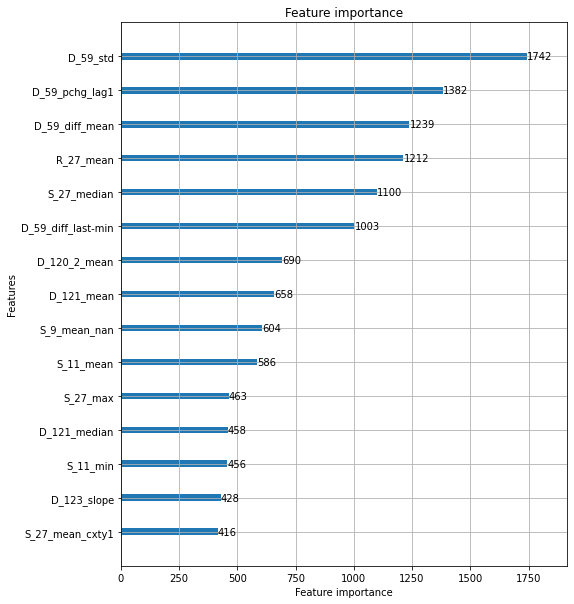

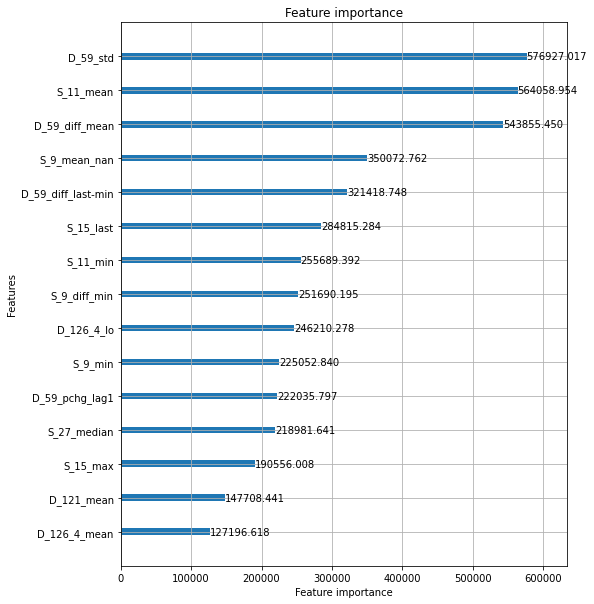

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994272
[100]	valid_0's auc: 0.997631
[150]	valid_0's auc: 0.998623
[200]	valid_0's auc: 0.999049
[250]	valid_0's auc: 0.999293
[300]	valid_0's auc: 0.999458
[350]	valid_0's auc: 0.999576
[400]	valid_0's auc: 0.999653
[450]	valid_0's auc: 0.9997
[500]	valid_0's auc: 0.999741
[550]	valid_0's auc: 0.999767
[600]	valid_0's auc: 0.999788
[650]	valid_0's auc: 0.999803
[700]	valid_0's auc: 0.999817
[750]	valid_0's auc: 0.99983
[800]	valid_0's auc: 0.999841
[850]	valid_0's auc: 0.999848
[900]	valid_0's auc: 0.999856
[950]	valid_0's auc: 0.999862
[1000]	valid_0's auc: 0.999866
[1050]	valid_0's auc: 0.999872
[1100]	valid_0's auc: 0.999876
[1150]	valid_0's auc: 0.99988
[1200]	valid_0's auc: 0.999882
[1250]	valid_0's auc: 0.999885
[1300]	valid_0's auc: 0.999887
[1350]	valid_0's auc: 0.999889
[1400]	valid_0's auc: 0.999891
[1450]	valid_0's auc: 0.999893
[1500]	valid_0's auc: 0.999894
[1550]	valid_0's auc: 0.999895
[

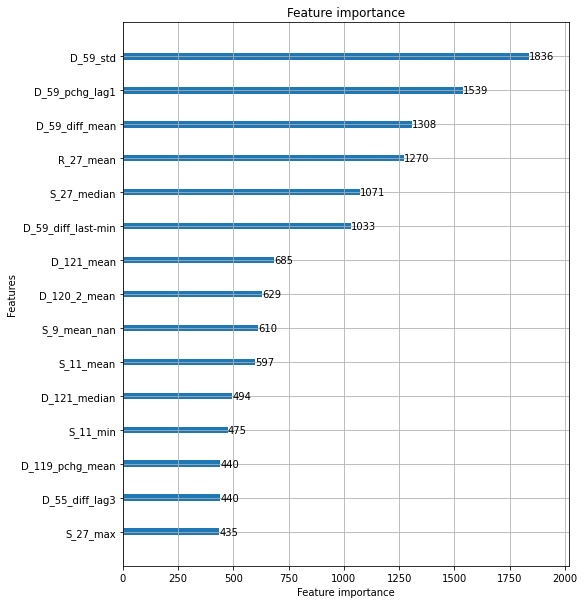

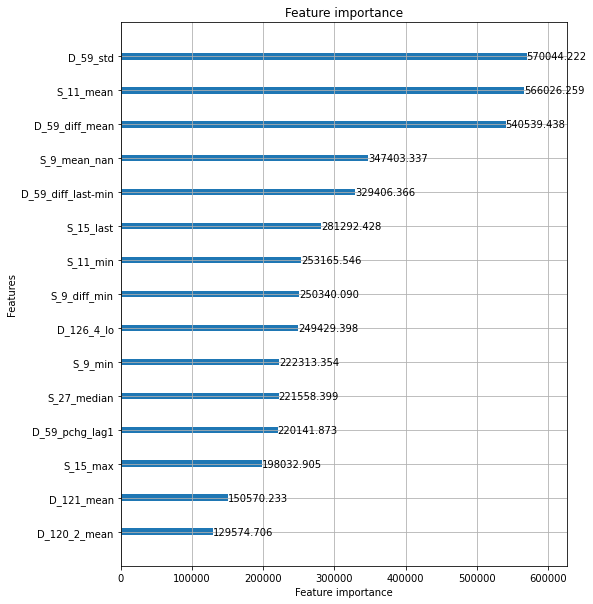

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.994435
[100]	valid_0's auc: 0.997678
[150]	valid_0's auc: 0.998653
[200]	valid_0's auc: 0.999093
[250]	valid_0's auc: 0.999317
[300]	valid_0's auc: 0.999467
[350]	valid_0's auc: 0.999582
[400]	valid_0's auc: 0.999654
[450]	valid_0's auc: 0.999707
[500]	valid_0's auc: 0.999743
[550]	valid_0's auc: 0.999768
[600]	valid_0's auc: 0.999787
[650]	valid_0's auc: 0.999806
[700]	valid_0's auc: 0.999822
[750]	valid_0's auc: 0.999834
[800]	valid_0's auc: 0.999845
[850]	valid_0's auc: 0.999853
[900]	valid_0's auc: 0.99986
[950]	valid_0's auc: 0.999866
[1000]	valid_0's auc: 0.999872
[1050]	valid_0's auc: 0.999875
[1100]	valid_0's auc: 0.99988
[1150]	valid_0's auc: 0.999884
[1200]	valid_0's auc: 0.999888
[1250]	valid_0's auc: 0.999891
[1300]	valid_0's auc: 0.999894
[1350]	valid_0's auc: 0.999896
[1400]	valid_0's auc: 0.999898
[1450]	valid_0's auc: 0.9999
[1500]	valid_0's auc: 0.999901
[1550]	valid_0's auc: 0.999903
[

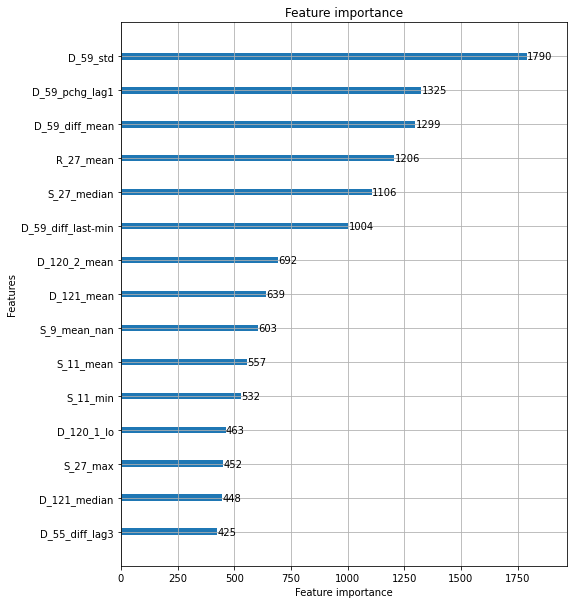

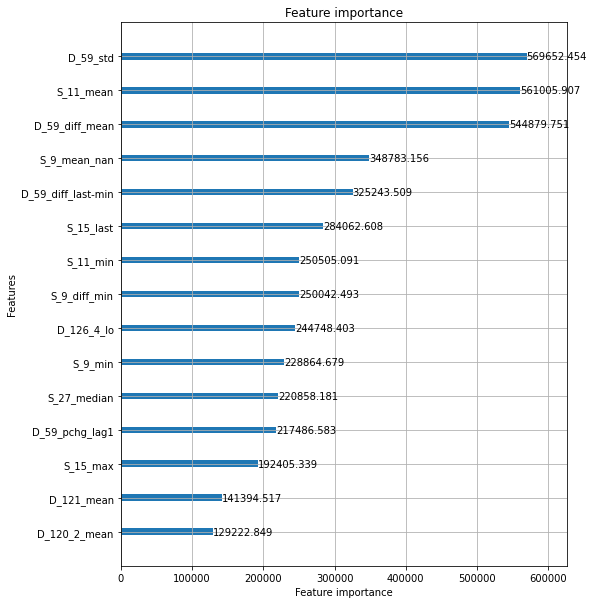

feature to remove: D_59_std
Elapsed time: 13.519206360975902 min.
----------------------------------------------------------------------------------------------------
ITER: 29/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.991884
[100]	valid_0's auc: 0.995868
[150]	valid_0's auc: 0.997663
[200]	valid_0's auc: 0.998555
[250]	valid_0's auc: 0.998994
[300]	valid_0's auc: 0.999223
[350]	valid_0's auc: 0.999382
[400]	valid_0's auc: 0.999495
[450]	valid_0's auc: 0.999567
[500]	valid_0's auc: 0.999609
[550]	valid_0's auc: 0.999653
[600]	valid_0's auc: 0.999687
[650]	valid_0's auc: 0.999711
[700]	valid_0's auc: 0.99973
[750]	valid_0's auc: 0.999747
[800]	valid_0's auc: 0.999766
[850]	valid_0's auc: 0.999776
[900]	valid_0's auc: 0.999787
[950]	valid_0's auc: 0.999796
[1000]	valid_0's auc: 0.999803
[1050]	valid_0's auc: 0.99981
[1100]	valid_0's auc: 0.999816
[1150]	valid_0's auc: 0.999821
[1200]	valid_0's auc: 0.999825
[1250]	valid_0's auc: 0.999831
[1300

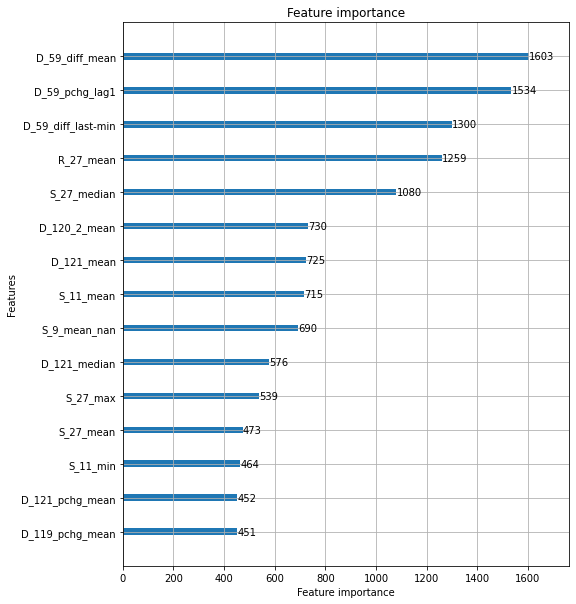

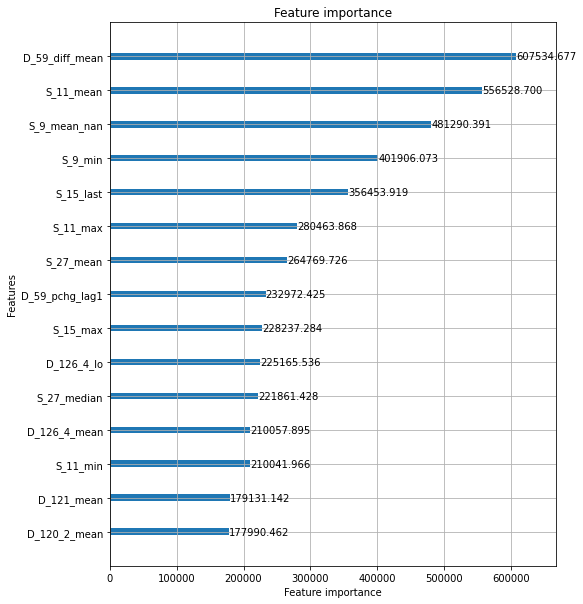

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.991856
[100]	valid_0's auc: 0.995983
[150]	valid_0's auc: 0.997779
[200]	valid_0's auc: 0.998656
[250]	valid_0's auc: 0.999033
[300]	valid_0's auc: 0.999263
[350]	valid_0's auc: 0.999423
[400]	valid_0's auc: 0.999532
[450]	valid_0's auc: 0.999595
[500]	valid_0's auc: 0.999639
[550]	valid_0's auc: 0.999674
[600]	valid_0's auc: 0.999705
[650]	valid_0's auc: 0.999728
[700]	valid_0's auc: 0.999747
[750]	valid_0's auc: 0.999763
[800]	valid_0's auc: 0.999778
[850]	valid_0's auc: 0.99979
[900]	valid_0's auc: 0.9998
[950]	valid_0's auc: 0.999808
[1000]	valid_0's auc: 0.999815
[1050]	valid_0's auc: 0.999821
[1100]	valid_0's auc: 0.999826
[1150]	valid_0's auc: 0.999832
[1200]	valid_0's auc: 0.999836
[1250]	valid_0's auc: 0.99984
[1300]	valid_0's auc: 0.999844
[1350]	valid_0's auc: 0.999846
[1400]	valid_0's auc: 0.99985
[1450]	valid_0's auc: 0.999854
[1500]	valid_0's auc: 0.999857
[1550]	valid_0's auc: 0.999859
[1

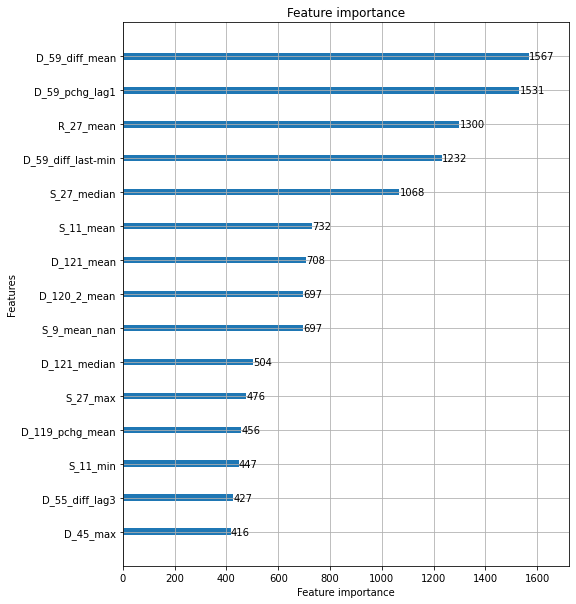

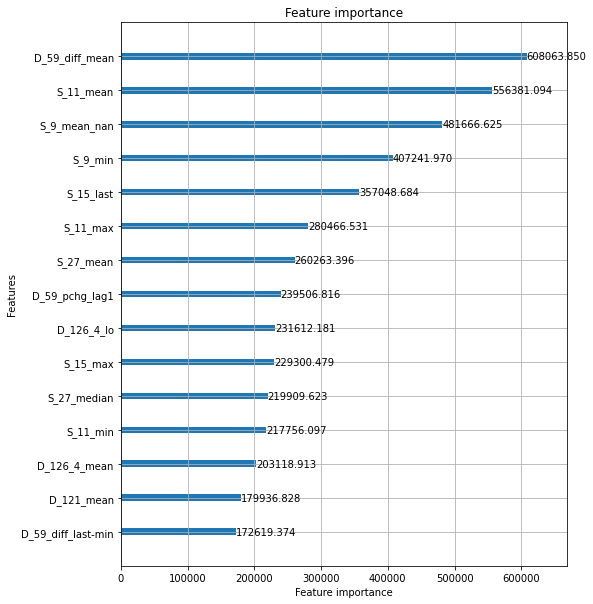

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.99157
[100]	valid_0's auc: 0.995973
[150]	valid_0's auc: 0.997744
[200]	valid_0's auc: 0.998576
[250]	valid_0's auc: 0.999044
[300]	valid_0's auc: 0.999237
[350]	valid_0's auc: 0.999421
[400]	valid_0's auc: 0.999522
[450]	valid_0's auc: 0.999595
[500]	valid_0's auc: 0.999644
[550]	valid_0's auc: 0.999685
[600]	valid_0's auc: 0.999717
[650]	valid_0's auc: 0.99974
[700]	valid_0's auc: 0.999757
[750]	valid_0's auc: 0.999771
[800]	valid_0's auc: 0.999785
[850]	valid_0's auc: 0.999797
[900]	valid_0's auc: 0.999806
[950]	valid_0's auc: 0.999816
[1000]	valid_0's auc: 0.999823
[1050]	valid_0's auc: 0.999828
[1100]	valid_0's auc: 0.999833
[1150]	valid_0's auc: 0.999838
[1200]	valid_0's auc: 0.999843
[1250]	valid_0's auc: 0.999848
[1300]	valid_0's auc: 0.999852
[1350]	valid_0's auc: 0.999855
[1400]	valid_0's auc: 0.999858
[1450]	valid_0's auc: 0.99986
[1500]	valid_0's auc: 0.999863
[1550]	valid_0's auc: 0.999866


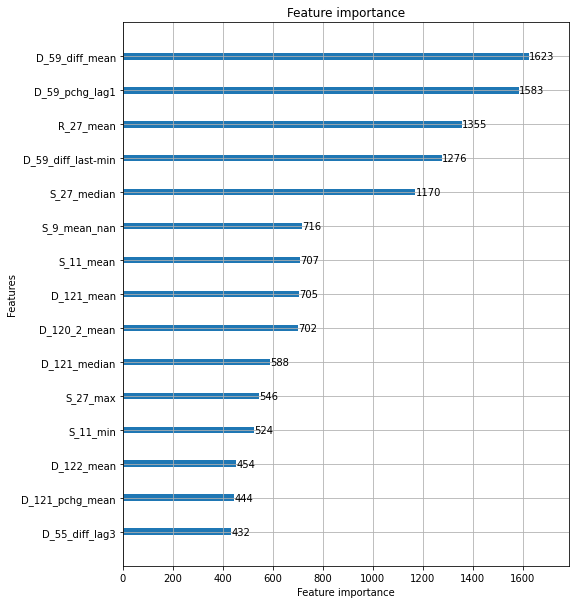

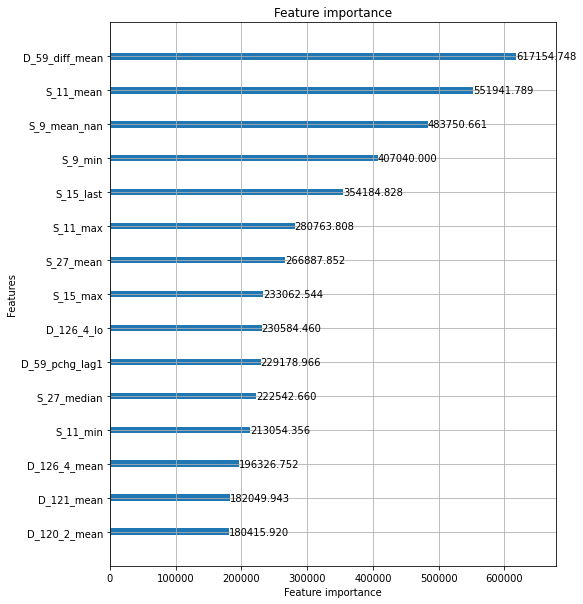

feature to remove: D_59_diff_mean
Elapsed time: 14.32350008090337 min.
----------------------------------------------------------------------------------------------------
ITER: 30/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.989121
[100]	valid_0's auc: 0.994436
[150]	valid_0's auc: 0.996794
[200]	valid_0's auc: 0.997957
[250]	valid_0's auc: 0.998542
[300]	valid_0's auc: 0.998849
[350]	valid_0's auc: 0.999063
[400]	valid_0's auc: 0.999189
[450]	valid_0's auc: 0.999319
[500]	valid_0's auc: 0.999393
[550]	valid_0's auc: 0.999452
[600]	valid_0's auc: 0.999497
[650]	valid_0's auc: 0.999538
[700]	valid_0's auc: 0.999573
[750]	valid_0's auc: 0.999599
[800]	valid_0's auc: 0.999618
[850]	valid_0's auc: 0.999639
[900]	valid_0's auc: 0.999656
[950]	valid_0's auc: 0.999672
[1000]	valid_0's auc: 0.999686
[1050]	valid_0's auc: 0.999698
[1100]	valid_0's auc: 0.999706
[1150]	valid_0's auc: 0.999715
[1200]	valid_0's auc: 0.999723
[1250]	valid_0's auc: 0.99972

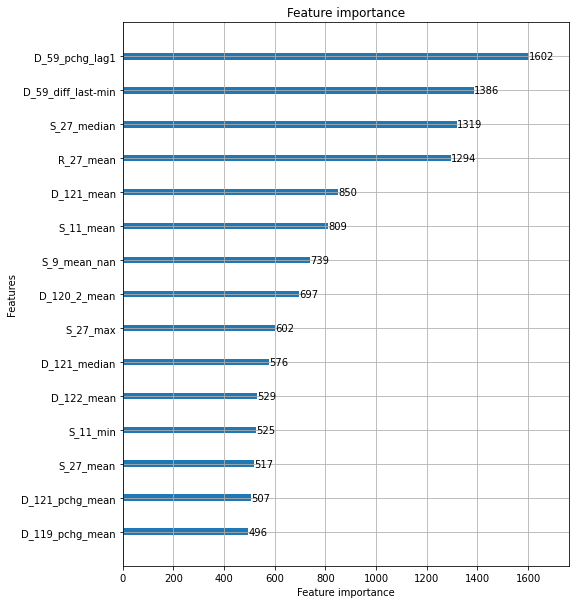

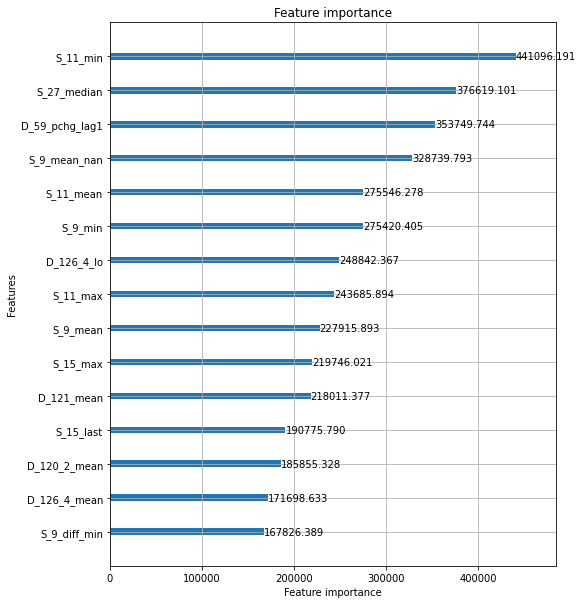

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.989223
[100]	valid_0's auc: 0.994576
[150]	valid_0's auc: 0.996839
[200]	valid_0's auc: 0.997876
[250]	valid_0's auc: 0.998516
[300]	valid_0's auc: 0.998847
[350]	valid_0's auc: 0.999077
[400]	valid_0's auc: 0.999206
[450]	valid_0's auc: 0.999333
[500]	valid_0's auc: 0.999416
[550]	valid_0's auc: 0.999467
[600]	valid_0's auc: 0.999516
[650]	valid_0's auc: 0.999555
[700]	valid_0's auc: 0.999586
[750]	valid_0's auc: 0.999618
[800]	valid_0's auc: 0.999643
[850]	valid_0's auc: 0.999661
[900]	valid_0's auc: 0.999674
[950]	valid_0's auc: 0.99969
[1000]	valid_0's auc: 0.999704
[1050]	valid_0's auc: 0.999718
[1100]	valid_0's auc: 0.999728
[1150]	valid_0's auc: 0.999734
[1200]	valid_0's auc: 0.999739
[1250]	valid_0's auc: 0.999747
[1300]	valid_0's auc: 0.999753
[1350]	valid_0's auc: 0.999758
[1400]	valid_0's auc: 0.999763
[1450]	valid_0's auc: 0.999768
[1500]	valid_0's auc: 0.999772
[1550]	valid_0's auc: 0.99977

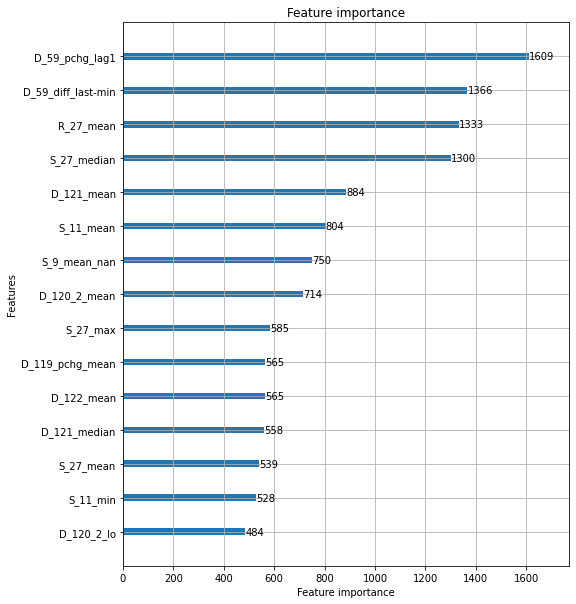

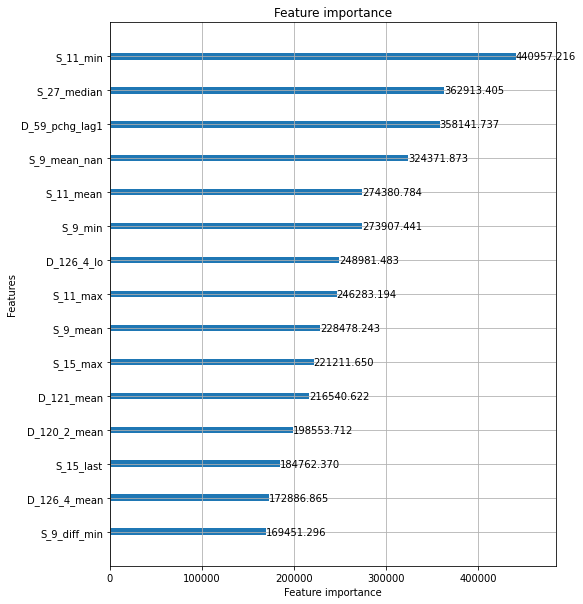

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.989069
[100]	valid_0's auc: 0.994482
[150]	valid_0's auc: 0.996892
[200]	valid_0's auc: 0.997908
[250]	valid_0's auc: 0.998585
[300]	valid_0's auc: 0.998893
[350]	valid_0's auc: 0.999123
[400]	valid_0's auc: 0.999243
[450]	valid_0's auc: 0.999348
[500]	valid_0's auc: 0.999424
[550]	valid_0's auc: 0.999485
[600]	valid_0's auc: 0.999531
[650]	valid_0's auc: 0.999572
[700]	valid_0's auc: 0.999601
[750]	valid_0's auc: 0.99963
[800]	valid_0's auc: 0.999651
[850]	valid_0's auc: 0.999673
[900]	valid_0's auc: 0.999684
[950]	valid_0's auc: 0.999698
[1000]	valid_0's auc: 0.999711
[1050]	valid_0's auc: 0.999721
[1100]	valid_0's auc: 0.99973
[1150]	valid_0's auc: 0.999737
[1200]	valid_0's auc: 0.999744
[1250]	valid_0's auc: 0.999749
[1300]	valid_0's auc: 0.999755
[1350]	valid_0's auc: 0.999762
[1400]	valid_0's auc: 0.999766
[1450]	valid_0's auc: 0.999769
[1500]	valid_0's auc: 0.999775
[1550]	valid_0's auc: 0.99978


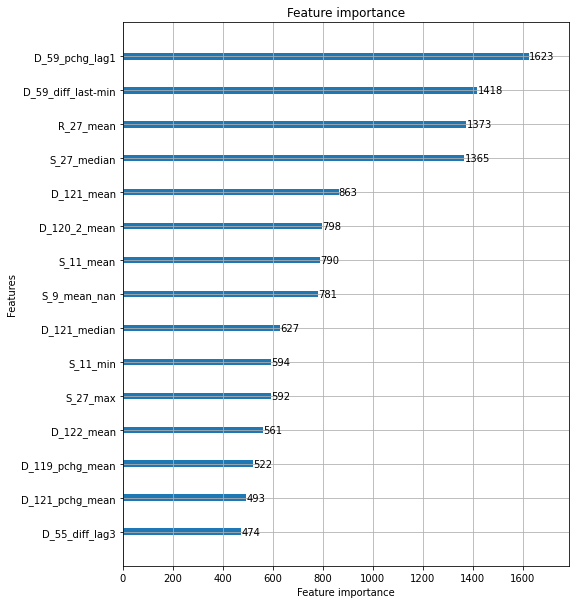

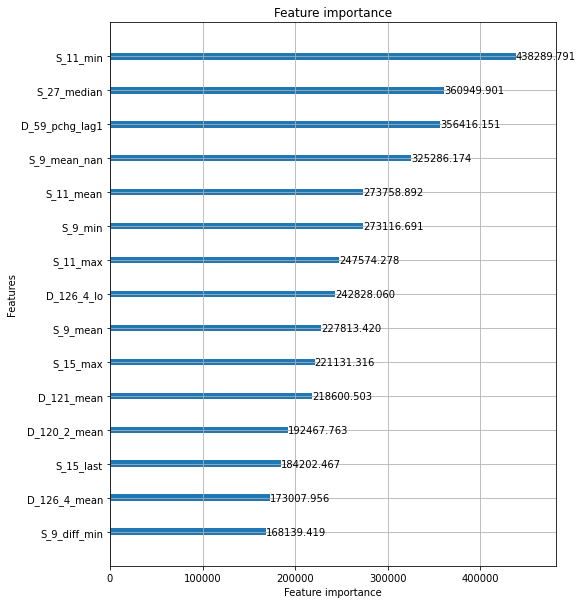

feature to remove: S_11_min
Elapsed time: 15.879688235123952 min.
----------------------------------------------------------------------------------------------------
ITER: 31/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.989751
[100]	valid_0's auc: 0.994168
[150]	valid_0's auc: 0.996703
[200]	valid_0's auc: 0.997801
[250]	valid_0's auc: 0.998478
[300]	valid_0's auc: 0.998768
[350]	valid_0's auc: 0.999003
[400]	valid_0's auc: 0.999158
[450]	valid_0's auc: 0.999274
[500]	valid_0's auc: 0.999371
[550]	valid_0's auc: 0.99943
[600]	valid_0's auc: 0.999471
[650]	valid_0's auc: 0.999513
[700]	valid_0's auc: 0.999543
[750]	valid_0's auc: 0.999567
[800]	valid_0's auc: 0.999594
[850]	valid_0's auc: 0.999615
[900]	valid_0's auc: 0.999635
[950]	valid_0's auc: 0.999651
[1000]	valid_0's auc: 0.999662
[1050]	valid_0's auc: 0.999676
[1100]	valid_0's auc: 0.999688
[1150]	valid_0's auc: 0.999698
[1200]	valid_0's auc: 0.999706
[1250]	valid_0's auc: 0.999716
[130

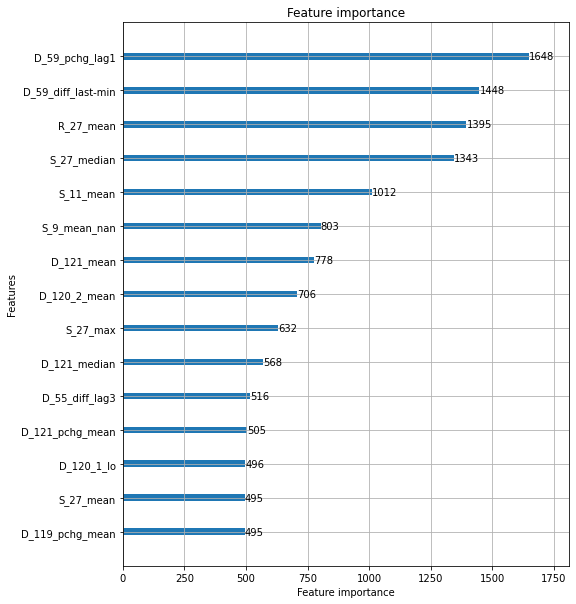

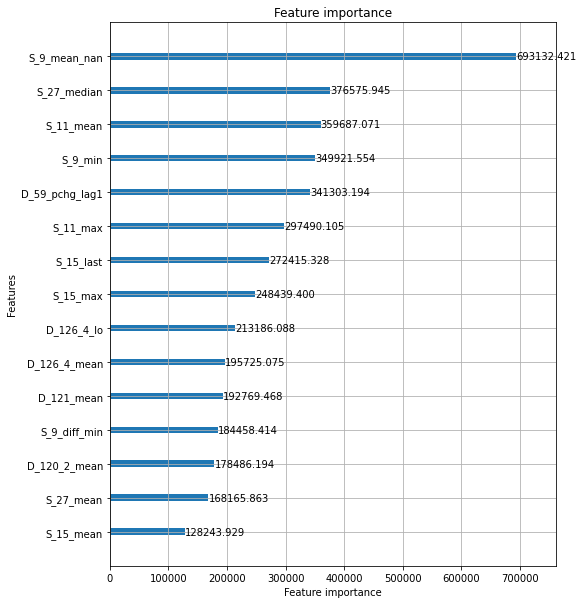

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.989783
[100]	valid_0's auc: 0.994287
[150]	valid_0's auc: 0.996747
[200]	valid_0's auc: 0.997866
[250]	valid_0's auc: 0.998469
[300]	valid_0's auc: 0.998796
[350]	valid_0's auc: 0.999018
[400]	valid_0's auc: 0.99918
[450]	valid_0's auc: 0.99929
[500]	valid_0's auc: 0.99938
[550]	valid_0's auc: 0.999435
[600]	valid_0's auc: 0.999481
[650]	valid_0's auc: 0.999524
[700]	valid_0's auc: 0.99956
[750]	valid_0's auc: 0.999585
[800]	valid_0's auc: 0.999609
[850]	valid_0's auc: 0.999631
[900]	valid_0's auc: 0.999651
[950]	valid_0's auc: 0.999666
[1000]	valid_0's auc: 0.999678
[1050]	valid_0's auc: 0.999691
[1100]	valid_0's auc: 0.999704
[1150]	valid_0's auc: 0.999715
[1200]	valid_0's auc: 0.999722
[1250]	valid_0's auc: 0.999728
[1300]	valid_0's auc: 0.999737
[1350]	valid_0's auc: 0.999745
[1400]	valid_0's auc: 0.99975
[1450]	valid_0's auc: 0.999754
[1500]	valid_0's auc: 0.999759
[1550]	valid_0's auc: 0.999765
[1

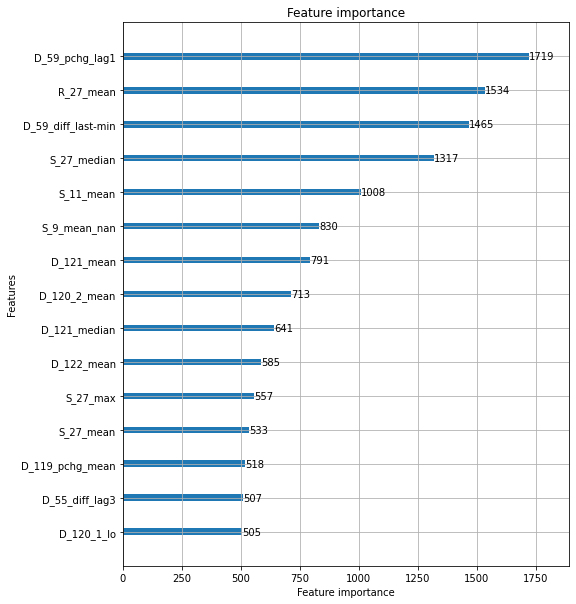

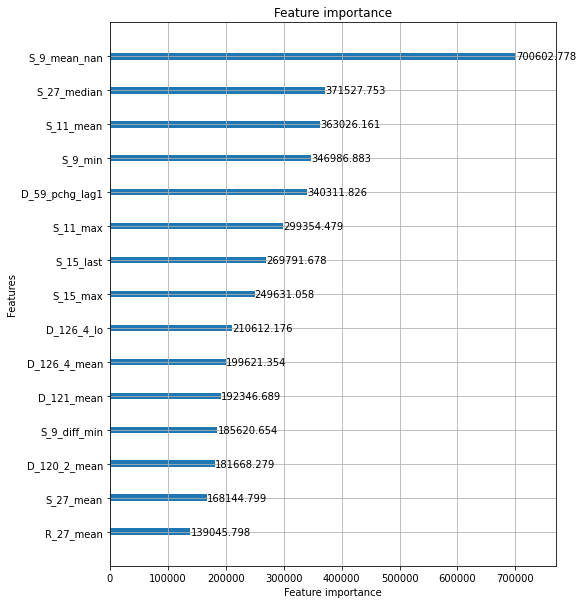

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.98991
[100]	valid_0's auc: 0.99426
[150]	valid_0's auc: 0.996776
[200]	valid_0's auc: 0.997887
[250]	valid_0's auc: 0.998465
[300]	valid_0's auc: 0.998805
[350]	valid_0's auc: 0.999049
[400]	valid_0's auc: 0.999203
[450]	valid_0's auc: 0.999318
[500]	valid_0's auc: 0.999411
[550]	valid_0's auc: 0.999471
[600]	valid_0's auc: 0.999514
[650]	valid_0's auc: 0.999559
[700]	valid_0's auc: 0.999585
[750]	valid_0's auc: 0.999607
[800]	valid_0's auc: 0.999631
[850]	valid_0's auc: 0.999655
[900]	valid_0's auc: 0.999669
[950]	valid_0's auc: 0.99969
[1000]	valid_0's auc: 0.999703
[1050]	valid_0's auc: 0.999713
[1100]	valid_0's auc: 0.999723
[1150]	valid_0's auc: 0.999734
[1200]	valid_0's auc: 0.999743
[1250]	valid_0's auc: 0.999748
[1300]	valid_0's auc: 0.999754
[1350]	valid_0's auc: 0.99976
[1400]	valid_0's auc: 0.999764
[1450]	valid_0's auc: 0.999768
[1500]	valid_0's auc: 0.999771
[1550]	valid_0's auc: 0.999777
[

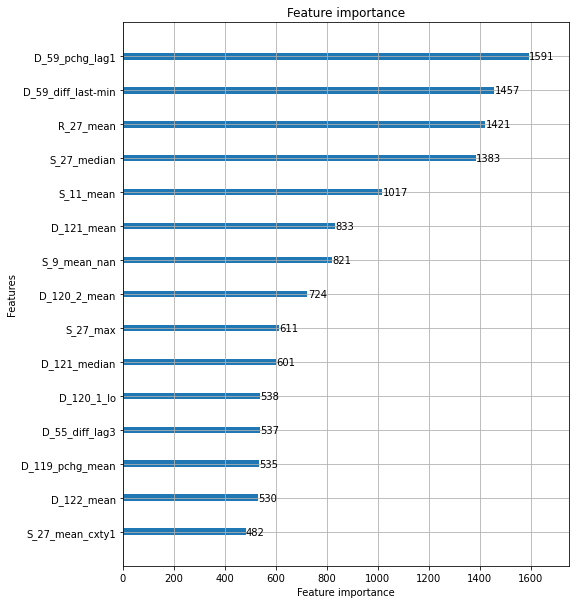

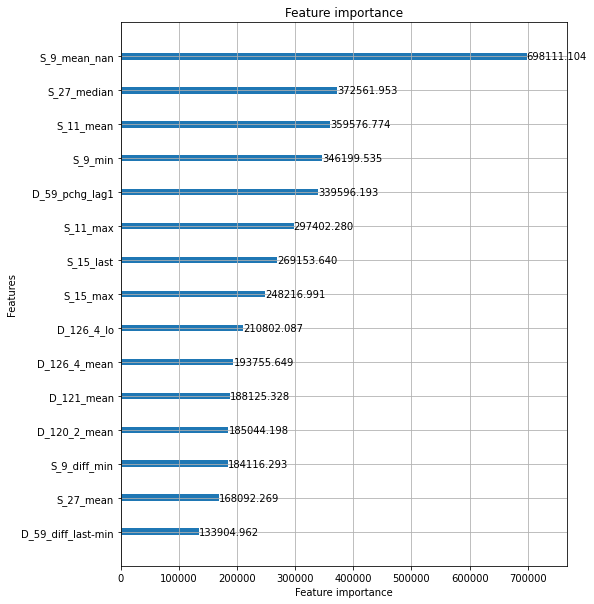

feature to remove: S_9_mean_nan
Elapsed time: 16.283207742373147 min.
----------------------------------------------------------------------------------------------------
ITER: 32/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.988866
[100]	valid_0's auc: 0.993197
[150]	valid_0's auc: 0.995161
[200]	valid_0's auc: 0.997032
[250]	valid_0's auc: 0.997925
[300]	valid_0's auc: 0.998423
[350]	valid_0's auc: 0.998757
[400]	valid_0's auc: 0.998947
[450]	valid_0's auc: 0.999077
[500]	valid_0's auc: 0.999191
[550]	valid_0's auc: 0.999271
[600]	valid_0's auc: 0.999335
[650]	valid_0's auc: 0.999391
[700]	valid_0's auc: 0.999428
[750]	valid_0's auc: 0.999465
[800]	valid_0's auc: 0.999497
[850]	valid_0's auc: 0.999522
[900]	valid_0's auc: 0.999547
[950]	valid_0's auc: 0.999569
[1000]	valid_0's auc: 0.99959
[1050]	valid_0's auc: 0.999605
[1100]	valid_0's auc: 0.999622
[1150]	valid_0's auc: 0.999631
[1200]	valid_0's auc: 0.999642
[1250]	valid_0's auc: 0.999653


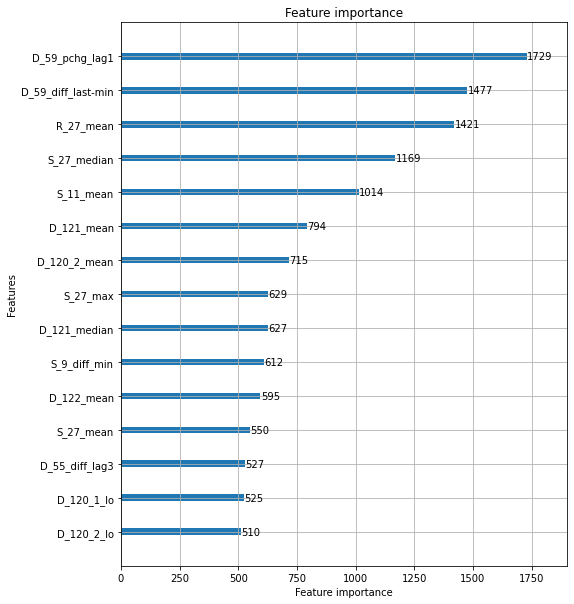

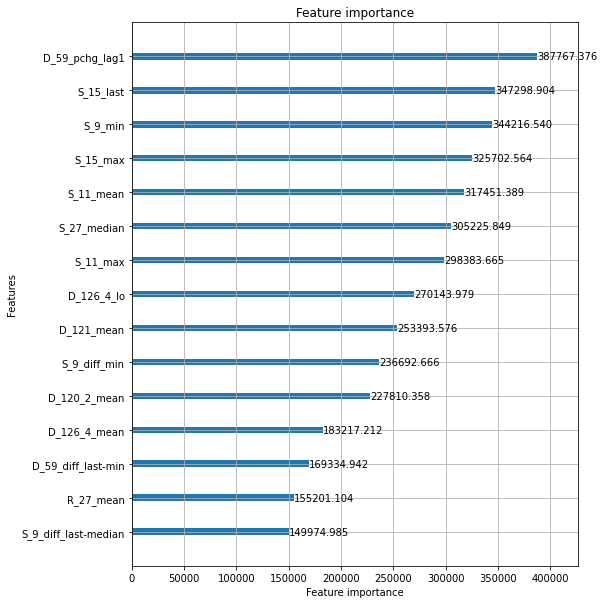

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.988583
[100]	valid_0's auc: 0.993469
[150]	valid_0's auc: 0.995325
[200]	valid_0's auc: 0.99725
[250]	valid_0's auc: 0.998059
[300]	valid_0's auc: 0.998519
[350]	valid_0's auc: 0.998787
[400]	valid_0's auc: 0.998998
[450]	valid_0's auc: 0.999139
[500]	valid_0's auc: 0.999227
[550]	valid_0's auc: 0.999313
[600]	valid_0's auc: 0.999367
[650]	valid_0's auc: 0.999423
[700]	valid_0's auc: 0.999461
[750]	valid_0's auc: 0.999494
[800]	valid_0's auc: 0.999528
[850]	valid_0's auc: 0.999555
[900]	valid_0's auc: 0.999579
[950]	valid_0's auc: 0.9996
[1000]	valid_0's auc: 0.999615
[1050]	valid_0's auc: 0.999632
[1100]	valid_0's auc: 0.999645
[1150]	valid_0's auc: 0.999654
[1200]	valid_0's auc: 0.999663
[1250]	valid_0's auc: 0.999677
[1300]	valid_0's auc: 0.999684
[1350]	valid_0's auc: 0.99969
[1400]	valid_0's auc: 0.999697
[1450]	valid_0's auc: 0.999704
[1500]	valid_0's auc: 0.99971
[1550]	valid_0's auc: 0.999716
[1

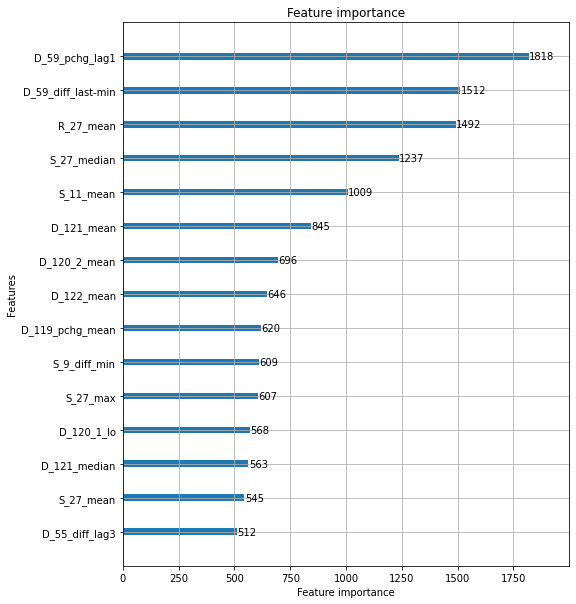

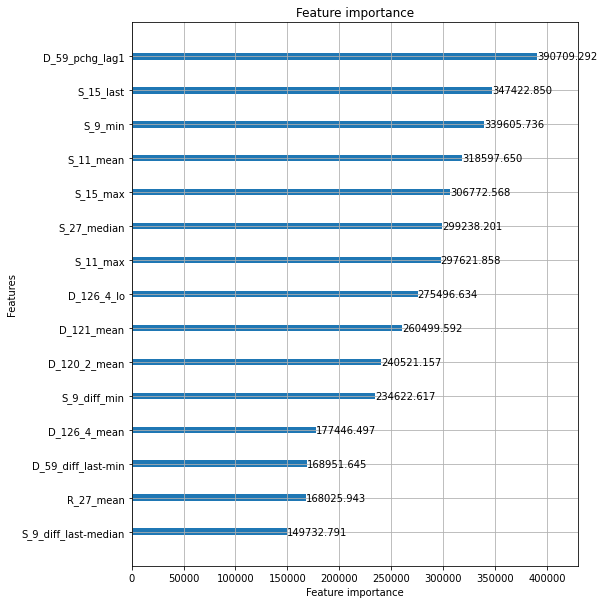

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.988845
[100]	valid_0's auc: 0.993522
[150]	valid_0's auc: 0.995392
[200]	valid_0's auc: 0.997166
[250]	valid_0's auc: 0.998029
[300]	valid_0's auc: 0.998536
[350]	valid_0's auc: 0.99883
[400]	valid_0's auc: 0.999007
[450]	valid_0's auc: 0.999141
[500]	valid_0's auc: 0.999233
[550]	valid_0's auc: 0.999319
[600]	valid_0's auc: 0.999377
[650]	valid_0's auc: 0.999425
[700]	valid_0's auc: 0.999469
[750]	valid_0's auc: 0.999507
[800]	valid_0's auc: 0.999536
[850]	valid_0's auc: 0.999563
[900]	valid_0's auc: 0.999583
[950]	valid_0's auc: 0.999605
[1000]	valid_0's auc: 0.999618
[1050]	valid_0's auc: 0.99963
[1100]	valid_0's auc: 0.999645
[1150]	valid_0's auc: 0.999658
[1200]	valid_0's auc: 0.999667
[1250]	valid_0's auc: 0.999675
[1300]	valid_0's auc: 0.999687
[1350]	valid_0's auc: 0.999693
[1400]	valid_0's auc: 0.999699
[1450]	valid_0's auc: 0.999707
[1500]	valid_0's auc: 0.999714
[1550]	valid_0's auc: 0.99972


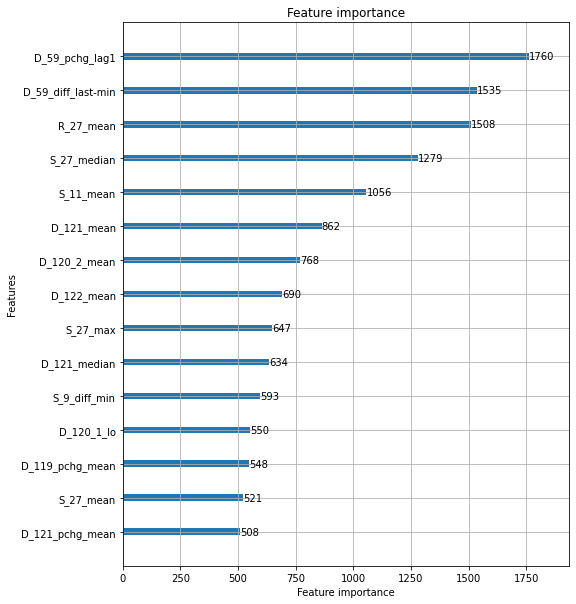

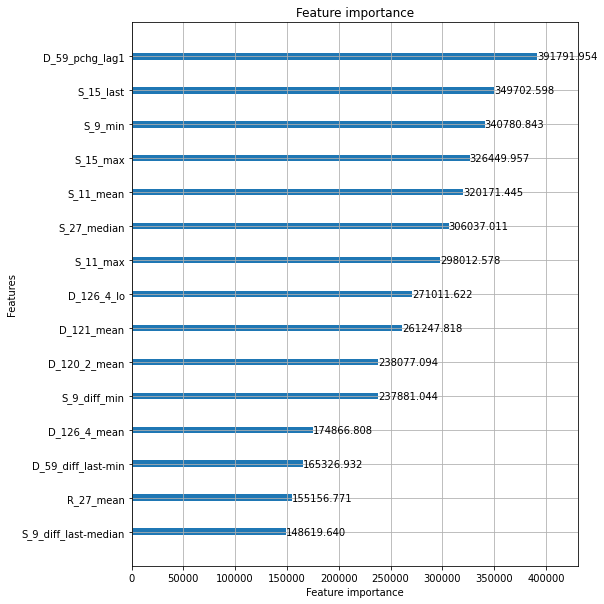

feature to remove: D_59_pchg_lag1
Elapsed time: 16.880808834234873 min.
----------------------------------------------------------------------------------------------------
ITER: 33/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.986444
[100]	valid_0's auc: 0.991549
[150]	valid_0's auc: 0.99431
[200]	valid_0's auc: 0.995905
[250]	valid_0's auc: 0.997167
[300]	valid_0's auc: 0.997794
[350]	valid_0's auc: 0.998197
[400]	valid_0's auc: 0.998485
[450]	valid_0's auc: 0.998664
[500]	valid_0's auc: 0.998811
[550]	valid_0's auc: 0.998922
[600]	valid_0's auc: 0.999041
[650]	valid_0's auc: 0.999115
[700]	valid_0's auc: 0.9992
[750]	valid_0's auc: 0.999238
[800]	valid_0's auc: 0.99929
[850]	valid_0's auc: 0.999327
[900]	valid_0's auc: 0.999358
[950]	valid_0's auc: 0.999383
[1000]	valid_0's auc: 0.999409
[1050]	valid_0's auc: 0.999438
[1100]	valid_0's auc: 0.999455
[1150]	valid_0's auc: 0.99947
[1200]	valid_0's auc: 0.999486
[1250]	valid_0's auc: 0.999505
[1

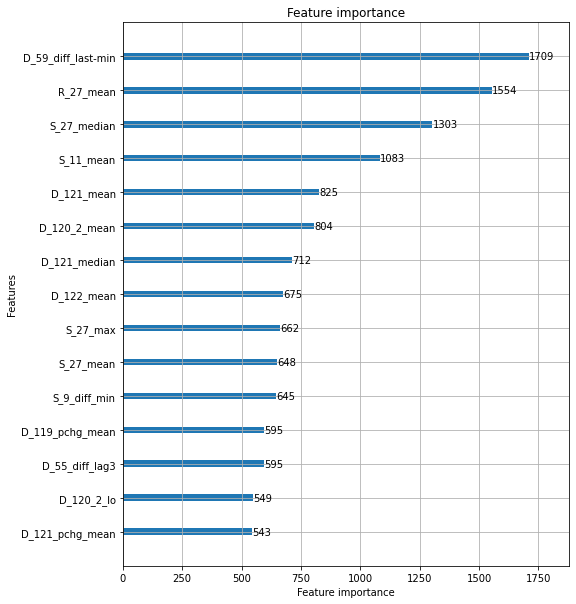

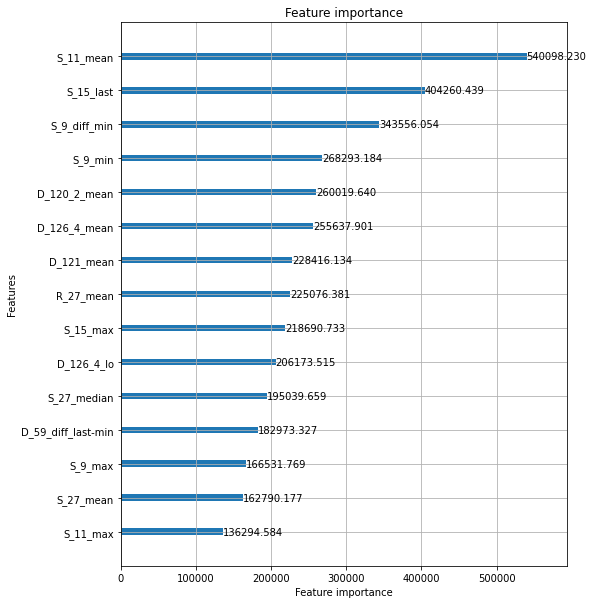

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.986044
[100]	valid_0's auc: 0.99148
[150]	valid_0's auc: 0.994292
[200]	valid_0's auc: 0.996039
[250]	valid_0's auc: 0.997279
[300]	valid_0's auc: 0.997868
[350]	valid_0's auc: 0.998311
[400]	valid_0's auc: 0.998548
[450]	valid_0's auc: 0.998737
[500]	valid_0's auc: 0.998859
[550]	valid_0's auc: 0.99897
[600]	valid_0's auc: 0.99908
[650]	valid_0's auc: 0.999146
[700]	valid_0's auc: 0.999225
[750]	valid_0's auc: 0.999274
[800]	valid_0's auc: 0.999311
[850]	valid_0's auc: 0.999352
[900]	valid_0's auc: 0.999378
[950]	valid_0's auc: 0.999405
[1000]	valid_0's auc: 0.999433
[1050]	valid_0's auc: 0.99946
[1100]	valid_0's auc: 0.999481
[1150]	valid_0's auc: 0.999499
[1200]	valid_0's auc: 0.999512
[1250]	valid_0's auc: 0.999524
[1300]	valid_0's auc: 0.999536
[1350]	valid_0's auc: 0.999545
[1400]	valid_0's auc: 0.999555
[1450]	valid_0's auc: 0.999567
[1500]	valid_0's auc: 0.999575
[1550]	valid_0's auc: 0.99958
[1

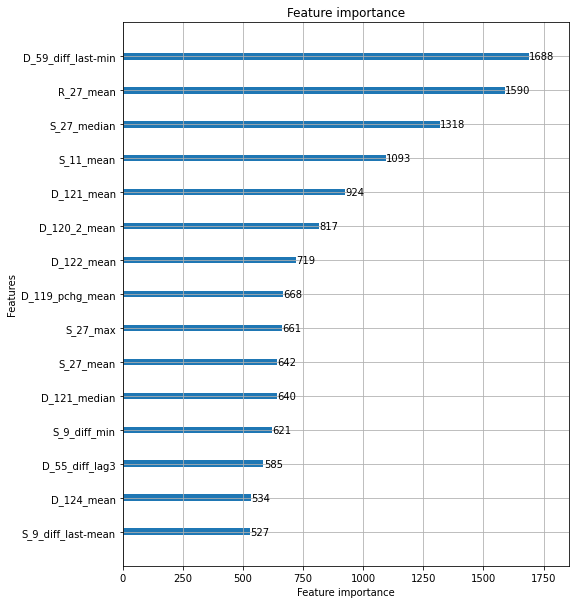

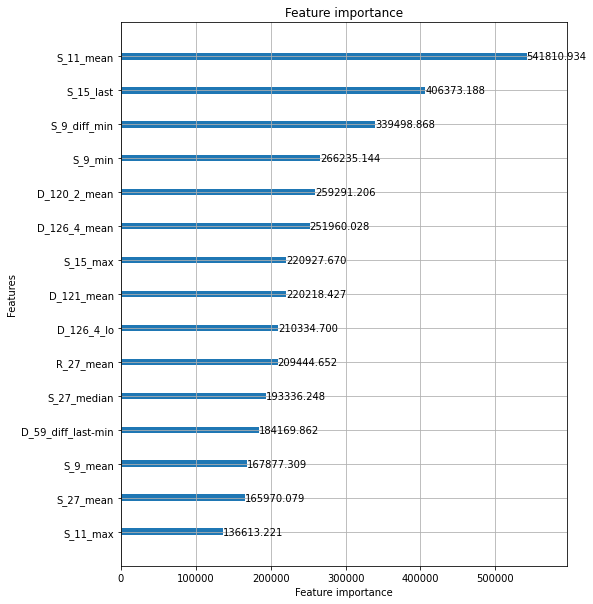

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.986452
[100]	valid_0's auc: 0.991774
[150]	valid_0's auc: 0.994535
[200]	valid_0's auc: 0.996174
[250]	valid_0's auc: 0.997367
[300]	valid_0's auc: 0.997936
[350]	valid_0's auc: 0.998358
[400]	valid_0's auc: 0.998581
[450]	valid_0's auc: 0.998746
[500]	valid_0's auc: 0.998892
[550]	valid_0's auc: 0.99899
[600]	valid_0's auc: 0.999096
[650]	valid_0's auc: 0.999175
[700]	valid_0's auc: 0.999254
[750]	valid_0's auc: 0.999301
[800]	valid_0's auc: 0.999346
[850]	valid_0's auc: 0.999381
[900]	valid_0's auc: 0.99941
[950]	valid_0's auc: 0.999437
[1000]	valid_0's auc: 0.999459
[1050]	valid_0's auc: 0.999488
[1100]	valid_0's auc: 0.999505
[1150]	valid_0's auc: 0.99952
[1200]	valid_0's auc: 0.999535
[1250]	valid_0's auc: 0.99955
[1300]	valid_0's auc: 0.999562
[1350]	valid_0's auc: 0.999569
[1400]	valid_0's auc: 0.999578
[1450]	valid_0's auc: 0.999587
[1500]	valid_0's auc: 0.999596
[1550]	valid_0's auc: 0.999604
[

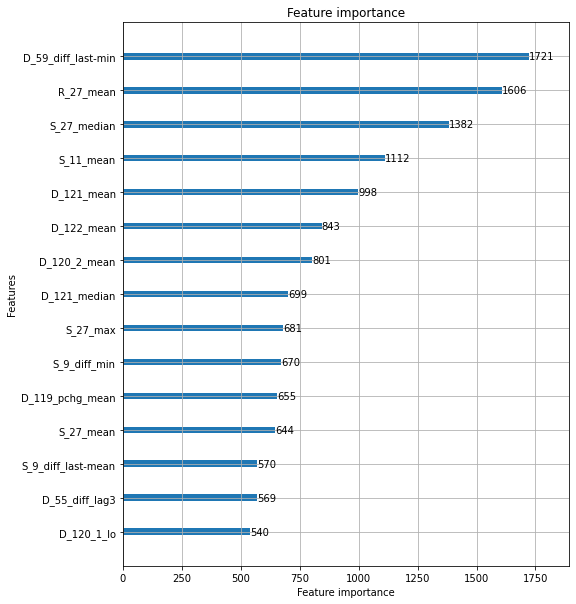

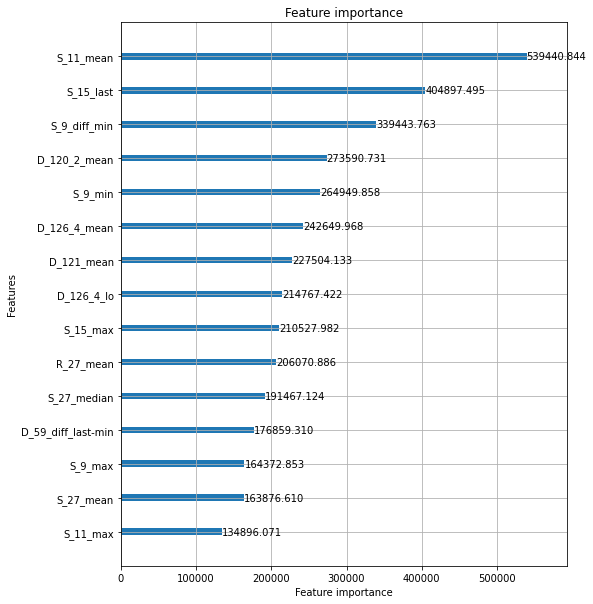

feature to remove: S_11_mean
Elapsed time: 18.45690815448761 min.
----------------------------------------------------------------------------------------------------
ITER: 34/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.985214
[100]	valid_0's auc: 0.990972
[150]	valid_0's auc: 0.994649
[200]	valid_0's auc: 0.996447
[250]	valid_0's auc: 0.997273
[300]	valid_0's auc: 0.997837
[350]	valid_0's auc: 0.998283
[400]	valid_0's auc: 0.998489
[450]	valid_0's auc: 0.99867
[500]	valid_0's auc: 0.998837
[550]	valid_0's auc: 0.998942
[600]	valid_0's auc: 0.999034
[650]	valid_0's auc: 0.999118
[700]	valid_0's auc: 0.999191
[750]	valid_0's auc: 0.999241
[800]	valid_0's auc: 0.999288
[850]	valid_0's auc: 0.999324
[900]	valid_0's auc: 0.999352
[950]	valid_0's auc: 0.999383
[1000]	valid_0's auc: 0.999406
[1050]	valid_0's auc: 0.999428
[1100]	valid_0's auc: 0.999445
[1150]	valid_0's auc: 0.999466
[1200]	valid_0's auc: 0.99948
[1250]	valid_0's auc: 0.999494
[1300

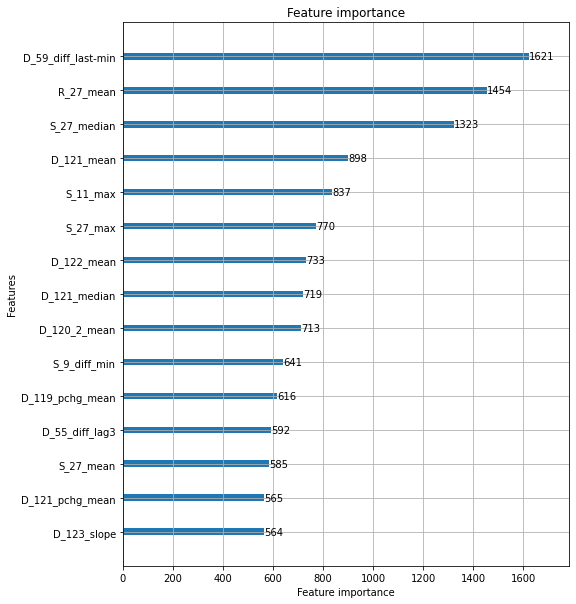

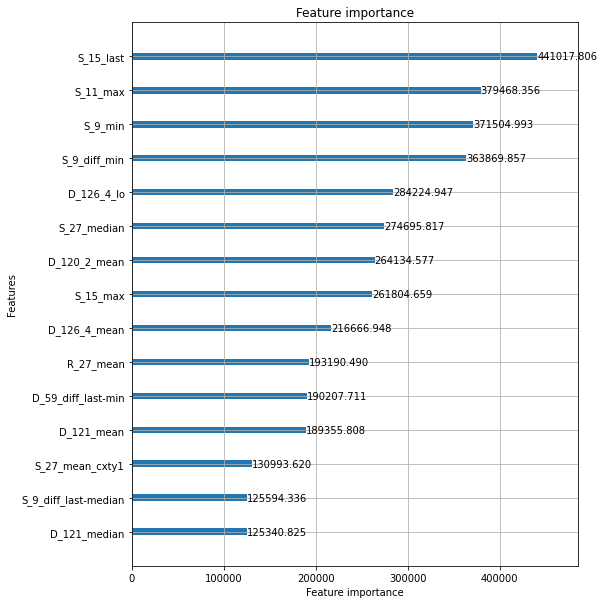

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984984
[100]	valid_0's auc: 0.991174
[150]	valid_0's auc: 0.994727
[200]	valid_0's auc: 0.996414
[250]	valid_0's auc: 0.997205
[300]	valid_0's auc: 0.997839
[350]	valid_0's auc: 0.998254
[400]	valid_0's auc: 0.998498
[450]	valid_0's auc: 0.998673
[500]	valid_0's auc: 0.998831
[550]	valid_0's auc: 0.998957
[600]	valid_0's auc: 0.999039
[650]	valid_0's auc: 0.999123
[700]	valid_0's auc: 0.999188
[750]	valid_0's auc: 0.999246
[800]	valid_0's auc: 0.999289
[850]	valid_0's auc: 0.999324
[900]	valid_0's auc: 0.999356
[950]	valid_0's auc: 0.999389
[1000]	valid_0's auc: 0.999417
[1050]	valid_0's auc: 0.999435
[1100]	valid_0's auc: 0.999457
[1150]	valid_0's auc: 0.999471
[1200]	valid_0's auc: 0.999487
[1250]	valid_0's auc: 0.9995
[1300]	valid_0's auc: 0.999511
[1350]	valid_0's auc: 0.99952
[1400]	valid_0's auc: 0.999531
[1450]	valid_0's auc: 0.999542
[1500]	valid_0's auc: 0.999551
[1550]	valid_0's auc: 0.999558


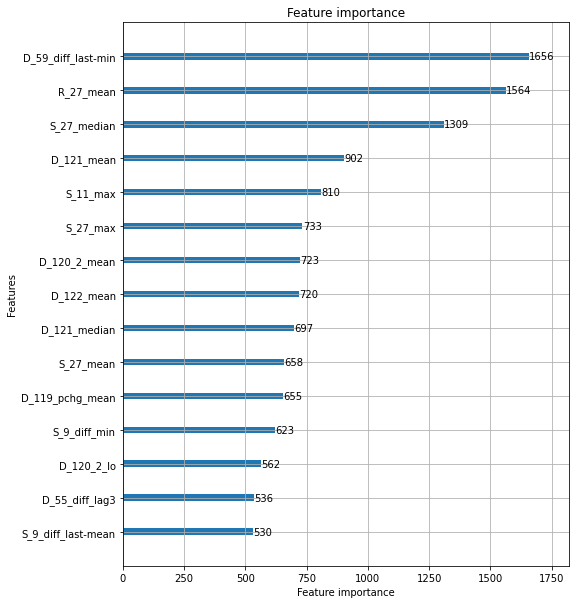

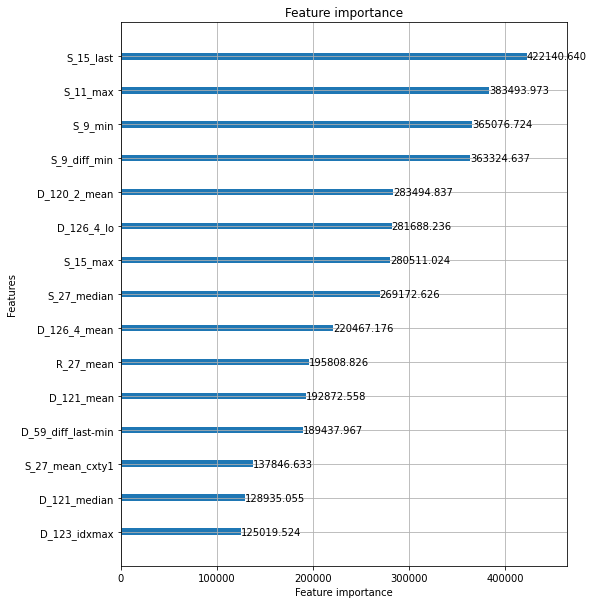

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984992
[100]	valid_0's auc: 0.991096
[150]	valid_0's auc: 0.994646
[200]	valid_0's auc: 0.996361
[250]	valid_0's auc: 0.997331
[300]	valid_0's auc: 0.997943
[350]	valid_0's auc: 0.998307
[400]	valid_0's auc: 0.998568
[450]	valid_0's auc: 0.998738
[500]	valid_0's auc: 0.9989
[550]	valid_0's auc: 0.999016
[600]	valid_0's auc: 0.999088
[650]	valid_0's auc: 0.999166
[700]	valid_0's auc: 0.999229
[750]	valid_0's auc: 0.999281
[800]	valid_0's auc: 0.999325
[850]	valid_0's auc: 0.999355
[900]	valid_0's auc: 0.999384
[950]	valid_0's auc: 0.999415
[1000]	valid_0's auc: 0.999438
[1050]	valid_0's auc: 0.999464
[1100]	valid_0's auc: 0.999489
[1150]	valid_0's auc: 0.99951
[1200]	valid_0's auc: 0.999523
[1250]	valid_0's auc: 0.999536
[1300]	valid_0's auc: 0.999547
[1350]	valid_0's auc: 0.999555
[1400]	valid_0's auc: 0.999566
[1450]	valid_0's auc: 0.999573
[1500]	valid_0's auc: 0.999579
[1550]	valid_0's auc: 0.999588


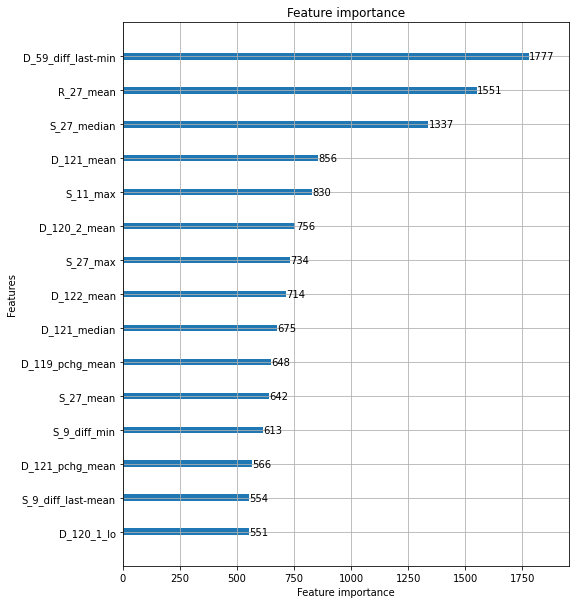

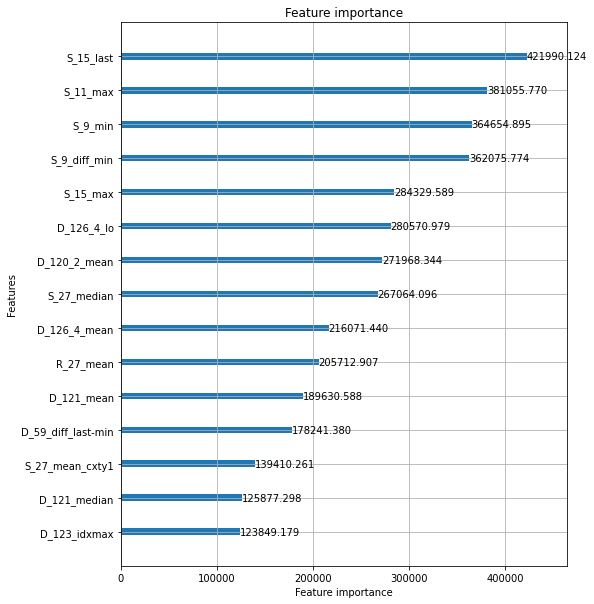

feature to remove: S_15_last
Elapsed time: 18.610849209626515 min.
----------------------------------------------------------------------------------------------------
ITER: 35/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.983457
[100]	valid_0's auc: 0.991181
[150]	valid_0's auc: 0.994022
[200]	valid_0's auc: 0.996008
[250]	valid_0's auc: 0.997051
[300]	valid_0's auc: 0.997746
[350]	valid_0's auc: 0.998129
[400]	valid_0's auc: 0.998401
[450]	valid_0's auc: 0.998609
[500]	valid_0's auc: 0.998762
[550]	valid_0's auc: 0.998884
[600]	valid_0's auc: 0.998979
[650]	valid_0's auc: 0.999067
[700]	valid_0's auc: 0.999128
[750]	valid_0's auc: 0.999186
[800]	valid_0's auc: 0.999254
[850]	valid_0's auc: 0.9993
[900]	valid_0's auc: 0.999336
[950]	valid_0's auc: 0.999362
[1000]	valid_0's auc: 0.999388
[1050]	valid_0's auc: 0.999412
[1100]	valid_0's auc: 0.999429
[1150]	valid_0's auc: 0.999451
[1200]	valid_0's auc: 0.999465
[1250]	valid_0's auc: 0.999479
[130

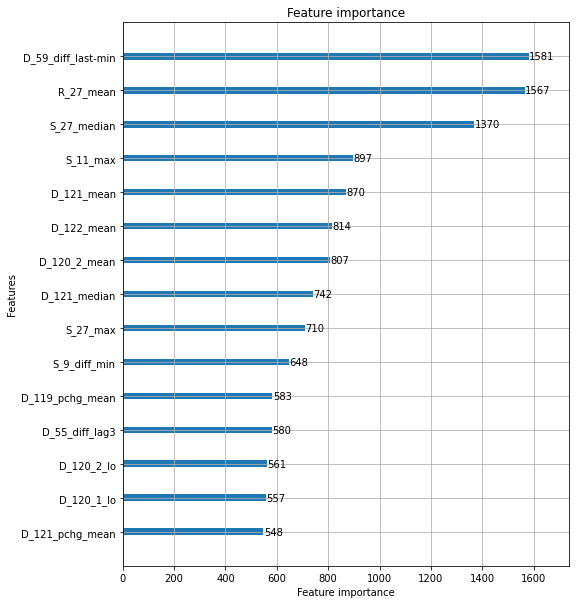

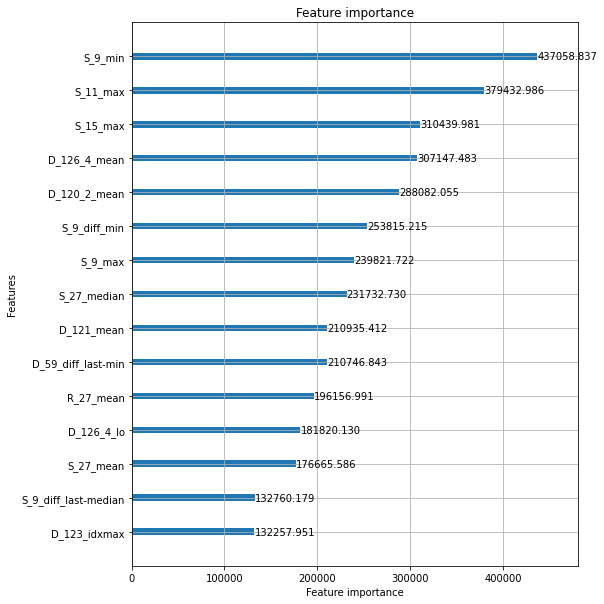

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984308
[100]	valid_0's auc: 0.991746
[150]	valid_0's auc: 0.994256
[200]	valid_0's auc: 0.99615
[250]	valid_0's auc: 0.997164
[300]	valid_0's auc: 0.997925
[350]	valid_0's auc: 0.998263
[400]	valid_0's auc: 0.998499
[450]	valid_0's auc: 0.998722
[500]	valid_0's auc: 0.998863
[550]	valid_0's auc: 0.998978
[600]	valid_0's auc: 0.999078
[650]	valid_0's auc: 0.999145
[700]	valid_0's auc: 0.999194
[750]	valid_0's auc: 0.999241
[800]	valid_0's auc: 0.999279
[850]	valid_0's auc: 0.99933
[900]	valid_0's auc: 0.999358
[950]	valid_0's auc: 0.999388
[1000]	valid_0's auc: 0.999413
[1050]	valid_0's auc: 0.999436
[1100]	valid_0's auc: 0.999455
[1150]	valid_0's auc: 0.999474
[1200]	valid_0's auc: 0.999489
[1250]	valid_0's auc: 0.999502
[1300]	valid_0's auc: 0.999512
[1350]	valid_0's auc: 0.999521
[1400]	valid_0's auc: 0.999531
[1450]	valid_0's auc: 0.999538
[1500]	valid_0's auc: 0.999547
[1550]	valid_0's auc: 0.999555

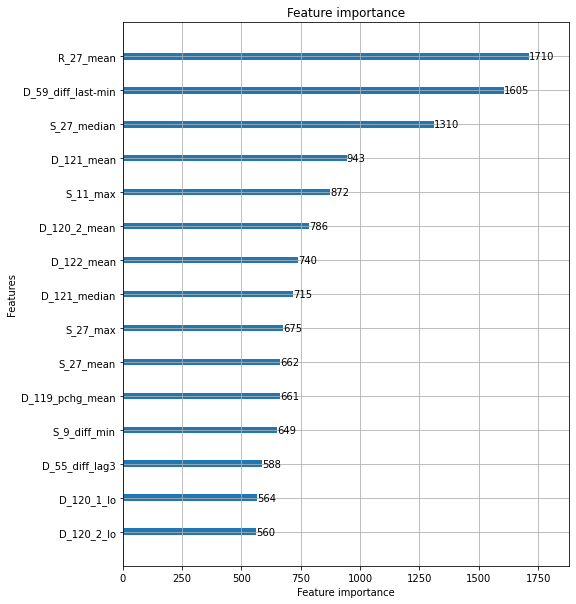

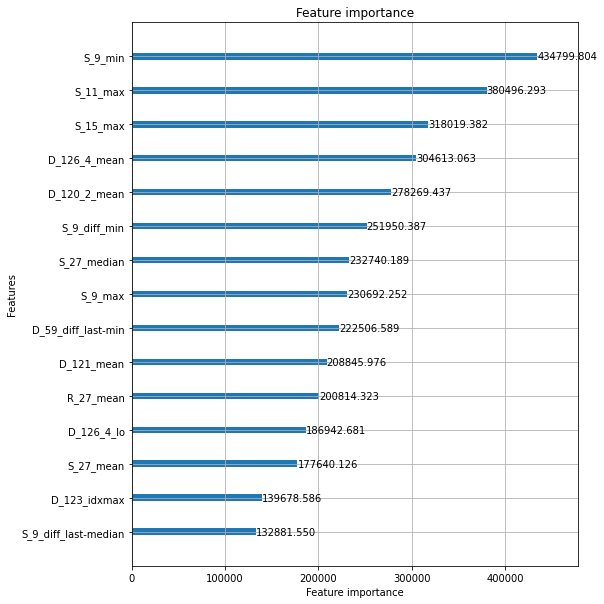

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.983739
[100]	valid_0's auc: 0.9913
[150]	valid_0's auc: 0.993963
[200]	valid_0's auc: 0.996018
[250]	valid_0's auc: 0.99716
[300]	valid_0's auc: 0.997857
[350]	valid_0's auc: 0.998254
[400]	valid_0's auc: 0.998493
[450]	valid_0's auc: 0.998688
[500]	valid_0's auc: 0.998828
[550]	valid_0's auc: 0.998943
[600]	valid_0's auc: 0.999043
[650]	valid_0's auc: 0.99913
[700]	valid_0's auc: 0.999186
[750]	valid_0's auc: 0.999253
[800]	valid_0's auc: 0.999304
[850]	valid_0's auc: 0.99935
[900]	valid_0's auc: 0.999378
[950]	valid_0's auc: 0.9994
[1000]	valid_0's auc: 0.999426
[1050]	valid_0's auc: 0.999447
[1100]	valid_0's auc: 0.999467
[1150]	valid_0's auc: 0.99948
[1200]	valid_0's auc: 0.999498
[1250]	valid_0's auc: 0.999512
[1300]	valid_0's auc: 0.999525
[1350]	valid_0's auc: 0.999535
[1400]	valid_0's auc: 0.999544
[1450]	valid_0's auc: 0.999552
[1500]	valid_0's auc: 0.999562
[1550]	valid_0's auc: 0.99957
[1600]

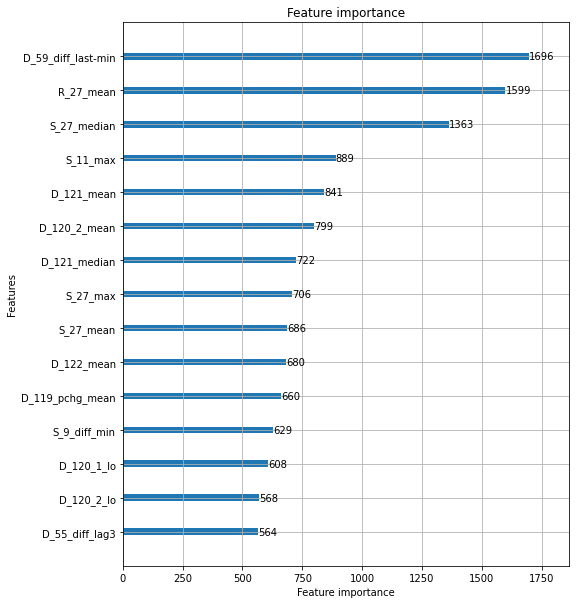

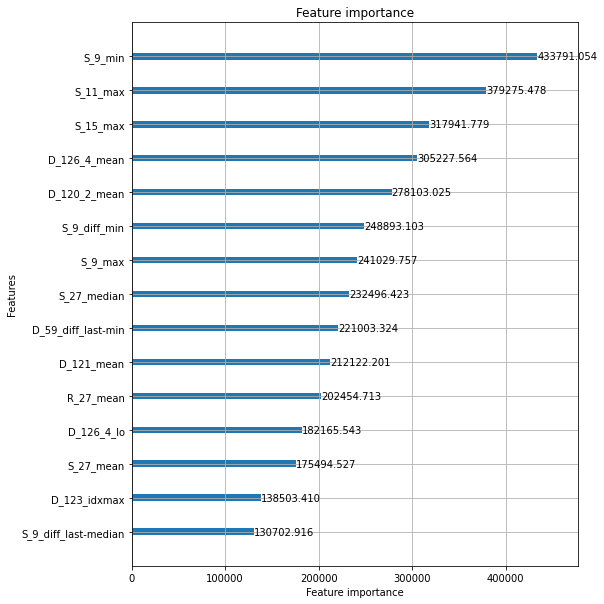

feature to remove: S_9_min
Elapsed time: 18.850834210713703 min.
----------------------------------------------------------------------------------------------------
ITER: 36/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984296
[100]	valid_0's auc: 0.991249
[150]	valid_0's auc: 0.994184
[200]	valid_0's auc: 0.995821
[250]	valid_0's auc: 0.996832
[300]	valid_0's auc: 0.997519
[350]	valid_0's auc: 0.998043
[400]	valid_0's auc: 0.99833
[450]	valid_0's auc: 0.998545
[500]	valid_0's auc: 0.998676
[550]	valid_0's auc: 0.998821
[600]	valid_0's auc: 0.998921
[650]	valid_0's auc: 0.999022
[700]	valid_0's auc: 0.999101
[750]	valid_0's auc: 0.999161
[800]	valid_0's auc: 0.999218
[850]	valid_0's auc: 0.999254
[900]	valid_0's auc: 0.999299
[950]	valid_0's auc: 0.999323
[1000]	valid_0's auc: 0.999359
[1050]	valid_0's auc: 0.999386
[1100]	valid_0's auc: 0.999404
[1150]	valid_0's auc: 0.999424
[1200]	valid_0's auc: 0.99944
[1250]	valid_0's auc: 0.999455
[1300]

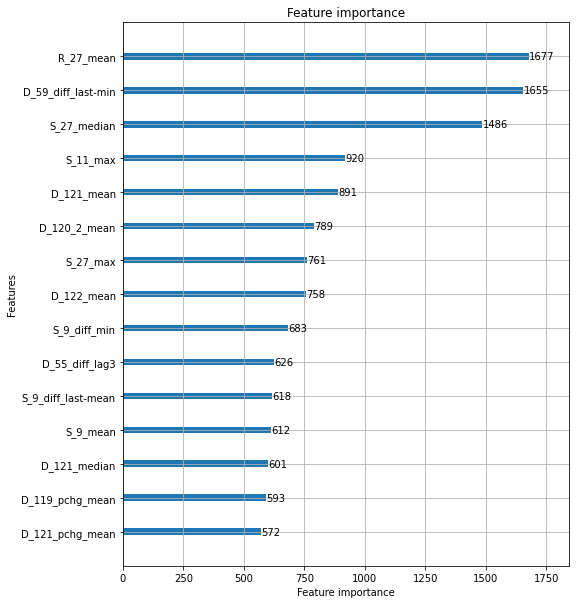

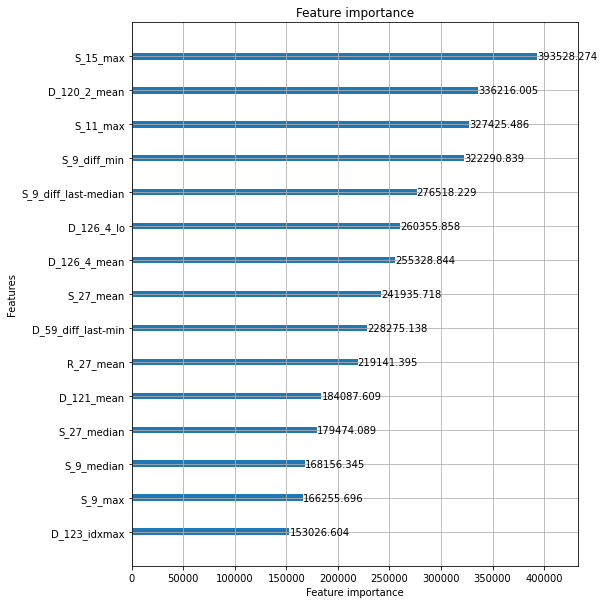

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984448
[100]	valid_0's auc: 0.991567
[150]	valid_0's auc: 0.99437
[200]	valid_0's auc: 0.996203
[250]	valid_0's auc: 0.997127
[300]	valid_0's auc: 0.997797
[350]	valid_0's auc: 0.998205
[400]	valid_0's auc: 0.998466
[450]	valid_0's auc: 0.998648
[500]	valid_0's auc: 0.998779
[550]	valid_0's auc: 0.998899
[600]	valid_0's auc: 0.998996
[650]	valid_0's auc: 0.999084
[700]	valid_0's auc: 0.999145
[750]	valid_0's auc: 0.999206
[800]	valid_0's auc: 0.999251
[850]	valid_0's auc: 0.999288
[900]	valid_0's auc: 0.999318
[950]	valid_0's auc: 0.999344
[1000]	valid_0's auc: 0.999373
[1050]	valid_0's auc: 0.999396
[1100]	valid_0's auc: 0.999415
[1150]	valid_0's auc: 0.999438
[1200]	valid_0's auc: 0.999449
[1250]	valid_0's auc: 0.999462
[1300]	valid_0's auc: 0.999475
[1350]	valid_0's auc: 0.999487
[1400]	valid_0's auc: 0.999502
[1450]	valid_0's auc: 0.999514
[1500]	valid_0's auc: 0.999522
[1550]	valid_0's auc: 0.99953

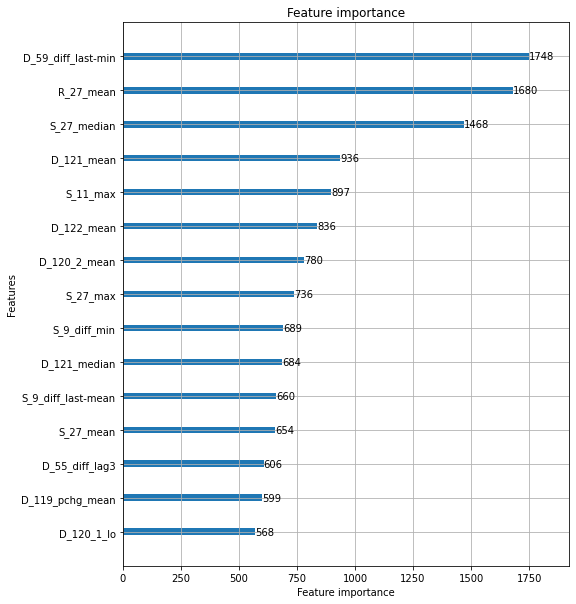

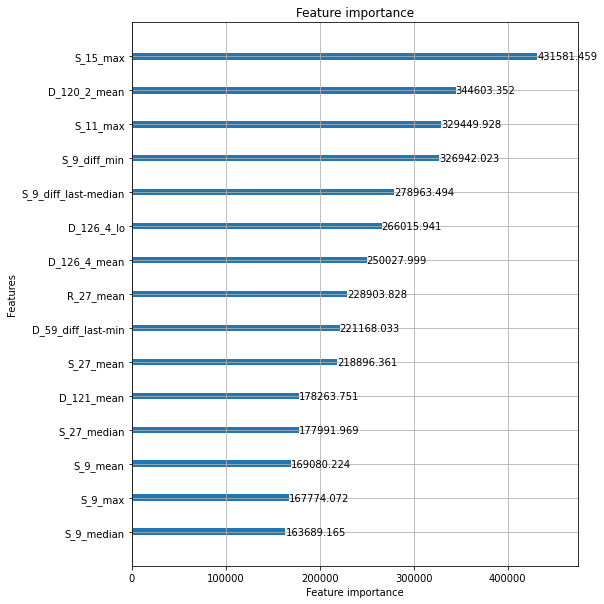

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.98417
[100]	valid_0's auc: 0.991601
[150]	valid_0's auc: 0.994642
[200]	valid_0's auc: 0.996235
[250]	valid_0's auc: 0.997155
[300]	valid_0's auc: 0.997758
[350]	valid_0's auc: 0.998141
[400]	valid_0's auc: 0.99843
[450]	valid_0's auc: 0.998605
[500]	valid_0's auc: 0.998765
[550]	valid_0's auc: 0.998898
[600]	valid_0's auc: 0.998998
[650]	valid_0's auc: 0.999084
[700]	valid_0's auc: 0.999138
[750]	valid_0's auc: 0.999197
[800]	valid_0's auc: 0.99924
[850]	valid_0's auc: 0.999288
[900]	valid_0's auc: 0.99932
[950]	valid_0's auc: 0.999346
[1000]	valid_0's auc: 0.999373
[1050]	valid_0's auc: 0.999409
[1100]	valid_0's auc: 0.999433
[1150]	valid_0's auc: 0.999451
[1200]	valid_0's auc: 0.999469
[1250]	valid_0's auc: 0.999488
[1300]	valid_0's auc: 0.999499
[1350]	valid_0's auc: 0.999511
[1400]	valid_0's auc: 0.999524
[1450]	valid_0's auc: 0.999536
[1500]	valid_0's auc: 0.999541
[1550]	valid_0's auc: 0.999551
[

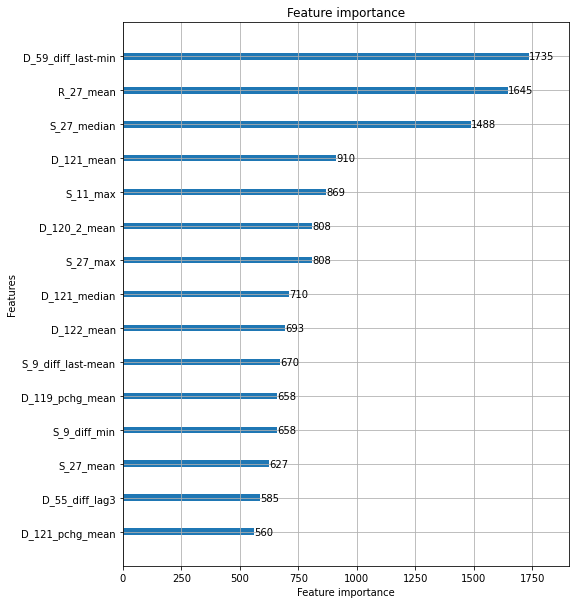

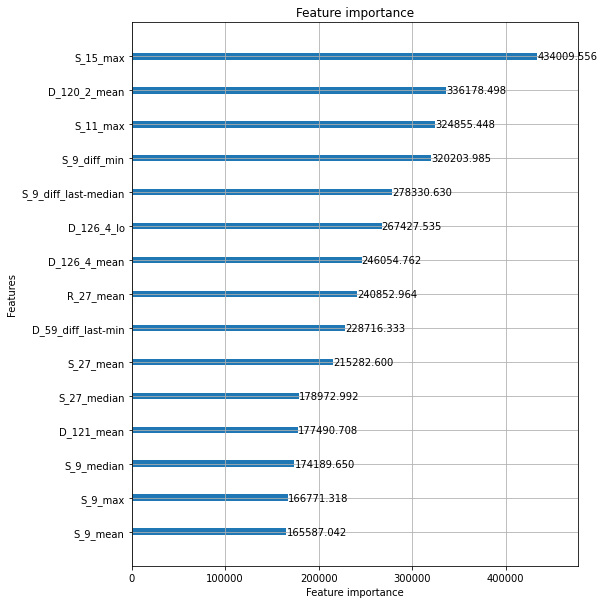

feature to remove: S_15_max
Elapsed time: 19.4084832628568 min.
----------------------------------------------------------------------------------------------------
ITER: 37/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.984213
[100]	valid_0's auc: 0.990826
[150]	valid_0's auc: 0.993898
[200]	valid_0's auc: 0.995897
[250]	valid_0's auc: 0.996915
[300]	valid_0's auc: 0.9976
[350]	valid_0's auc: 0.998061
[400]	valid_0's auc: 0.998307
[450]	valid_0's auc: 0.998511
[500]	valid_0's auc: 0.998683
[550]	valid_0's auc: 0.998814
[600]	valid_0's auc: 0.998923
[650]	valid_0's auc: 0.999004
[700]	valid_0's auc: 0.999097
[750]	valid_0's auc: 0.999153
[800]	valid_0's auc: 0.999195
[850]	valid_0's auc: 0.999244
[900]	valid_0's auc: 0.999285
[950]	valid_0's auc: 0.999326
[1000]	valid_0's auc: 0.999358
[1050]	valid_0's auc: 0.999377
[1100]	valid_0's auc: 0.999402
[1150]	valid_0's auc: 0.999414
[1200]	valid_0's auc: 0.999434
[1250]	valid_0's auc: 0.999451
[1300]	

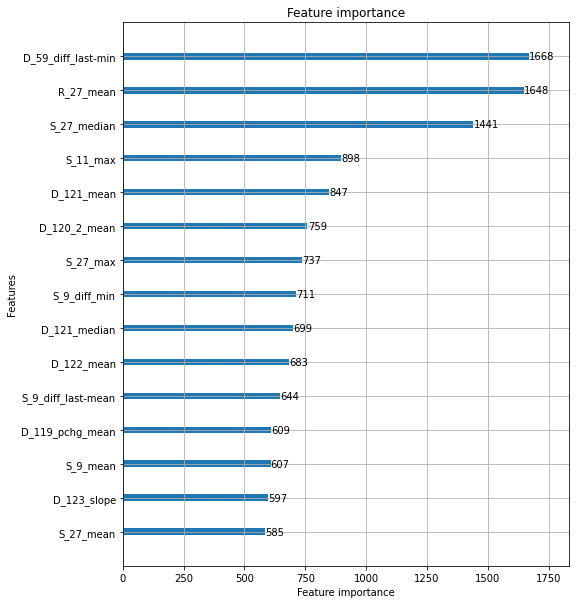

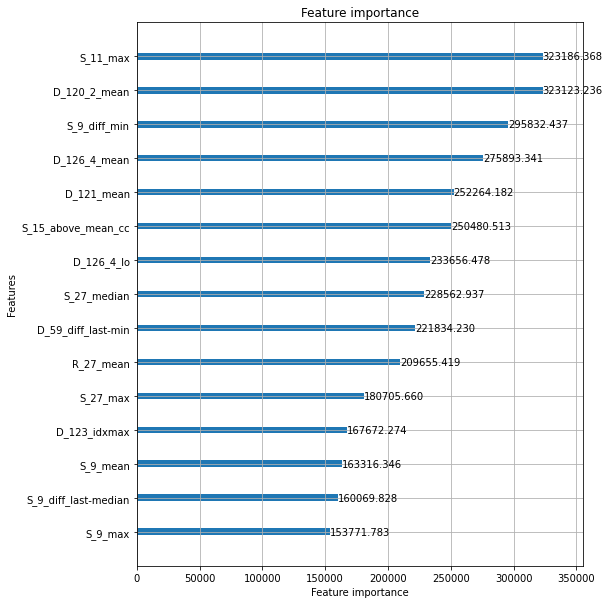

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.983746
[100]	valid_0's auc: 0.990821
[150]	valid_0's auc: 0.993839
[200]	valid_0's auc: 0.995895
[250]	valid_0's auc: 0.996993
[300]	valid_0's auc: 0.997706
[350]	valid_0's auc: 0.998179
[400]	valid_0's auc: 0.998415
[450]	valid_0's auc: 0.998611
[500]	valid_0's auc: 0.998751
[550]	valid_0's auc: 0.998869
[600]	valid_0's auc: 0.998972
[650]	valid_0's auc: 0.999053
[700]	valid_0's auc: 0.999115
[750]	valid_0's auc: 0.999175
[800]	valid_0's auc: 0.999219
[850]	valid_0's auc: 0.999273
[900]	valid_0's auc: 0.999306
[950]	valid_0's auc: 0.999334
[1000]	valid_0's auc: 0.999362
[1050]	valid_0's auc: 0.999388
[1100]	valid_0's auc: 0.999411
[1150]	valid_0's auc: 0.999429
[1200]	valid_0's auc: 0.999448
[1250]	valid_0's auc: 0.99946
[1300]	valid_0's auc: 0.999472
[1350]	valid_0's auc: 0.999486
[1400]	valid_0's auc: 0.999497
[1450]	valid_0's auc: 0.999511
[1500]	valid_0's auc: 0.99952
[1550]	valid_0's auc: 0.999527

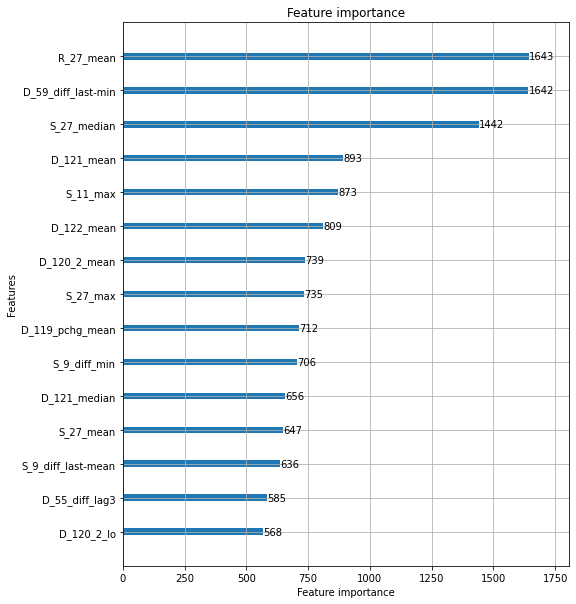

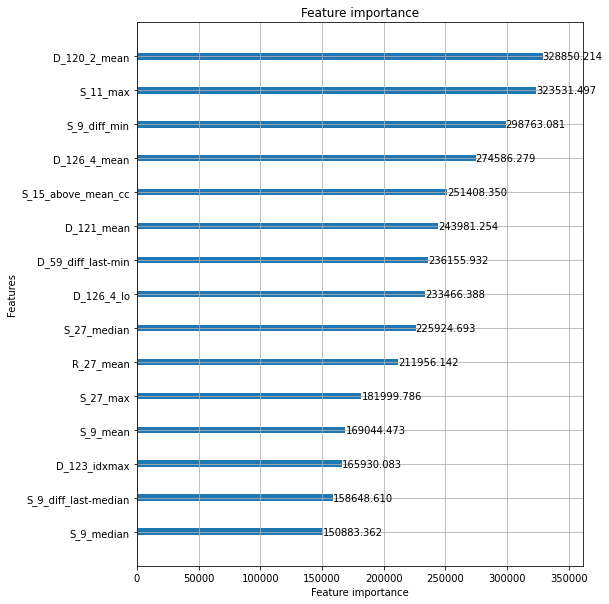

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.983752
[100]	valid_0's auc: 0.990637
[150]	valid_0's auc: 0.994095
[200]	valid_0's auc: 0.995963
[250]	valid_0's auc: 0.997041
[300]	valid_0's auc: 0.997772
[350]	valid_0's auc: 0.998167
[400]	valid_0's auc: 0.998414
[450]	valid_0's auc: 0.998585
[500]	valid_0's auc: 0.99874
[550]	valid_0's auc: 0.998852
[600]	valid_0's auc: 0.998987
[650]	valid_0's auc: 0.999067
[700]	valid_0's auc: 0.999127
[750]	valid_0's auc: 0.999183
[800]	valid_0's auc: 0.999236
[850]	valid_0's auc: 0.999283
[900]	valid_0's auc: 0.999336
[950]	valid_0's auc: 0.999369
[1000]	valid_0's auc: 0.999397
[1050]	valid_0's auc: 0.99942
[1100]	valid_0's auc: 0.99944
[1150]	valid_0's auc: 0.999459
[1200]	valid_0's auc: 0.999475
[1250]	valid_0's auc: 0.999488
[1300]	valid_0's auc: 0.999504
[1350]	valid_0's auc: 0.999513
[1400]	valid_0's auc: 0.999523
[1450]	valid_0's auc: 0.999534
[1500]	valid_0's auc: 0.999541
[1550]	valid_0's auc: 0.99955
[

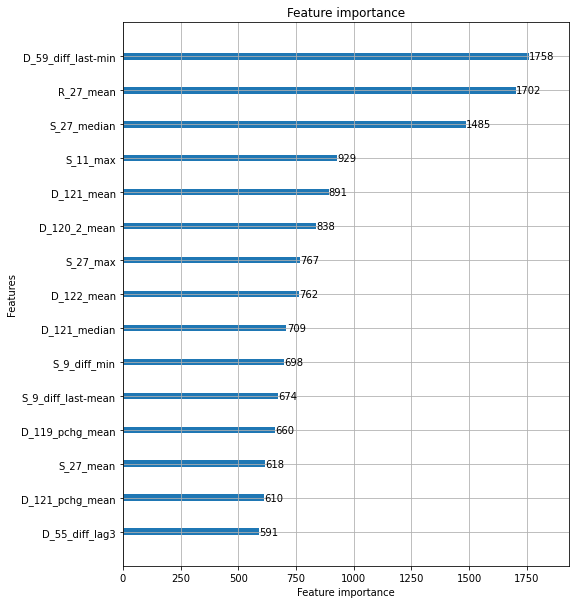

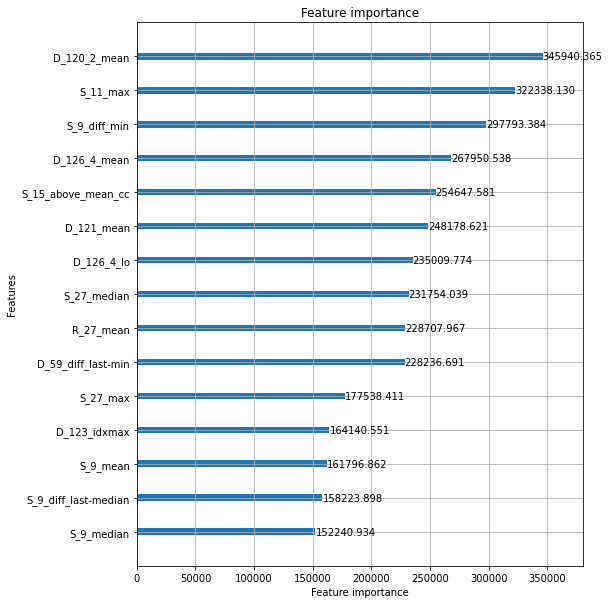

feature to remove: D_120_2_mean
Elapsed time: 19.22715552250544 min.
----------------------------------------------------------------------------------------------------
ITER: 38/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.979539
[100]	valid_0's auc: 0.990575
[150]	valid_0's auc: 0.994124
[200]	valid_0's auc: 0.995876
[250]	valid_0's auc: 0.996852
[300]	valid_0's auc: 0.997522
[350]	valid_0's auc: 0.998034
[400]	valid_0's auc: 0.998323
[450]	valid_0's auc: 0.998512
[500]	valid_0's auc: 0.998701
[550]	valid_0's auc: 0.998813
[600]	valid_0's auc: 0.998904
[650]	valid_0's auc: 0.998992
[700]	valid_0's auc: 0.999064
[750]	valid_0's auc: 0.999133
[800]	valid_0's auc: 0.999185
[850]	valid_0's auc: 0.999219
[900]	valid_0's auc: 0.999254
[950]	valid_0's auc: 0.999287
[1000]	valid_0's auc: 0.999314
[1050]	valid_0's auc: 0.999342
[1100]	valid_0's auc: 0.999358
[1150]	valid_0's auc: 0.99938
[1200]	valid_0's auc: 0.999406
[1250]	valid_0's auc: 0.999421
[

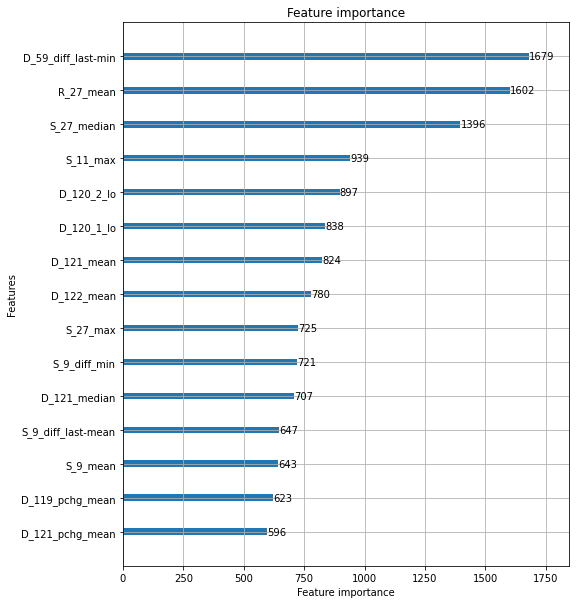

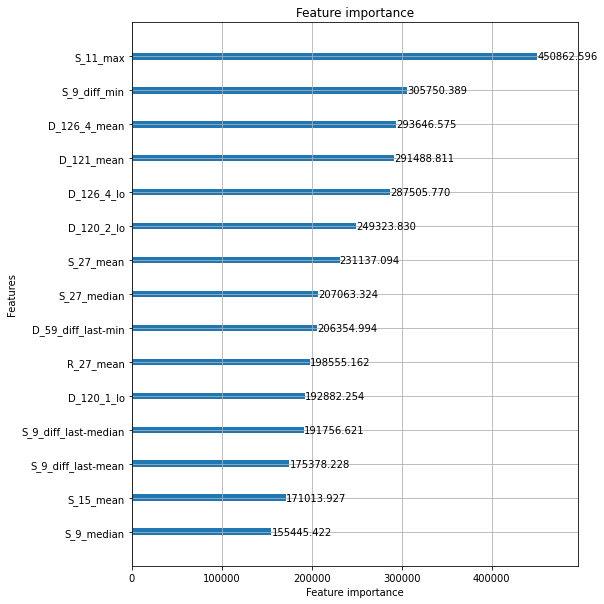

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.979618
[100]	valid_0's auc: 0.990842
[150]	valid_0's auc: 0.994477
[200]	valid_0's auc: 0.99627
[250]	valid_0's auc: 0.997134
[300]	valid_0's auc: 0.997702
[350]	valid_0's auc: 0.998098
[400]	valid_0's auc: 0.998396
[450]	valid_0's auc: 0.998609
[500]	valid_0's auc: 0.998753
[550]	valid_0's auc: 0.998861
[600]	valid_0's auc: 0.998939
[650]	valid_0's auc: 0.999013
[700]	valid_0's auc: 0.999076
[750]	valid_0's auc: 0.999138
[800]	valid_0's auc: 0.999194
[850]	valid_0's auc: 0.99924
[900]	valid_0's auc: 0.99928
[950]	valid_0's auc: 0.999308
[1000]	valid_0's auc: 0.999333
[1050]	valid_0's auc: 0.999362
[1100]	valid_0's auc: 0.999382
[1150]	valid_0's auc: 0.999404
[1200]	valid_0's auc: 0.999422
[1250]	valid_0's auc: 0.999436
[1300]	valid_0's auc: 0.999446
[1350]	valid_0's auc: 0.999461
[1400]	valid_0's auc: 0.999473
[1450]	valid_0's auc: 0.999482
[1500]	valid_0's auc: 0.999492
[1550]	valid_0's auc: 0.999498


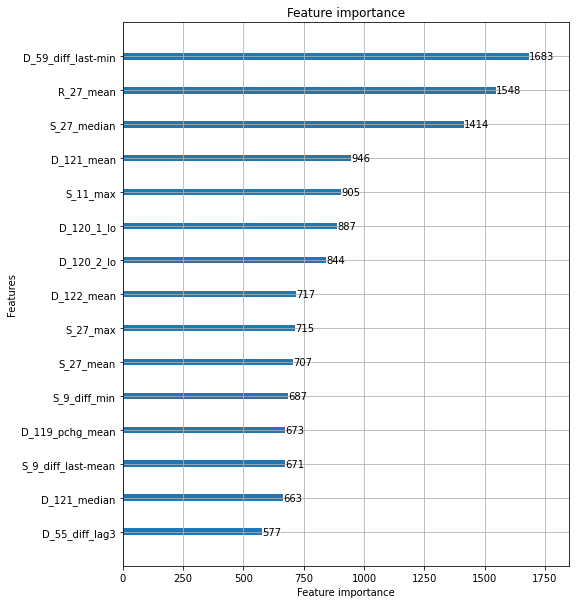

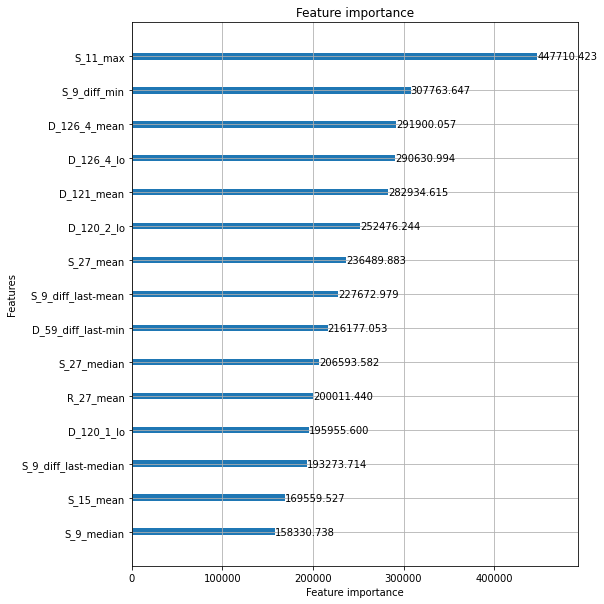

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.980088
[100]	valid_0's auc: 0.990612
[150]	valid_0's auc: 0.994227
[200]	valid_0's auc: 0.996086
[250]	valid_0's auc: 0.997043
[300]	valid_0's auc: 0.997719
[350]	valid_0's auc: 0.998124
[400]	valid_0's auc: 0.998368
[450]	valid_0's auc: 0.998593
[500]	valid_0's auc: 0.998775
[550]	valid_0's auc: 0.998869
[600]	valid_0's auc: 0.998964
[650]	valid_0's auc: 0.999042
[700]	valid_0's auc: 0.999113
[750]	valid_0's auc: 0.999171
[800]	valid_0's auc: 0.999222
[850]	valid_0's auc: 0.999261
[900]	valid_0's auc: 0.999299
[950]	valid_0's auc: 0.999331
[1000]	valid_0's auc: 0.99936
[1050]	valid_0's auc: 0.999386
[1100]	valid_0's auc: 0.999408
[1150]	valid_0's auc: 0.999427
[1200]	valid_0's auc: 0.99944
[1250]	valid_0's auc: 0.999454
[1300]	valid_0's auc: 0.999468
[1350]	valid_0's auc: 0.999487
[1400]	valid_0's auc: 0.999499
[1450]	valid_0's auc: 0.999509
[1500]	valid_0's auc: 0.999516
[1550]	valid_0's auc: 0.999527

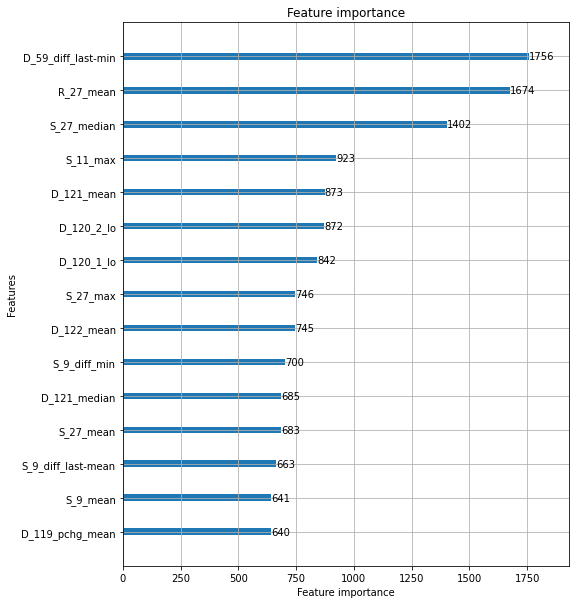

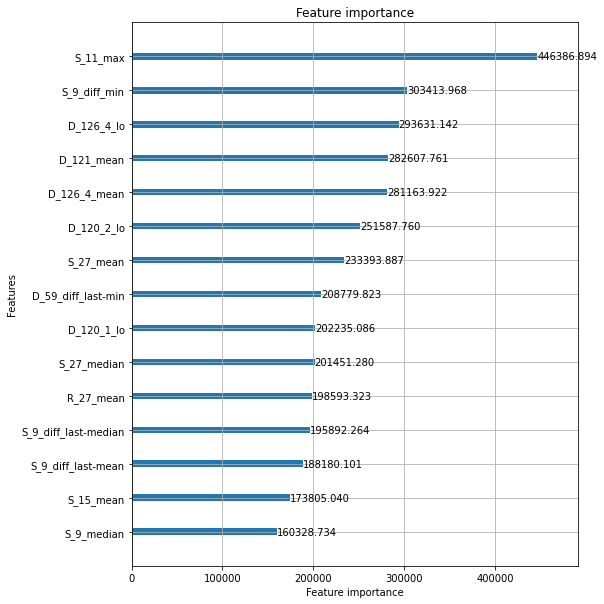

feature to remove: S_11_max
Elapsed time: 19.720548049608865 min.
----------------------------------------------------------------------------------------------------
ITER: 39/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.980158
[100]	valid_0's auc: 0.989963
[150]	valid_0's auc: 0.994177
[200]	valid_0's auc: 0.996019
[250]	valid_0's auc: 0.99715
[300]	valid_0's auc: 0.997639
[350]	valid_0's auc: 0.998047
[400]	valid_0's auc: 0.998322
[450]	valid_0's auc: 0.998538
[500]	valid_0's auc: 0.998679
[550]	valid_0's auc: 0.99882
[600]	valid_0's auc: 0.998929
[650]	valid_0's auc: 0.999009
[700]	valid_0's auc: 0.999075
[750]	valid_0's auc: 0.999134
[800]	valid_0's auc: 0.999188
[850]	valid_0's auc: 0.999228
[900]	valid_0's auc: 0.999272
[950]	valid_0's auc: 0.999304
[1000]	valid_0's auc: 0.999334
[1050]	valid_0's auc: 0.999356
[1100]	valid_0's auc: 0.999375
[1150]	valid_0's auc: 0.999393
[1200]	valid_0's auc: 0.999411
[1250]	valid_0's auc: 0.999424
[1300

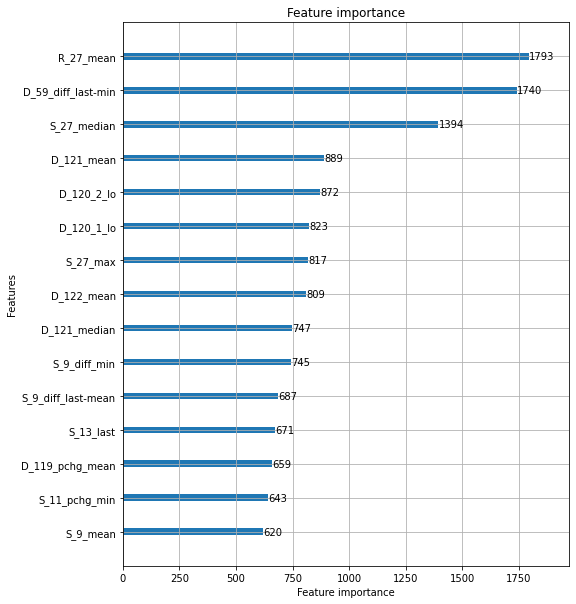

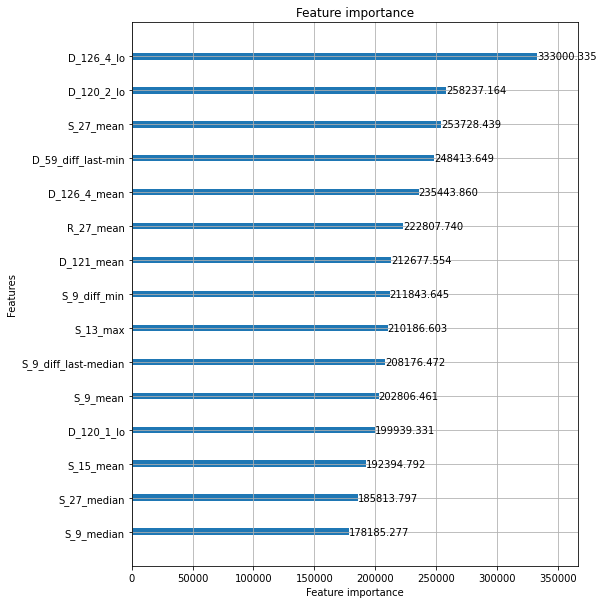

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.979917
[100]	valid_0's auc: 0.990116
[150]	valid_0's auc: 0.994564
[200]	valid_0's auc: 0.996199
[250]	valid_0's auc: 0.997153
[300]	valid_0's auc: 0.997715
[350]	valid_0's auc: 0.998119
[400]	valid_0's auc: 0.998398
[450]	valid_0's auc: 0.998567
[500]	valid_0's auc: 0.998725
[550]	valid_0's auc: 0.998831
[600]	valid_0's auc: 0.998946
[650]	valid_0's auc: 0.999018
[700]	valid_0's auc: 0.999103
[750]	valid_0's auc: 0.999159
[800]	valid_0's auc: 0.999211
[850]	valid_0's auc: 0.999251
[900]	valid_0's auc: 0.999281
[950]	valid_0's auc: 0.999311
[1000]	valid_0's auc: 0.999341
[1050]	valid_0's auc: 0.999362
[1100]	valid_0's auc: 0.999387
[1150]	valid_0's auc: 0.999406
[1200]	valid_0's auc: 0.99942
[1250]	valid_0's auc: 0.999431
[1300]	valid_0's auc: 0.999442
[1350]	valid_0's auc: 0.999456
[1400]	valid_0's auc: 0.999467
[1450]	valid_0's auc: 0.999481
[1500]	valid_0's auc: 0.999489
[1550]	valid_0's auc: 0.9995


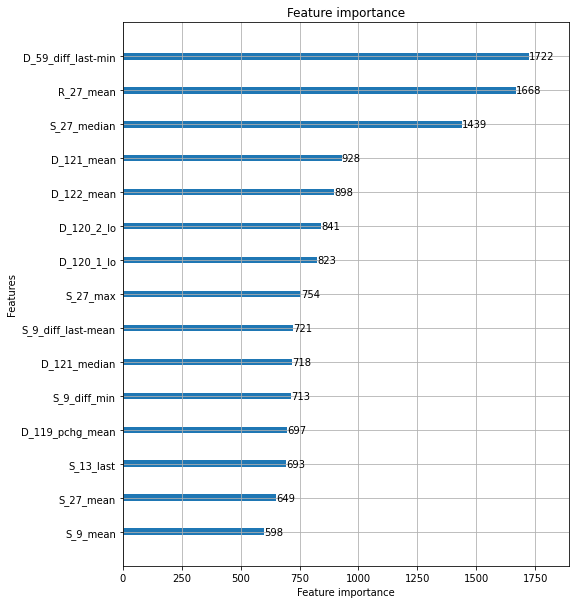

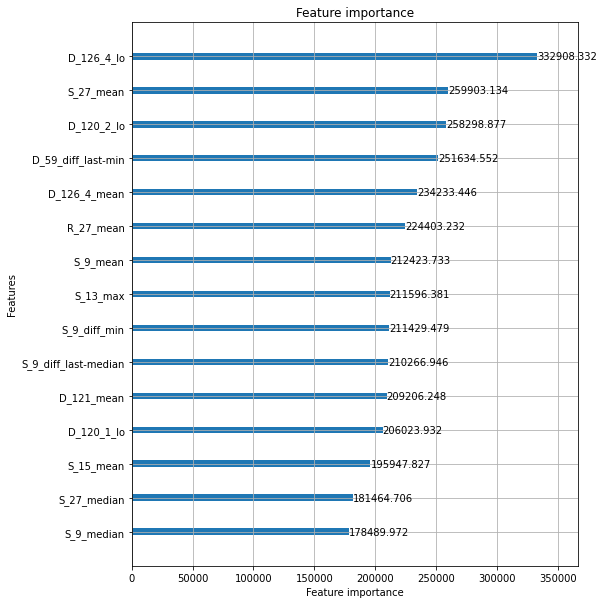

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.979774
[100]	valid_0's auc: 0.990197
[150]	valid_0's auc: 0.994509
[200]	valid_0's auc: 0.996173
[250]	valid_0's auc: 0.997237
[300]	valid_0's auc: 0.997782
[350]	valid_0's auc: 0.998137
[400]	valid_0's auc: 0.998406
[450]	valid_0's auc: 0.998605
[500]	valid_0's auc: 0.998759
[550]	valid_0's auc: 0.998865
[600]	valid_0's auc: 0.998968
[650]	valid_0's auc: 0.999047
[700]	valid_0's auc: 0.999118
[750]	valid_0's auc: 0.999172
[800]	valid_0's auc: 0.999218
[850]	valid_0's auc: 0.999259
[900]	valid_0's auc: 0.999298
[950]	valid_0's auc: 0.99933
[1000]	valid_0's auc: 0.99936
[1050]	valid_0's auc: 0.99939
[1100]	valid_0's auc: 0.999407
[1150]	valid_0's auc: 0.999427
[1200]	valid_0's auc: 0.999445
[1250]	valid_0's auc: 0.99946
[1300]	valid_0's auc: 0.999472
[1350]	valid_0's auc: 0.999481
[1400]	valid_0's auc: 0.999494
[1450]	valid_0's auc: 0.999504
[1500]	valid_0's auc: 0.999512
[1550]	valid_0's auc: 0.999522
[

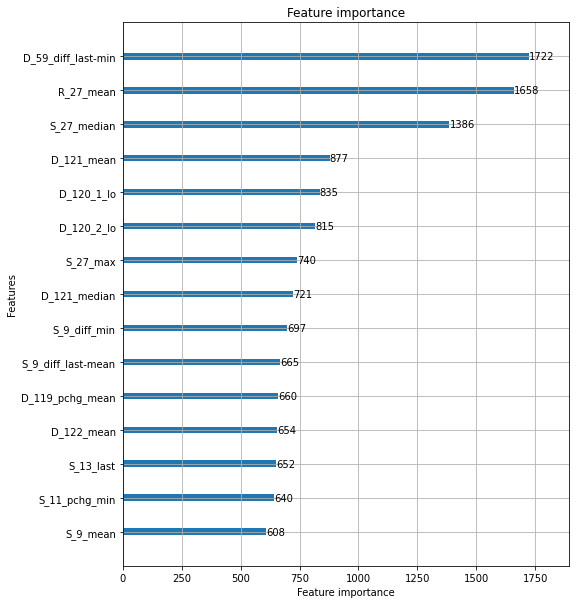

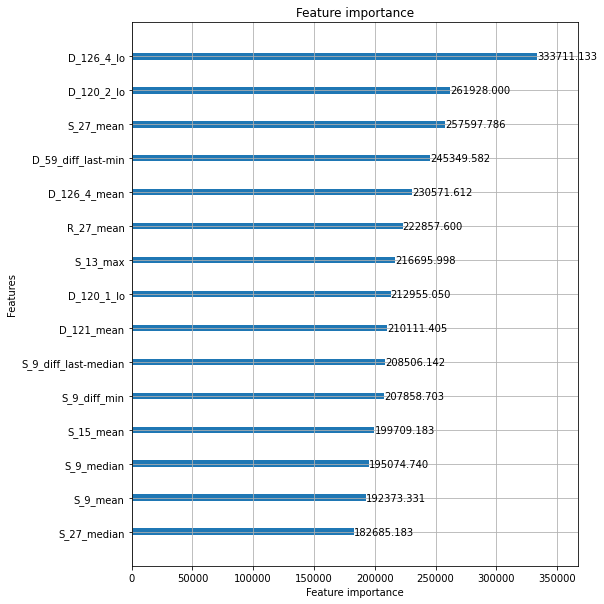

feature to remove: D_126_4_lo
Elapsed time: 19.641184878349303 min.
----------------------------------------------------------------------------------------------------
ITER: 40/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.982785
[100]	valid_0's auc: 0.989879
[150]	valid_0's auc: 0.994257
[200]	valid_0's auc: 0.996132
[250]	valid_0's auc: 0.997101
[300]	valid_0's auc: 0.997647
[350]	valid_0's auc: 0.997997
[400]	valid_0's auc: 0.998278
[450]	valid_0's auc: 0.998502
[500]	valid_0's auc: 0.998665
[550]	valid_0's auc: 0.998796
[600]	valid_0's auc: 0.998891
[650]	valid_0's auc: 0.998978
[700]	valid_0's auc: 0.999046
[750]	valid_0's auc: 0.999106
[800]	valid_0's auc: 0.999157
[850]	valid_0's auc: 0.999204
[900]	valid_0's auc: 0.99924
[950]	valid_0's auc: 0.999282
[1000]	valid_0's auc: 0.999312
[1050]	valid_0's auc: 0.999338
[1100]	valid_0's auc: 0.999364
[1150]	valid_0's auc: 0.99938
[1200]	valid_0's auc: 0.999399
[1250]	valid_0's auc: 0.999417
[13

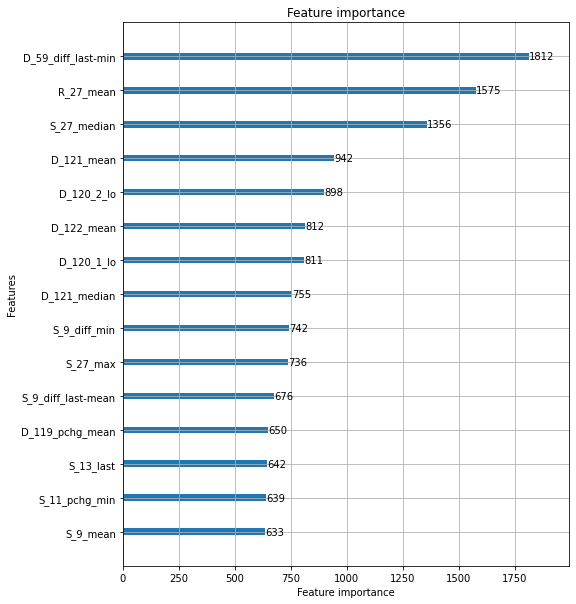

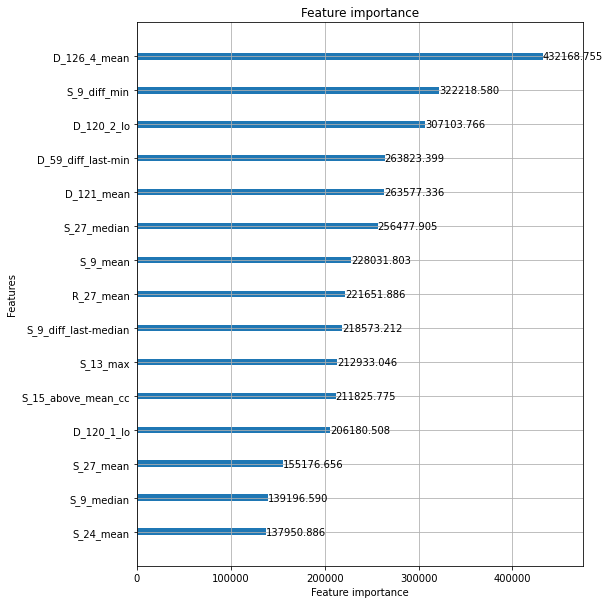

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.982341
[100]	valid_0's auc: 0.990091
[150]	valid_0's auc: 0.993953
[200]	valid_0's auc: 0.996099
[250]	valid_0's auc: 0.997145
[300]	valid_0's auc: 0.997705
[350]	valid_0's auc: 0.998057
[400]	valid_0's auc: 0.998293
[450]	valid_0's auc: 0.998508
[500]	valid_0's auc: 0.998681
[550]	valid_0's auc: 0.998806
[600]	valid_0's auc: 0.998919
[650]	valid_0's auc: 0.99901
[700]	valid_0's auc: 0.999064
[750]	valid_0's auc: 0.999122
[800]	valid_0's auc: 0.99918
[850]	valid_0's auc: 0.99923
[900]	valid_0's auc: 0.999265
[950]	valid_0's auc: 0.999301
[1000]	valid_0's auc: 0.999326
[1050]	valid_0's auc: 0.99935
[1100]	valid_0's auc: 0.999374
[1150]	valid_0's auc: 0.999393
[1200]	valid_0's auc: 0.999407
[1250]	valid_0's auc: 0.999425
[1300]	valid_0's auc: 0.999435
[1350]	valid_0's auc: 0.999448
[1400]	valid_0's auc: 0.99946
[1450]	valid_0's auc: 0.999473
[1500]	valid_0's auc: 0.999486
[1550]	valid_0's auc: 0.999493
[1

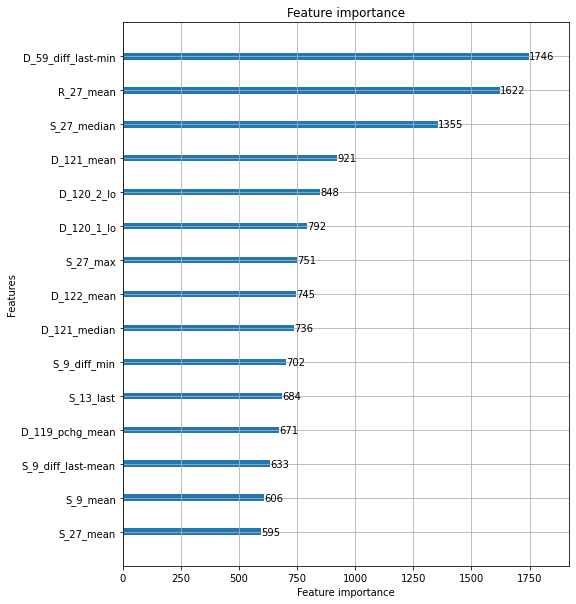

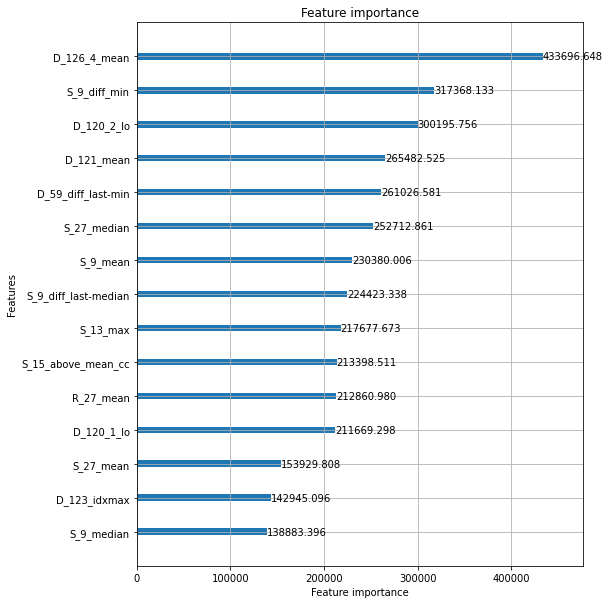

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.982452
[100]	valid_0's auc: 0.989734
[150]	valid_0's auc: 0.993974
[200]	valid_0's auc: 0.996121
[250]	valid_0's auc: 0.997142
[300]	valid_0's auc: 0.99775
[350]	valid_0's auc: 0.998108
[400]	valid_0's auc: 0.998368
[450]	valid_0's auc: 0.998574
[500]	valid_0's auc: 0.998716
[550]	valid_0's auc: 0.998845
[600]	valid_0's auc: 0.998942
[650]	valid_0's auc: 0.999024
[700]	valid_0's auc: 0.999086
[750]	valid_0's auc: 0.99914
[800]	valid_0's auc: 0.99919
[850]	valid_0's auc: 0.99924
[900]	valid_0's auc: 0.999268
[950]	valid_0's auc: 0.999299
[1000]	valid_0's auc: 0.999326
[1050]	valid_0's auc: 0.999352
[1100]	valid_0's auc: 0.999385
[1150]	valid_0's auc: 0.999401
[1200]	valid_0's auc: 0.999418
[1250]	valid_0's auc: 0.999433
[1300]	valid_0's auc: 0.999447
[1350]	valid_0's auc: 0.999464
[1400]	valid_0's auc: 0.999482
[1450]	valid_0's auc: 0.999492
[1500]	valid_0's auc: 0.9995
[1550]	valid_0's auc: 0.999511
[16

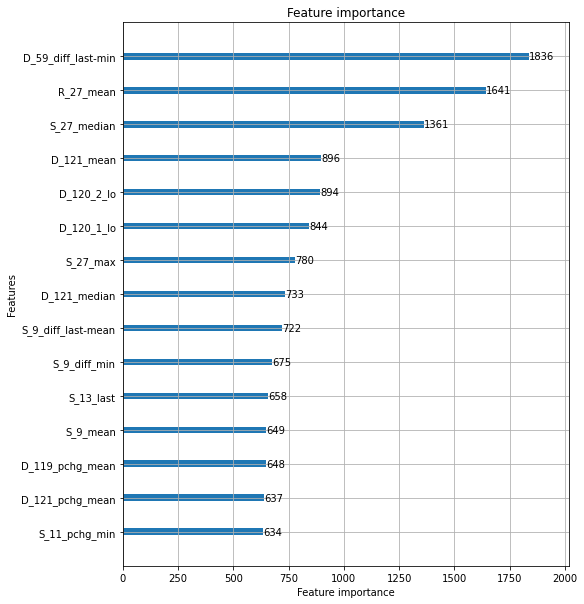

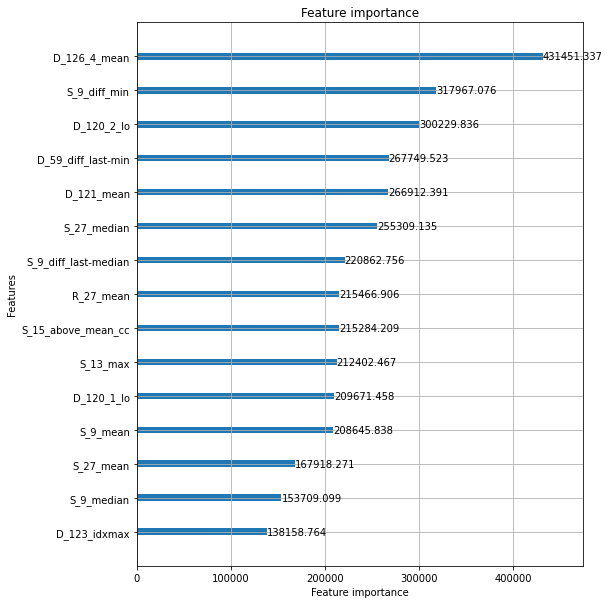

feature to remove: D_126_4_mean
Elapsed time: 19.810798235734303 min.
----------------------------------------------------------------------------------------------------
ITER: 41/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.977235
[100]	valid_0's auc: 0.988351
[150]	valid_0's auc: 0.993035
[200]	valid_0's auc: 0.994931
[250]	valid_0's auc: 0.996266
[300]	valid_0's auc: 0.99709
[350]	valid_0's auc: 0.997526
[400]	valid_0's auc: 0.997849
[450]	valid_0's auc: 0.998118
[500]	valid_0's auc: 0.998302
[550]	valid_0's auc: 0.998492
[600]	valid_0's auc: 0.998621
[650]	valid_0's auc: 0.998736
[700]	valid_0's auc: 0.998823
[750]	valid_0's auc: 0.998901
[800]	valid_0's auc: 0.998968
[850]	valid_0's auc: 0.999027
[900]	valid_0's auc: 0.999073
[950]	valid_0's auc: 0.999111
[1000]	valid_0's auc: 0.999154
[1050]	valid_0's auc: 0.999193
[1100]	valid_0's auc: 0.99922
[1150]	valid_0's auc: 0.999245
[1200]	valid_0's auc: 0.999262
[1250]	valid_0's auc: 0.999285
[

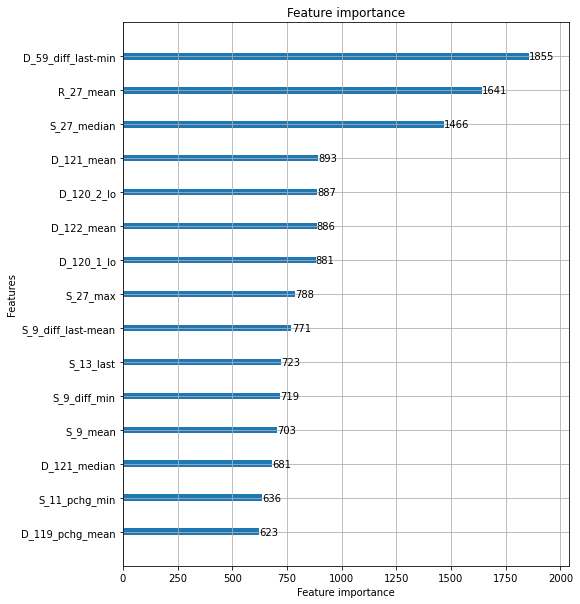

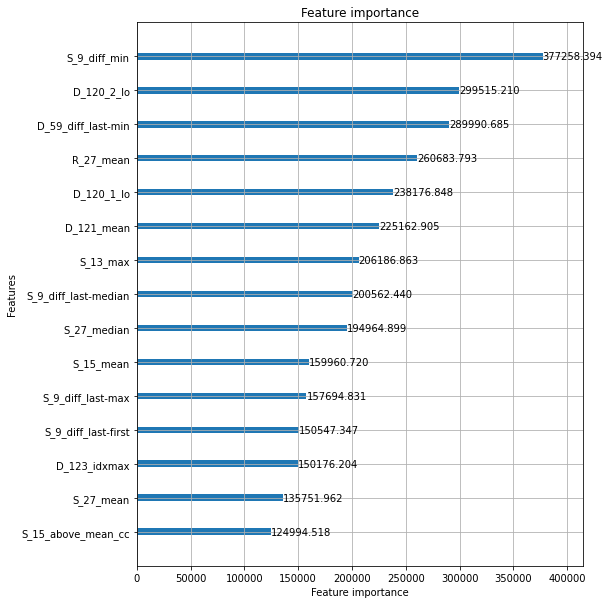

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.977391
[100]	valid_0's auc: 0.987987
[150]	valid_0's auc: 0.992802
[200]	valid_0's auc: 0.995112
[250]	valid_0's auc: 0.996435
[300]	valid_0's auc: 0.997155
[350]	valid_0's auc: 0.997561
[400]	valid_0's auc: 0.997889
[450]	valid_0's auc: 0.998188
[500]	valid_0's auc: 0.998395
[550]	valid_0's auc: 0.998548
[600]	valid_0's auc: 0.99867
[650]	valid_0's auc: 0.998773
[700]	valid_0's auc: 0.998864
[750]	valid_0's auc: 0.998934
[800]	valid_0's auc: 0.998997
[850]	valid_0's auc: 0.999046
[900]	valid_0's auc: 0.999089
[950]	valid_0's auc: 0.999131
[1000]	valid_0's auc: 0.99917
[1050]	valid_0's auc: 0.999197
[1100]	valid_0's auc: 0.999227
[1150]	valid_0's auc: 0.999246
[1200]	valid_0's auc: 0.999264
[1250]	valid_0's auc: 0.999288
[1300]	valid_0's auc: 0.999309
[1350]	valid_0's auc: 0.999324
[1400]	valid_0's auc: 0.999342
[1450]	valid_0's auc: 0.999356
[1500]	valid_0's auc: 0.999368
[1550]	valid_0's auc: 0.999376

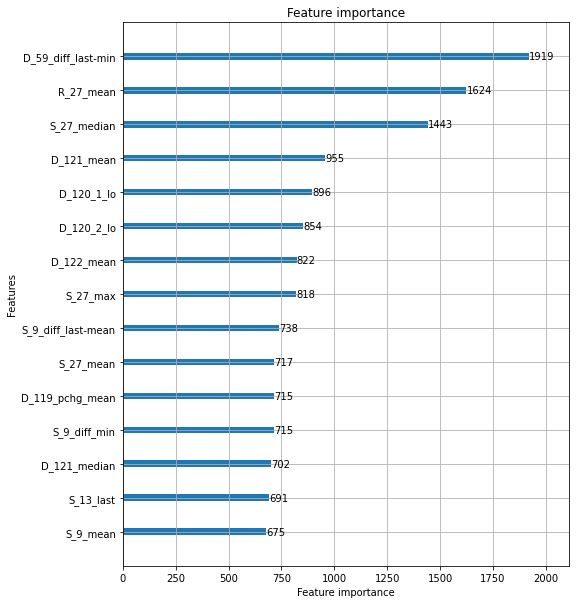

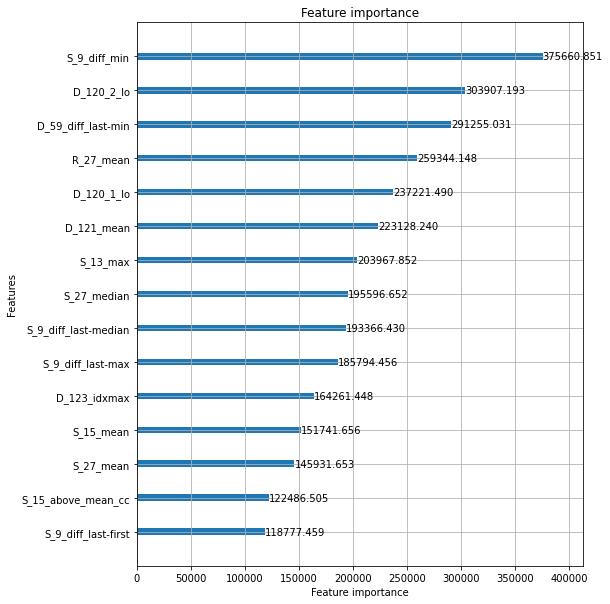

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.977655
[100]	valid_0's auc: 0.987772
[150]	valid_0's auc: 0.992623
[200]	valid_0's auc: 0.995224
[250]	valid_0's auc: 0.996536
[300]	valid_0's auc: 0.997208
[350]	valid_0's auc: 0.997636
[400]	valid_0's auc: 0.997977
[450]	valid_0's auc: 0.998248
[500]	valid_0's auc: 0.998434
[550]	valid_0's auc: 0.998592
[600]	valid_0's auc: 0.998719
[650]	valid_0's auc: 0.998822
[700]	valid_0's auc: 0.998894
[750]	valid_0's auc: 0.998962
[800]	valid_0's auc: 0.99904
[850]	valid_0's auc: 0.999094
[900]	valid_0's auc: 0.999142
[950]	valid_0's auc: 0.999179
[1000]	valid_0's auc: 0.999213
[1050]	valid_0's auc: 0.999241
[1100]	valid_0's auc: 0.999275
[1150]	valid_0's auc: 0.9993
[1200]	valid_0's auc: 0.999316
[1250]	valid_0's auc: 0.999333
[1300]	valid_0's auc: 0.999352
[1350]	valid_0's auc: 0.999369
[1400]	valid_0's auc: 0.999385
[1450]	valid_0's auc: 0.999399
[1500]	valid_0's auc: 0.999411
[1550]	valid_0's auc: 0.99942
[

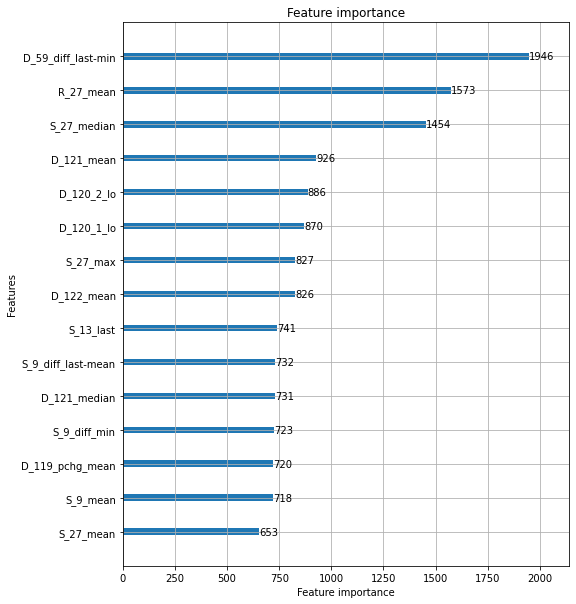

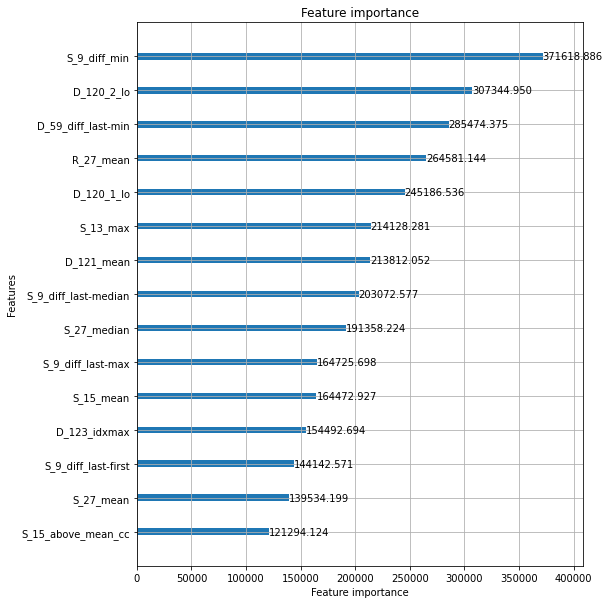

feature to remove: S_9_diff_min
Elapsed time: 20.69712346792221 min.
----------------------------------------------------------------------------------------------------
ITER: 42/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.976435
[100]	valid_0's auc: 0.988845
[150]	valid_0's auc: 0.992975
[200]	valid_0's auc: 0.994969
[250]	valid_0's auc: 0.996287
[300]	valid_0's auc: 0.996985
[350]	valid_0's auc: 0.997469
[400]	valid_0's auc: 0.997769
[450]	valid_0's auc: 0.998024
[500]	valid_0's auc: 0.998224
[550]	valid_0's auc: 0.998394
[600]	valid_0's auc: 0.998557
[650]	valid_0's auc: 0.998661
[700]	valid_0's auc: 0.998755
[750]	valid_0's auc: 0.998838
[800]	valid_0's auc: 0.99891
[850]	valid_0's auc: 0.99896
[900]	valid_0's auc: 0.999021
[950]	valid_0's auc: 0.999065
[1000]	valid_0's auc: 0.999108
[1050]	valid_0's auc: 0.999143
[1100]	valid_0's auc: 0.999167
[1150]	valid_0's auc: 0.99919
[1200]	valid_0's auc: 0.999214
[1250]	valid_0's auc: 0.999236
[13

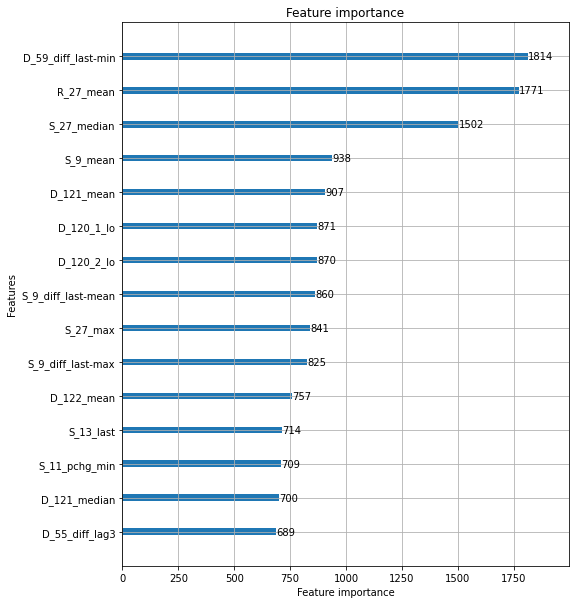

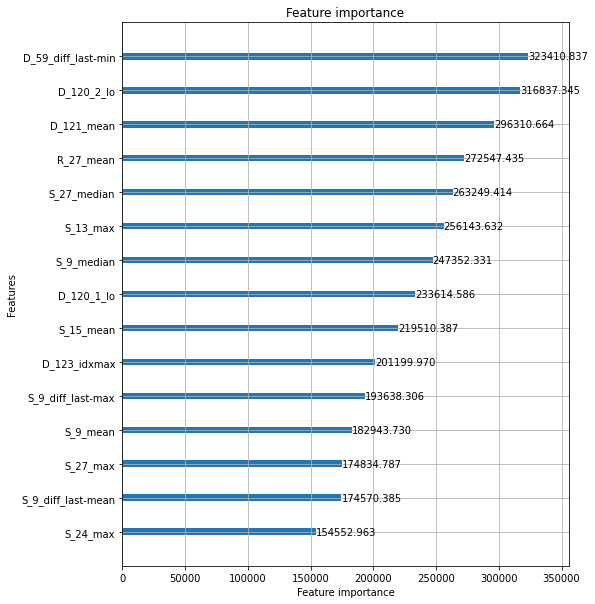

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.976217
[100]	valid_0's auc: 0.988242
[150]	valid_0's auc: 0.993087
[200]	valid_0's auc: 0.995063
[250]	valid_0's auc: 0.996311
[300]	valid_0's auc: 0.997053
[350]	valid_0's auc: 0.997511
[400]	valid_0's auc: 0.997857
[450]	valid_0's auc: 0.998106
[500]	valid_0's auc: 0.998304
[550]	valid_0's auc: 0.998465
[600]	valid_0's auc: 0.998599
[650]	valid_0's auc: 0.998697
[700]	valid_0's auc: 0.998786
[750]	valid_0's auc: 0.998861
[800]	valid_0's auc: 0.998925
[850]	valid_0's auc: 0.998983
[900]	valid_0's auc: 0.999036
[950]	valid_0's auc: 0.999086
[1000]	valid_0's auc: 0.999115
[1050]	valid_0's auc: 0.999147
[1100]	valid_0's auc: 0.999175
[1150]	valid_0's auc: 0.999206
[1200]	valid_0's auc: 0.999231
[1250]	valid_0's auc: 0.999257
[1300]	valid_0's auc: 0.999271
[1350]	valid_0's auc: 0.999288
[1400]	valid_0's auc: 0.999308
[1450]	valid_0's auc: 0.999322
[1500]	valid_0's auc: 0.999332
[1550]	valid_0's auc: 0.9993

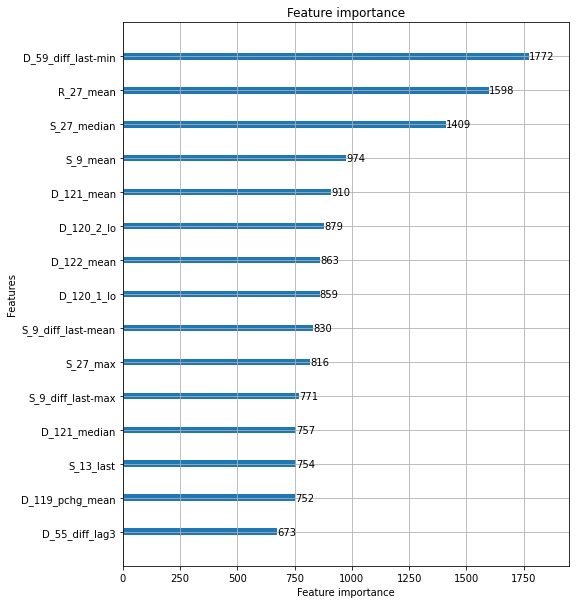

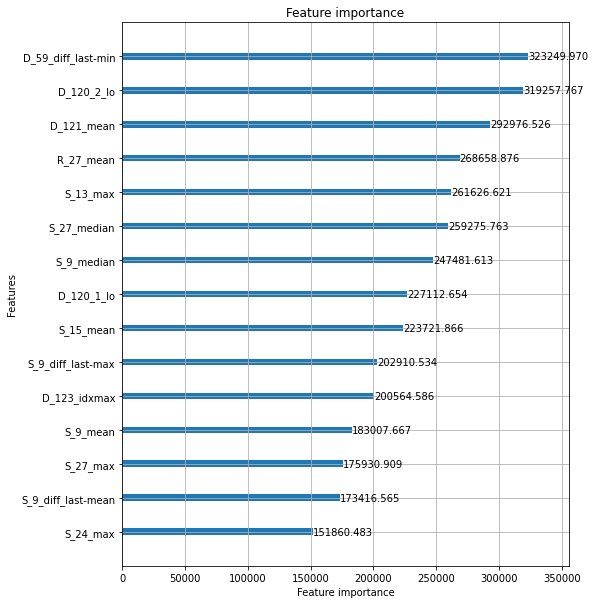

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.974712
[100]	valid_0's auc: 0.987702
[150]	valid_0's auc: 0.992855
[200]	valid_0's auc: 0.994973
[250]	valid_0's auc: 0.99629
[300]	valid_0's auc: 0.997008
[350]	valid_0's auc: 0.997517
[400]	valid_0's auc: 0.997816
[450]	valid_0's auc: 0.998139
[500]	valid_0's auc: 0.998331
[550]	valid_0's auc: 0.998495
[600]	valid_0's auc: 0.998639
[650]	valid_0's auc: 0.998761
[700]	valid_0's auc: 0.998854
[750]	valid_0's auc: 0.998918
[800]	valid_0's auc: 0.998976
[850]	valid_0's auc: 0.999035
[900]	valid_0's auc: 0.999081
[950]	valid_0's auc: 0.999122
[1000]	valid_0's auc: 0.999153
[1050]	valid_0's auc: 0.999183
[1100]	valid_0's auc: 0.999212
[1150]	valid_0's auc: 0.999242
[1200]	valid_0's auc: 0.999267
[1250]	valid_0's auc: 0.999291
[1300]	valid_0's auc: 0.999308
[1350]	valid_0's auc: 0.999325
[1400]	valid_0's auc: 0.999342
[1450]	valid_0's auc: 0.999359
[1500]	valid_0's auc: 0.999373
[1550]	valid_0's auc: 0.99938

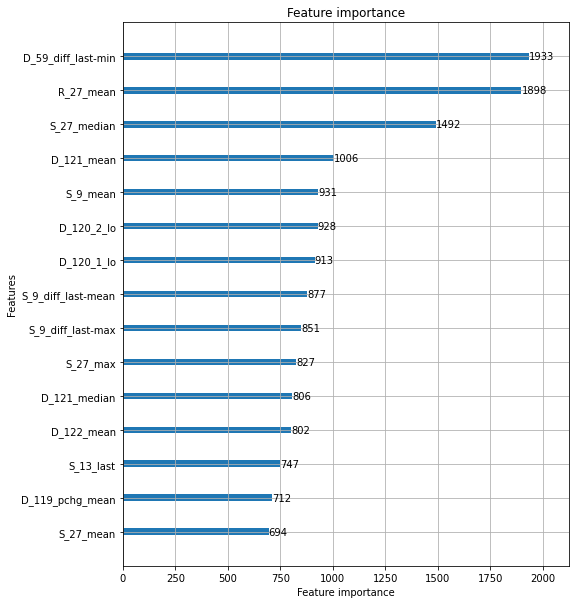

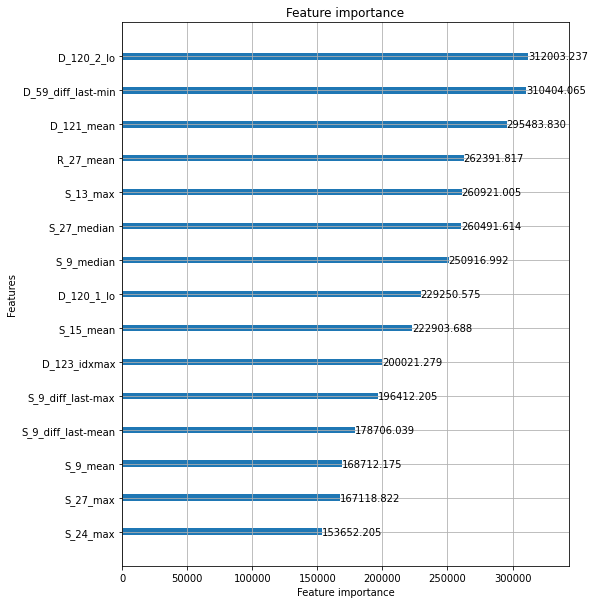

feature to remove: D_59_diff_last-min
Elapsed time: 21.164071718851726 min.
----------------------------------------------------------------------------------------------------
ITER: 43/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.971684
[100]	valid_0's auc: 0.985599
[150]	valid_0's auc: 0.991029
[200]	valid_0's auc: 0.993916
[250]	valid_0's auc: 0.995215
[300]	valid_0's auc: 0.996217
[350]	valid_0's auc: 0.996695
[400]	valid_0's auc: 0.99714
[450]	valid_0's auc: 0.997458
[500]	valid_0's auc: 0.997697
[550]	valid_0's auc: 0.997899
[600]	valid_0's auc: 0.998069
[650]	valid_0's auc: 0.998191
[700]	valid_0's auc: 0.998343
[750]	valid_0's auc: 0.998465
[800]	valid_0's auc: 0.998549
[850]	valid_0's auc: 0.998635
[900]	valid_0's auc: 0.998718
[950]	valid_0's auc: 0.998775
[1000]	valid_0's auc: 0.99882
[1050]	valid_0's auc: 0.998862
[1100]	valid_0's auc: 0.998896
[1150]	valid_0's auc: 0.998946
[1200]	valid_0's auc: 0.998972
[1250]	valid_0's auc: 0.99

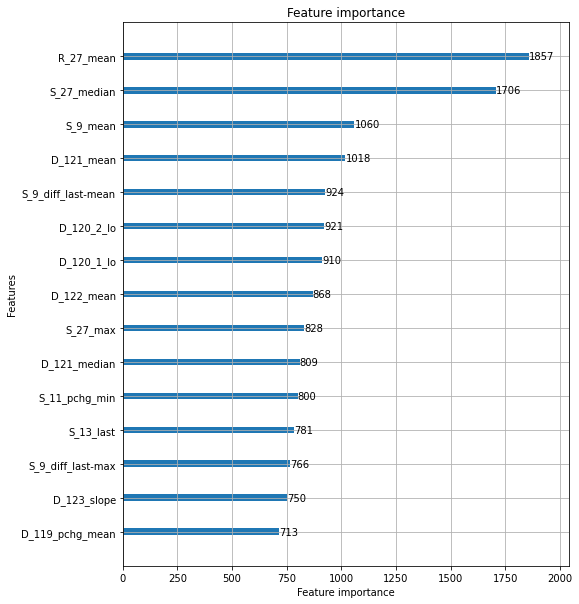

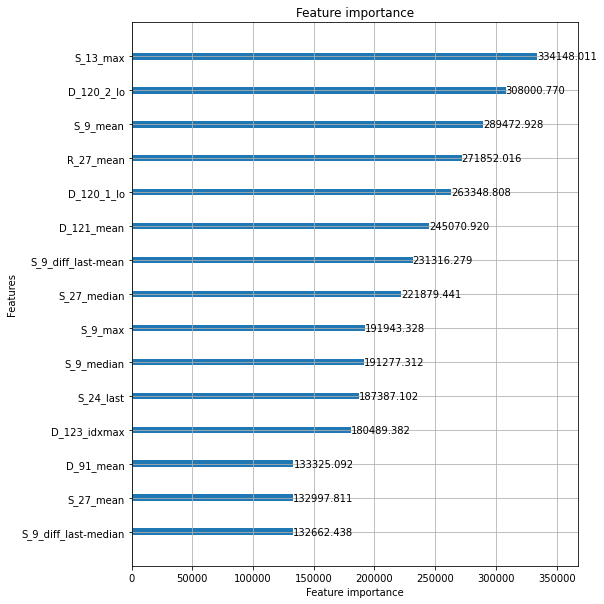

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.969979
[100]	valid_0's auc: 0.985542
[150]	valid_0's auc: 0.991417
[200]	valid_0's auc: 0.994098
[250]	valid_0's auc: 0.995421
[300]	valid_0's auc: 0.996401
[350]	valid_0's auc: 0.996871
[400]	valid_0's auc: 0.997269
[450]	valid_0's auc: 0.997593
[500]	valid_0's auc: 0.997828
[550]	valid_0's auc: 0.998044
[600]	valid_0's auc: 0.998196
[650]	valid_0's auc: 0.998317
[700]	valid_0's auc: 0.998438
[750]	valid_0's auc: 0.998551
[800]	valid_0's auc: 0.998626
[850]	valid_0's auc: 0.998682
[900]	valid_0's auc: 0.998773
[950]	valid_0's auc: 0.998813
[1000]	valid_0's auc: 0.99886
[1050]	valid_0's auc: 0.998903
[1100]	valid_0's auc: 0.998937
[1150]	valid_0's auc: 0.998976
[1200]	valid_0's auc: 0.999008
[1250]	valid_0's auc: 0.99903
[1300]	valid_0's auc: 0.999063
[1350]	valid_0's auc: 0.999081
[1400]	valid_0's auc: 0.999101
[1450]	valid_0's auc: 0.999118
[1500]	valid_0's auc: 0.999134
[1550]	valid_0's auc: 0.999149

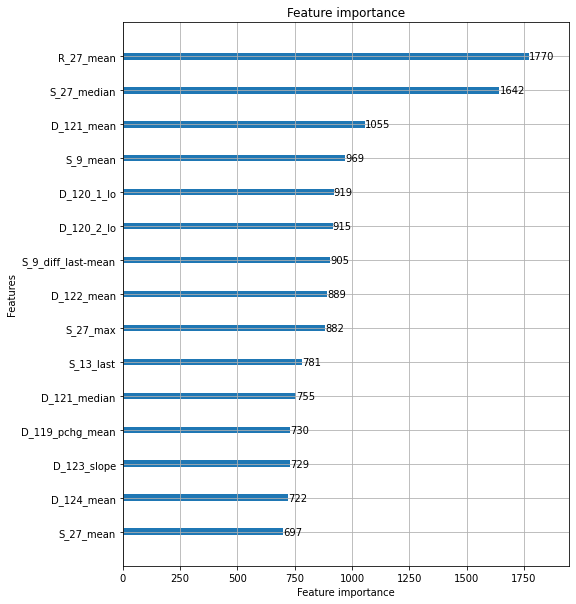

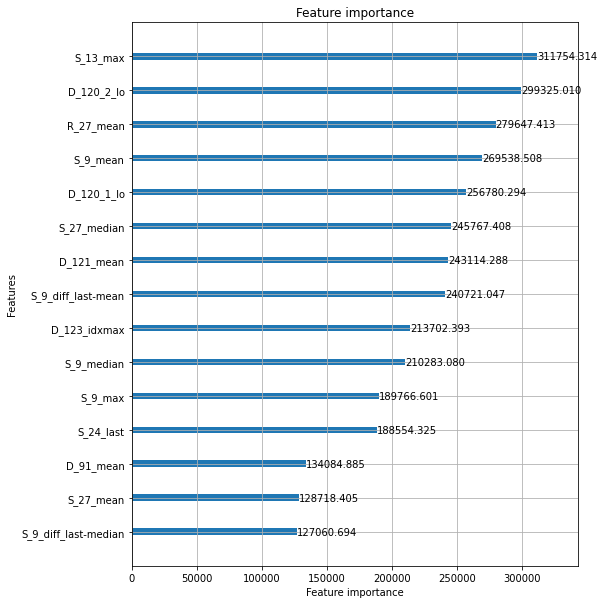

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.970534
[100]	valid_0's auc: 0.985544
[150]	valid_0's auc: 0.991588
[200]	valid_0's auc: 0.994261
[250]	valid_0's auc: 0.995637
[300]	valid_0's auc: 0.996407
[350]	valid_0's auc: 0.996863
[400]	valid_0's auc: 0.997336
[450]	valid_0's auc: 0.997664
[500]	valid_0's auc: 0.997899
[550]	valid_0's auc: 0.998073
[600]	valid_0's auc: 0.998242
[650]	valid_0's auc: 0.998376
[700]	valid_0's auc: 0.998483
[750]	valid_0's auc: 0.998576
[800]	valid_0's auc: 0.998662
[850]	valid_0's auc: 0.99874
[900]	valid_0's auc: 0.998817
[950]	valid_0's auc: 0.998866
[1000]	valid_0's auc: 0.998906
[1050]	valid_0's auc: 0.998956
[1100]	valid_0's auc: 0.998993
[1150]	valid_0's auc: 0.99902
[1200]	valid_0's auc: 0.999052
[1250]	valid_0's auc: 0.999078
[1300]	valid_0's auc: 0.999103
[1350]	valid_0's auc: 0.999132
[1400]	valid_0's auc: 0.999151
[1450]	valid_0's auc: 0.999169
[1500]	valid_0's auc: 0.999182
[1550]	valid_0's auc: 0.999201

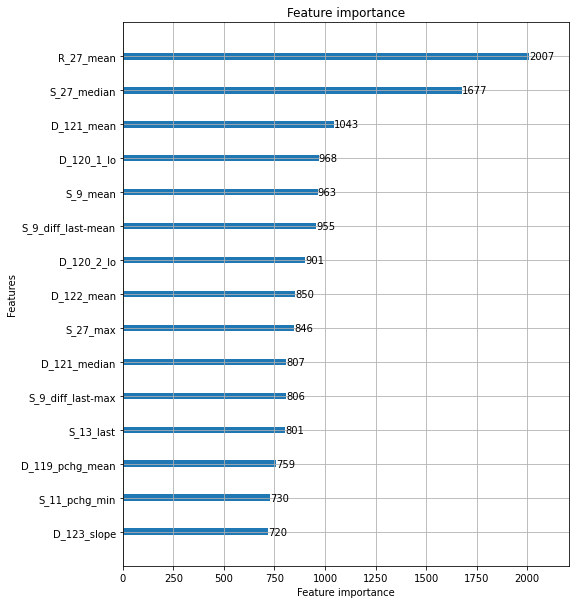

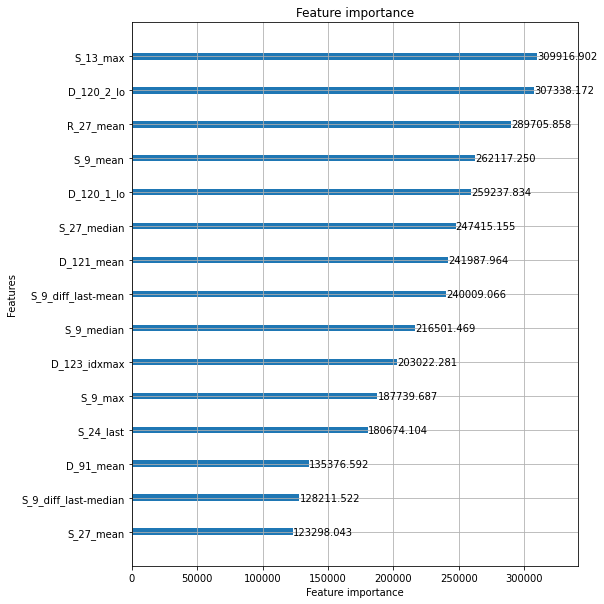

feature to remove: S_13_max
Elapsed time: 22.78004633585612 min.
----------------------------------------------------------------------------------------------------
ITER: 44/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.976029
[100]	valid_0's auc: 0.986705
[150]	valid_0's auc: 0.992432
[200]	valid_0's auc: 0.994578
[250]	valid_0's auc: 0.995557
[300]	valid_0's auc: 0.996379
[350]	valid_0's auc: 0.99685
[400]	valid_0's auc: 0.997238
[450]	valid_0's auc: 0.997522
[500]	valid_0's auc: 0.997732
[550]	valid_0's auc: 0.99796
[600]	valid_0's auc: 0.998147
[650]	valid_0's auc: 0.99828
[700]	valid_0's auc: 0.998381
[750]	valid_0's auc: 0.998471
[800]	valid_0's auc: 0.998555
[850]	valid_0's auc: 0.998612
[900]	valid_0's auc: 0.998689
[950]	valid_0's auc: 0.998746
[1000]	valid_0's auc: 0.998811
[1050]	valid_0's auc: 0.998847
[1100]	valid_0's auc: 0.998885
[1150]	valid_0's auc: 0.998927
[1200]	valid_0's auc: 0.998958
[1250]	valid_0's auc: 0.998987
[1300]	

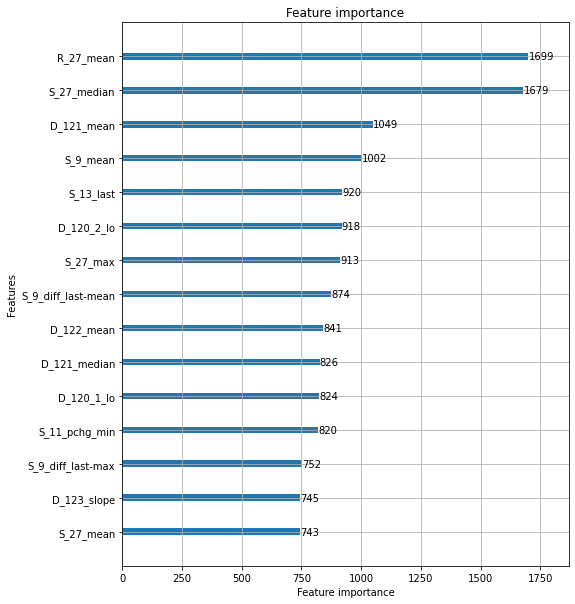

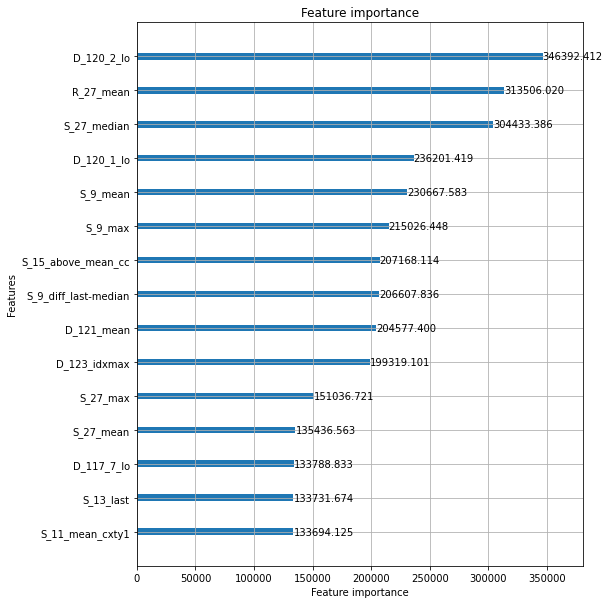

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.97661
[100]	valid_0's auc: 0.986997
[150]	valid_0's auc: 0.992288
[200]	valid_0's auc: 0.994406
[250]	valid_0's auc: 0.995675
[300]	valid_0's auc: 0.996426
[350]	valid_0's auc: 0.996945
[400]	valid_0's auc: 0.997304
[450]	valid_0's auc: 0.997624
[500]	valid_0's auc: 0.997858
[550]	valid_0's auc: 0.998067
[600]	valid_0's auc: 0.998213
[650]	valid_0's auc: 0.998338
[700]	valid_0's auc: 0.998466
[750]	valid_0's auc: 0.998562
[800]	valid_0's auc: 0.998625
[850]	valid_0's auc: 0.998695
[900]	valid_0's auc: 0.998762
[950]	valid_0's auc: 0.998809
[1000]	valid_0's auc: 0.998869
[1050]	valid_0's auc: 0.998908
[1100]	valid_0's auc: 0.998933
[1150]	valid_0's auc: 0.998958
[1200]	valid_0's auc: 0.998985
[1250]	valid_0's auc: 0.999006
[1300]	valid_0's auc: 0.999033
[1350]	valid_0's auc: 0.999063
[1400]	valid_0's auc: 0.999084
[1450]	valid_0's auc: 0.999099
[1500]	valid_0's auc: 0.999113
[1550]	valid_0's auc: 0.99912

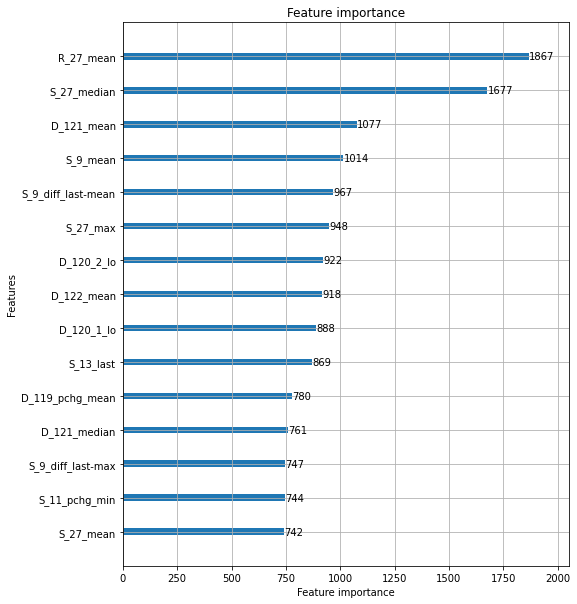

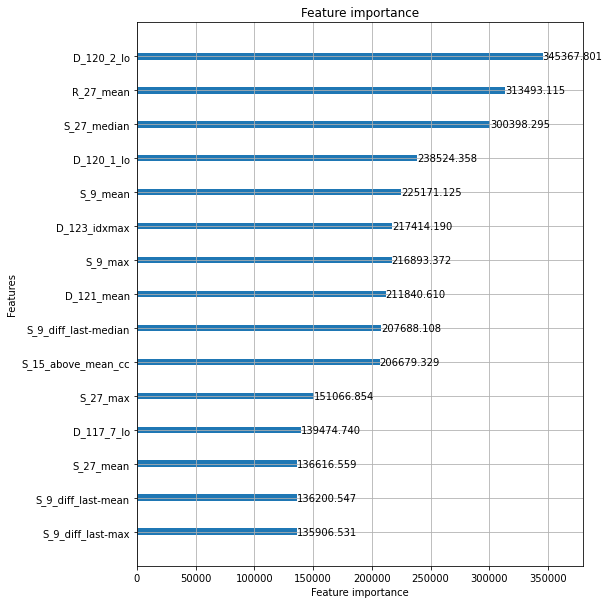

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.975991
[100]	valid_0's auc: 0.987395
[150]	valid_0's auc: 0.992415
[200]	valid_0's auc: 0.994629
[250]	valid_0's auc: 0.995698
[300]	valid_0's auc: 0.996476
[350]	valid_0's auc: 0.99703
[400]	valid_0's auc: 0.997438
[450]	valid_0's auc: 0.997718
[500]	valid_0's auc: 0.997918
[550]	valid_0's auc: 0.998111
[600]	valid_0's auc: 0.998291
[650]	valid_0's auc: 0.998428
[700]	valid_0's auc: 0.998512
[750]	valid_0's auc: 0.998606
[800]	valid_0's auc: 0.998683
[850]	valid_0's auc: 0.998743
[900]	valid_0's auc: 0.9988
[950]	valid_0's auc: 0.998874
[1000]	valid_0's auc: 0.998919
[1050]	valid_0's auc: 0.998963
[1100]	valid_0's auc: 0.998989
[1150]	valid_0's auc: 0.999018
[1200]	valid_0's auc: 0.999044
[1250]	valid_0's auc: 0.999072
[1300]	valid_0's auc: 0.999099
[1350]	valid_0's auc: 0.999121
[1400]	valid_0's auc: 0.999143
[1450]	valid_0's auc: 0.999157
[1500]	valid_0's auc: 0.999178
[1550]	valid_0's auc: 0.999196


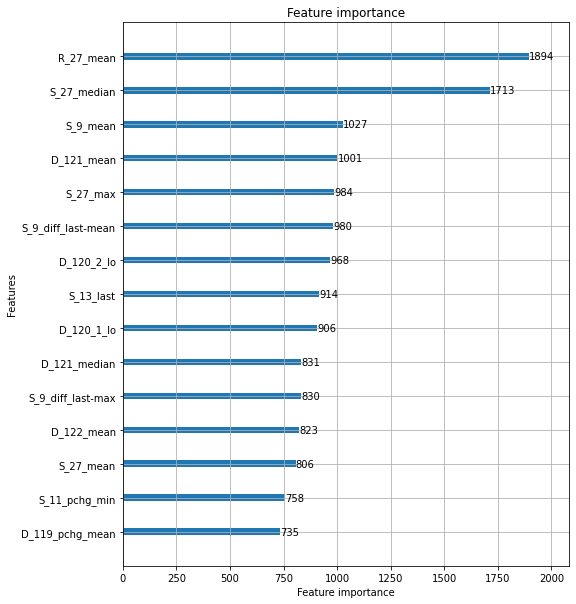

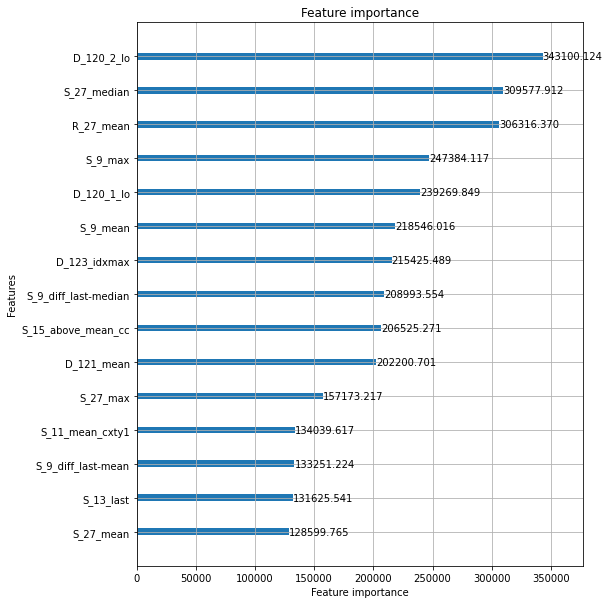

feature to remove: D_120_2_lo
Elapsed time: 23.133559528986613 min.
----------------------------------------------------------------------------------------------------
ITER: 45/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.967456
[100]	valid_0's auc: 0.984096
[150]	valid_0's auc: 0.990431
[200]	valid_0's auc: 0.9931
[250]	valid_0's auc: 0.994427
[300]	valid_0's auc: 0.995382
[350]	valid_0's auc: 0.996065
[400]	valid_0's auc: 0.996569
[450]	valid_0's auc: 0.996983
[500]	valid_0's auc: 0.997294
[550]	valid_0's auc: 0.997528
[600]	valid_0's auc: 0.997713
[650]	valid_0's auc: 0.997881
[700]	valid_0's auc: 0.998033
[750]	valid_0's auc: 0.998157
[800]	valid_0's auc: 0.998258
[850]	valid_0's auc: 0.998341
[900]	valid_0's auc: 0.998419
[950]	valid_0's auc: 0.9985
[1000]	valid_0's auc: 0.998577
[1050]	valid_0's auc: 0.998631
[1100]	valid_0's auc: 0.998688
[1150]	valid_0's auc: 0.998727
[1200]	valid_0's auc: 0.998774
[1250]	valid_0's auc: 0.998795
[1300

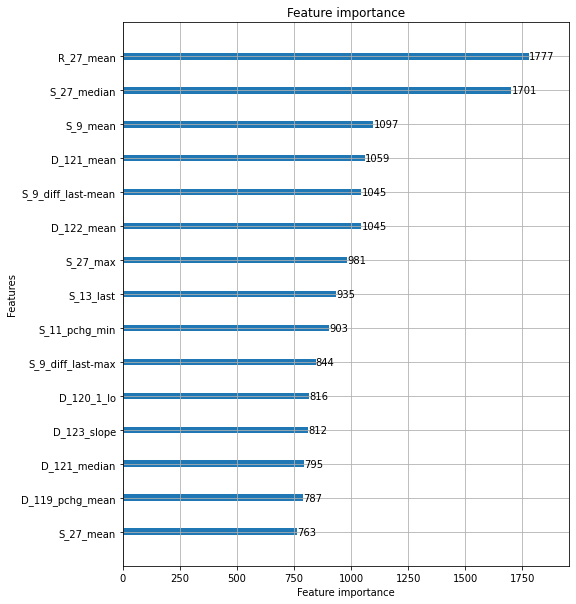

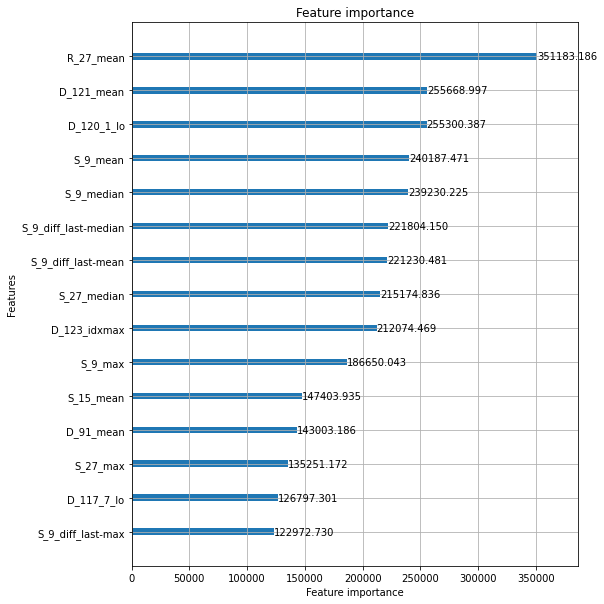

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.967075
[100]	valid_0's auc: 0.983814
[150]	valid_0's auc: 0.990414
[200]	valid_0's auc: 0.993074
[250]	valid_0's auc: 0.99462
[300]	valid_0's auc: 0.995592
[350]	valid_0's auc: 0.996218
[400]	valid_0's auc: 0.996708
[450]	valid_0's auc: 0.997057
[500]	valid_0's auc: 0.99739
[550]	valid_0's auc: 0.997589
[600]	valid_0's auc: 0.997788
[650]	valid_0's auc: 0.997953
[700]	valid_0's auc: 0.998086
[750]	valid_0's auc: 0.998213
[800]	valid_0's auc: 0.99833
[850]	valid_0's auc: 0.998411
[900]	valid_0's auc: 0.998485
[950]	valid_0's auc: 0.998545
[1000]	valid_0's auc: 0.998597
[1050]	valid_0's auc: 0.998649
[1100]	valid_0's auc: 0.998692
[1150]	valid_0's auc: 0.998735
[1200]	valid_0's auc: 0.998771
[1250]	valid_0's auc: 0.998805
[1300]	valid_0's auc: 0.99885
[1350]	valid_0's auc: 0.998869
[1400]	valid_0's auc: 0.998908
[1450]	valid_0's auc: 0.998932
[1500]	valid_0's auc: 0.998951
[1550]	valid_0's auc: 0.998965
[

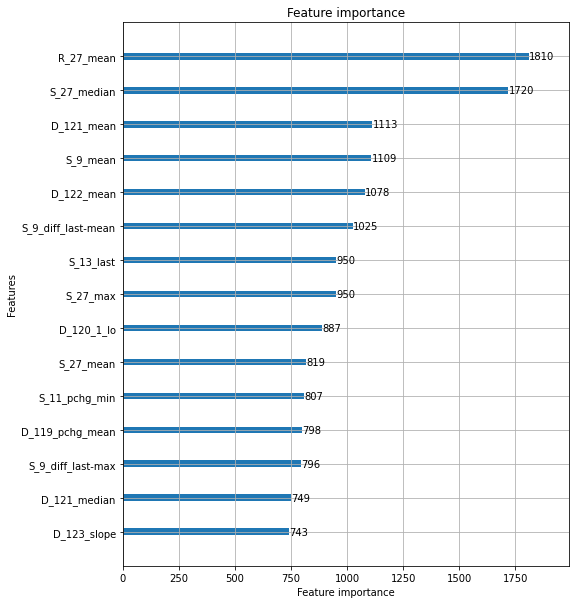

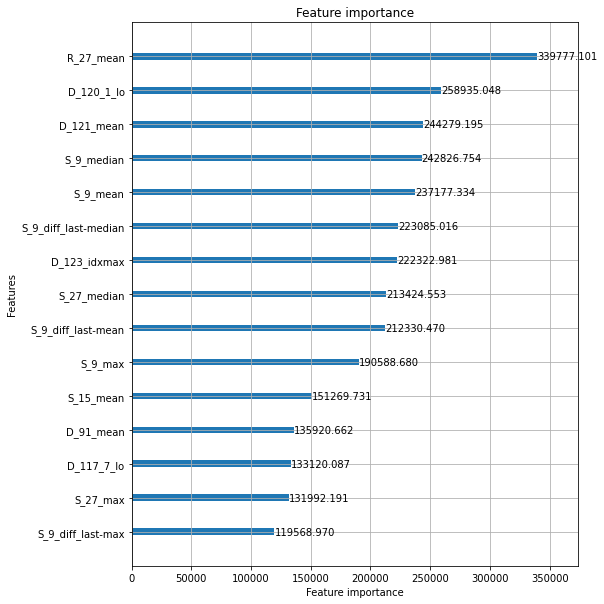

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.967069
[100]	valid_0's auc: 0.983931
[150]	valid_0's auc: 0.990336
[200]	valid_0's auc: 0.992921
[250]	valid_0's auc: 0.994558
[300]	valid_0's auc: 0.995407
[350]	valid_0's auc: 0.996152
[400]	valid_0's auc: 0.99664
[450]	valid_0's auc: 0.997055
[500]	valid_0's auc: 0.997375
[550]	valid_0's auc: 0.997599
[600]	valid_0's auc: 0.997781
[650]	valid_0's auc: 0.997964
[700]	valid_0's auc: 0.998111
[750]	valid_0's auc: 0.99824
[800]	valid_0's auc: 0.998349
[850]	valid_0's auc: 0.998434
[900]	valid_0's auc: 0.998503
[950]	valid_0's auc: 0.998565
[1000]	valid_0's auc: 0.99863
[1050]	valid_0's auc: 0.998682
[1100]	valid_0's auc: 0.998726
[1150]	valid_0's auc: 0.998768
[1200]	valid_0's auc: 0.998808
[1250]	valid_0's auc: 0.998847
[1300]	valid_0's auc: 0.998883
[1350]	valid_0's auc: 0.998909
[1400]	valid_0's auc: 0.998942
[1450]	valid_0's auc: 0.998964
[1500]	valid_0's auc: 0.998984
[1550]	valid_0's auc: 0.999003


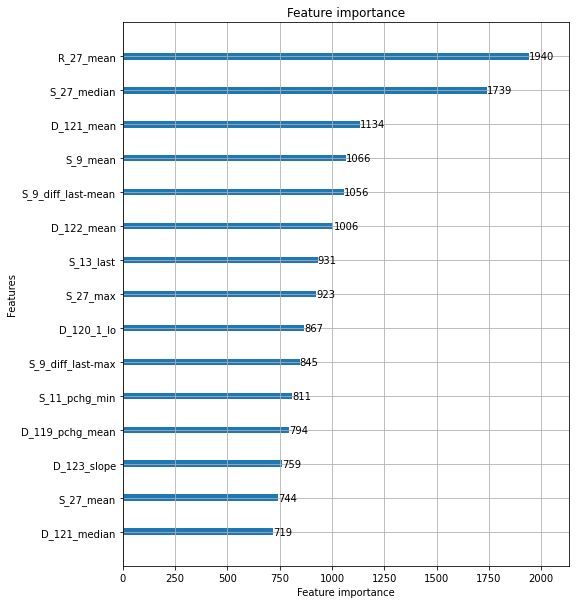

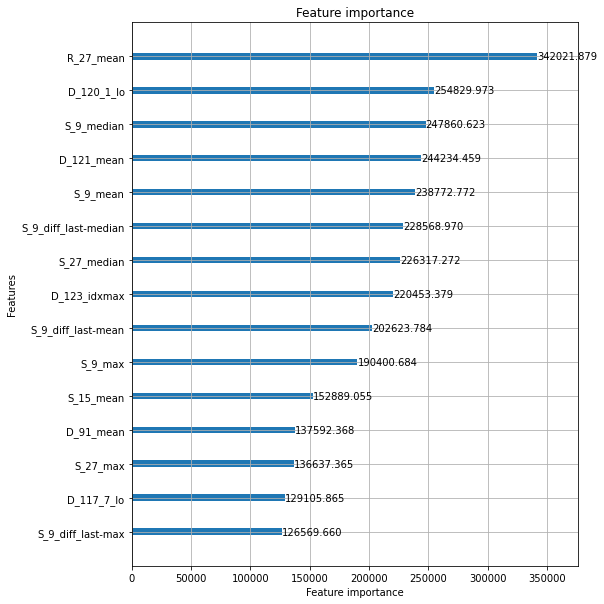

feature to remove: R_27_mean
Elapsed time: 24.41568270524343 min.
----------------------------------------------------------------------------------------------------
ITER: 46/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.96935
[100]	valid_0's auc: 0.982228
[150]	valid_0's auc: 0.988608
[200]	valid_0's auc: 0.991384
[250]	valid_0's auc: 0.992894
[300]	valid_0's auc: 0.99392
[350]	valid_0's auc: 0.994728
[400]	valid_0's auc: 0.995444
[450]	valid_0's auc: 0.995899
[500]	valid_0's auc: 0.996268
[550]	valid_0's auc: 0.996605
[600]	valid_0's auc: 0.996856
[650]	valid_0's auc: 0.997101
[700]	valid_0's auc: 0.997297
[750]	valid_0's auc: 0.997449
[800]	valid_0's auc: 0.997572
[850]	valid_0's auc: 0.997678
[900]	valid_0's auc: 0.997803
[950]	valid_0's auc: 0.997903
[1000]	valid_0's auc: 0.997983
[1050]	valid_0's auc: 0.998059
[1100]	valid_0's auc: 0.99813
[1150]	valid_0's auc: 0.998199
[1200]	valid_0's auc: 0.998282
[1250]	valid_0's auc: 0.998338
[1300]

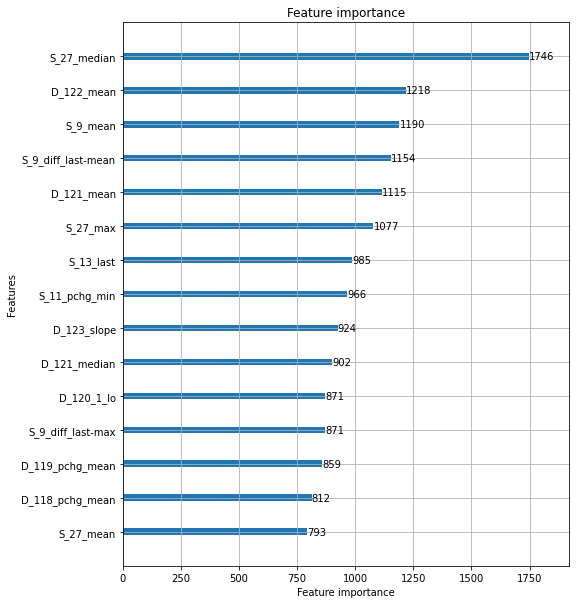

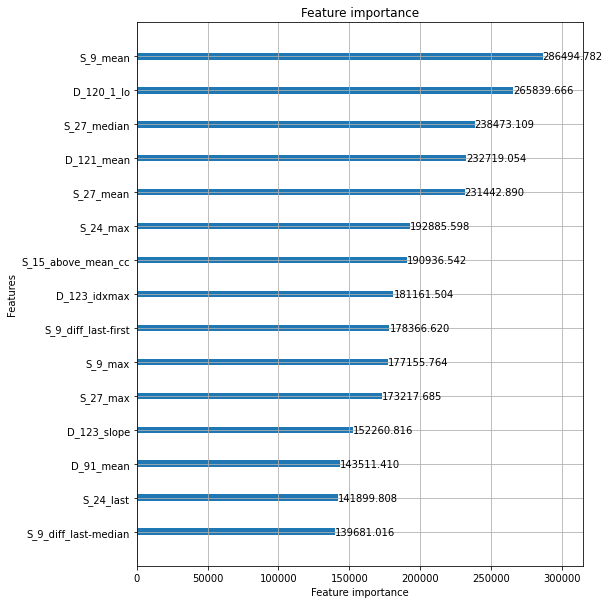

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.968581
[100]	valid_0's auc: 0.981902
[150]	valid_0's auc: 0.98861
[200]	valid_0's auc: 0.991329
[250]	valid_0's auc: 0.992985
[300]	valid_0's auc: 0.993997
[350]	valid_0's auc: 0.994775
[400]	valid_0's auc: 0.995329
[450]	valid_0's auc: 0.995805
[500]	valid_0's auc: 0.996343
[550]	valid_0's auc: 0.996616
[600]	valid_0's auc: 0.996852
[650]	valid_0's auc: 0.99717
[700]	valid_0's auc: 0.997365
[750]	valid_0's auc: 0.997509
[800]	valid_0's auc: 0.997629
[850]	valid_0's auc: 0.997753
[900]	valid_0's auc: 0.997821
[950]	valid_0's auc: 0.997898
[1000]	valid_0's auc: 0.998001
[1050]	valid_0's auc: 0.998081
[1100]	valid_0's auc: 0.998143
[1150]	valid_0's auc: 0.998197
[1200]	valid_0's auc: 0.998255
[1250]	valid_0's auc: 0.998299
[1300]	valid_0's auc: 0.998367
[1350]	valid_0's auc: 0.9984
[1400]	valid_0's auc: 0.998437
[1450]	valid_0's auc: 0.99847
[1500]	valid_0's auc: 0.998499
[1550]	valid_0's auc: 0.998526
[1

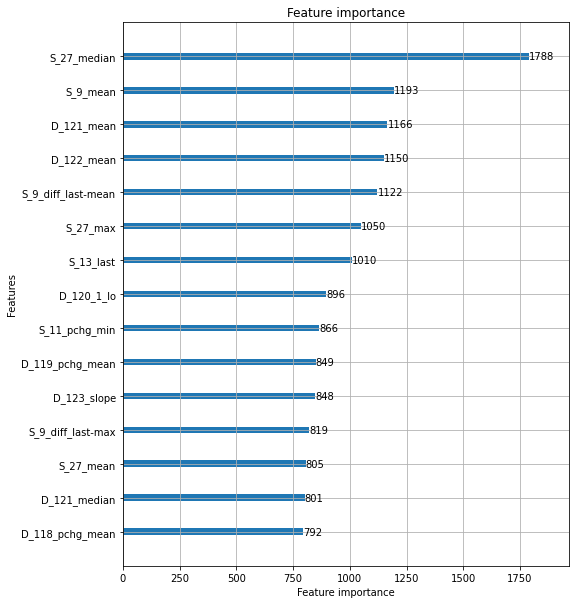

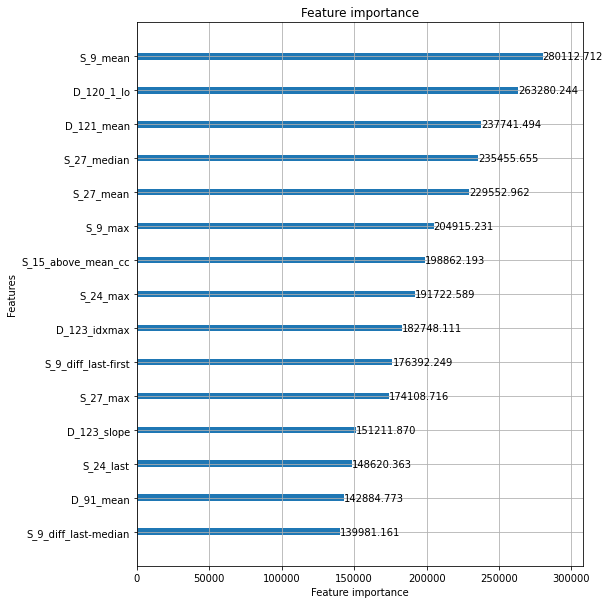

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.967488
[100]	valid_0's auc: 0.98163
[150]	valid_0's auc: 0.988425
[200]	valid_0's auc: 0.991266
[250]	valid_0's auc: 0.992827
[300]	valid_0's auc: 0.993918
[350]	valid_0's auc: 0.994755
[400]	valid_0's auc: 0.995423
[450]	valid_0's auc: 0.995855
[500]	valid_0's auc: 0.996403
[550]	valid_0's auc: 0.996681
[600]	valid_0's auc: 0.996943
[650]	valid_0's auc: 0.997162
[700]	valid_0's auc: 0.997338
[750]	valid_0's auc: 0.997497
[800]	valid_0's auc: 0.997651
[850]	valid_0's auc: 0.997771
[900]	valid_0's auc: 0.997845
[950]	valid_0's auc: 0.997948
[1000]	valid_0's auc: 0.998052
[1050]	valid_0's auc: 0.99813
[1100]	valid_0's auc: 0.998195
[1150]	valid_0's auc: 0.998276
[1200]	valid_0's auc: 0.998325
[1250]	valid_0's auc: 0.998371
[1300]	valid_0's auc: 0.998424
[1350]	valid_0's auc: 0.99848
[1400]	valid_0's auc: 0.998521
[1450]	valid_0's auc: 0.99856
[1500]	valid_0's auc: 0.998586
[1550]	valid_0's auc: 0.998612
[

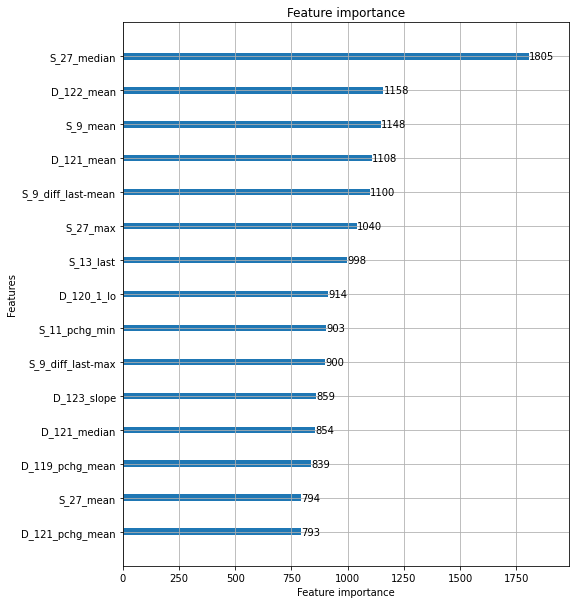

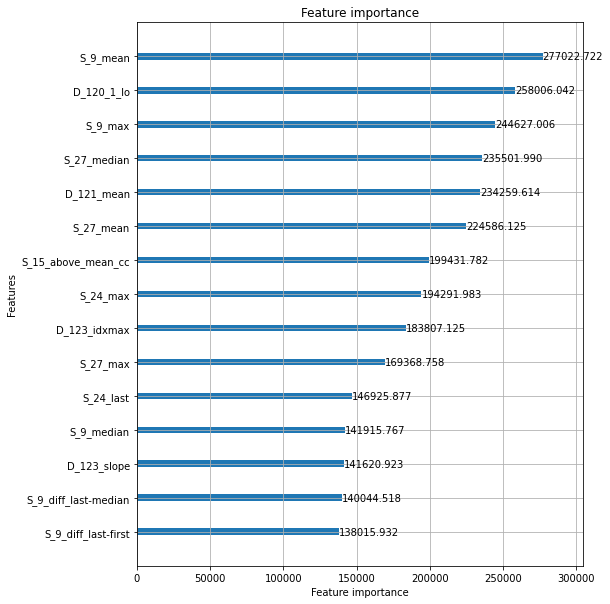

feature to remove: S_9_mean
Elapsed time: 25.986859897772472 min.
----------------------------------------------------------------------------------------------------
ITER: 47/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.968671
[100]	valid_0's auc: 0.982904
[150]	valid_0's auc: 0.989375
[200]	valid_0's auc: 0.991929
[250]	valid_0's auc: 0.993087
[300]	valid_0's auc: 0.994113
[350]	valid_0's auc: 0.994936
[400]	valid_0's auc: 0.995542
[450]	valid_0's auc: 0.995992
[500]	valid_0's auc: 0.996396
[550]	valid_0's auc: 0.996722
[600]	valid_0's auc: 0.99695
[650]	valid_0's auc: 0.99718
[700]	valid_0's auc: 0.997388
[750]	valid_0's auc: 0.997518
[800]	valid_0's auc: 0.997668
[850]	valid_0's auc: 0.997757
[900]	valid_0's auc: 0.997884
[950]	valid_0's auc: 0.997956
[1000]	valid_0's auc: 0.998048
[1050]	valid_0's auc: 0.998116
[1100]	valid_0's auc: 0.998179
[1150]	valid_0's auc: 0.998228
[1200]	valid_0's auc: 0.998272
[1250]	valid_0's auc: 0.998332
[1300

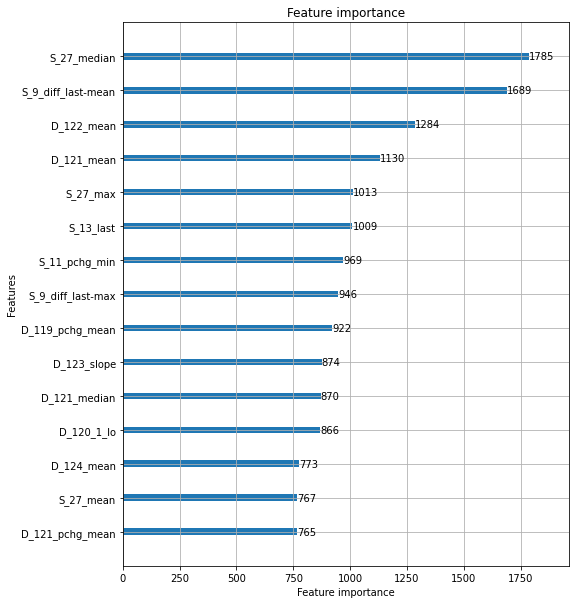

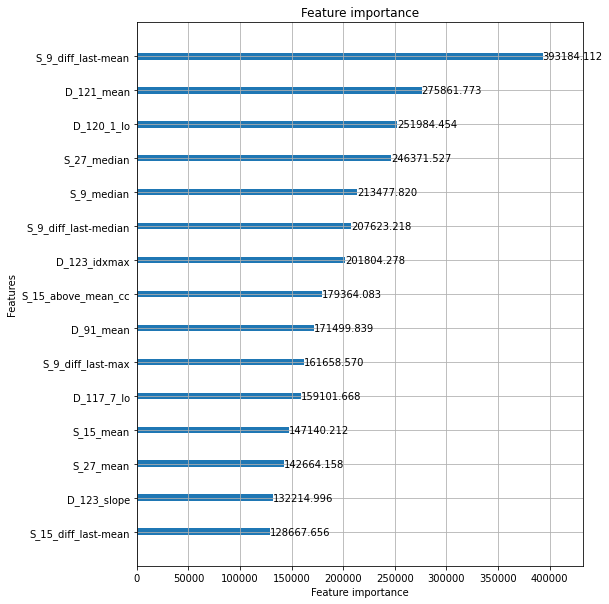

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.968256
[100]	valid_0's auc: 0.982924
[150]	valid_0's auc: 0.98939
[200]	valid_0's auc: 0.991946
[250]	valid_0's auc: 0.993224
[300]	valid_0's auc: 0.994253
[350]	valid_0's auc: 0.995013
[400]	valid_0's auc: 0.995595
[450]	valid_0's auc: 0.996098
[500]	valid_0's auc: 0.996463
[550]	valid_0's auc: 0.996765
[600]	valid_0's auc: 0.996977
[650]	valid_0's auc: 0.997214
[700]	valid_0's auc: 0.997404
[750]	valid_0's auc: 0.997573
[800]	valid_0's auc: 0.997688
[850]	valid_0's auc: 0.99782
[900]	valid_0's auc: 0.997912
[950]	valid_0's auc: 0.997992
[1000]	valid_0's auc: 0.998083
[1050]	valid_0's auc: 0.99815
[1100]	valid_0's auc: 0.998221
[1150]	valid_0's auc: 0.99828
[1200]	valid_0's auc: 0.99833
[1250]	valid_0's auc: 0.998377
[1300]	valid_0's auc: 0.998401
[1350]	valid_0's auc: 0.998438
[1400]	valid_0's auc: 0.998469
[1450]	valid_0's auc: 0.998502
[1500]	valid_0's auc: 0.998522
[1550]	valid_0's auc: 0.998547
[1

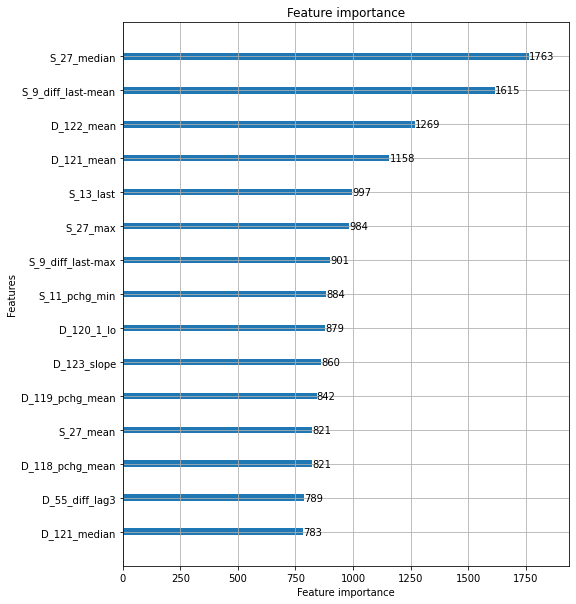

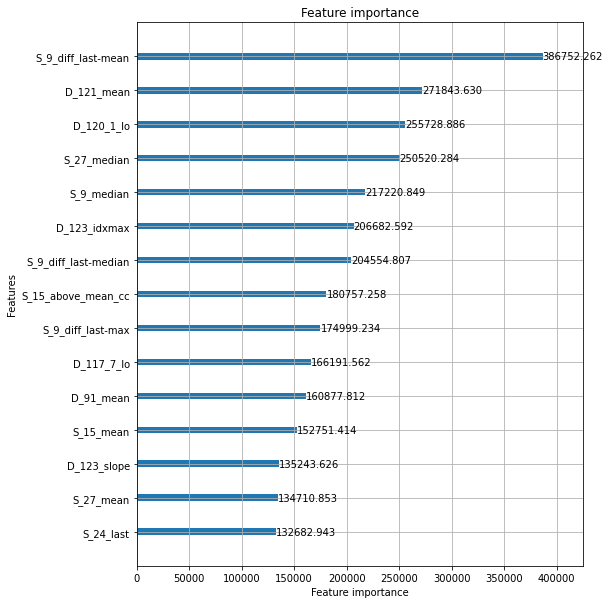

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.968039
[100]	valid_0's auc: 0.982574
[150]	valid_0's auc: 0.989386
[200]	valid_0's auc: 0.991853
[250]	valid_0's auc: 0.993167
[300]	valid_0's auc: 0.994198
[350]	valid_0's auc: 0.995011
[400]	valid_0's auc: 0.995641
[450]	valid_0's auc: 0.996147
[500]	valid_0's auc: 0.996516
[550]	valid_0's auc: 0.996794
[600]	valid_0's auc: 0.99704
[650]	valid_0's auc: 0.997236
[700]	valid_0's auc: 0.997448
[750]	valid_0's auc: 0.997596
[800]	valid_0's auc: 0.997753
[850]	valid_0's auc: 0.997884
[900]	valid_0's auc: 0.998001
[950]	valid_0's auc: 0.998083
[1000]	valid_0's auc: 0.998163
[1050]	valid_0's auc: 0.99824
[1100]	valid_0's auc: 0.998293
[1150]	valid_0's auc: 0.998339
[1200]	valid_0's auc: 0.998385
[1250]	valid_0's auc: 0.998436
[1300]	valid_0's auc: 0.998481
[1350]	valid_0's auc: 0.998509
[1400]	valid_0's auc: 0.998538
[1450]	valid_0's auc: 0.998571
[1500]	valid_0's auc: 0.998593
[1550]	valid_0's auc: 0.998628

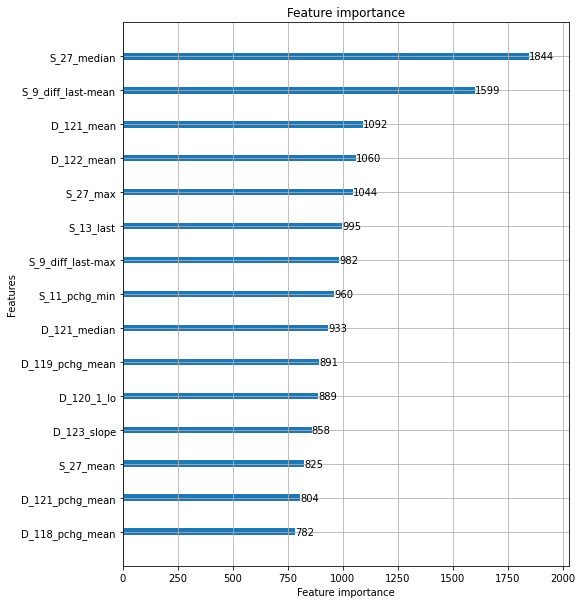

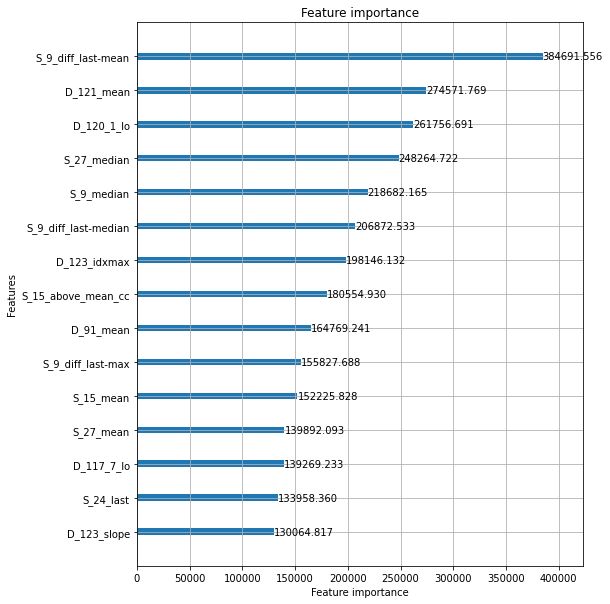

feature to remove: S_9_diff_last-mean
Elapsed time: 26.15118447939555 min.
----------------------------------------------------------------------------------------------------
ITER: 48/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964928
[100]	valid_0's auc: 0.980807
[150]	valid_0's auc: 0.987601
[200]	valid_0's auc: 0.990699
[250]	valid_0's auc: 0.992444
[300]	valid_0's auc: 0.993455
[350]	valid_0's auc: 0.994354
[400]	valid_0's auc: 0.99501
[450]	valid_0's auc: 0.995498
[500]	valid_0's auc: 0.99596
[550]	valid_0's auc: 0.996337
[600]	valid_0's auc: 0.996589
[650]	valid_0's auc: 0.996891
[700]	valid_0's auc: 0.997096
[750]	valid_0's auc: 0.997339
[800]	valid_0's auc: 0.997466
[850]	valid_0's auc: 0.997587
[900]	valid_0's auc: 0.997723
[950]	valid_0's auc: 0.997802
[1000]	valid_0's auc: 0.997915
[1050]	valid_0's auc: 0.997987
[1100]	valid_0's auc: 0.998042
[1150]	valid_0's auc: 0.998087
[1200]	valid_0's auc: 0.998136
[1250]	valid_0's auc: 0.998

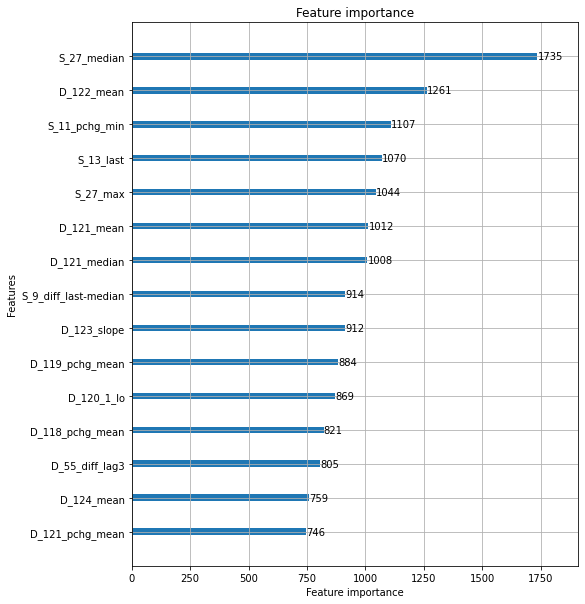

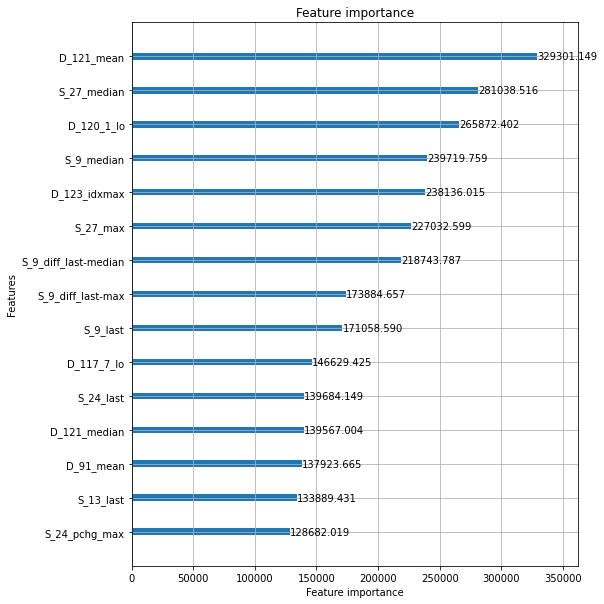

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964965
[100]	valid_0's auc: 0.980918
[150]	valid_0's auc: 0.986988
[200]	valid_0's auc: 0.990308
[250]	valid_0's auc: 0.992233
[300]	valid_0's auc: 0.993399
[350]	valid_0's auc: 0.994264
[400]	valid_0's auc: 0.994973
[450]	valid_0's auc: 0.995468
[500]	valid_0's auc: 0.995879
[550]	valid_0's auc: 0.996268
[600]	valid_0's auc: 0.996569
[650]	valid_0's auc: 0.996821
[700]	valid_0's auc: 0.997048
[750]	valid_0's auc: 0.997239
[800]	valid_0's auc: 0.99738
[850]	valid_0's auc: 0.997549
[900]	valid_0's auc: 0.997657
[950]	valid_0's auc: 0.997741
[1000]	valid_0's auc: 0.997853
[1050]	valid_0's auc: 0.997943
[1100]	valid_0's auc: 0.998001
[1150]	valid_0's auc: 0.998056
[1200]	valid_0's auc: 0.998101
[1250]	valid_0's auc: 0.998151
[1300]	valid_0's auc: 0.998208
[1350]	valid_0's auc: 0.998258
[1400]	valid_0's auc: 0.998297
[1450]	valid_0's auc: 0.99833
[1500]	valid_0's auc: 0.998359
[1550]	valid_0's auc: 0.998391

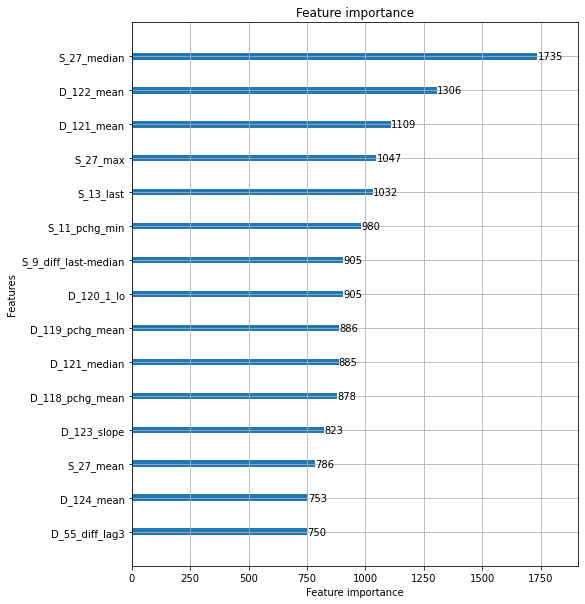

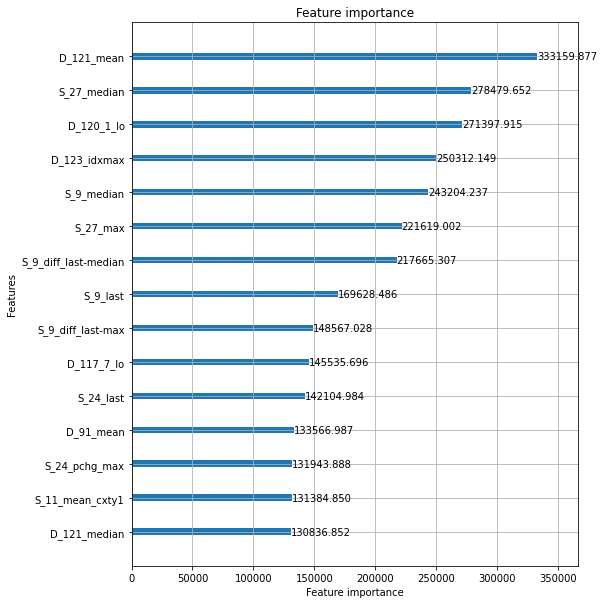

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964958
[100]	valid_0's auc: 0.980743
[150]	valid_0's auc: 0.987231
[200]	valid_0's auc: 0.99055
[250]	valid_0's auc: 0.992303
[300]	valid_0's auc: 0.993448
[350]	valid_0's auc: 0.994374
[400]	valid_0's auc: 0.995059
[450]	valid_0's auc: 0.99559
[500]	valid_0's auc: 0.995964
[550]	valid_0's auc: 0.996335
[600]	valid_0's auc: 0.996625
[650]	valid_0's auc: 0.99689
[700]	valid_0's auc: 0.997094
[750]	valid_0's auc: 0.997258
[800]	valid_0's auc: 0.997431
[850]	valid_0's auc: 0.997555
[900]	valid_0's auc: 0.997677
[950]	valid_0's auc: 0.997769
[1000]	valid_0's auc: 0.997862
[1050]	valid_0's auc: 0.997949
[1100]	valid_0's auc: 0.998011
[1150]	valid_0's auc: 0.998082
[1200]	valid_0's auc: 0.998135
[1250]	valid_0's auc: 0.998189
[1300]	valid_0's auc: 0.998245
[1350]	valid_0's auc: 0.998281
[1400]	valid_0's auc: 0.998314
[1450]	valid_0's auc: 0.998351
[1500]	valid_0's auc: 0.998375
[1550]	valid_0's auc: 0.998422


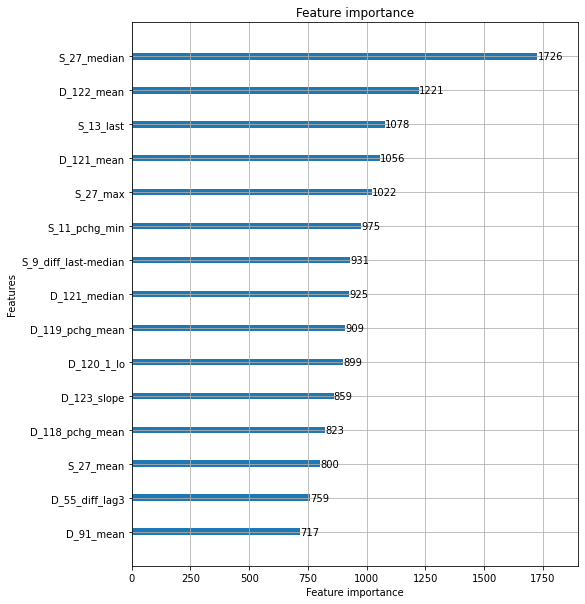

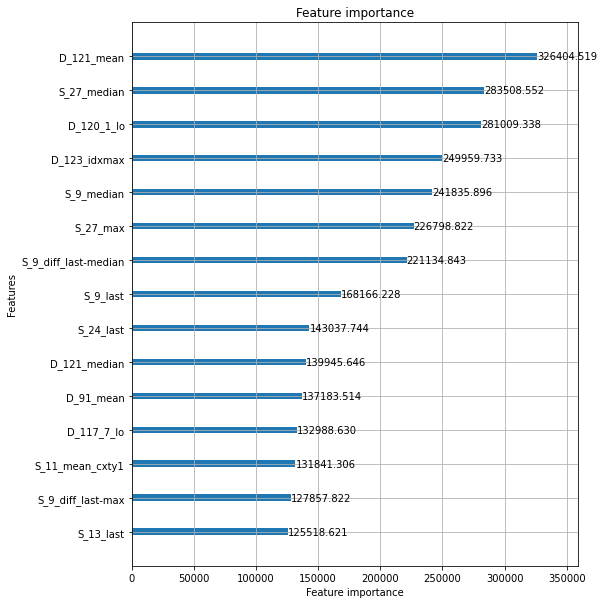

feature to remove: D_121_mean
Elapsed time: 26.63737121025721 min.
----------------------------------------------------------------------------------------------------
ITER: 49/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.96515
[100]	valid_0's auc: 0.981411
[150]	valid_0's auc: 0.987692
[200]	valid_0's auc: 0.990388
[250]	valid_0's auc: 0.992096
[300]	valid_0's auc: 0.993185
[350]	valid_0's auc: 0.994092
[400]	valid_0's auc: 0.994907
[450]	valid_0's auc: 0.99541
[500]	valid_0's auc: 0.995873
[550]	valid_0's auc: 0.996212
[600]	valid_0's auc: 0.996517
[650]	valid_0's auc: 0.996727
[700]	valid_0's auc: 0.996937
[750]	valid_0's auc: 0.997102
[800]	valid_0's auc: 0.997252
[850]	valid_0's auc: 0.997396
[900]	valid_0's auc: 0.997506
[950]	valid_0's auc: 0.997626
[1000]	valid_0's auc: 0.997741
[1050]	valid_0's auc: 0.997825
[1100]	valid_0's auc: 0.99791
[1150]	valid_0's auc: 0.998008
[1200]	valid_0's auc: 0.998072
[1250]	valid_0's auc: 0.998123
[1300

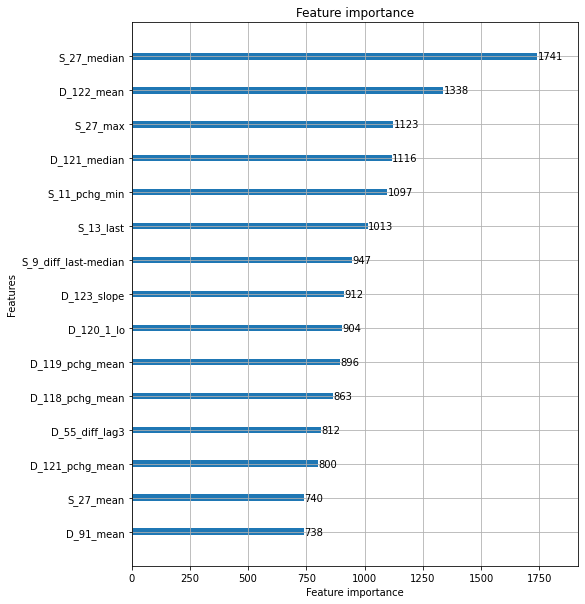

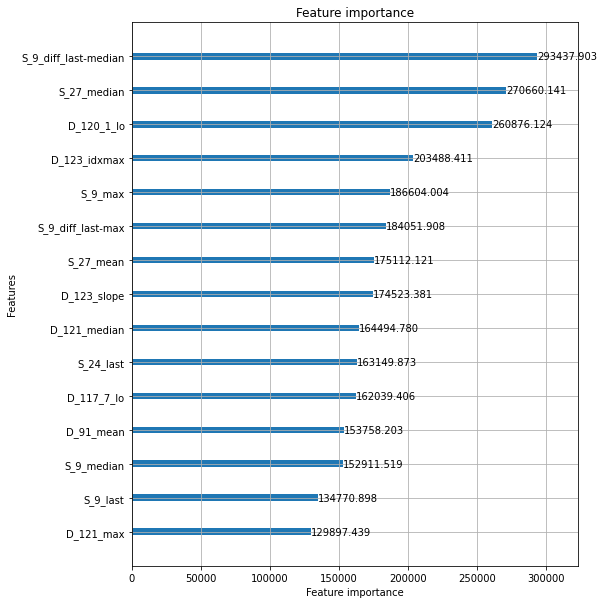

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.965114
[100]	valid_0's auc: 0.98152
[150]	valid_0's auc: 0.987584
[200]	valid_0's auc: 0.990517
[250]	valid_0's auc: 0.992081
[300]	valid_0's auc: 0.993228
[350]	valid_0's auc: 0.994029
[400]	valid_0's auc: 0.994778
[450]	valid_0's auc: 0.995299
[500]	valid_0's auc: 0.995754
[550]	valid_0's auc: 0.996136
[600]	valid_0's auc: 0.996452
[650]	valid_0's auc: 0.996679
[700]	valid_0's auc: 0.996913
[750]	valid_0's auc: 0.997098
[800]	valid_0's auc: 0.997232
[850]	valid_0's auc: 0.997348
[900]	valid_0's auc: 0.997482
[950]	valid_0's auc: 0.997642
[1000]	valid_0's auc: 0.997745
[1050]	valid_0's auc: 0.997814
[1100]	valid_0's auc: 0.997881
[1150]	valid_0's auc: 0.997965
[1200]	valid_0's auc: 0.998018
[1250]	valid_0's auc: 0.998083
[1300]	valid_0's auc: 0.998135
[1350]	valid_0's auc: 0.99817
[1400]	valid_0's auc: 0.998209
[1450]	valid_0's auc: 0.998237
[1500]	valid_0's auc: 0.998267
[1550]	valid_0's auc: 0.998294

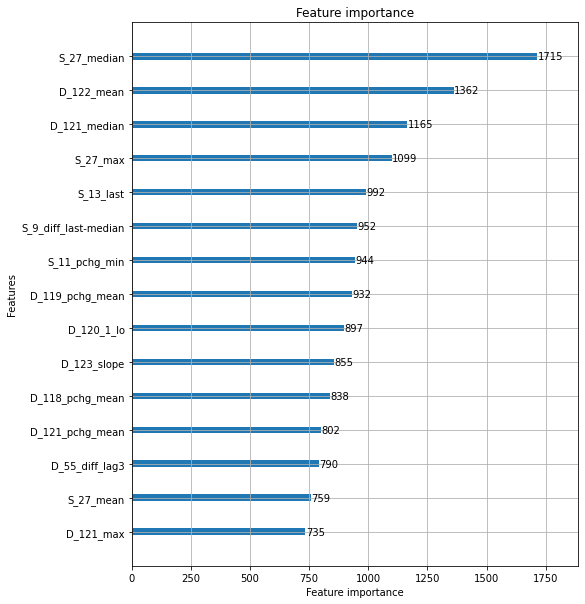

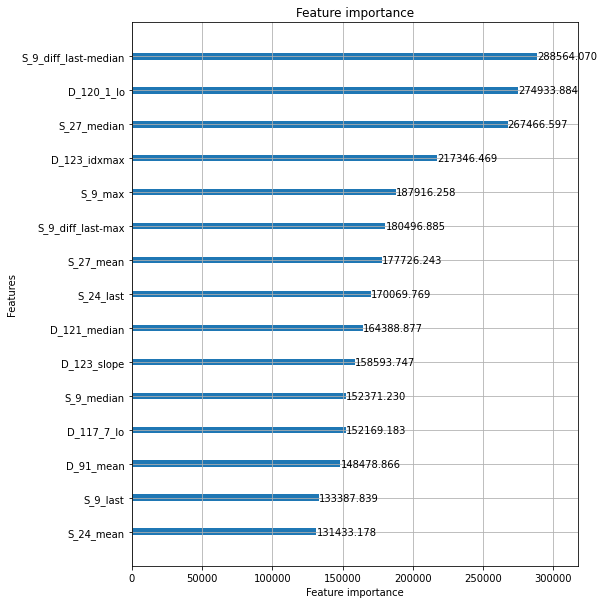

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.965256
[100]	valid_0's auc: 0.981416
[150]	valid_0's auc: 0.987551
[200]	valid_0's auc: 0.990394
[250]	valid_0's auc: 0.991988
[300]	valid_0's auc: 0.993122
[350]	valid_0's auc: 0.994082
[400]	valid_0's auc: 0.99489
[450]	valid_0's auc: 0.995398
[500]	valid_0's auc: 0.995847
[550]	valid_0's auc: 0.996225
[600]	valid_0's auc: 0.996489
[650]	valid_0's auc: 0.996682
[700]	valid_0's auc: 0.996861
[750]	valid_0's auc: 0.997057
[800]	valid_0's auc: 0.99727
[850]	valid_0's auc: 0.997375
[900]	valid_0's auc: 0.997512
[950]	valid_0's auc: 0.997645
[1000]	valid_0's auc: 0.997743
[1050]	valid_0's auc: 0.997841
[1100]	valid_0's auc: 0.997914
[1150]	valid_0's auc: 0.997994
[1200]	valid_0's auc: 0.998061
[1250]	valid_0's auc: 0.998112
[1300]	valid_0's auc: 0.998151
[1350]	valid_0's auc: 0.998205
[1400]	valid_0's auc: 0.998238
[1450]	valid_0's auc: 0.998282
[1500]	valid_0's auc: 0.998313
[1550]	valid_0's auc: 0.998336

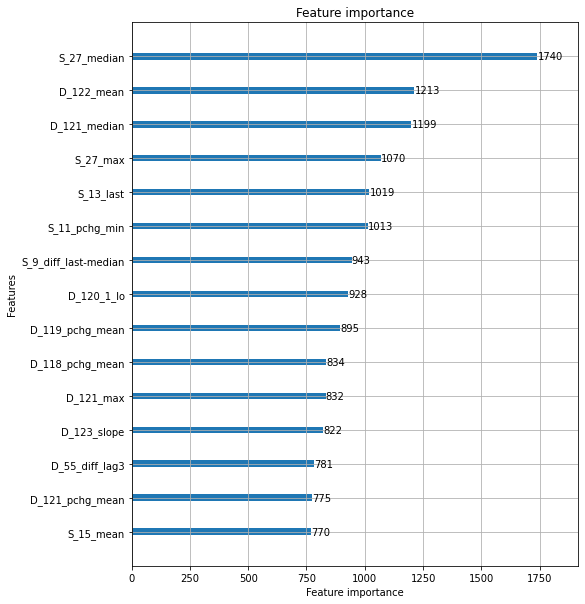

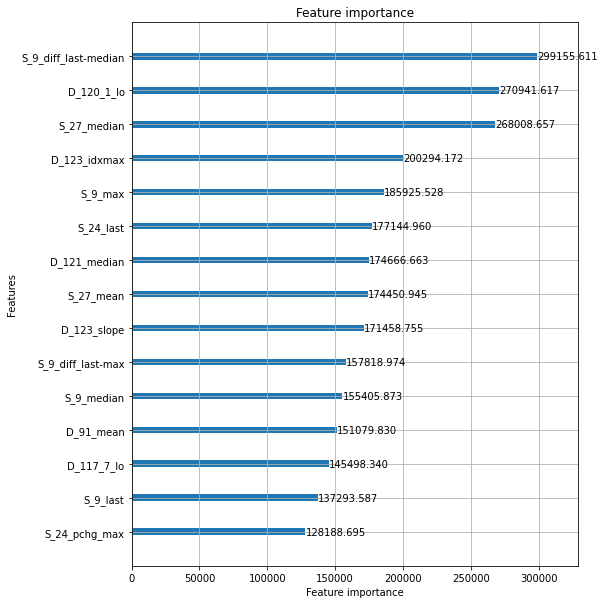

feature to remove: S_9_diff_last-median
Elapsed time: 26.921174561977388 min.
----------------------------------------------------------------------------------------------------
ITER: 50/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.966301
[100]	valid_0's auc: 0.981188
[150]	valid_0's auc: 0.987548
[200]	valid_0's auc: 0.990243
[250]	valid_0's auc: 0.991873
[300]	valid_0's auc: 0.99315
[350]	valid_0's auc: 0.993991
[400]	valid_0's auc: 0.994716
[450]	valid_0's auc: 0.995246
[500]	valid_0's auc: 0.99572
[550]	valid_0's auc: 0.996147
[600]	valid_0's auc: 0.996511
[650]	valid_0's auc: 0.9968
[700]	valid_0's auc: 0.996997
[750]	valid_0's auc: 0.997165
[800]	valid_0's auc: 0.997304
[850]	valid_0's auc: 0.997452
[900]	valid_0's auc: 0.997576
[950]	valid_0's auc: 0.99767
[1000]	valid_0's auc: 0.997744
[1050]	valid_0's auc: 0.997833
[1100]	valid_0's auc: 0.997909
[1150]	valid_0's auc: 0.997964
[1200]	valid_0's auc: 0.998033
[1250]	valid_0's auc: 0.998

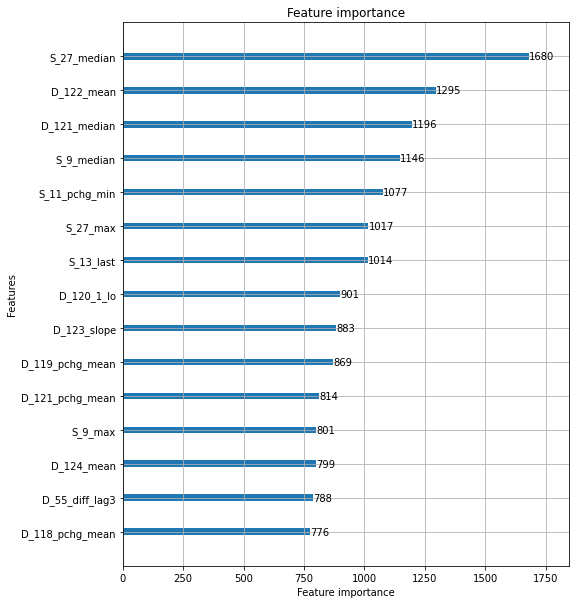

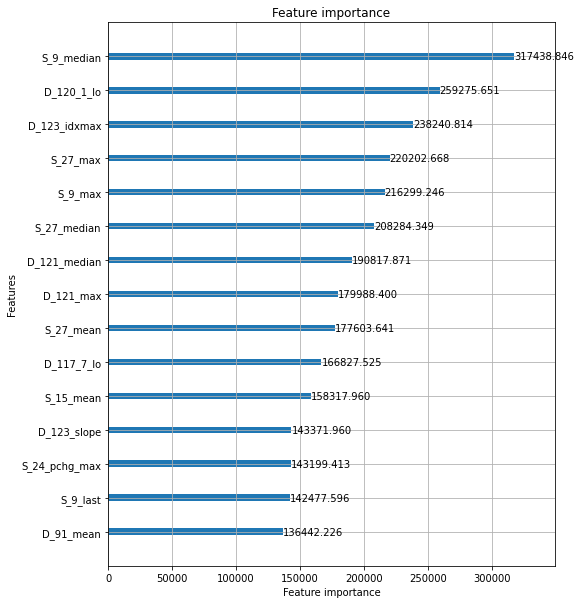

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.966121
[100]	valid_0's auc: 0.981425
[150]	valid_0's auc: 0.987569
[200]	valid_0's auc: 0.990342
[250]	valid_0's auc: 0.992133
[300]	valid_0's auc: 0.993172
[350]	valid_0's auc: 0.994034
[400]	valid_0's auc: 0.994792
[450]	valid_0's auc: 0.995338
[500]	valid_0's auc: 0.995721
[550]	valid_0's auc: 0.996134
[600]	valid_0's auc: 0.996485
[650]	valid_0's auc: 0.996745
[700]	valid_0's auc: 0.996944
[750]	valid_0's auc: 0.997136
[800]	valid_0's auc: 0.997264
[850]	valid_0's auc: 0.997404
[900]	valid_0's auc: 0.997528
[950]	valid_0's auc: 0.997618
[1000]	valid_0's auc: 0.997703
[1050]	valid_0's auc: 0.997779
[1100]	valid_0's auc: 0.997856
[1150]	valid_0's auc: 0.997931
[1200]	valid_0's auc: 0.997994
[1250]	valid_0's auc: 0.99807
[1300]	valid_0's auc: 0.998104
[1350]	valid_0's auc: 0.99814
[1400]	valid_0's auc: 0.998182
[1450]	valid_0's auc: 0.998224
[1500]	valid_0's auc: 0.998263
[1550]	valid_0's auc: 0.998302

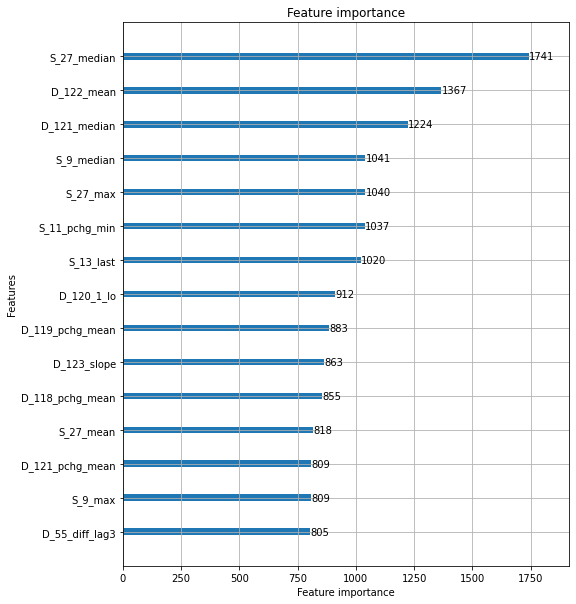

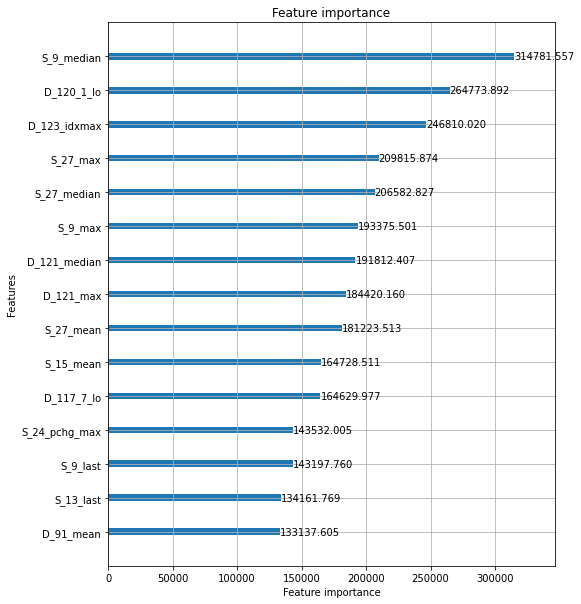

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964928
[100]	valid_0's auc: 0.980978
[150]	valid_0's auc: 0.987377
[200]	valid_0's auc: 0.990284
[250]	valid_0's auc: 0.991856
[300]	valid_0's auc: 0.993037
[350]	valid_0's auc: 0.99405
[400]	valid_0's auc: 0.994826
[450]	valid_0's auc: 0.995316
[500]	valid_0's auc: 0.995832
[550]	valid_0's auc: 0.996153
[600]	valid_0's auc: 0.996471
[650]	valid_0's auc: 0.996732
[700]	valid_0's auc: 0.996926
[750]	valid_0's auc: 0.997086
[800]	valid_0's auc: 0.997233
[850]	valid_0's auc: 0.997447
[900]	valid_0's auc: 0.997561
[950]	valid_0's auc: 0.99765
[1000]	valid_0's auc: 0.997729
[1050]	valid_0's auc: 0.99781
[1100]	valid_0's auc: 0.997907
[1150]	valid_0's auc: 0.997984
[1200]	valid_0's auc: 0.998068
[1250]	valid_0's auc: 0.998145
[1300]	valid_0's auc: 0.998184
[1350]	valid_0's auc: 0.998219
[1400]	valid_0's auc: 0.998253
[1450]	valid_0's auc: 0.998279
[1500]	valid_0's auc: 0.998308
[1550]	valid_0's auc: 0.998349


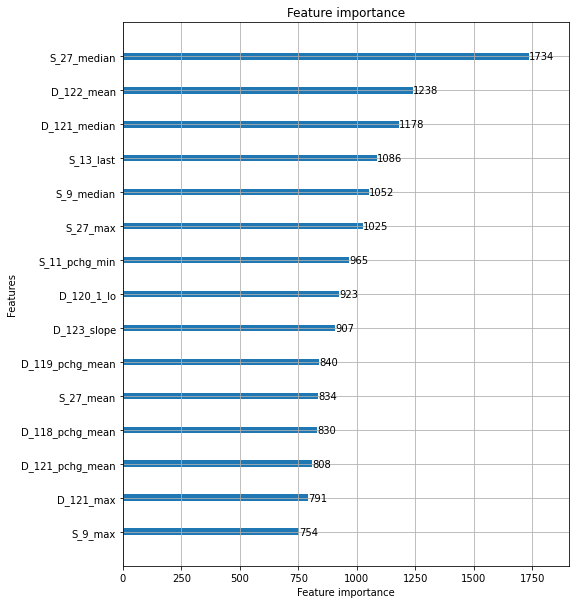

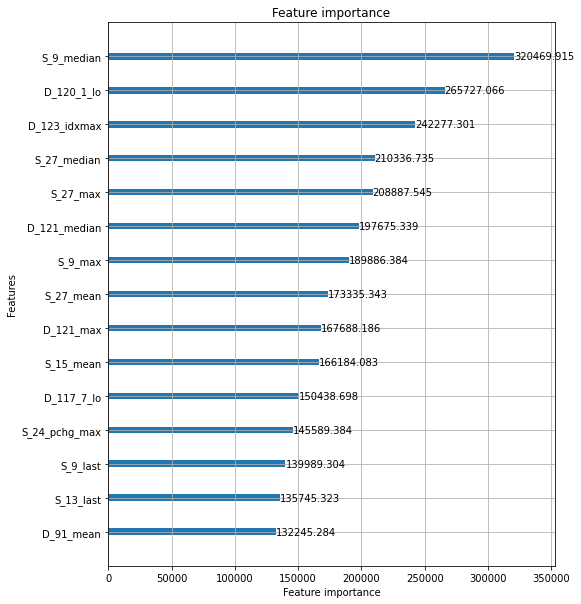

feature to remove: S_9_median
Elapsed time: 26.877841929594677 min.
----------------------------------------------------------------------------------------------------
ITER: 51/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.966781
[100]	valid_0's auc: 0.980396
[150]	valid_0's auc: 0.98641
[200]	valid_0's auc: 0.989513
[250]	valid_0's auc: 0.991285
[300]	valid_0's auc: 0.992553
[350]	valid_0's auc: 0.993436
[400]	valid_0's auc: 0.994303
[450]	valid_0's auc: 0.994845
[500]	valid_0's auc: 0.995307
[550]	valid_0's auc: 0.995786
[600]	valid_0's auc: 0.996101
[650]	valid_0's auc: 0.996429
[700]	valid_0's auc: 0.996635
[750]	valid_0's auc: 0.99685
[800]	valid_0's auc: 0.997005
[850]	valid_0's auc: 0.99713
[900]	valid_0's auc: 0.997238
[950]	valid_0's auc: 0.997389
[1000]	valid_0's auc: 0.997467
[1050]	valid_0's auc: 0.997572
[1100]	valid_0's auc: 0.997655
[1150]	valid_0's auc: 0.997735
[1200]	valid_0's auc: 0.997813
[1250]	valid_0's auc: 0.997882
[130

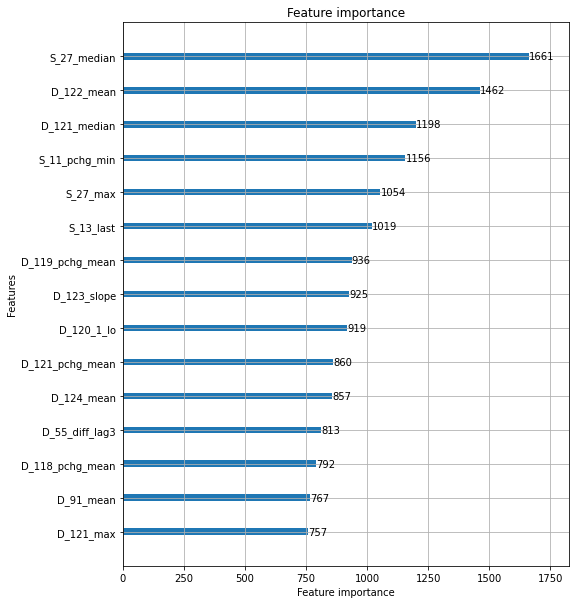

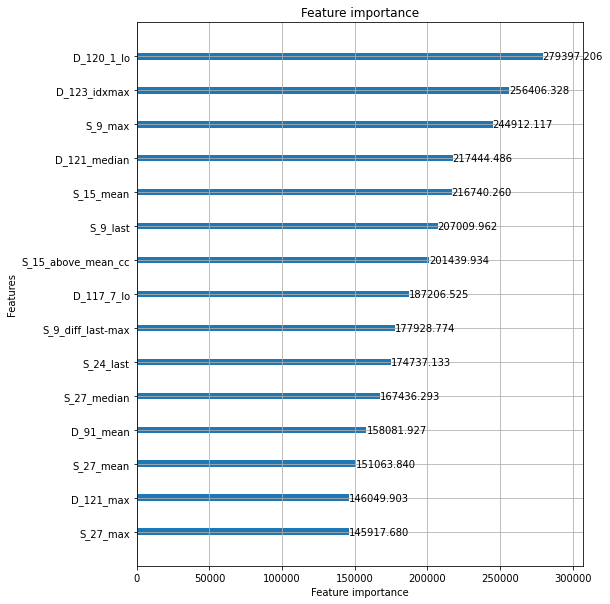

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.965254
[100]	valid_0's auc: 0.980126
[150]	valid_0's auc: 0.986271
[200]	valid_0's auc: 0.989463
[250]	valid_0's auc: 0.991186
[300]	valid_0's auc: 0.992474
[350]	valid_0's auc: 0.993347
[400]	valid_0's auc: 0.994122
[450]	valid_0's auc: 0.994721
[500]	valid_0's auc: 0.995157
[550]	valid_0's auc: 0.995586
[600]	valid_0's auc: 0.995882
[650]	valid_0's auc: 0.996155
[700]	valid_0's auc: 0.996415
[750]	valid_0's auc: 0.996574
[800]	valid_0's auc: 0.996821
[850]	valid_0's auc: 0.996982
[900]	valid_0's auc: 0.997125
[950]	valid_0's auc: 0.997221
[1000]	valid_0's auc: 0.997317
[1050]	valid_0's auc: 0.997419
[1100]	valid_0's auc: 0.997495
[1150]	valid_0's auc: 0.997572
[1200]	valid_0's auc: 0.997665
[1250]	valid_0's auc: 0.997708
[1300]	valid_0's auc: 0.997769
[1350]	valid_0's auc: 0.997815
[1400]	valid_0's auc: 0.997863
[1450]	valid_0's auc: 0.997906
[1500]	valid_0's auc: 0.997939
[1550]	valid_0's auc: 0.9979

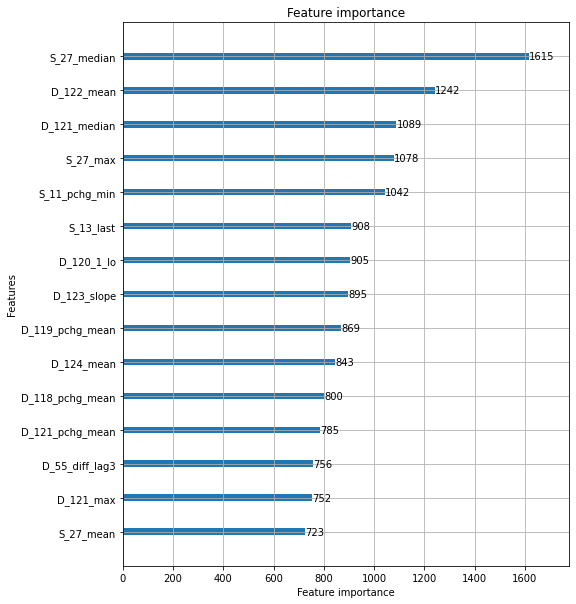

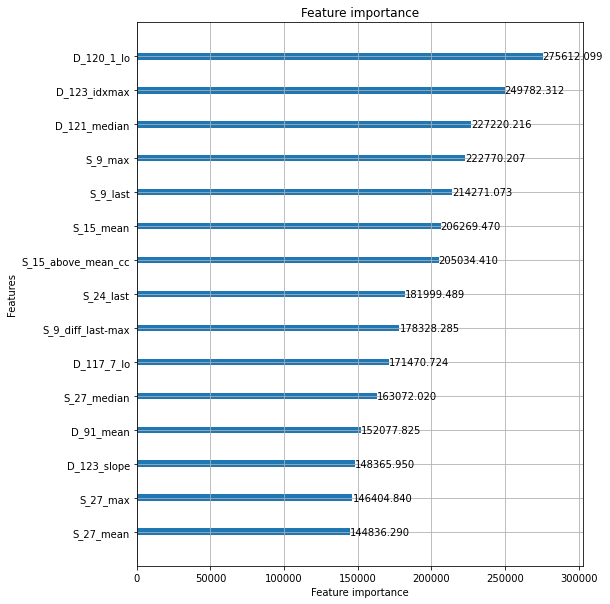

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.965869
[100]	valid_0's auc: 0.980256
[150]	valid_0's auc: 0.986468
[200]	valid_0's auc: 0.989636
[250]	valid_0's auc: 0.991383
[300]	valid_0's auc: 0.992671
[350]	valid_0's auc: 0.993632
[400]	valid_0's auc: 0.994453
[450]	valid_0's auc: 0.994971
[500]	valid_0's auc: 0.995494
[550]	valid_0's auc: 0.995942
[600]	valid_0's auc: 0.996207
[650]	valid_0's auc: 0.996449
[700]	valid_0's auc: 0.996655
[750]	valid_0's auc: 0.996824
[800]	valid_0's auc: 0.997003
[850]	valid_0's auc: 0.99714
[900]	valid_0's auc: 0.997265
[950]	valid_0's auc: 0.997384
[1000]	valid_0's auc: 0.997484
[1050]	valid_0's auc: 0.997566
[1100]	valid_0's auc: 0.997656
[1150]	valid_0's auc: 0.997705
[1200]	valid_0's auc: 0.997784
[1250]	valid_0's auc: 0.997858
[1300]	valid_0's auc: 0.997921
[1350]	valid_0's auc: 0.997974
[1400]	valid_0's auc: 0.998022
[1450]	valid_0's auc: 0.998069
[1500]	valid_0's auc: 0.998105
[1550]	valid_0's auc: 0.99814

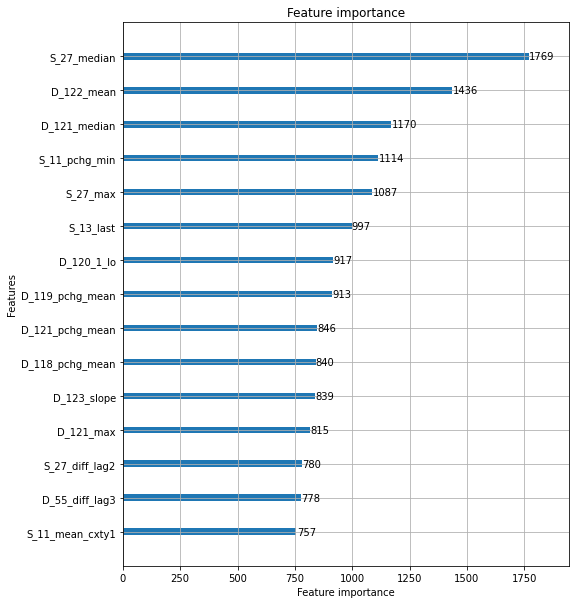

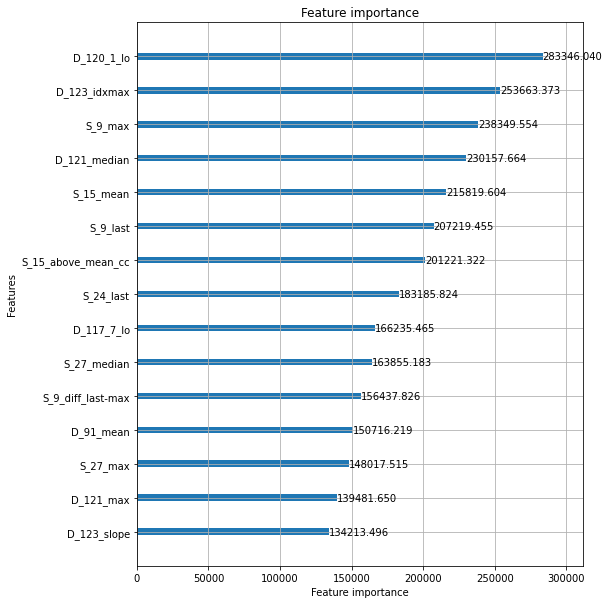

feature to remove: D_120_1_lo
Elapsed time: 27.336549750963847 min.
----------------------------------------------------------------------------------------------------
ITER: 52/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964109
[100]	valid_0's auc: 0.978666
[150]	valid_0's auc: 0.98519
[200]	valid_0's auc: 0.988092
[250]	valid_0's auc: 0.989792
[300]	valid_0's auc: 0.991198
[350]	valid_0's auc: 0.992318
[400]	valid_0's auc: 0.993202
[450]	valid_0's auc: 0.993888
[500]	valid_0's auc: 0.994574
[550]	valid_0's auc: 0.994903
[600]	valid_0's auc: 0.995253
[650]	valid_0's auc: 0.995573
[700]	valid_0's auc: 0.99595
[750]	valid_0's auc: 0.996138
[800]	valid_0's auc: 0.996373
[850]	valid_0's auc: 0.996556
[900]	valid_0's auc: 0.996698
[950]	valid_0's auc: 0.996806
[1000]	valid_0's auc: 0.996992
[1050]	valid_0's auc: 0.997103
[1100]	valid_0's auc: 0.997195
[1150]	valid_0's auc: 0.997306
[1200]	valid_0's auc: 0.997373
[1250]	valid_0's auc: 0.997442
[13

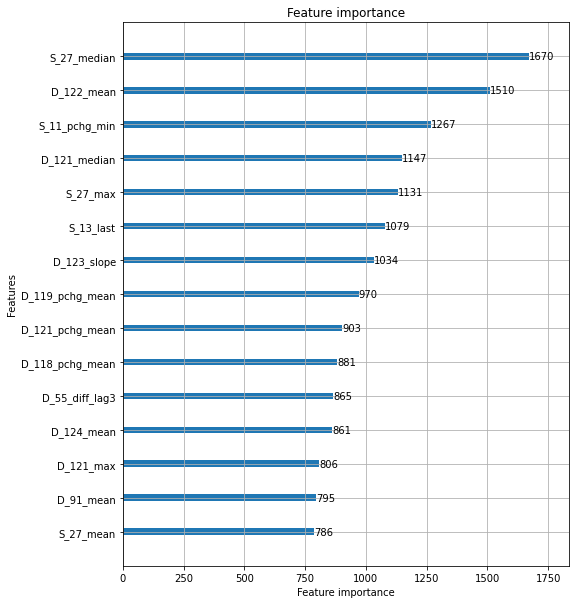

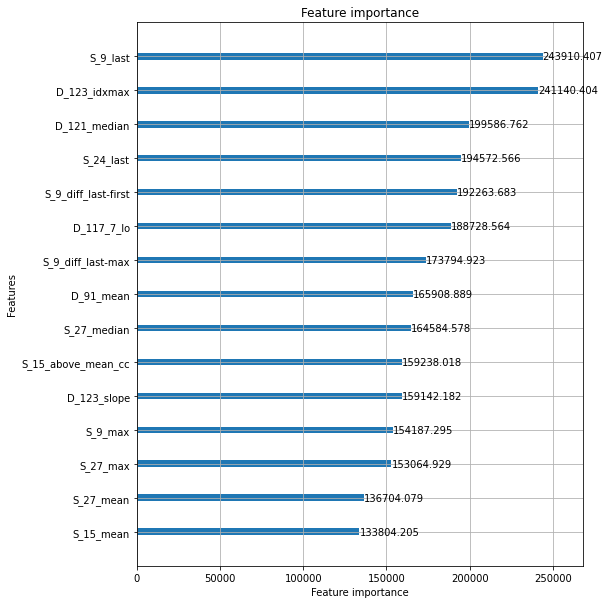

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.964377
[100]	valid_0's auc: 0.978333
[150]	valid_0's auc: 0.984947
[200]	valid_0's auc: 0.987988
[250]	valid_0's auc: 0.98977
[300]	valid_0's auc: 0.991087
[350]	valid_0's auc: 0.992167
[400]	valid_0's auc: 0.993054
[450]	valid_0's auc: 0.993772
[500]	valid_0's auc: 0.99446
[550]	valid_0's auc: 0.994896
[600]	valid_0's auc: 0.995268
[650]	valid_0's auc: 0.995536
[700]	valid_0's auc: 0.995836
[750]	valid_0's auc: 0.996109
[800]	valid_0's auc: 0.99634
[850]	valid_0's auc: 0.996502
[900]	valid_0's auc: 0.996666
[950]	valid_0's auc: 0.996844
[1000]	valid_0's auc: 0.996994
[1050]	valid_0's auc: 0.997103
[1100]	valid_0's auc: 0.997166
[1150]	valid_0's auc: 0.99725
[1200]	valid_0's auc: 0.997358
[1250]	valid_0's auc: 0.997412
[1300]	valid_0's auc: 0.99748
[1350]	valid_0's auc: 0.997546
[1400]	valid_0's auc: 0.997587
[1450]	valid_0's auc: 0.99763
[1500]	valid_0's auc: 0.997677
[1550]	valid_0's auc: 0.997725
[16

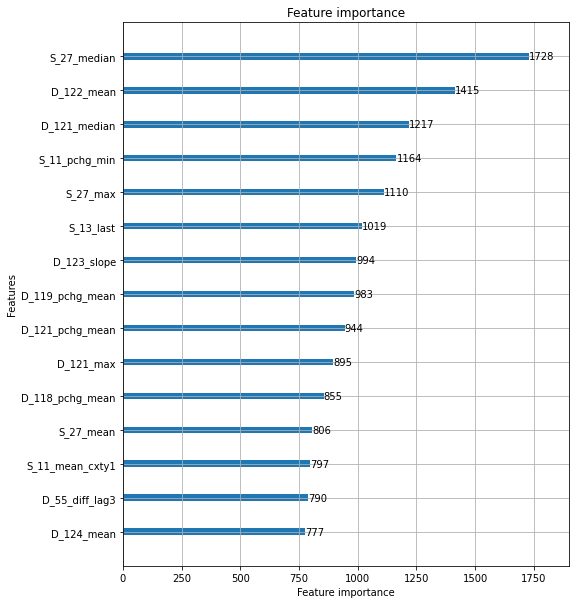

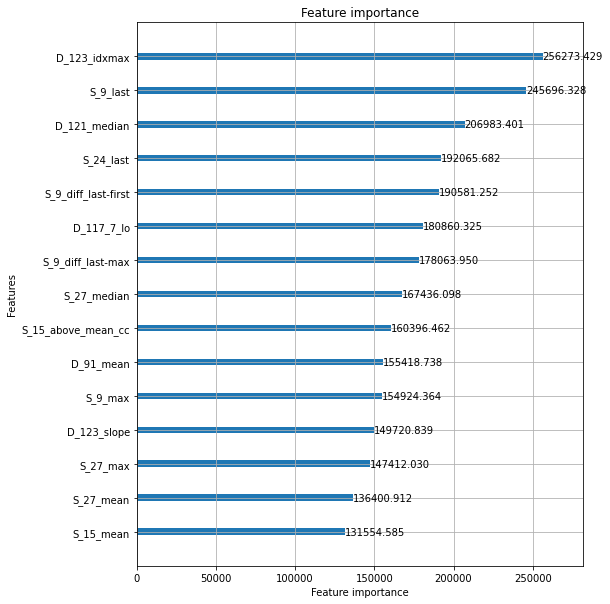

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.963786
[100]	valid_0's auc: 0.978609
[150]	valid_0's auc: 0.985072
[200]	valid_0's auc: 0.988183
[250]	valid_0's auc: 0.989835
[300]	valid_0's auc: 0.991325
[350]	valid_0's auc: 0.992403
[400]	valid_0's auc: 0.993177
[450]	valid_0's auc: 0.993929
[500]	valid_0's auc: 0.994527
[550]	valid_0's auc: 0.995016
[600]	valid_0's auc: 0.995514
[650]	valid_0's auc: 0.995781
[700]	valid_0's auc: 0.996056
[750]	valid_0's auc: 0.996277
[800]	valid_0's auc: 0.996436
[850]	valid_0's auc: 0.996573
[900]	valid_0's auc: 0.996724
[950]	valid_0's auc: 0.996876
[1000]	valid_0's auc: 0.996987
[1050]	valid_0's auc: 0.997102
[1100]	valid_0's auc: 0.997228
[1150]	valid_0's auc: 0.997329
[1200]	valid_0's auc: 0.997391
[1250]	valid_0's auc: 0.997468
[1300]	valid_0's auc: 0.997552
[1350]	valid_0's auc: 0.997605
[1400]	valid_0's auc: 0.997671
[1450]	valid_0's auc: 0.997733
[1500]	valid_0's auc: 0.997816
[1550]	valid_0's auc: 0.9978

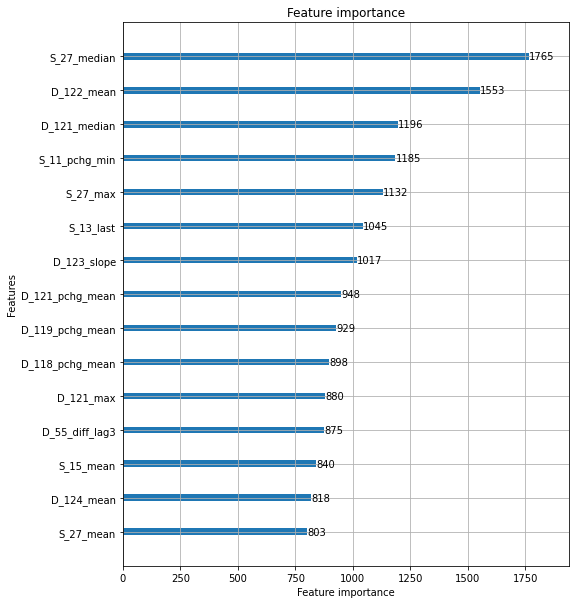

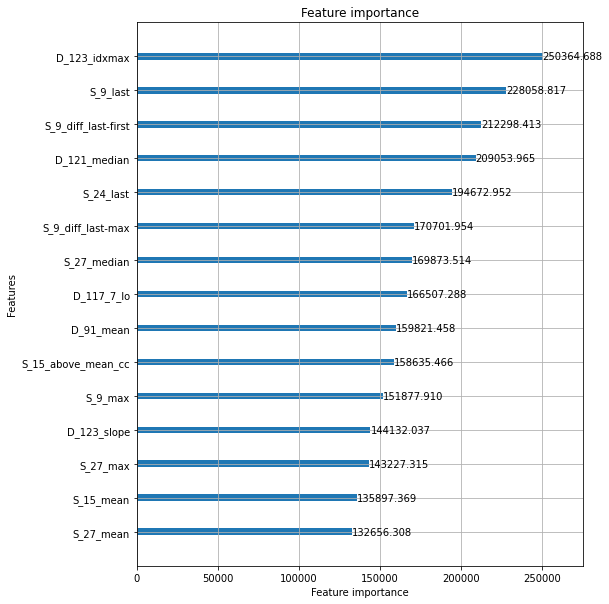

feature to remove: D_123_idxmax
Elapsed time: 28.910382254918417 min.
----------------------------------------------------------------------------------------------------
ITER: 53/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.963651
[100]	valid_0's auc: 0.977984
[150]	valid_0's auc: 0.984034
[200]	valid_0's auc: 0.987067
[250]	valid_0's auc: 0.989279
[300]	valid_0's auc: 0.990757
[350]	valid_0's auc: 0.991982
[400]	valid_0's auc: 0.99299
[450]	valid_0's auc: 0.993648
[500]	valid_0's auc: 0.994258
[550]	valid_0's auc: 0.994741
[600]	valid_0's auc: 0.995131
[650]	valid_0's auc: 0.995463
[700]	valid_0's auc: 0.995735
[750]	valid_0's auc: 0.996051
[800]	valid_0's auc: 0.996238
[850]	valid_0's auc: 0.996453
[900]	valid_0's auc: 0.996578
[950]	valid_0's auc: 0.996805
[1000]	valid_0's auc: 0.996993
[1050]	valid_0's auc: 0.997086
[1100]	valid_0's auc: 0.997182
[1150]	valid_0's auc: 0.997258
[1200]	valid_0's auc: 0.997366
[1250]	valid_0's auc: 0.997444


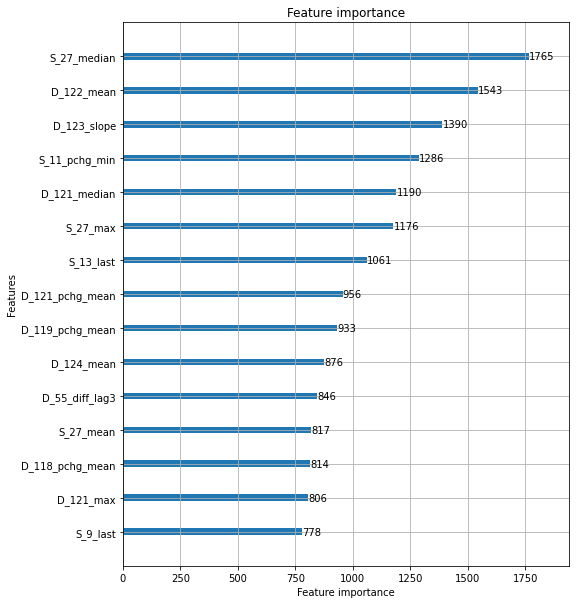

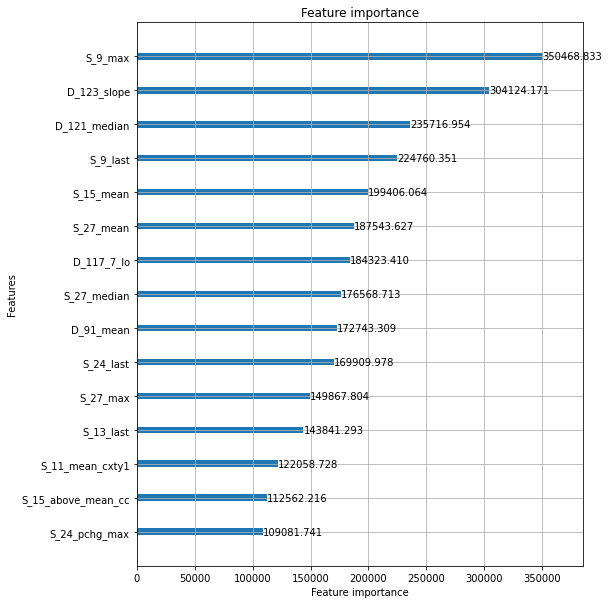

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.963348
[100]	valid_0's auc: 0.978279
[150]	valid_0's auc: 0.983866
[200]	valid_0's auc: 0.98735
[250]	valid_0's auc: 0.989401
[300]	valid_0's auc: 0.990846
[350]	valid_0's auc: 0.991914
[400]	valid_0's auc: 0.992919
[450]	valid_0's auc: 0.993644
[500]	valid_0's auc: 0.994242
[550]	valid_0's auc: 0.994693
[600]	valid_0's auc: 0.995049
[650]	valid_0's auc: 0.99546
[700]	valid_0's auc: 0.995785
[750]	valid_0's auc: 0.996046
[800]	valid_0's auc: 0.996201
[850]	valid_0's auc: 0.996432
[900]	valid_0's auc: 0.996582
[950]	valid_0's auc: 0.996778
[1000]	valid_0's auc: 0.996925
[1050]	valid_0's auc: 0.997032
[1100]	valid_0's auc: 0.997113
[1150]	valid_0's auc: 0.997187
[1200]	valid_0's auc: 0.99727
[1250]	valid_0's auc: 0.997365
[1300]	valid_0's auc: 0.997425
[1350]	valid_0's auc: 0.997481
[1400]	valid_0's auc: 0.997555
[1450]	valid_0's auc: 0.997602
[1500]	valid_0's auc: 0.997642
[1550]	valid_0's auc: 0.997689


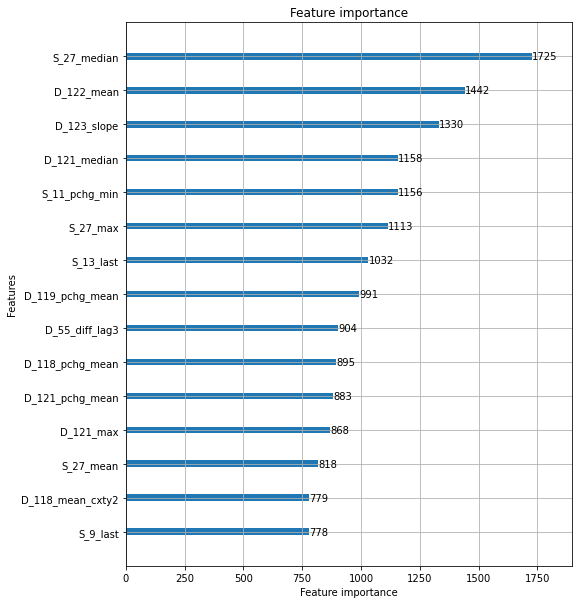

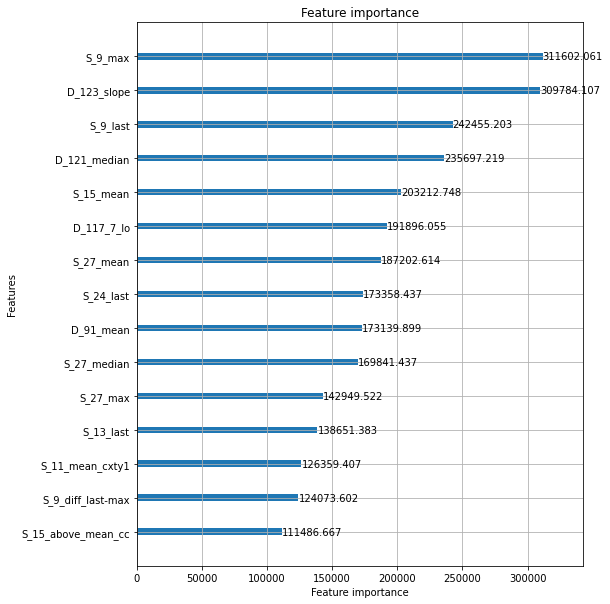

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.963329
[100]	valid_0's auc: 0.978005
[150]	valid_0's auc: 0.9842
[200]	valid_0's auc: 0.987366
[250]	valid_0's auc: 0.989448
[300]	valid_0's auc: 0.991002
[350]	valid_0's auc: 0.992244
[400]	valid_0's auc: 0.993043
[450]	valid_0's auc: 0.993769
[500]	valid_0's auc: 0.994313
[550]	valid_0's auc: 0.994714
[600]	valid_0's auc: 0.995182
[650]	valid_0's auc: 0.99549
[700]	valid_0's auc: 0.995869
[750]	valid_0's auc: 0.996195
[800]	valid_0's auc: 0.996388
[850]	valid_0's auc: 0.996571
[900]	valid_0's auc: 0.996723
[950]	valid_0's auc: 0.996853
[1000]	valid_0's auc: 0.996954
[1050]	valid_0's auc: 0.997088
[1100]	valid_0's auc: 0.997218
[1150]	valid_0's auc: 0.99731
[1200]	valid_0's auc: 0.997381
[1250]	valid_0's auc: 0.997458
[1300]	valid_0's auc: 0.99752
[1350]	valid_0's auc: 0.997584
[1400]	valid_0's auc: 0.997658
[1450]	valid_0's auc: 0.997715
[1500]	valid_0's auc: 0.997755
[1550]	valid_0's auc: 0.9978
[160

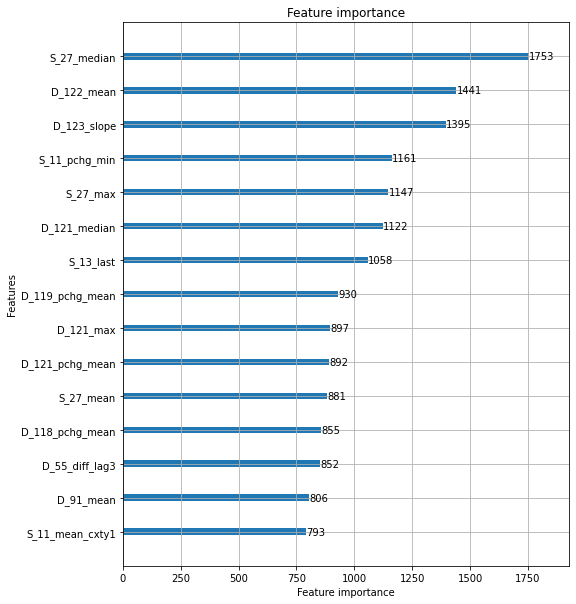

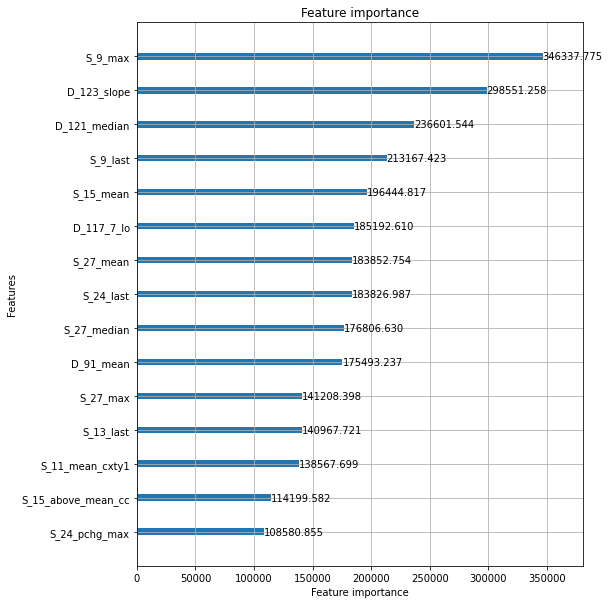

feature to remove: S_9_max
Elapsed time: 28.98572847445806 min.
----------------------------------------------------------------------------------------------------
ITER: 54/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.96131
[100]	valid_0's auc: 0.977373
[150]	valid_0's auc: 0.983586
[200]	valid_0's auc: 0.986991
[250]	valid_0's auc: 0.989182
[300]	valid_0's auc: 0.990796
[350]	valid_0's auc: 0.99216
[400]	valid_0's auc: 0.992941
[450]	valid_0's auc: 0.993603
[500]	valid_0's auc: 0.994321
[550]	valid_0's auc: 0.994824
[600]	valid_0's auc: 0.99529
[650]	valid_0's auc: 0.995582
[700]	valid_0's auc: 0.995846
[750]	valid_0's auc: 0.996114
[800]	valid_0's auc: 0.9963
[850]	valid_0's auc: 0.996454
[900]	valid_0's auc: 0.996648
[950]	valid_0's auc: 0.99682
[1000]	valid_0's auc: 0.996951
[1050]	valid_0's auc: 0.997099
[1100]	valid_0's auc: 0.997187
[1150]	valid_0's auc: 0.997279
[1200]	valid_0's auc: 0.997373
[1250]	valid_0's auc: 0.99744
[1300]	valid

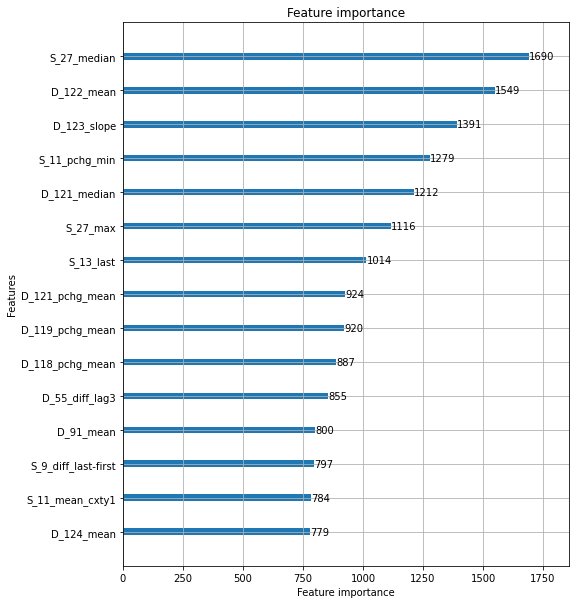

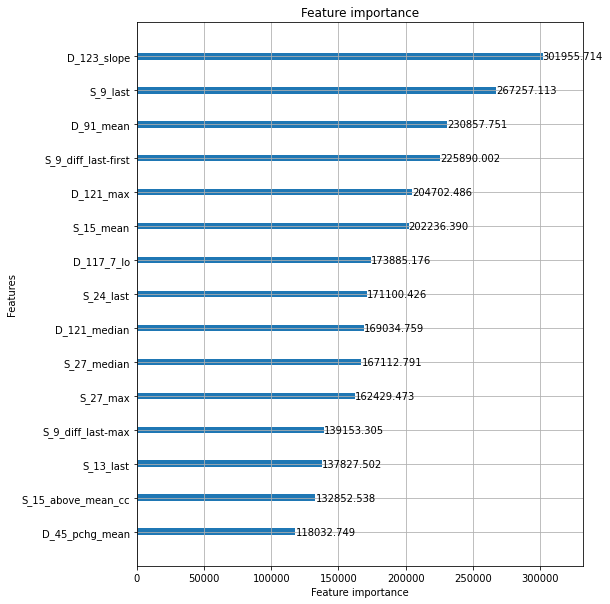

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.961499
[100]	valid_0's auc: 0.977179
[150]	valid_0's auc: 0.983587
[200]	valid_0's auc: 0.987105
[250]	valid_0's auc: 0.98908
[300]	valid_0's auc: 0.990974
[350]	valid_0's auc: 0.992234
[400]	valid_0's auc: 0.993049
[450]	valid_0's auc: 0.993757
[500]	valid_0's auc: 0.994543
[550]	valid_0's auc: 0.994959
[600]	valid_0's auc: 0.995447
[650]	valid_0's auc: 0.995713
[700]	valid_0's auc: 0.995956
[750]	valid_0's auc: 0.996197
[800]	valid_0's auc: 0.996352
[850]	valid_0's auc: 0.996517
[900]	valid_0's auc: 0.996669
[950]	valid_0's auc: 0.996796
[1000]	valid_0's auc: 0.996944
[1050]	valid_0's auc: 0.997058
[1100]	valid_0's auc: 0.99714
[1150]	valid_0's auc: 0.99724
[1200]	valid_0's auc: 0.997324
[1250]	valid_0's auc: 0.997412
[1300]	valid_0's auc: 0.997466
[1350]	valid_0's auc: 0.997524
[1400]	valid_0's auc: 0.997583
[1450]	valid_0's auc: 0.997624
[1500]	valid_0's auc: 0.997679
[1550]	valid_0's auc: 0.997725


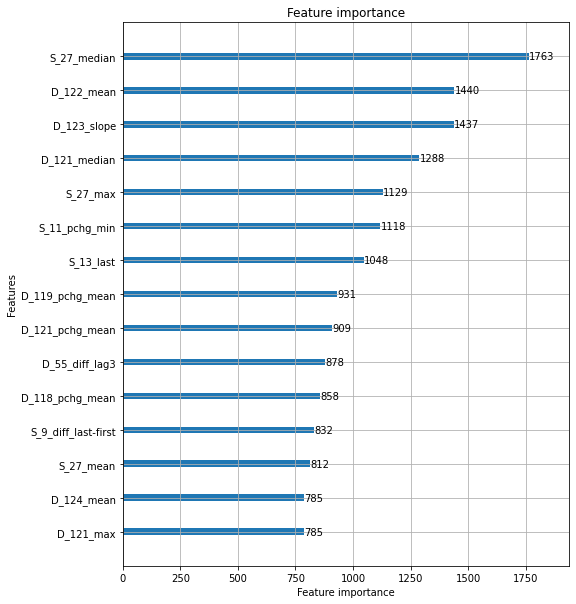

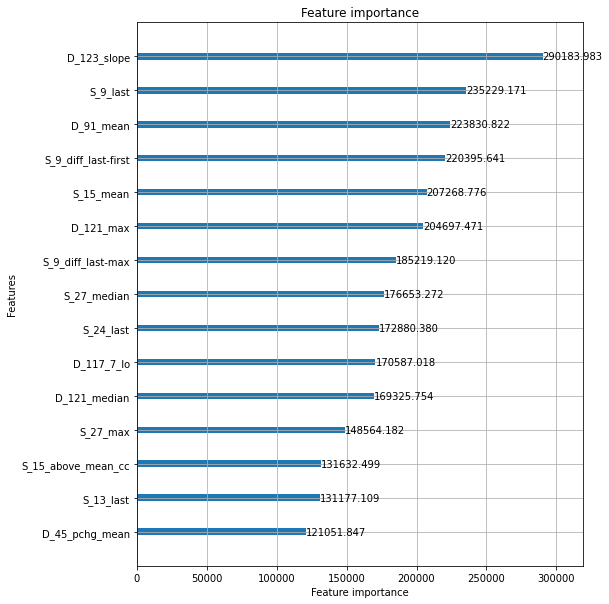

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.960685
[100]	valid_0's auc: 0.976951
[150]	valid_0's auc: 0.983616
[200]	valid_0's auc: 0.987165
[250]	valid_0's auc: 0.989349
[300]	valid_0's auc: 0.991043
[350]	valid_0's auc: 0.992229
[400]	valid_0's auc: 0.993076
[450]	valid_0's auc: 0.9938
[500]	valid_0's auc: 0.994401
[550]	valid_0's auc: 0.994968
[600]	valid_0's auc: 0.995323
[650]	valid_0's auc: 0.995671
[700]	valid_0's auc: 0.995954
[750]	valid_0's auc: 0.996206
[800]	valid_0's auc: 0.996414
[850]	valid_0's auc: 0.996575
[900]	valid_0's auc: 0.996738
[950]	valid_0's auc: 0.996891
[1000]	valid_0's auc: 0.99705
[1050]	valid_0's auc: 0.997192
[1100]	valid_0's auc: 0.997303
[1150]	valid_0's auc: 0.997375
[1200]	valid_0's auc: 0.997453
[1250]	valid_0's auc: 0.997533
[1300]	valid_0's auc: 0.997586
[1350]	valid_0's auc: 0.997639
[1400]	valid_0's auc: 0.997696
[1450]	valid_0's auc: 0.997738
[1500]	valid_0's auc: 0.997785
[1550]	valid_0's auc: 0.997826


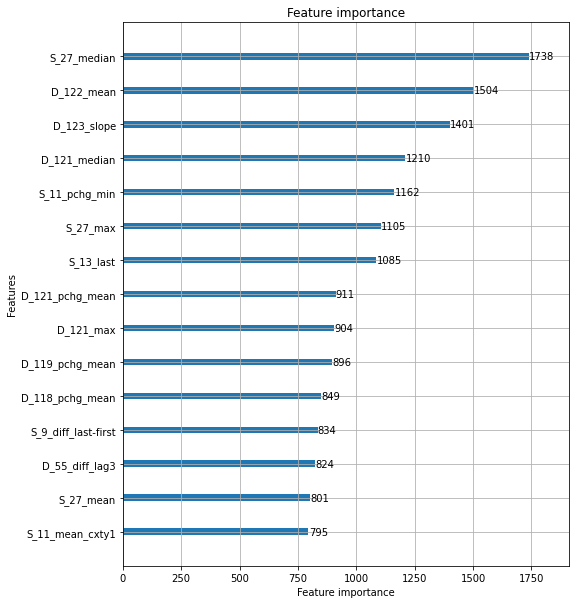

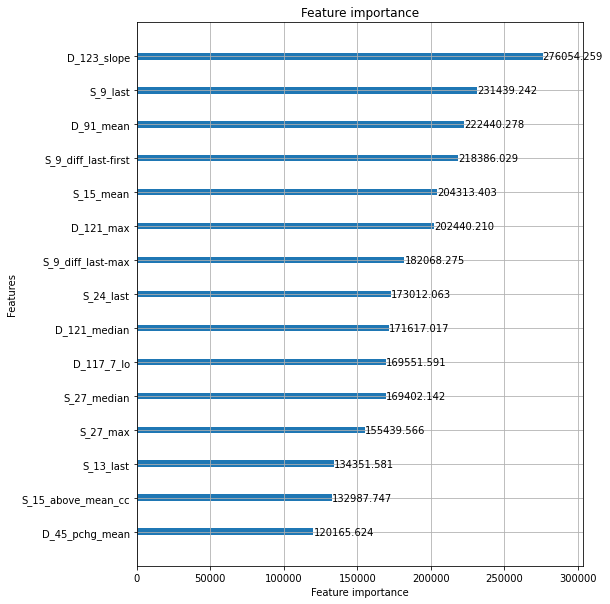

feature to remove: D_123_slope
Elapsed time: 28.971531359354653 min.
----------------------------------------------------------------------------------------------------
ITER: 55/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.960142
[100]	valid_0's auc: 0.975394
[150]	valid_0's auc: 0.981639
[200]	valid_0's auc: 0.985681
[250]	valid_0's auc: 0.987787
[300]	valid_0's auc: 0.989765
[350]	valid_0's auc: 0.991143
[400]	valid_0's auc: 0.992096
[450]	valid_0's auc: 0.992982
[500]	valid_0's auc: 0.993597
[550]	valid_0's auc: 0.994337
[600]	valid_0's auc: 0.994726
[650]	valid_0's auc: 0.995112
[700]	valid_0's auc: 0.995407
[750]	valid_0's auc: 0.995688
[800]	valid_0's auc: 0.996035
[850]	valid_0's auc: 0.996231
[900]	valid_0's auc: 0.996397
[950]	valid_0's auc: 0.996528
[1000]	valid_0's auc: 0.99664
[1050]	valid_0's auc: 0.996762
[1100]	valid_0's auc: 0.996935
[1150]	valid_0's auc: 0.997033
[1200]	valid_0's auc: 0.997105
[1250]	valid_0's auc: 0.997168
[

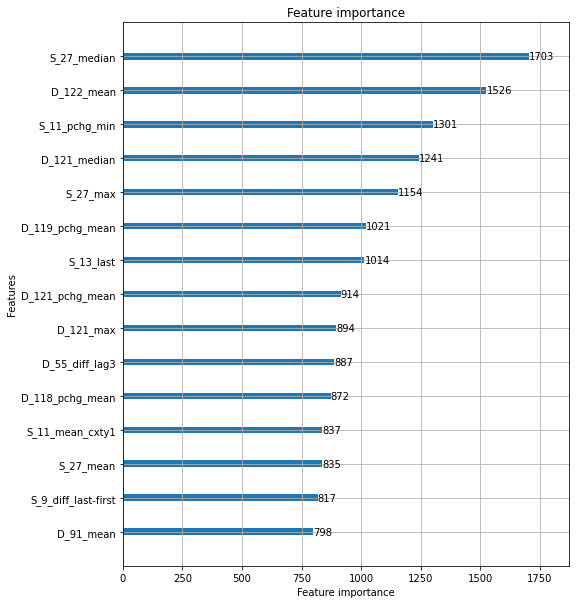

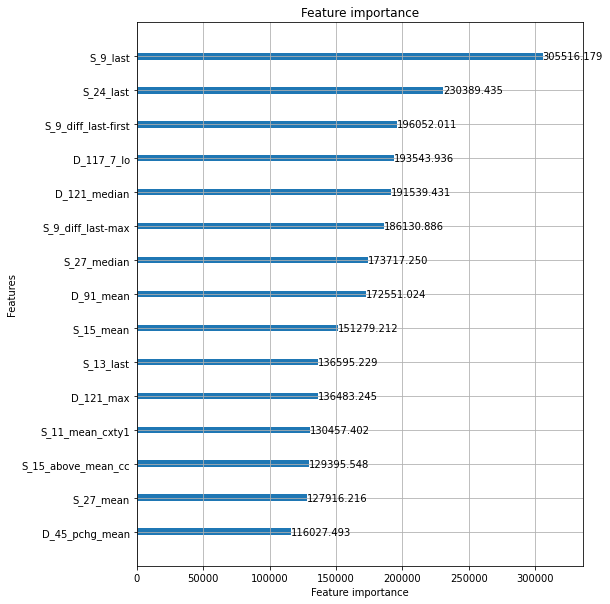

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.959712
[100]	valid_0's auc: 0.975763
[150]	valid_0's auc: 0.981687
[200]	valid_0's auc: 0.985619
[250]	valid_0's auc: 0.98797
[300]	valid_0's auc: 0.98975
[350]	valid_0's auc: 0.991122
[400]	valid_0's auc: 0.992097
[450]	valid_0's auc: 0.992907
[500]	valid_0's auc: 0.99355
[550]	valid_0's auc: 0.994117
[600]	valid_0's auc: 0.994669
[650]	valid_0's auc: 0.995172
[700]	valid_0's auc: 0.995454
[750]	valid_0's auc: 0.995718
[800]	valid_0's auc: 0.996
[850]	valid_0's auc: 0.996184
[900]	valid_0's auc: 0.99637
[950]	valid_0's auc: 0.996558
[1000]	valid_0's auc: 0.996669
[1050]	valid_0's auc: 0.9968
[1100]	valid_0's auc: 0.996902
[1150]	valid_0's auc: 0.996986
[1200]	valid_0's auc: 0.997056
[1250]	valid_0's auc: 0.997143
[1300]	valid_0's auc: 0.997211
[1350]	valid_0's auc: 0.997273
[1400]	valid_0's auc: 0.997359
[1450]	valid_0's auc: 0.997415
[1500]	valid_0's auc: 0.997463
[1550]	valid_0's auc: 0.997516
[1600]

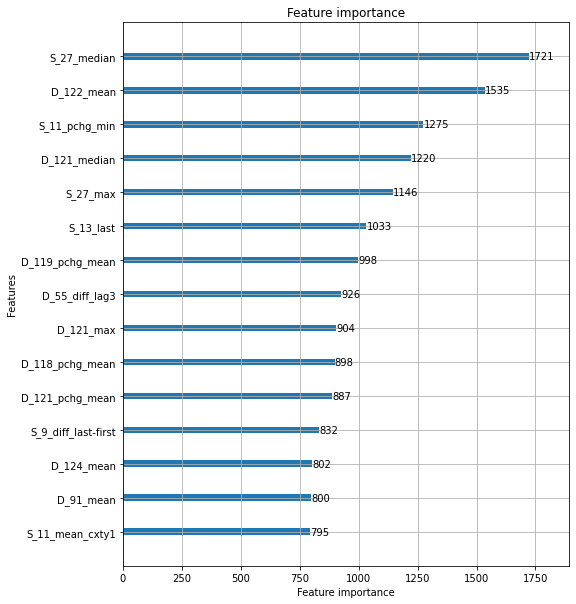

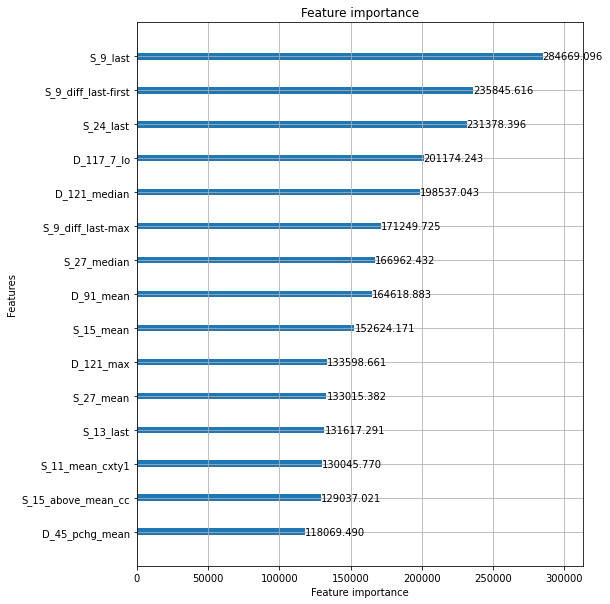

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.959187
[100]	valid_0's auc: 0.975853
[150]	valid_0's auc: 0.981944
[200]	valid_0's auc: 0.98589
[250]	valid_0's auc: 0.988236
[300]	valid_0's auc: 0.989965
[350]	valid_0's auc: 0.991348
[400]	valid_0's auc: 0.992368
[450]	valid_0's auc: 0.993096
[500]	valid_0's auc: 0.993772
[550]	valid_0's auc: 0.99435
[600]	valid_0's auc: 0.994815
[650]	valid_0's auc: 0.99532
[700]	valid_0's auc: 0.995559
[750]	valid_0's auc: 0.995832
[800]	valid_0's auc: 0.99603
[850]	valid_0's auc: 0.996203
[900]	valid_0's auc: 0.99636
[950]	valid_0's auc: 0.996512
[1000]	valid_0's auc: 0.996657
[1050]	valid_0's auc: 0.996813
[1100]	valid_0's auc: 0.996905
[1150]	valid_0's auc: 0.997019
[1200]	valid_0's auc: 0.997103
[1250]	valid_0's auc: 0.99717
[1300]	valid_0's auc: 0.997263
[1350]	valid_0's auc: 0.997323
[1400]	valid_0's auc: 0.997388
[1450]	valid_0's auc: 0.997458
[1500]	valid_0's auc: 0.997512
[1550]	valid_0's auc: 0.997568
[16

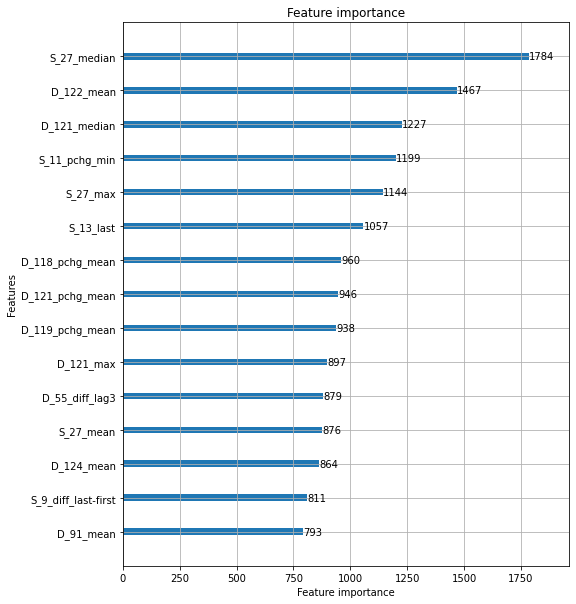

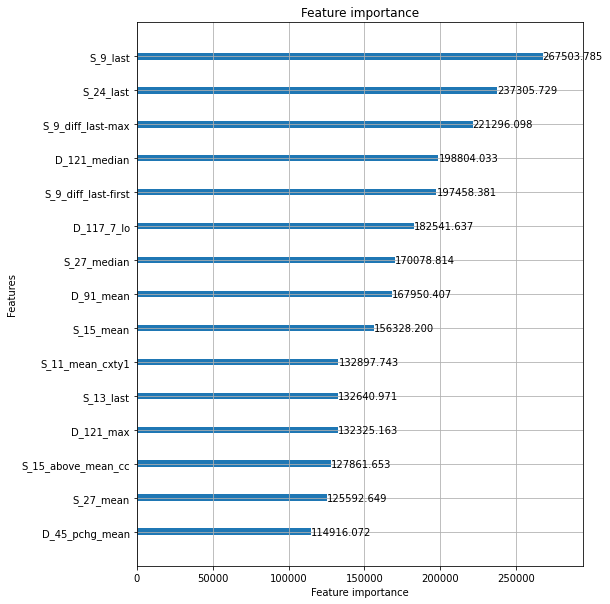

feature to remove: S_9_last
Elapsed time: 29.560169152418773 min.
----------------------------------------------------------------------------------------------------
ITER: 56/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.961874
[100]	valid_0's auc: 0.974427
[150]	valid_0's auc: 0.982052
[200]	valid_0's auc: 0.985332
[250]	valid_0's auc: 0.987492
[300]	valid_0's auc: 0.989368
[350]	valid_0's auc: 0.990857
[400]	valid_0's auc: 0.991933
[450]	valid_0's auc: 0.992703
[500]	valid_0's auc: 0.993269
[550]	valid_0's auc: 0.994033
[600]	valid_0's auc: 0.994396
[650]	valid_0's auc: 0.99485
[700]	valid_0's auc: 0.995174
[750]	valid_0's auc: 0.995485
[800]	valid_0's auc: 0.995701
[850]	valid_0's auc: 0.995934
[900]	valid_0's auc: 0.996123
[950]	valid_0's auc: 0.996374
[1000]	valid_0's auc: 0.996491
[1050]	valid_0's auc: 0.996619
[1100]	valid_0's auc: 0.996735
[1150]	valid_0's auc: 0.996855
[1200]	valid_0's auc: 0.996922
[1250]	valid_0's auc: 0.997045
[130

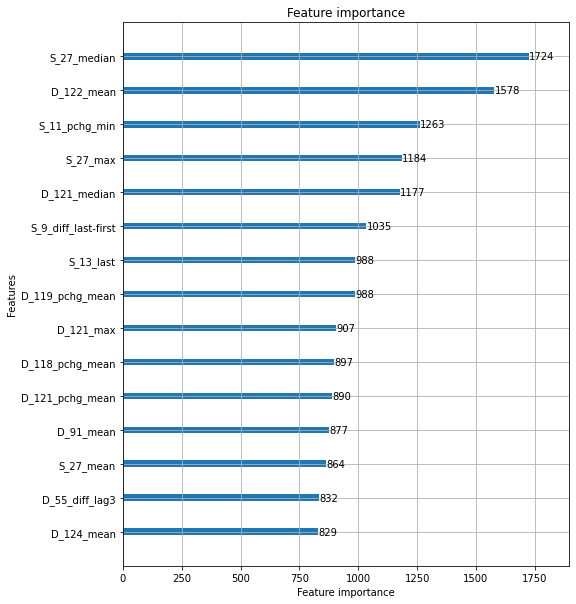

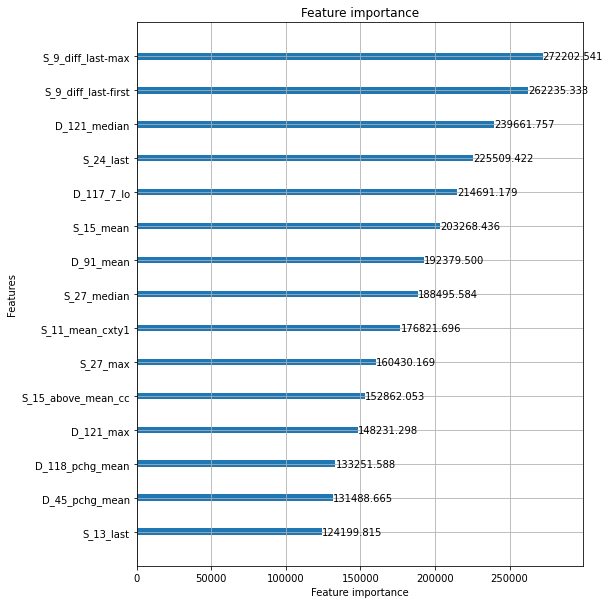

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.96091
[100]	valid_0's auc: 0.974382
[150]	valid_0's auc: 0.981604
[200]	valid_0's auc: 0.985206
[250]	valid_0's auc: 0.987608
[300]	valid_0's auc: 0.989175
[350]	valid_0's auc: 0.990656
[400]	valid_0's auc: 0.991886
[450]	valid_0's auc: 0.992594
[500]	valid_0's auc: 0.993279
[550]	valid_0's auc: 0.993842
[600]	valid_0's auc: 0.994277
[650]	valid_0's auc: 0.994713
[700]	valid_0's auc: 0.995098
[750]	valid_0's auc: 0.995447
[800]	valid_0's auc: 0.995678
[850]	valid_0's auc: 0.995855
[900]	valid_0's auc: 0.996045
[950]	valid_0's auc: 0.996181
[1000]	valid_0's auc: 0.996328
[1050]	valid_0's auc: 0.99655
[1100]	valid_0's auc: 0.996656
[1150]	valid_0's auc: 0.996781
[1200]	valid_0's auc: 0.996897
[1250]	valid_0's auc: 0.996959
[1300]	valid_0's auc: 0.997051
[1350]	valid_0's auc: 0.997128
[1400]	valid_0's auc: 0.997203
[1450]	valid_0's auc: 0.99725
[1500]	valid_0's auc: 0.997302
[1550]	valid_0's auc: 0.997363


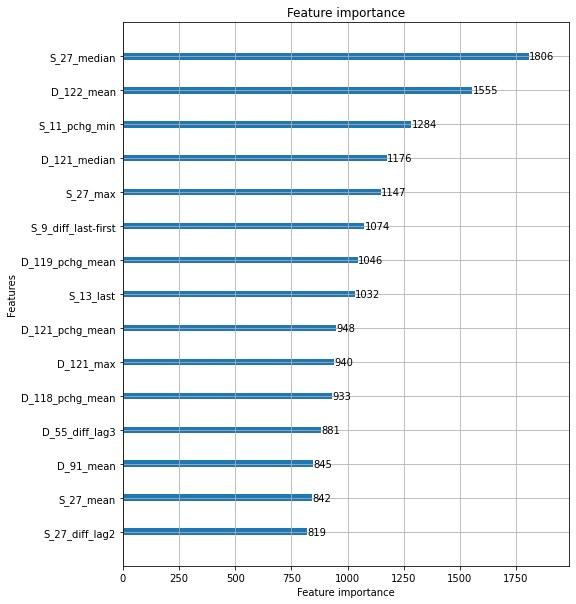

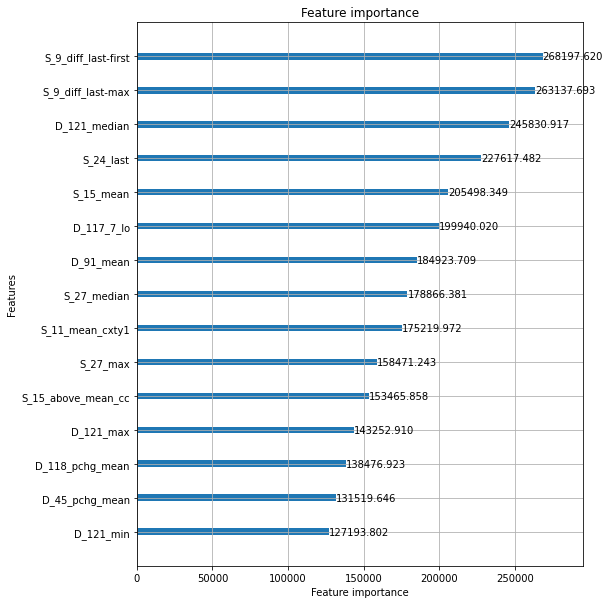

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.961169
[100]	valid_0's auc: 0.974778
[150]	valid_0's auc: 0.981923
[200]	valid_0's auc: 0.985539
[250]	valid_0's auc: 0.987794
[300]	valid_0's auc: 0.989406
[350]	valid_0's auc: 0.990888
[400]	valid_0's auc: 0.99193
[450]	valid_0's auc: 0.992773
[500]	valid_0's auc: 0.993536
[550]	valid_0's auc: 0.99415
[600]	valid_0's auc: 0.994521
[650]	valid_0's auc: 0.994938
[700]	valid_0's auc: 0.995268
[750]	valid_0's auc: 0.99554
[800]	valid_0's auc: 0.995746
[850]	valid_0's auc: 0.995983
[900]	valid_0's auc: 0.996208
[950]	valid_0's auc: 0.9964
[1000]	valid_0's auc: 0.99653
[1050]	valid_0's auc: 0.996651
[1100]	valid_0's auc: 0.996828
[1150]	valid_0's auc: 0.996956
[1200]	valid_0's auc: 0.997023
[1250]	valid_0's auc: 0.997122
[1300]	valid_0's auc: 0.997196
[1350]	valid_0's auc: 0.997291
[1400]	valid_0's auc: 0.99735
[1450]	valid_0's auc: 0.997405
[1500]	valid_0's auc: 0.997457
[1550]	valid_0's auc: 0.997529
[160

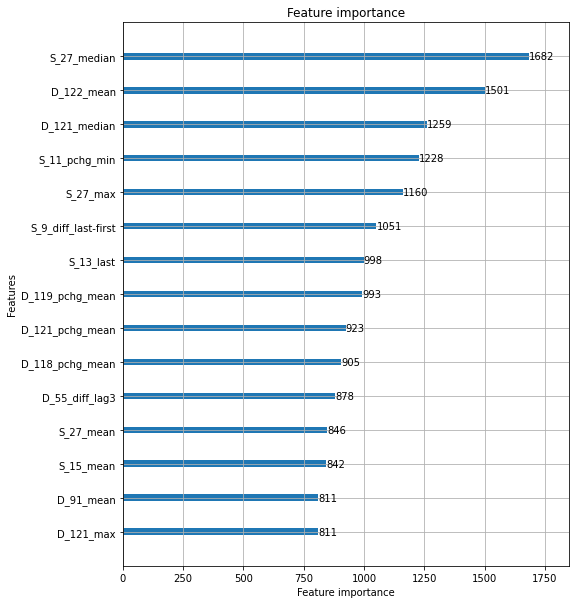

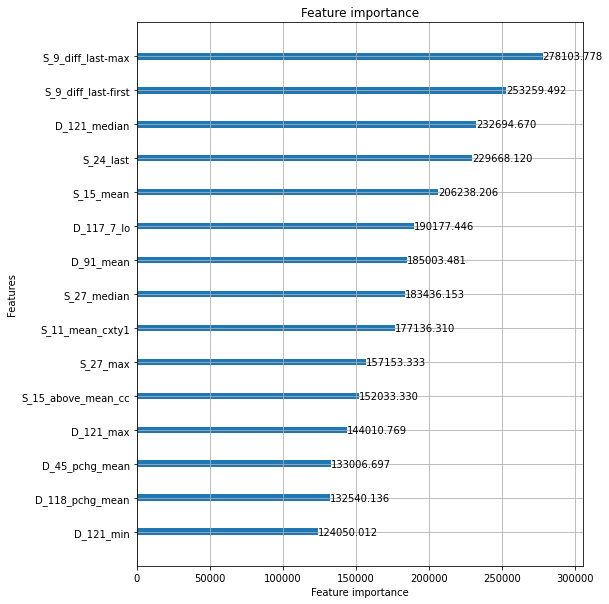

feature to remove: S_9_diff_last-max
Elapsed time: 29.80382409890493 min.
----------------------------------------------------------------------------------------------------
ITER: 57/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.958181
[100]	valid_0's auc: 0.974507
[150]	valid_0's auc: 0.981525
[200]	valid_0's auc: 0.985732
[250]	valid_0's auc: 0.987474
[300]	valid_0's auc: 0.989058
[350]	valid_0's auc: 0.990396
[400]	valid_0's auc: 0.991437
[450]	valid_0's auc: 0.992208
[500]	valid_0's auc: 0.993278
[550]	valid_0's auc: 0.993797
[600]	valid_0's auc: 0.994197
[650]	valid_0's auc: 0.994521
[700]	valid_0's auc: 0.994848
[750]	valid_0's auc: 0.995176
[800]	valid_0's auc: 0.995383
[850]	valid_0's auc: 0.995664
[900]	valid_0's auc: 0.995906
[950]	valid_0's auc: 0.996149
[1000]	valid_0's auc: 0.996269
[1050]	valid_0's auc: 0.996445
[1100]	valid_0's auc: 0.996553
[1150]	valid_0's auc: 0.996659
[1200]	valid_0's auc: 0.996749
[1250]	valid_0's auc: 0.99

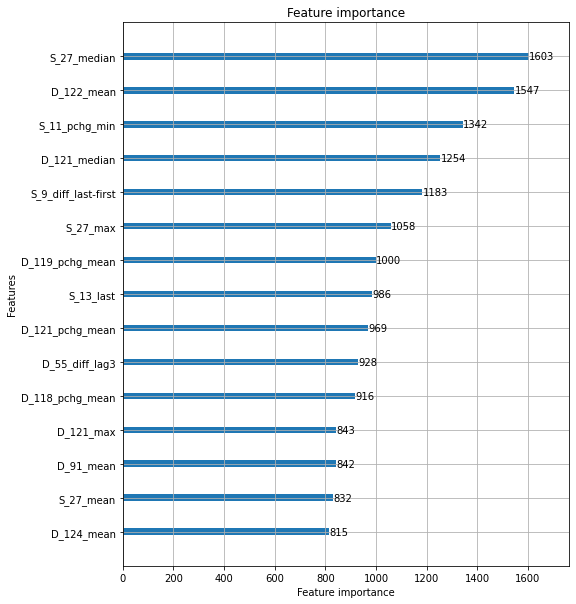

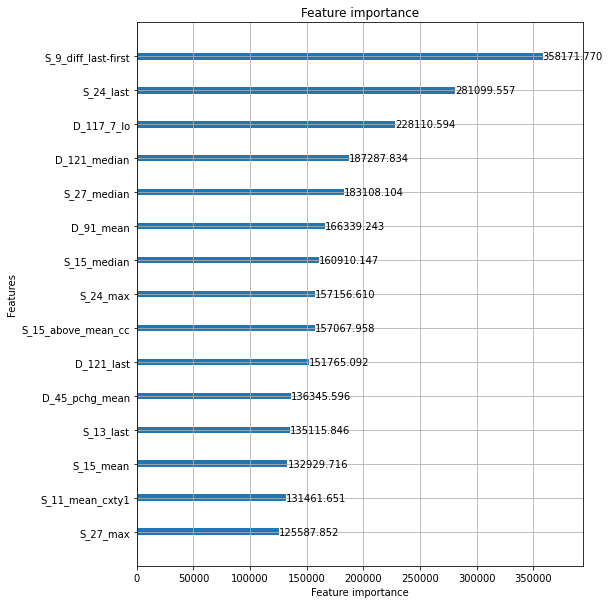

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.956512
[100]	valid_0's auc: 0.974058
[150]	valid_0's auc: 0.981295
[200]	valid_0's auc: 0.985203
[250]	valid_0's auc: 0.987146
[300]	valid_0's auc: 0.988892
[350]	valid_0's auc: 0.990311
[400]	valid_0's auc: 0.991515
[450]	valid_0's auc: 0.992231
[500]	valid_0's auc: 0.993239
[550]	valid_0's auc: 0.993743
[600]	valid_0's auc: 0.994238
[650]	valid_0's auc: 0.994558
[700]	valid_0's auc: 0.994984
[750]	valid_0's auc: 0.995284
[800]	valid_0's auc: 0.995465
[850]	valid_0's auc: 0.995724
[900]	valid_0's auc: 0.995955
[950]	valid_0's auc: 0.996107
[1000]	valid_0's auc: 0.99624
[1050]	valid_0's auc: 0.996373
[1100]	valid_0's auc: 0.996519
[1150]	valid_0's auc: 0.996626
[1200]	valid_0's auc: 0.996731
[1250]	valid_0's auc: 0.996807
[1300]	valid_0's auc: 0.996882
[1350]	valid_0's auc: 0.996965
[1400]	valid_0's auc: 0.99703
[1450]	valid_0's auc: 0.997123
[1500]	valid_0's auc: 0.997169
[1550]	valid_0's auc: 0.997203

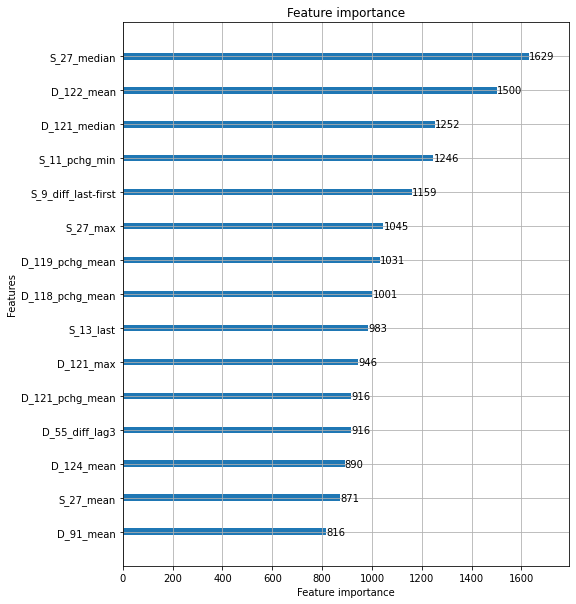

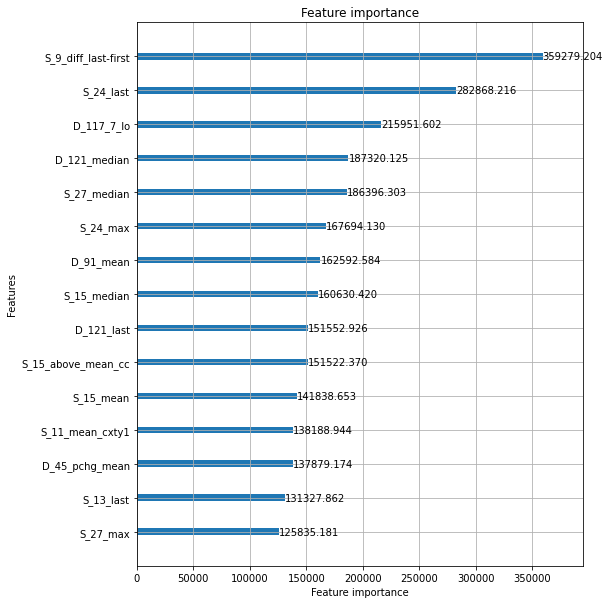

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.957063
[100]	valid_0's auc: 0.974553
[150]	valid_0's auc: 0.981457
[200]	valid_0's auc: 0.985423
[250]	valid_0's auc: 0.987351
[300]	valid_0's auc: 0.989114
[350]	valid_0's auc: 0.990651
[400]	valid_0's auc: 0.991738
[450]	valid_0's auc: 0.992625
[500]	valid_0's auc: 0.993679
[550]	valid_0's auc: 0.994105
[600]	valid_0's auc: 0.994517
[650]	valid_0's auc: 0.994898
[700]	valid_0's auc: 0.995155
[750]	valid_0's auc: 0.995563
[800]	valid_0's auc: 0.99582
[850]	valid_0's auc: 0.995999
[900]	valid_0's auc: 0.99616
[950]	valid_0's auc: 0.996323
[1000]	valid_0's auc: 0.996465
[1050]	valid_0's auc: 0.996595
[1100]	valid_0's auc: 0.996706
[1150]	valid_0's auc: 0.996819
[1200]	valid_0's auc: 0.996891
[1250]	valid_0's auc: 0.996967
[1300]	valid_0's auc: 0.997041
[1350]	valid_0's auc: 0.9971
[1400]	valid_0's auc: 0.997182
[1450]	valid_0's auc: 0.997264
[1500]	valid_0's auc: 0.997325
[1550]	valid_0's auc: 0.997366
[

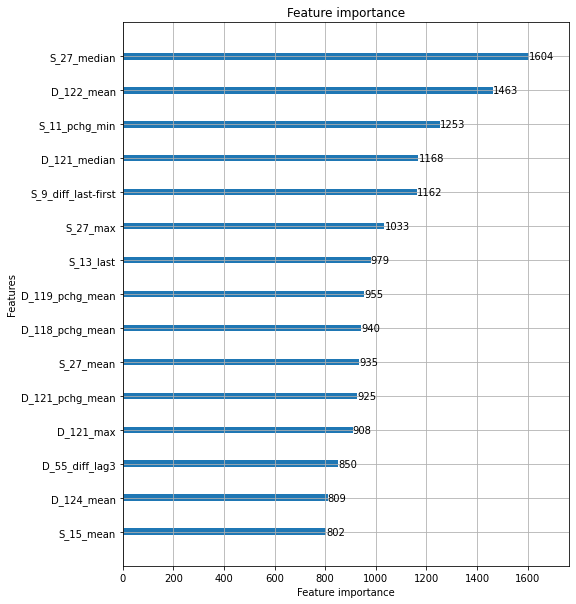

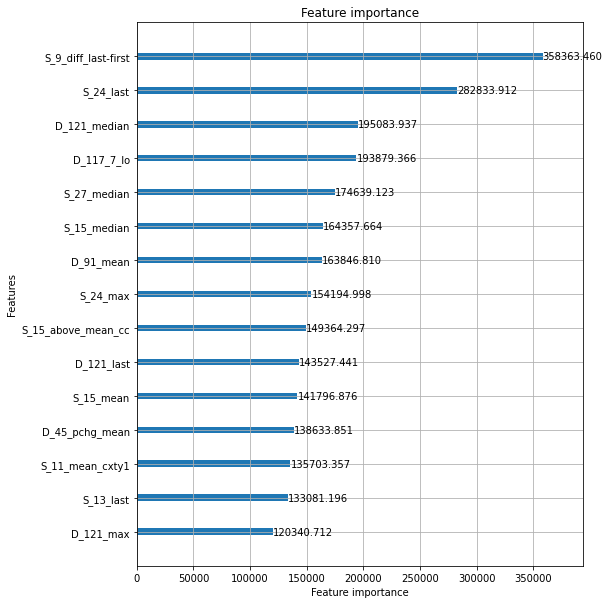

feature to remove: S_9_diff_last-first
Elapsed time: 29.784204065799713 min.
----------------------------------------------------------------------------------------------------
ITER: 58/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.948816
[100]	valid_0's auc: 0.970174
[150]	valid_0's auc: 0.977517
[200]	valid_0's auc: 0.982123
[250]	valid_0's auc: 0.984607
[300]	valid_0's auc: 0.987025
[350]	valid_0's auc: 0.988813
[400]	valid_0's auc: 0.990184
[450]	valid_0's auc: 0.991021
[500]	valid_0's auc: 0.991984
[550]	valid_0's auc: 0.992575
[600]	valid_0's auc: 0.993149
[650]	valid_0's auc: 0.993593
[700]	valid_0's auc: 0.993994
[750]	valid_0's auc: 0.994271
[800]	valid_0's auc: 0.994493
[850]	valid_0's auc: 0.994748
[900]	valid_0's auc: 0.995018
[950]	valid_0's auc: 0.995183
[1000]	valid_0's auc: 0.995419
[1050]	valid_0's auc: 0.99561
[1100]	valid_0's auc: 0.995778
[1150]	valid_0's auc: 0.995924
[1200]	valid_0's auc: 0.996055
[1250]	valid_0's auc: 0.

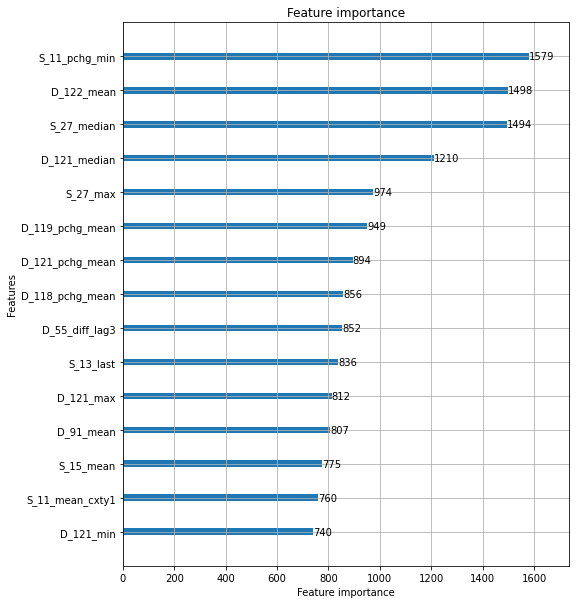

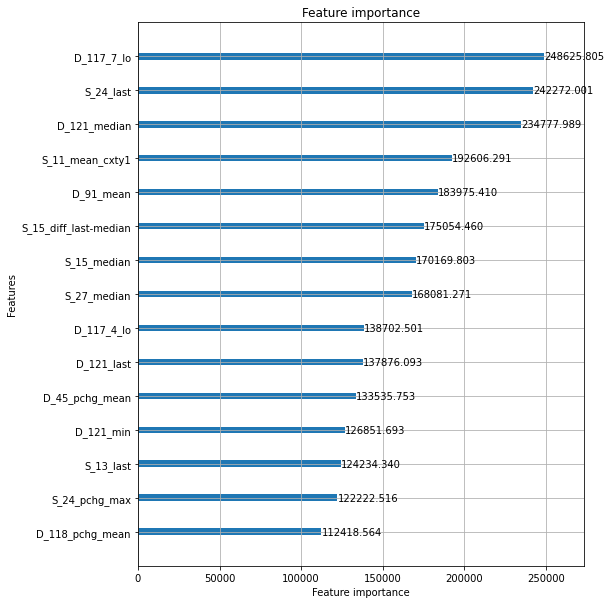

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.948991
[100]	valid_0's auc: 0.969545
[150]	valid_0's auc: 0.977522
[200]	valid_0's auc: 0.982019
[250]	valid_0's auc: 0.984671
[300]	valid_0's auc: 0.987036
[350]	valid_0's auc: 0.988686
[400]	valid_0's auc: 0.98993
[450]	valid_0's auc: 0.990867
[500]	valid_0's auc: 0.991728
[550]	valid_0's auc: 0.99234
[600]	valid_0's auc: 0.992891
[650]	valid_0's auc: 0.993339
[700]	valid_0's auc: 0.993884
[750]	valid_0's auc: 0.99419
[800]	valid_0's auc: 0.994519
[850]	valid_0's auc: 0.994756
[900]	valid_0's auc: 0.995002
[950]	valid_0's auc: 0.995277
[1000]	valid_0's auc: 0.995456
[1050]	valid_0's auc: 0.995578
[1100]	valid_0's auc: 0.995719
[1150]	valid_0's auc: 0.995851
[1200]	valid_0's auc: 0.995978
[1250]	valid_0's auc: 0.99609
[1300]	valid_0's auc: 0.996178
[1350]	valid_0's auc: 0.996264
[1400]	valid_0's auc: 0.996368
[1450]	valid_0's auc: 0.996457
[1500]	valid_0's auc: 0.99652
[1550]	valid_0's auc: 0.996599
[1

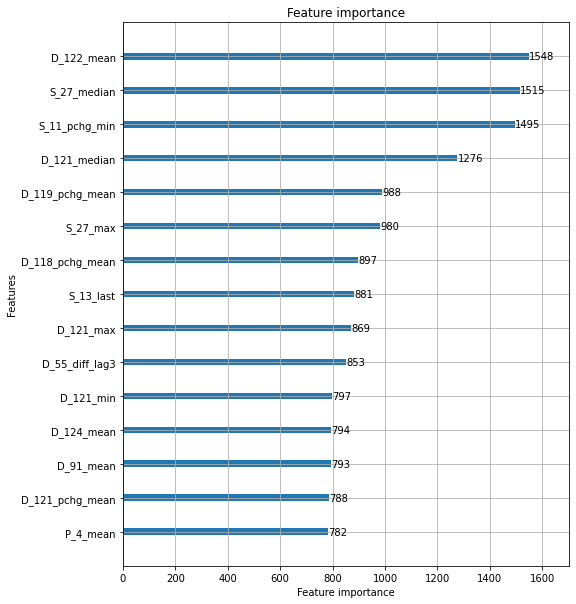

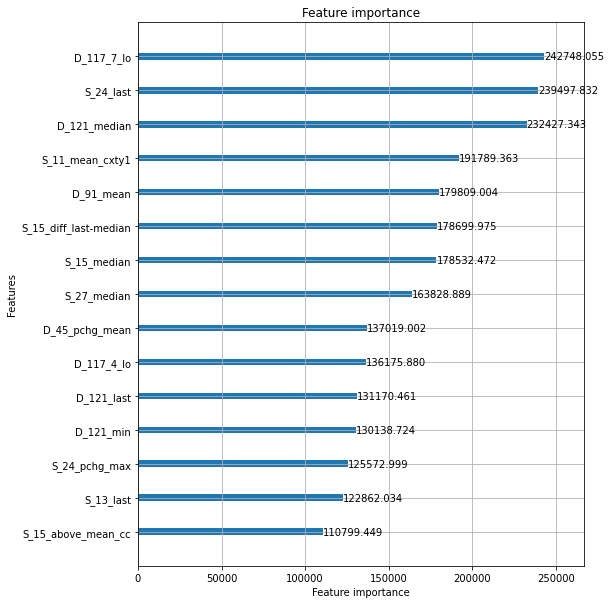

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.947401
[100]	valid_0's auc: 0.969408
[150]	valid_0's auc: 0.977122
[200]	valid_0's auc: 0.981828
[250]	valid_0's auc: 0.984725
[300]	valid_0's auc: 0.987032
[350]	valid_0's auc: 0.988666
[400]	valid_0's auc: 0.989934
[450]	valid_0's auc: 0.99077
[500]	valid_0's auc: 0.99179
[550]	valid_0's auc: 0.992387
[600]	valid_0's auc: 0.993004
[650]	valid_0's auc: 0.993432
[700]	valid_0's auc: 0.993938
[750]	valid_0's auc: 0.994309
[800]	valid_0's auc: 0.994566
[850]	valid_0's auc: 0.994864
[900]	valid_0's auc: 0.995086
[950]	valid_0's auc: 0.995283
[1000]	valid_0's auc: 0.995435
[1050]	valid_0's auc: 0.995601
[1100]	valid_0's auc: 0.995764
[1150]	valid_0's auc: 0.995955
[1200]	valid_0's auc: 0.996139
[1250]	valid_0's auc: 0.996231
[1300]	valid_0's auc: 0.996358
[1350]	valid_0's auc: 0.996428
[1400]	valid_0's auc: 0.996505
[1450]	valid_0's auc: 0.996637
[1500]	valid_0's auc: 0.996714
[1550]	valid_0's auc: 0.996803

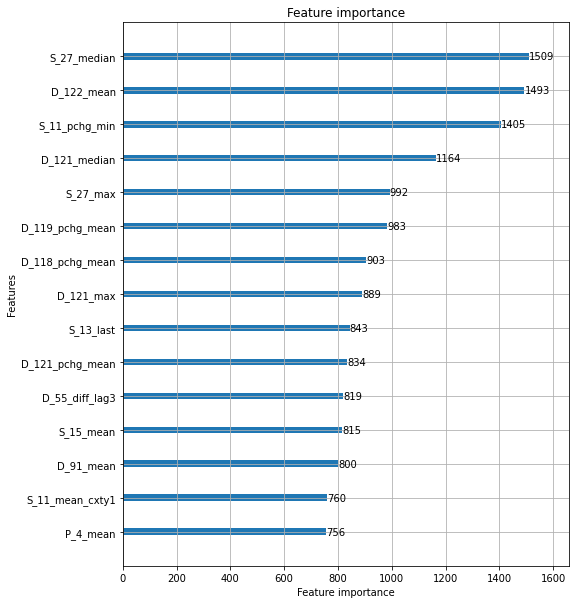

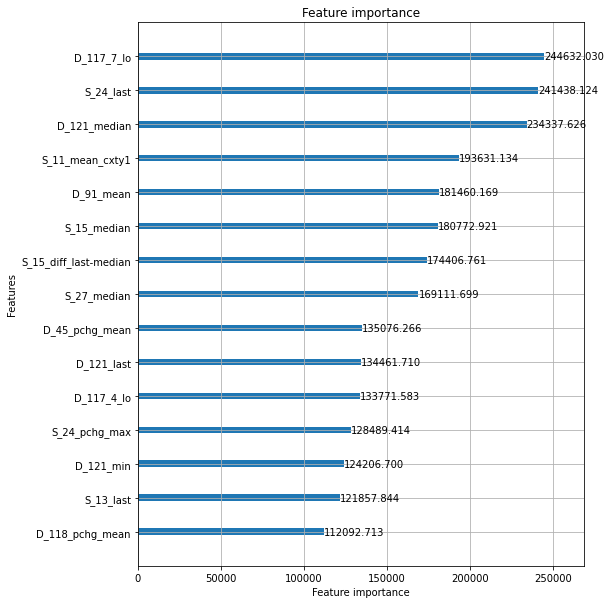

feature to remove: D_117_7_lo
Elapsed time: 30.1554327805837 min.
----------------------------------------------------------------------------------------------------
ITER: 59/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.949786
[100]	valid_0's auc: 0.966895
[150]	valid_0's auc: 0.975078
[200]	valid_0's auc: 0.97968
[250]	valid_0's auc: 0.982809
[300]	valid_0's auc: 0.985272
[350]	valid_0's auc: 0.986913
[400]	valid_0's auc: 0.988016
[450]	valid_0's auc: 0.989212
[500]	valid_0's auc: 0.99041
[550]	valid_0's auc: 0.99111
[600]	valid_0's auc: 0.99194
[650]	valid_0's auc: 0.992585
[700]	valid_0's auc: 0.992979
[750]	valid_0's auc: 0.993344
[800]	valid_0's auc: 0.993864
[850]	valid_0's auc: 0.994205
[900]	valid_0's auc: 0.994428
[950]	valid_0's auc: 0.994665
[1000]	valid_0's auc: 0.994875
[1050]	valid_0's auc: 0.995068
[1100]	valid_0's auc: 0.995232
[1150]	valid_0's auc: 0.995382
[1200]	valid_0's auc: 0.995507
[1250]	valid_0's auc: 0.995679
[1300]	

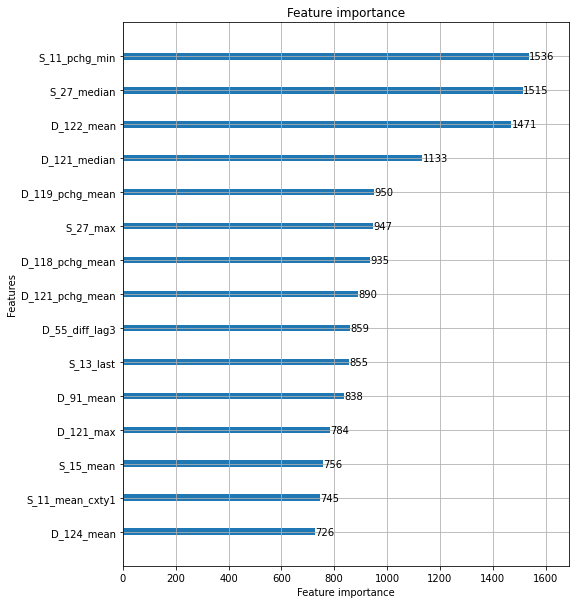

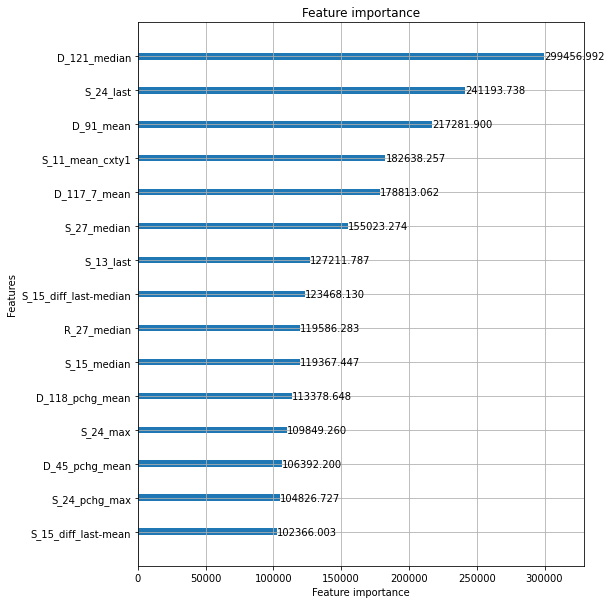

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.950223
[100]	valid_0's auc: 0.967593
[150]	valid_0's auc: 0.975582
[200]	valid_0's auc: 0.979873
[250]	valid_0's auc: 0.983294
[300]	valid_0's auc: 0.985646
[350]	valid_0's auc: 0.987427
[400]	valid_0's auc: 0.988415
[450]	valid_0's auc: 0.989552
[500]	valid_0's auc: 0.990489
[550]	valid_0's auc: 0.9914
[600]	valid_0's auc: 0.992015
[650]	valid_0's auc: 0.992695
[700]	valid_0's auc: 0.993171
[750]	valid_0's auc: 0.993496
[800]	valid_0's auc: 0.993744
[850]	valid_0's auc: 0.994129
[900]	valid_0's auc: 0.994349
[950]	valid_0's auc: 0.994708
[1000]	valid_0's auc: 0.994959
[1050]	valid_0's auc: 0.995142
[1100]	valid_0's auc: 0.995279
[1150]	valid_0's auc: 0.995384
[1200]	valid_0's auc: 0.995485
[1250]	valid_0's auc: 0.995666
[1300]	valid_0's auc: 0.995809
[1350]	valid_0's auc: 0.995894
[1400]	valid_0's auc: 0.995985
[1450]	valid_0's auc: 0.996059
[1500]	valid_0's auc: 0.996136
[1550]	valid_0's auc: 0.996221

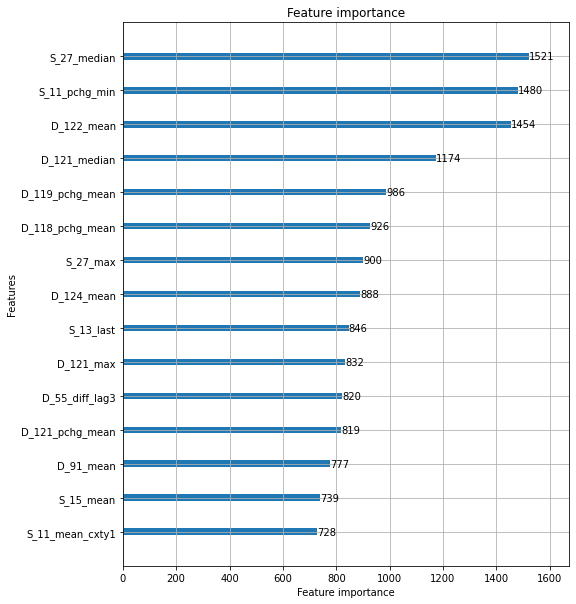

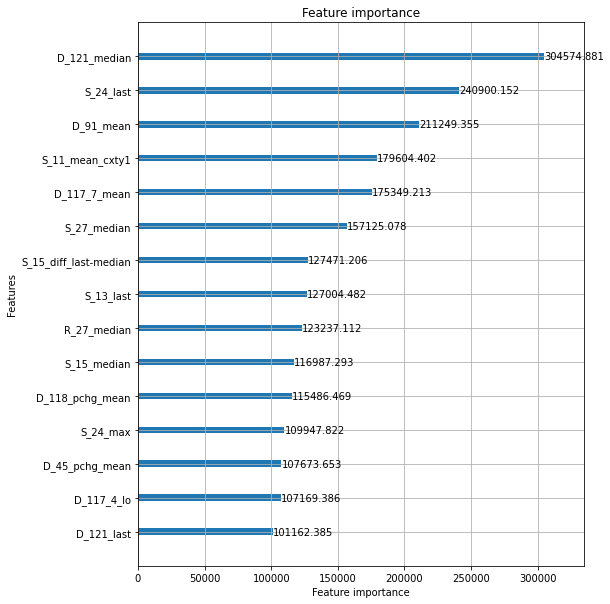

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.949957
[100]	valid_0's auc: 0.967356
[150]	valid_0's auc: 0.975629
[200]	valid_0's auc: 0.980151
[250]	valid_0's auc: 0.983269
[300]	valid_0's auc: 0.985582
[350]	valid_0's auc: 0.987309
[400]	valid_0's auc: 0.988563
[450]	valid_0's auc: 0.989664
[500]	valid_0's auc: 0.990543
[550]	valid_0's auc: 0.991447
[600]	valid_0's auc: 0.992182
[650]	valid_0's auc: 0.992708
[700]	valid_0's auc: 0.993227
[750]	valid_0's auc: 0.993639
[800]	valid_0's auc: 0.994085
[850]	valid_0's auc: 0.99431
[900]	valid_0's auc: 0.994496
[950]	valid_0's auc: 0.994799
[1000]	valid_0's auc: 0.995024
[1050]	valid_0's auc: 0.995214
[1100]	valid_0's auc: 0.995364
[1150]	valid_0's auc: 0.995529
[1200]	valid_0's auc: 0.995641
[1250]	valid_0's auc: 0.995772
[1300]	valid_0's auc: 0.995853
[1350]	valid_0's auc: 0.995964
[1400]	valid_0's auc: 0.996069
[1450]	valid_0's auc: 0.996146
[1500]	valid_0's auc: 0.996225
[1550]	valid_0's auc: 0.99630

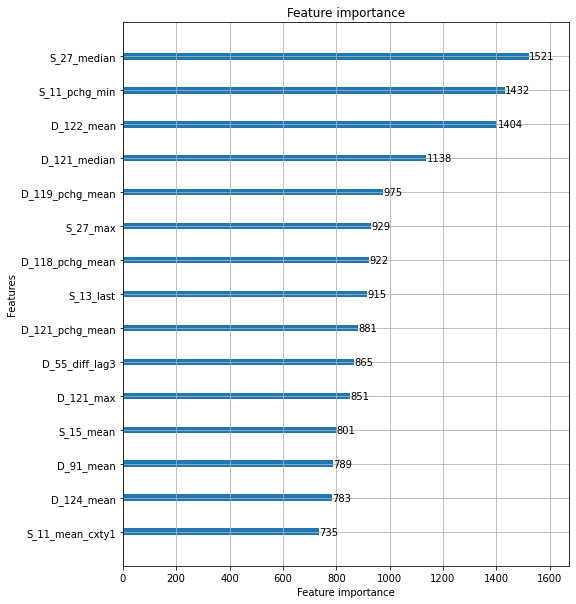

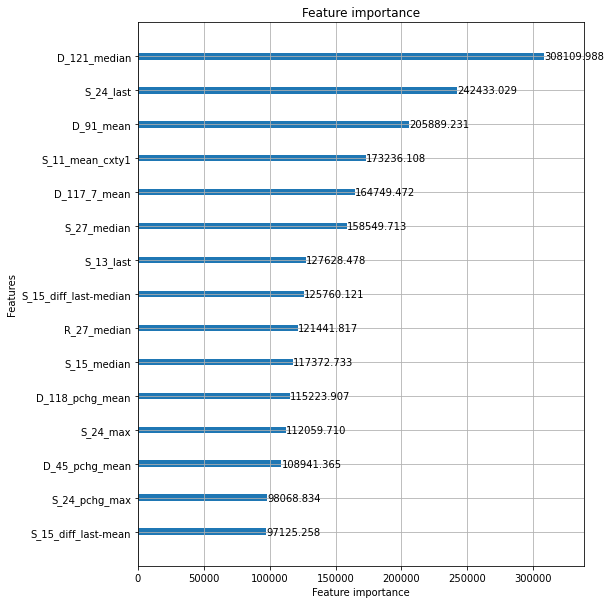

feature to remove: D_121_median
Elapsed time: 30.358949967225392 min.
----------------------------------------------------------------------------------------------------
ITER: 60/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.947461
[100]	valid_0's auc: 0.965589
[150]	valid_0's auc: 0.974682
[200]	valid_0's auc: 0.979573
[250]	valid_0's auc: 0.982663
[300]	valid_0's auc: 0.984926
[350]	valid_0's auc: 0.986837
[400]	valid_0's auc: 0.988337
[450]	valid_0's auc: 0.989561
[500]	valid_0's auc: 0.9905
[550]	valid_0's auc: 0.991263
[600]	valid_0's auc: 0.991946
[650]	valid_0's auc: 0.992395
[700]	valid_0's auc: 0.992923
[750]	valid_0's auc: 0.993262
[800]	valid_0's auc: 0.993666
[850]	valid_0's auc: 0.994006
[900]	valid_0's auc: 0.99431
[950]	valid_0's auc: 0.994593
[1000]	valid_0's auc: 0.994765
[1050]	valid_0's auc: 0.99495
[1100]	valid_0's auc: 0.995092
[1150]	valid_0's auc: 0.995274
[1200]	valid_0's auc: 0.995386
[1250]	valid_0's auc: 0.995489
[13

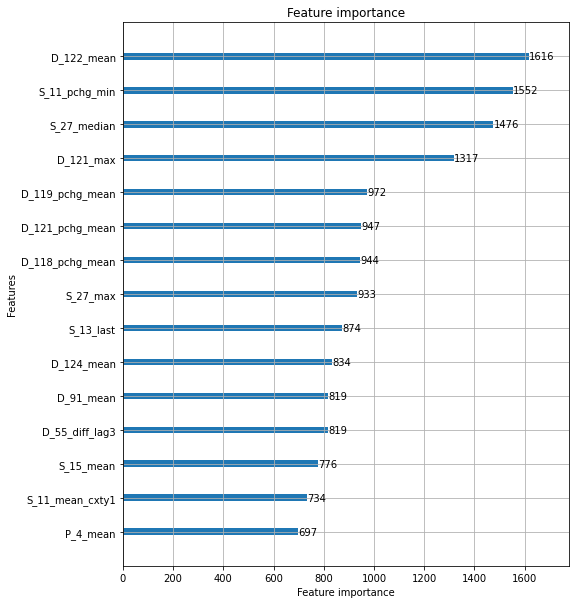

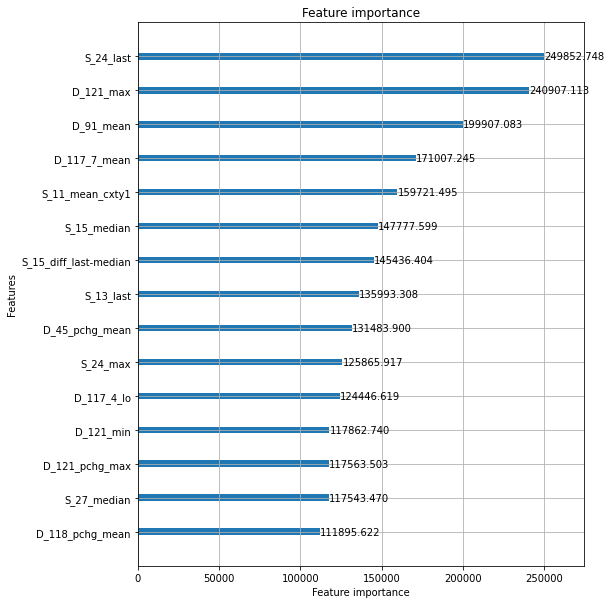

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.947597
[100]	valid_0's auc: 0.965896
[150]	valid_0's auc: 0.974627
[200]	valid_0's auc: 0.979504
[250]	valid_0's auc: 0.982466
[300]	valid_0's auc: 0.984959
[350]	valid_0's auc: 0.986691
[400]	valid_0's auc: 0.988134
[450]	valid_0's auc: 0.989617
[500]	valid_0's auc: 0.990365
[550]	valid_0's auc: 0.991167
[600]	valid_0's auc: 0.991938
[650]	valid_0's auc: 0.992395
[700]	valid_0's auc: 0.99279
[750]	valid_0's auc: 0.99316
[800]	valid_0's auc: 0.993513
[850]	valid_0's auc: 0.993827
[900]	valid_0's auc: 0.994109
[950]	valid_0's auc: 0.994345
[1000]	valid_0's auc: 0.994573
[1050]	valid_0's auc: 0.994772
[1100]	valid_0's auc: 0.994969
[1150]	valid_0's auc: 0.995155
[1200]	valid_0's auc: 0.995278
[1250]	valid_0's auc: 0.995401
[1300]	valid_0's auc: 0.995562
[1350]	valid_0's auc: 0.995647
[1400]	valid_0's auc: 0.995776
[1450]	valid_0's auc: 0.995874
[1500]	valid_0's auc: 0.995959
[1550]	valid_0's auc: 0.996027

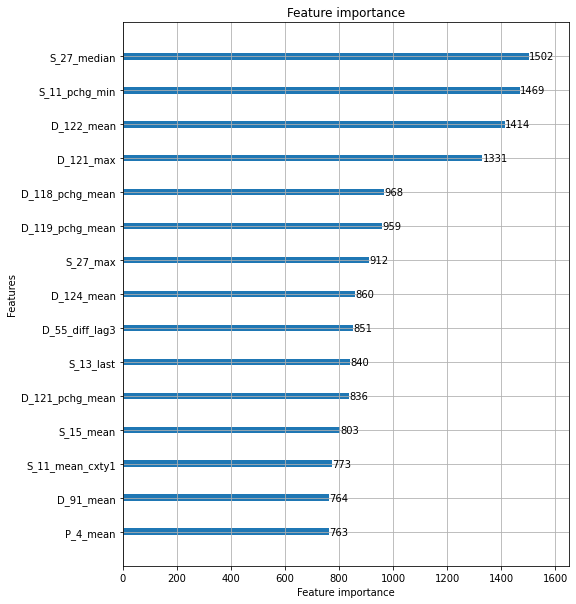

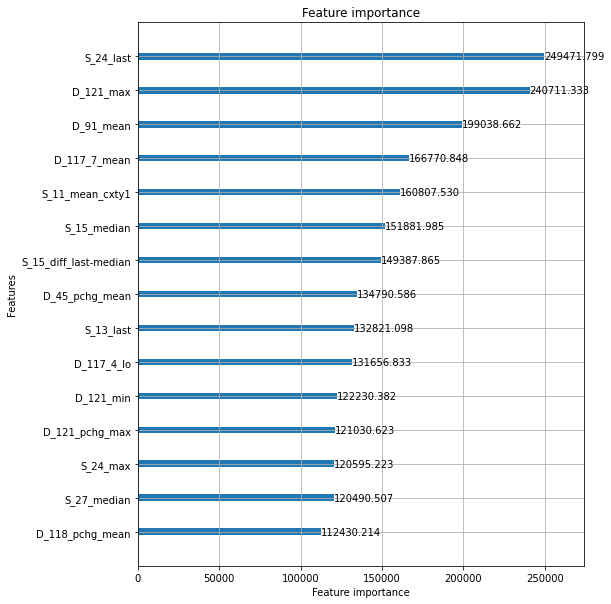

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.947795
[100]	valid_0's auc: 0.965322
[150]	valid_0's auc: 0.975064
[200]	valid_0's auc: 0.979507
[250]	valid_0's auc: 0.982713
[300]	valid_0's auc: 0.985102
[350]	valid_0's auc: 0.986938
[400]	valid_0's auc: 0.988372
[450]	valid_0's auc: 0.989462
[500]	valid_0's auc: 0.990339
[550]	valid_0's auc: 0.991311
[600]	valid_0's auc: 0.992006
[650]	valid_0's auc: 0.992542
[700]	valid_0's auc: 0.993023
[750]	valid_0's auc: 0.993377
[800]	valid_0's auc: 0.993691
[850]	valid_0's auc: 0.994101
[900]	valid_0's auc: 0.994331
[950]	valid_0's auc: 0.994523
[1000]	valid_0's auc: 0.994803
[1050]	valid_0's auc: 0.994982
[1100]	valid_0's auc: 0.995126
[1150]	valid_0's auc: 0.995326
[1200]	valid_0's auc: 0.995445
[1250]	valid_0's auc: 0.995569
[1300]	valid_0's auc: 0.995704
[1350]	valid_0's auc: 0.995827
[1400]	valid_0's auc: 0.995924
[1450]	valid_0's auc: 0.99603
[1500]	valid_0's auc: 0.996113
[1550]	valid_0's auc: 0.99618

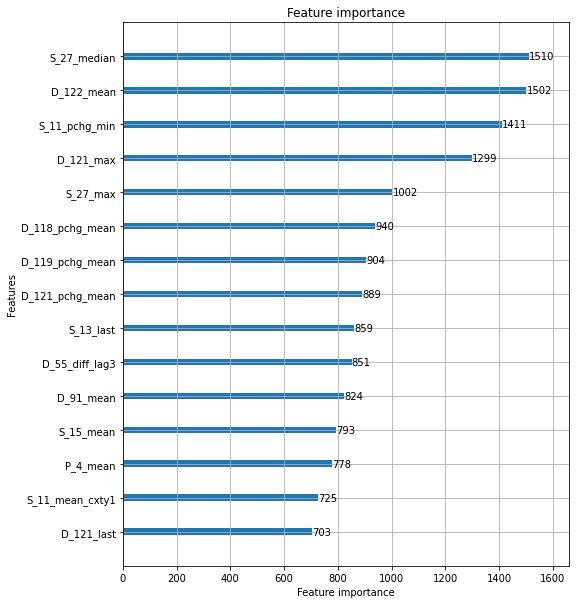

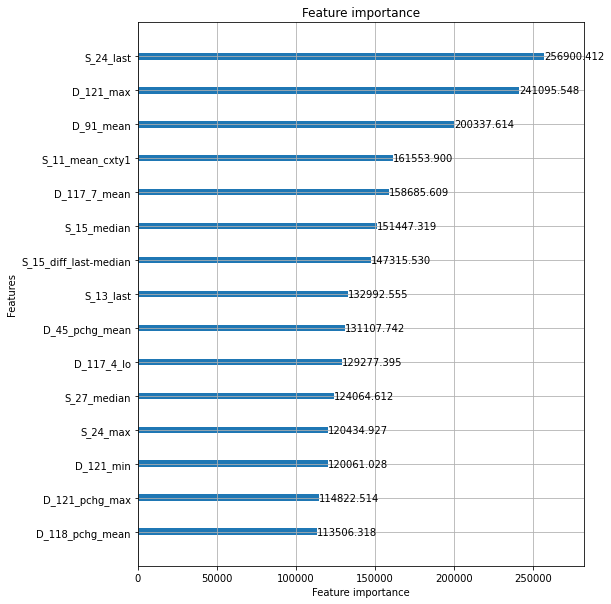

feature to remove: S_24_last
Elapsed time: 30.547620987892152 min.
----------------------------------------------------------------------------------------------------
ITER: 61/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.9433
[100]	valid_0's auc: 0.964525
[150]	valid_0's auc: 0.974646
[200]	valid_0's auc: 0.979336
[250]	valid_0's auc: 0.982583
[300]	valid_0's auc: 0.984885
[350]	valid_0's auc: 0.986715
[400]	valid_0's auc: 0.988107
[450]	valid_0's auc: 0.989192
[500]	valid_0's auc: 0.990137
[550]	valid_0's auc: 0.991027
[600]	valid_0's auc: 0.991743
[650]	valid_0's auc: 0.992243
[700]	valid_0's auc: 0.992742
[750]	valid_0's auc: 0.993131
[800]	valid_0's auc: 0.993451
[850]	valid_0's auc: 0.993774
[900]	valid_0's auc: 0.994156
[950]	valid_0's auc: 0.994421
[1000]	valid_0's auc: 0.994649
[1050]	valid_0's auc: 0.994845
[1100]	valid_0's auc: 0.994974
[1150]	valid_0's auc: 0.995089
[1200]	valid_0's auc: 0.995259
[1250]	valid_0's auc: 0.995429
[130

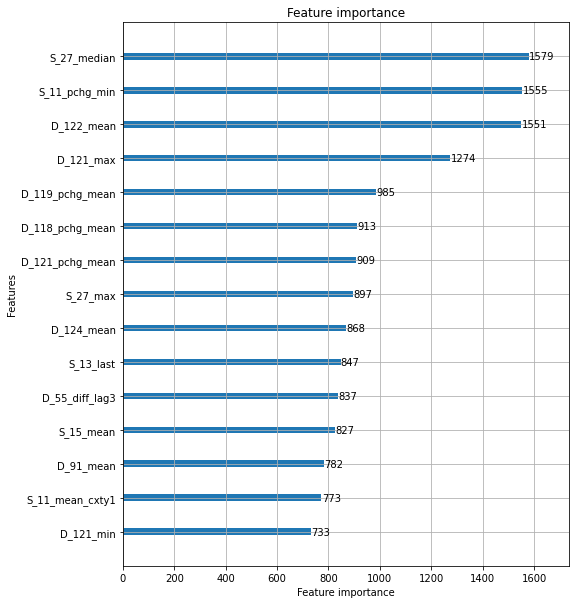

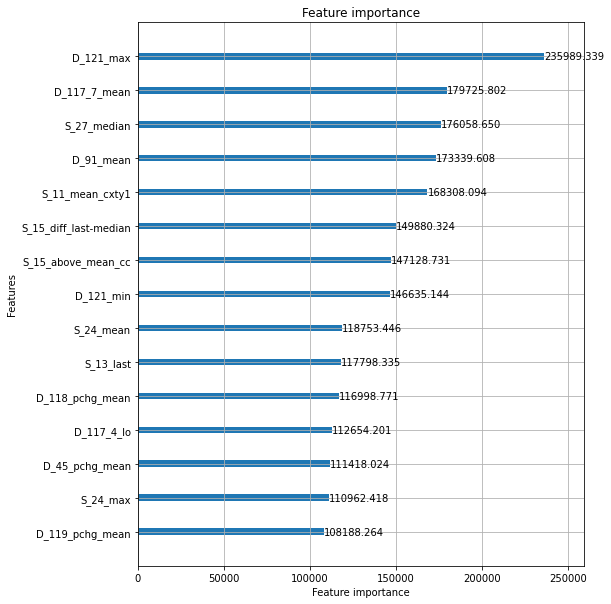

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.943486
[100]	valid_0's auc: 0.963911
[150]	valid_0's auc: 0.975011
[200]	valid_0's auc: 0.979669
[250]	valid_0's auc: 0.982838
[300]	valid_0's auc: 0.985196
[350]	valid_0's auc: 0.986911
[400]	valid_0's auc: 0.988296
[450]	valid_0's auc: 0.989431
[500]	valid_0's auc: 0.990525
[550]	valid_0's auc: 0.99116
[600]	valid_0's auc: 0.991773
[650]	valid_0's auc: 0.992296
[700]	valid_0's auc: 0.992833
[750]	valid_0's auc: 0.99327
[800]	valid_0's auc: 0.993683
[850]	valid_0's auc: 0.994126
[900]	valid_0's auc: 0.994397
[950]	valid_0's auc: 0.994612
[1000]	valid_0's auc: 0.994888
[1050]	valid_0's auc: 0.995041
[1100]	valid_0's auc: 0.995207
[1150]	valid_0's auc: 0.995309
[1200]	valid_0's auc: 0.995427
[1250]	valid_0's auc: 0.995523
[1300]	valid_0's auc: 0.995638
[1350]	valid_0's auc: 0.995789
[1400]	valid_0's auc: 0.995891
[1450]	valid_0's auc: 0.995953
[1500]	valid_0's auc: 0.996028
[1550]	valid_0's auc: 0.996121

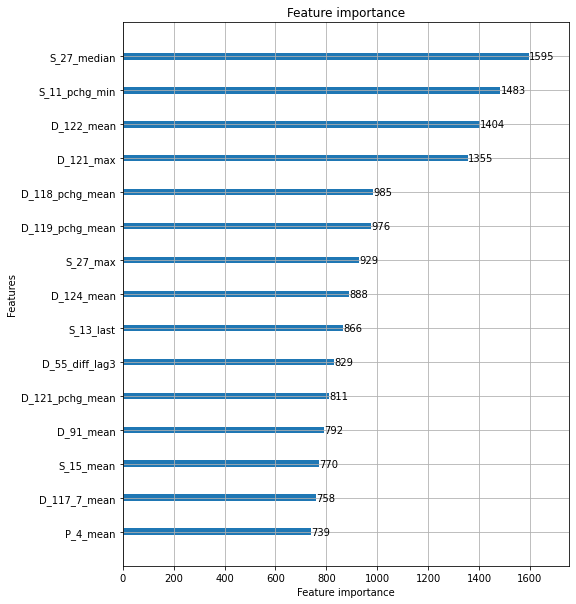

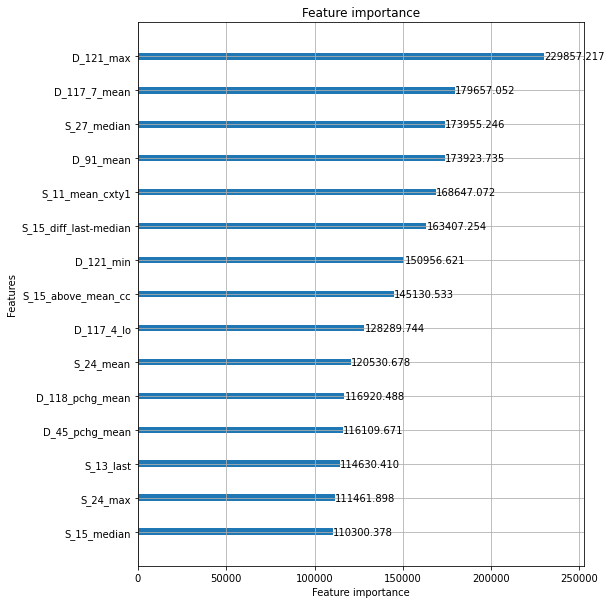

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.943485
[100]	valid_0's auc: 0.963845
[150]	valid_0's auc: 0.975006
[200]	valid_0's auc: 0.979681
[250]	valid_0's auc: 0.982853
[300]	valid_0's auc: 0.985098
[350]	valid_0's auc: 0.987019
[400]	valid_0's auc: 0.98842
[450]	valid_0's auc: 0.989531
[500]	valid_0's auc: 0.990562
[550]	valid_0's auc: 0.991278
[600]	valid_0's auc: 0.991869
[650]	valid_0's auc: 0.99245
[700]	valid_0's auc: 0.992922
[750]	valid_0's auc: 0.993315
[800]	valid_0's auc: 0.993692
[850]	valid_0's auc: 0.993979
[900]	valid_0's auc: 0.994267
[950]	valid_0's auc: 0.994576
[1000]	valid_0's auc: 0.994849
[1050]	valid_0's auc: 0.995063
[1100]	valid_0's auc: 0.995231
[1150]	valid_0's auc: 0.995335
[1200]	valid_0's auc: 0.995505
[1250]	valid_0's auc: 0.995635
[1300]	valid_0's auc: 0.995752
[1350]	valid_0's auc: 0.995844
[1400]	valid_0's auc: 0.995927
[1450]	valid_0's auc: 0.996018
[1500]	valid_0's auc: 0.996085
[1550]	valid_0's auc: 0.996154

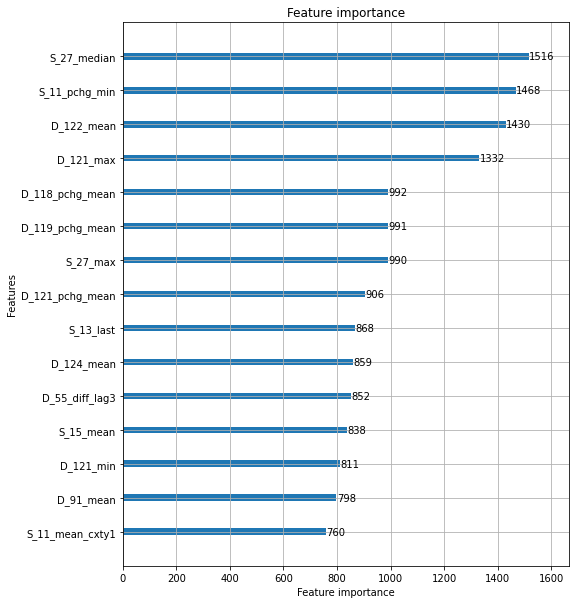

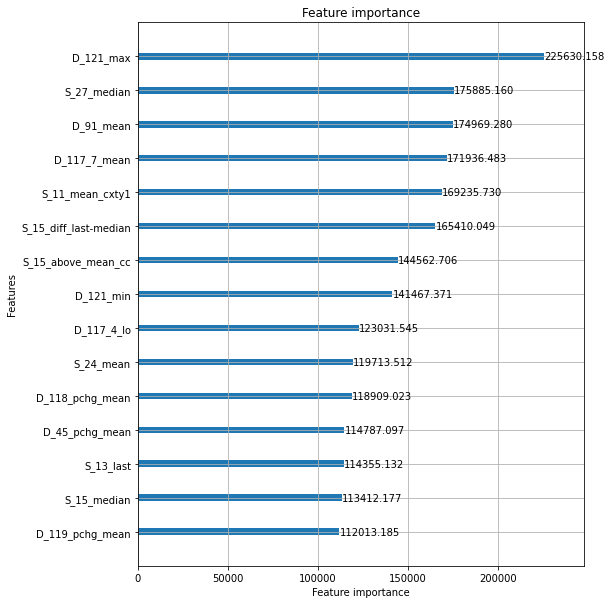

feature to remove: D_121_max
Elapsed time: 30.593543970584868 min.
----------------------------------------------------------------------------------------------------
ITER: 62/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.94632
[100]	valid_0's auc: 0.964386
[150]	valid_0's auc: 0.974141
[200]	valid_0's auc: 0.978634
[250]	valid_0's auc: 0.981985
[300]	valid_0's auc: 0.984469
[350]	valid_0's auc: 0.986703
[400]	valid_0's auc: 0.987978
[450]	valid_0's auc: 0.988957
[500]	valid_0's auc: 0.98975
[550]	valid_0's auc: 0.990582
[600]	valid_0's auc: 0.991258
[650]	valid_0's auc: 0.991967
[700]	valid_0's auc: 0.992402
[750]	valid_0's auc: 0.992891
[800]	valid_0's auc: 0.993197
[850]	valid_0's auc: 0.993505
[900]	valid_0's auc: 0.993889
[950]	valid_0's auc: 0.994121
[1000]	valid_0's auc: 0.994471
[1050]	valid_0's auc: 0.994673
[1100]	valid_0's auc: 0.994921
[1150]	valid_0's auc: 0.995077
[1200]	valid_0's auc: 0.995269
[1250]	valid_0's auc: 0.995373
[130

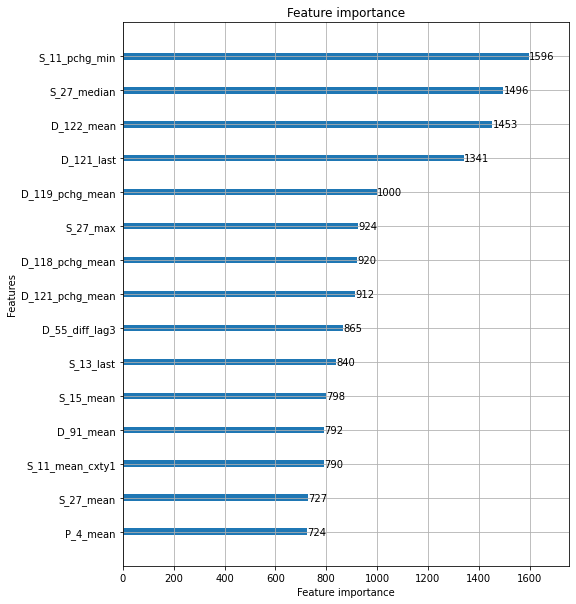

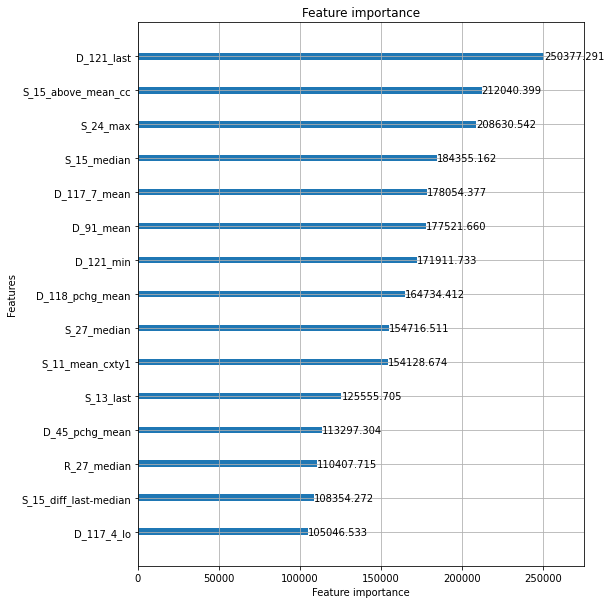

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.946246
[100]	valid_0's auc: 0.96386
[150]	valid_0's auc: 0.974771
[200]	valid_0's auc: 0.979119
[250]	valid_0's auc: 0.982378
[300]	valid_0's auc: 0.984798
[350]	valid_0's auc: 0.986535
[400]	valid_0's auc: 0.987896
[450]	valid_0's auc: 0.988946
[500]	valid_0's auc: 0.98981
[550]	valid_0's auc: 0.99076
[600]	valid_0's auc: 0.991462
[650]	valid_0's auc: 0.992063
[700]	valid_0's auc: 0.992532
[750]	valid_0's auc: 0.99294
[800]	valid_0's auc: 0.9934
[850]	valid_0's auc: 0.993669
[900]	valid_0's auc: 0.993991
[950]	valid_0's auc: 0.994208
[1000]	valid_0's auc: 0.994427
[1050]	valid_0's auc: 0.994626
[1100]	valid_0's auc: 0.994808
[1150]	valid_0's auc: 0.994956
[1200]	valid_0's auc: 0.995081
[1250]	valid_0's auc: 0.995175
[1300]	valid_0's auc: 0.995347
[1350]	valid_0's auc: 0.995438
[1400]	valid_0's auc: 0.995545
[1450]	valid_0's auc: 0.99565
[1500]	valid_0's auc: 0.995772
[1550]	valid_0's auc: 0.995872
[160

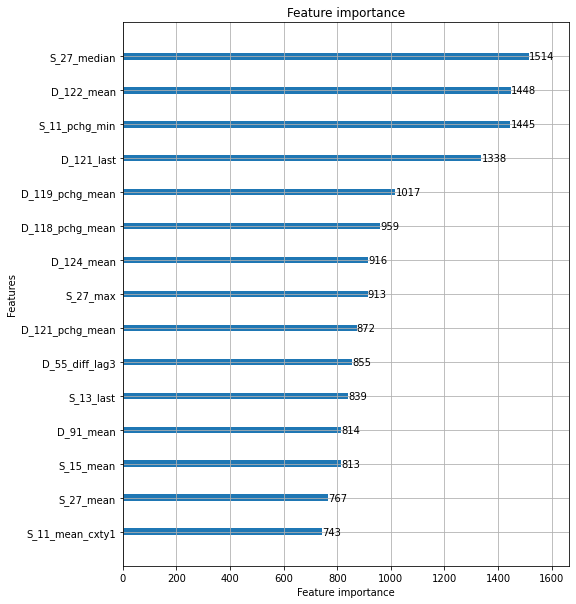

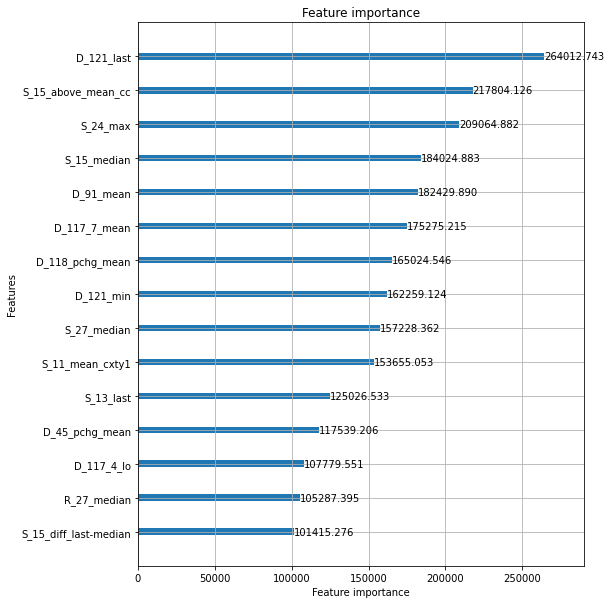

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.945018
[100]	valid_0's auc: 0.964569
[150]	valid_0's auc: 0.974994
[200]	valid_0's auc: 0.979531
[250]	valid_0's auc: 0.982669
[300]	valid_0's auc: 0.985207
[350]	valid_0's auc: 0.987063
[400]	valid_0's auc: 0.988362
[450]	valid_0's auc: 0.989356
[500]	valid_0's auc: 0.990432
[550]	valid_0's auc: 0.991084
[600]	valid_0's auc: 0.991804
[650]	valid_0's auc: 0.992637
[700]	valid_0's auc: 0.993033
[750]	valid_0's auc: 0.993438
[800]	valid_0's auc: 0.993757
[850]	valid_0's auc: 0.993986
[900]	valid_0's auc: 0.994296
[950]	valid_0's auc: 0.994498
[1000]	valid_0's auc: 0.994734
[1050]	valid_0's auc: 0.994908
[1100]	valid_0's auc: 0.99505
[1150]	valid_0's auc: 0.995197
[1200]	valid_0's auc: 0.995354
[1250]	valid_0's auc: 0.995472
[1300]	valid_0's auc: 0.99557
[1350]	valid_0's auc: 0.99566
[1400]	valid_0's auc: 0.995766
[1450]	valid_0's auc: 0.995926
[1500]	valid_0's auc: 0.99602
[1550]	valid_0's auc: 0.996085
[

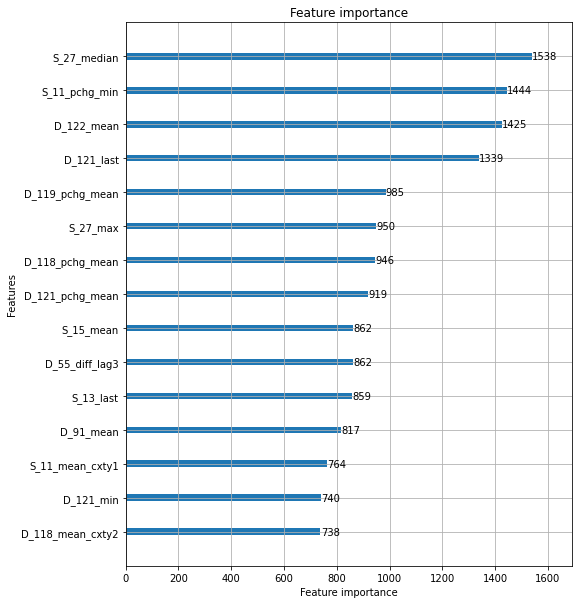

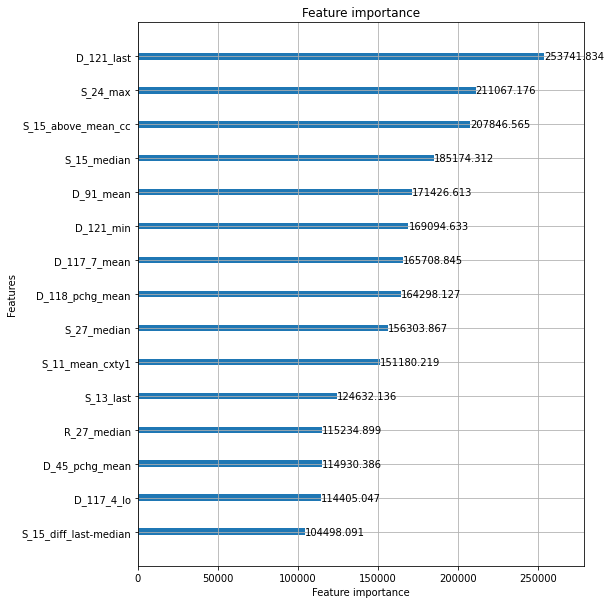

feature to remove: D_121_last
Elapsed time: 31.230753803253172 min.
----------------------------------------------------------------------------------------------------
ITER: 63/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.942664
[100]	valid_0's auc: 0.963683
[150]	valid_0's auc: 0.973257
[200]	valid_0's auc: 0.978398
[250]	valid_0's auc: 0.981623
[300]	valid_0's auc: 0.984185
[350]	valid_0's auc: 0.986031
[400]	valid_0's auc: 0.987471
[450]	valid_0's auc: 0.988606
[500]	valid_0's auc: 0.989717
[550]	valid_0's auc: 0.990649
[600]	valid_0's auc: 0.991312
[650]	valid_0's auc: 0.991982
[700]	valid_0's auc: 0.992416
[750]	valid_0's auc: 0.992896
[800]	valid_0's auc: 0.993342
[850]	valid_0's auc: 0.99361
[900]	valid_0's auc: 0.993952
[950]	valid_0's auc: 0.994286
[1000]	valid_0's auc: 0.994473
[1050]	valid_0's auc: 0.994679
[1100]	valid_0's auc: 0.994873
[1150]	valid_0's auc: 0.995043
[1200]	valid_0's auc: 0.995153
[1250]	valid_0's auc: 0.995337
[1

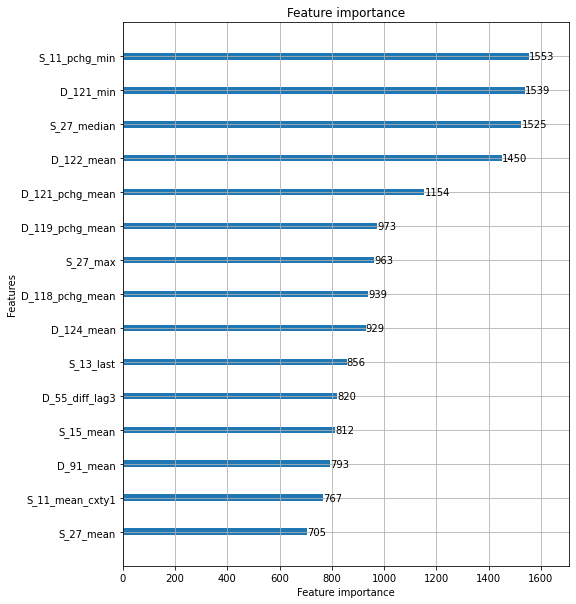

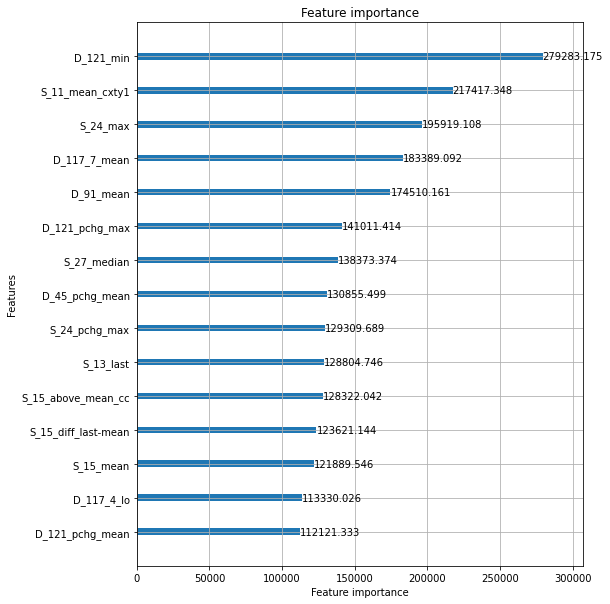

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.943802
[100]	valid_0's auc: 0.964577
[150]	valid_0's auc: 0.973562
[200]	valid_0's auc: 0.978535
[250]	valid_0's auc: 0.981874
[300]	valid_0's auc: 0.984241
[350]	valid_0's auc: 0.986405
[400]	valid_0's auc: 0.987726
[450]	valid_0's auc: 0.988803
[500]	valid_0's auc: 0.989704
[550]	valid_0's auc: 0.990801
[600]	valid_0's auc: 0.991435
[650]	valid_0's auc: 0.991981
[700]	valid_0's auc: 0.992364
[750]	valid_0's auc: 0.992855
[800]	valid_0's auc: 0.993263
[850]	valid_0's auc: 0.993633
[900]	valid_0's auc: 0.993939
[950]	valid_0's auc: 0.994219
[1000]	valid_0's auc: 0.994423
[1050]	valid_0's auc: 0.994629
[1100]	valid_0's auc: 0.994811
[1150]	valid_0's auc: 0.99494
[1200]	valid_0's auc: 0.995066
[1250]	valid_0's auc: 0.99519
[1300]	valid_0's auc: 0.995287
[1350]	valid_0's auc: 0.995389
[1400]	valid_0's auc: 0.99552
[1450]	valid_0's auc: 0.995664
[1500]	valid_0's auc: 0.995756
[1550]	valid_0's auc: 0.995861


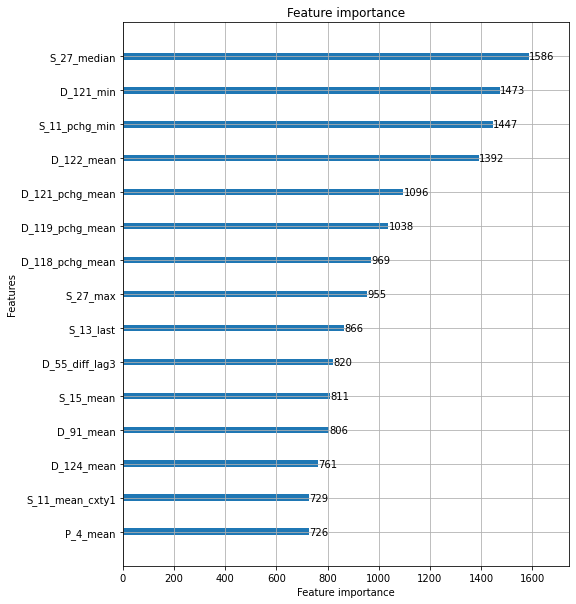

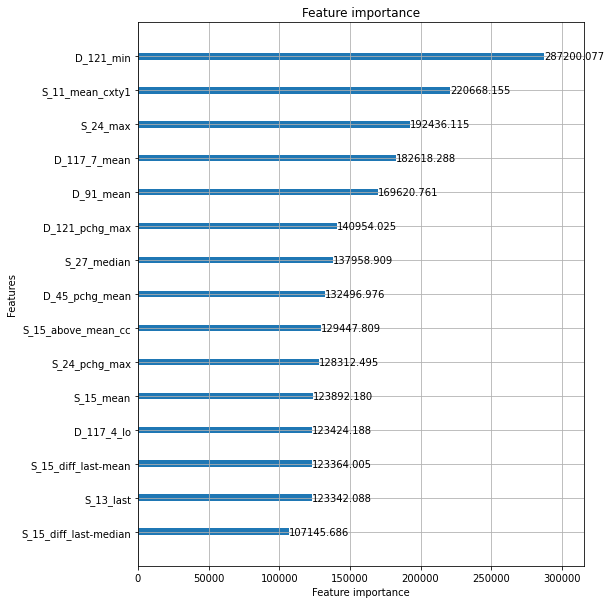

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.943075
[100]	valid_0's auc: 0.964153
[150]	valid_0's auc: 0.973879
[200]	valid_0's auc: 0.97944
[250]	valid_0's auc: 0.982548
[300]	valid_0's auc: 0.984615
[350]	valid_0's auc: 0.98672
[400]	valid_0's auc: 0.987936
[450]	valid_0's auc: 0.989016
[500]	valid_0's auc: 0.98988
[550]	valid_0's auc: 0.990991
[600]	valid_0's auc: 0.991711
[650]	valid_0's auc: 0.992183
[700]	valid_0's auc: 0.992541
[750]	valid_0's auc: 0.992988
[800]	valid_0's auc: 0.993297
[850]	valid_0's auc: 0.993564
[900]	valid_0's auc: 0.99392
[950]	valid_0's auc: 0.994266
[1000]	valid_0's auc: 0.994423
[1050]	valid_0's auc: 0.994742
[1100]	valid_0's auc: 0.994879
[1150]	valid_0's auc: 0.995057
[1200]	valid_0's auc: 0.995204
[1250]	valid_0's auc: 0.995357
[1300]	valid_0's auc: 0.995478
[1350]	valid_0's auc: 0.995565
[1400]	valid_0's auc: 0.995674
[1450]	valid_0's auc: 0.995756
[1500]	valid_0's auc: 0.995856
[1550]	valid_0's auc: 0.995938
[

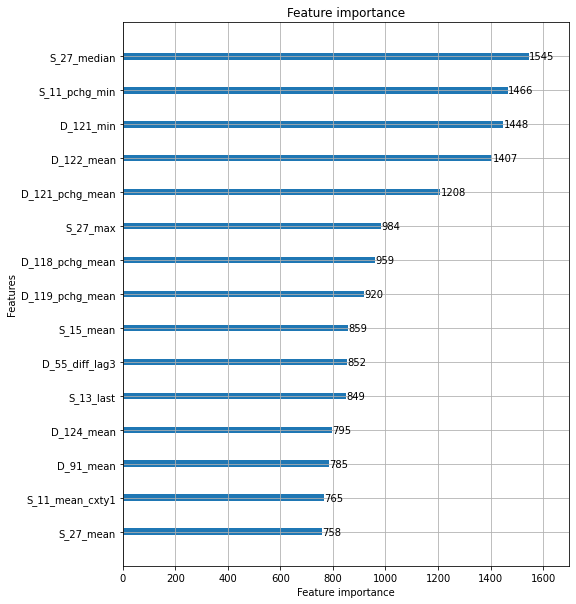

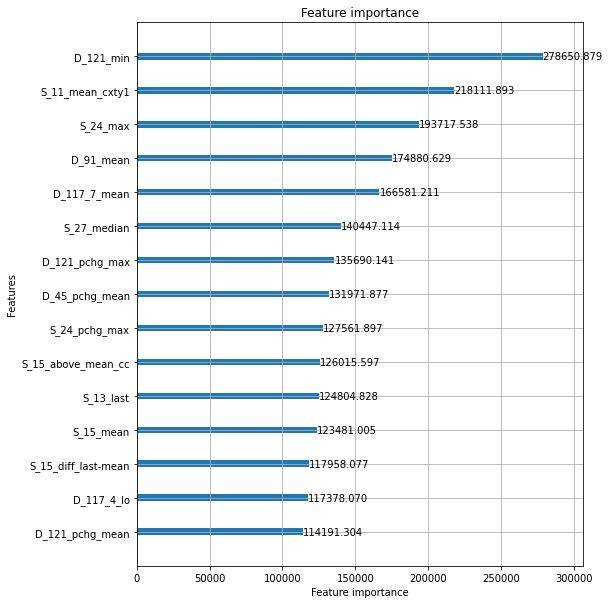

feature to remove: D_121_min
Elapsed time: 30.823957272370656 min.
----------------------------------------------------------------------------------------------------
ITER: 64/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.944655
[100]	valid_0's auc: 0.965451
[150]	valid_0's auc: 0.974097
[200]	valid_0's auc: 0.979044
[250]	valid_0's auc: 0.98224
[300]	valid_0's auc: 0.984497
[350]	valid_0's auc: 0.986288
[400]	valid_0's auc: 0.987554
[450]	valid_0's auc: 0.98857
[500]	valid_0's auc: 0.989487
[550]	valid_0's auc: 0.990379
[600]	valid_0's auc: 0.991019
[650]	valid_0's auc: 0.991502
[700]	valid_0's auc: 0.992114
[750]	valid_0's auc: 0.992563
[800]	valid_0's auc: 0.992879
[850]	valid_0's auc: 0.993215
[900]	valid_0's auc: 0.993463
[950]	valid_0's auc: 0.993779
[1000]	valid_0's auc: 0.994068
[1050]	valid_0's auc: 0.994366
[1100]	valid_0's auc: 0.994596
[1150]	valid_0's auc: 0.994744
[1200]	valid_0's auc: 0.99493
[1250]	valid_0's auc: 0.995029
[1300

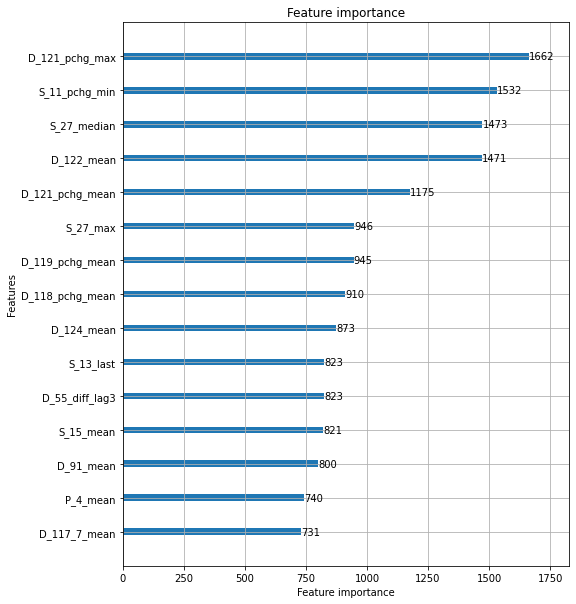

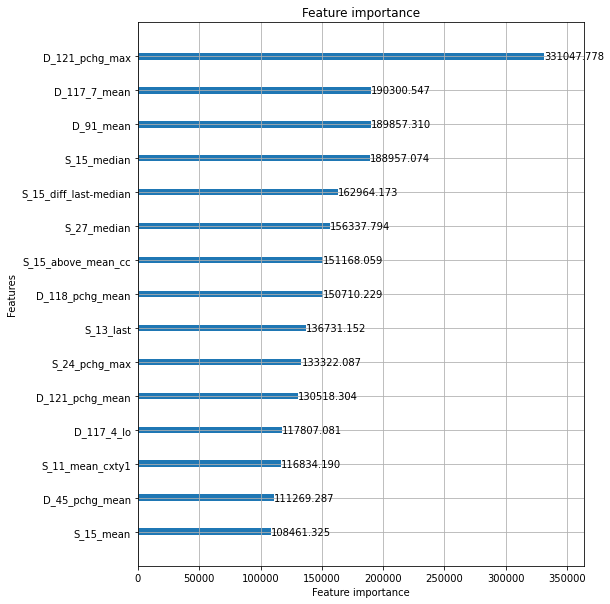

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.945923
[100]	valid_0's auc: 0.965734
[150]	valid_0's auc: 0.974739
[200]	valid_0's auc: 0.979666
[250]	valid_0's auc: 0.982602
[300]	valid_0's auc: 0.984716
[350]	valid_0's auc: 0.986528
[400]	valid_0's auc: 0.987894
[450]	valid_0's auc: 0.988868
[500]	valid_0's auc: 0.989763
[550]	valid_0's auc: 0.990469
[600]	valid_0's auc: 0.991016
[650]	valid_0's auc: 0.99164
[700]	valid_0's auc: 0.992171
[750]	valid_0's auc: 0.992674
[800]	valid_0's auc: 0.993029
[850]	valid_0's auc: 0.993322
[900]	valid_0's auc: 0.993629
[950]	valid_0's auc: 0.993926
[1000]	valid_0's auc: 0.994224
[1050]	valid_0's auc: 0.994466
[1100]	valid_0's auc: 0.99465
[1150]	valid_0's auc: 0.994836
[1200]	valid_0's auc: 0.994998
[1250]	valid_0's auc: 0.995112
[1300]	valid_0's auc: 0.995205
[1350]	valid_0's auc: 0.995464
[1400]	valid_0's auc: 0.995614
[1450]	valid_0's auc: 0.99568
[1500]	valid_0's auc: 0.995767
[1550]	valid_0's auc: 0.995834


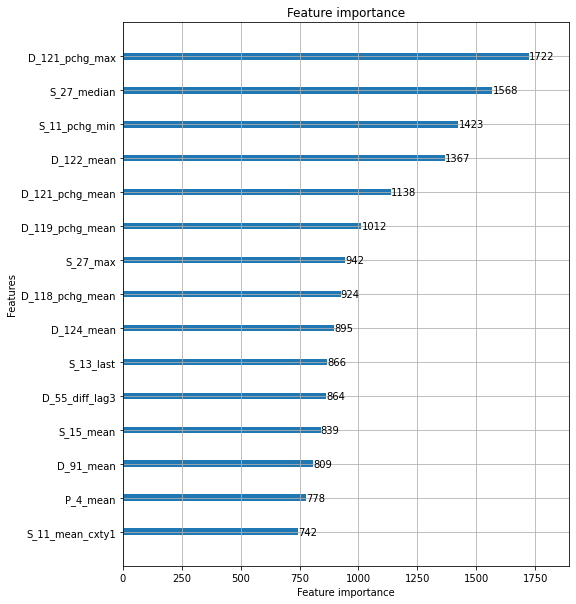

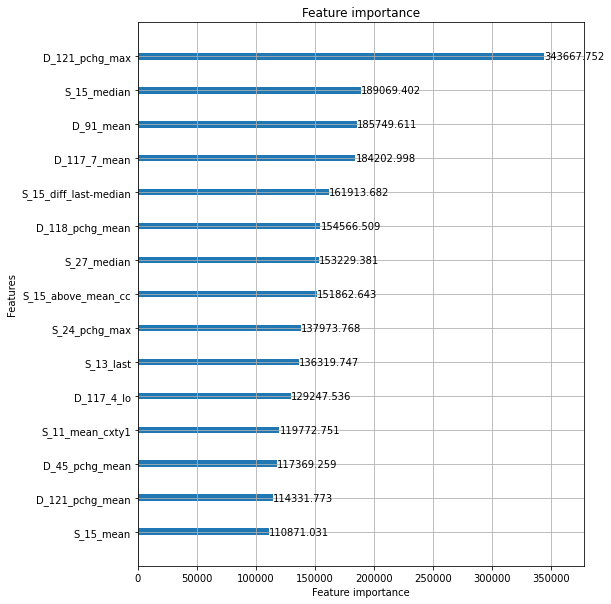

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.944936
[100]	valid_0's auc: 0.96494
[150]	valid_0's auc: 0.974574
[200]	valid_0's auc: 0.97943
[250]	valid_0's auc: 0.982307
[300]	valid_0's auc: 0.984648
[350]	valid_0's auc: 0.986488
[400]	valid_0's auc: 0.987806
[450]	valid_0's auc: 0.988716
[500]	valid_0's auc: 0.989724
[550]	valid_0's auc: 0.99038
[600]	valid_0's auc: 0.990922
[650]	valid_0's auc: 0.991502
[700]	valid_0's auc: 0.992091
[750]	valid_0's auc: 0.992607
[800]	valid_0's auc: 0.992974
[850]	valid_0's auc: 0.99324
[900]	valid_0's auc: 0.993634
[950]	valid_0's auc: 0.993878
[1000]	valid_0's auc: 0.994179
[1050]	valid_0's auc: 0.994546
[1100]	valid_0's auc: 0.994725
[1150]	valid_0's auc: 0.99487
[1200]	valid_0's auc: 0.994998
[1250]	valid_0's auc: 0.995157
[1300]	valid_0's auc: 0.995244
[1350]	valid_0's auc: 0.995455
[1400]	valid_0's auc: 0.995588
[1450]	valid_0's auc: 0.995683
[1500]	valid_0's auc: 0.995756
[1550]	valid_0's auc: 0.995849
[1

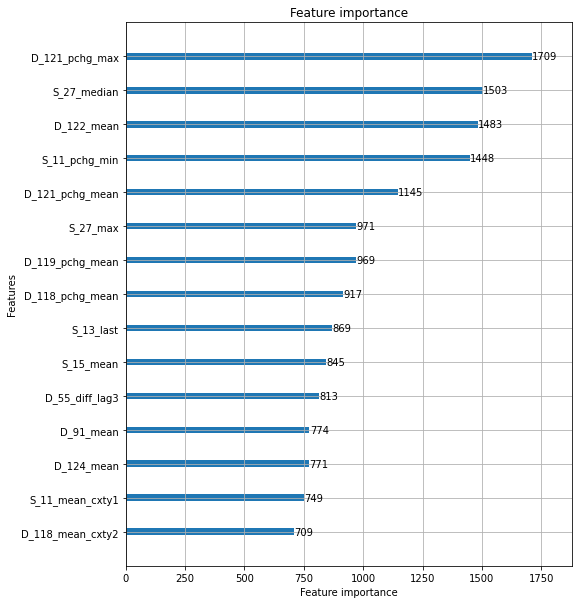

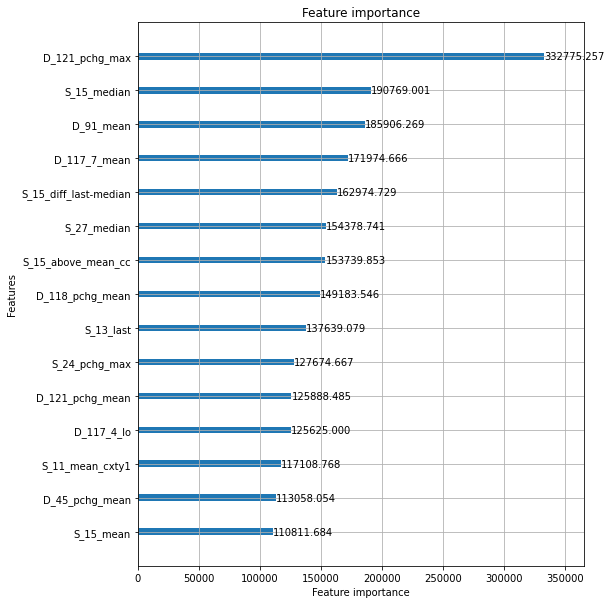

feature to remove: D_121_pchg_max
Elapsed time: 30.78691643079122 min.
----------------------------------------------------------------------------------------------------
ITER: 65/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.94287
[100]	valid_0's auc: 0.96246
[150]	valid_0's auc: 0.971481
[200]	valid_0's auc: 0.976752
[250]	valid_0's auc: 0.980513
[300]	valid_0's auc: 0.98316
[350]	valid_0's auc: 0.985277
[400]	valid_0's auc: 0.986521
[450]	valid_0's auc: 0.987827
[500]	valid_0's auc: 0.988889
[550]	valid_0's auc: 0.989672
[600]	valid_0's auc: 0.990368
[650]	valid_0's auc: 0.990992
[700]	valid_0's auc: 0.991465
[750]	valid_0's auc: 0.992137
[800]	valid_0's auc: 0.992644
[850]	valid_0's auc: 0.992907
[900]	valid_0's auc: 0.993338
[950]	valid_0's auc: 0.993537
[1000]	valid_0's auc: 0.993743
[1050]	valid_0's auc: 0.993963
[1100]	valid_0's auc: 0.994215
[1150]	valid_0's auc: 0.994655
[1200]	valid_0's auc: 0.994798
[1250]	valid_0's auc: 0.994917
[

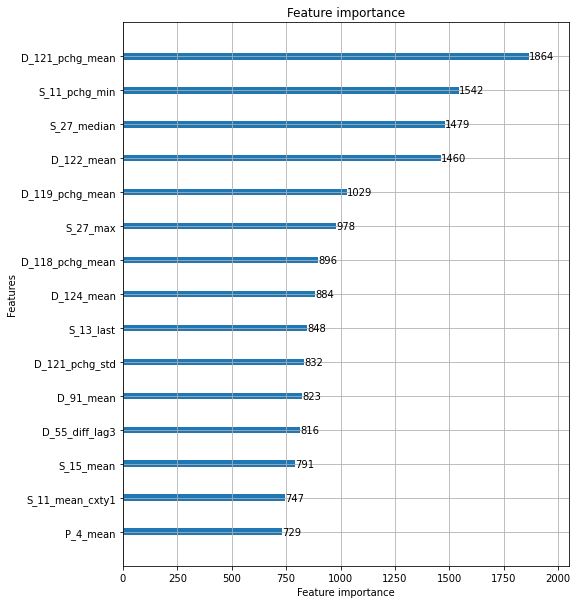

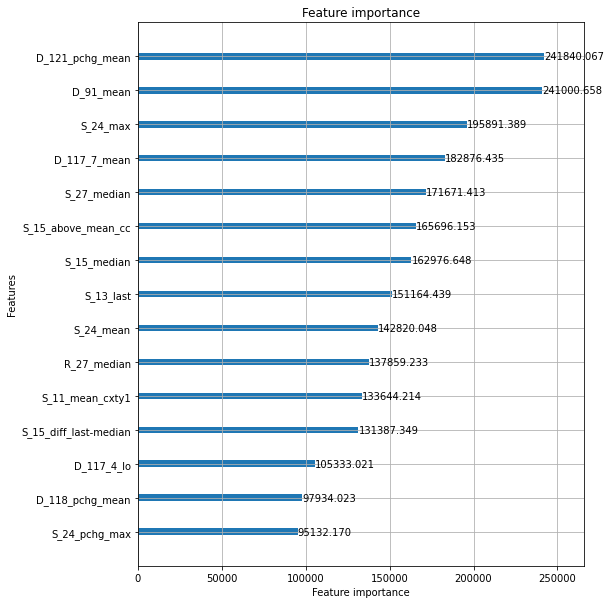

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.942017
[100]	valid_0's auc: 0.962986
[150]	valid_0's auc: 0.971923
[200]	valid_0's auc: 0.97716
[250]	valid_0's auc: 0.980526
[300]	valid_0's auc: 0.983352
[350]	valid_0's auc: 0.985174
[400]	valid_0's auc: 0.986653
[450]	valid_0's auc: 0.987727
[500]	valid_0's auc: 0.988682
[550]	valid_0's auc: 0.98946
[600]	valid_0's auc: 0.990107
[650]	valid_0's auc: 0.990808
[700]	valid_0's auc: 0.991379
[750]	valid_0's auc: 0.991947
[800]	valid_0's auc: 0.992461
[850]	valid_0's auc: 0.99282
[900]	valid_0's auc: 0.993195
[950]	valid_0's auc: 0.993453
[1000]	valid_0's auc: 0.993731
[1050]	valid_0's auc: 0.994018
[1100]	valid_0's auc: 0.994189
[1150]	valid_0's auc: 0.994507
[1200]	valid_0's auc: 0.994696
[1250]	valid_0's auc: 0.994826
[1300]	valid_0's auc: 0.994959
[1350]	valid_0's auc: 0.995087
[1400]	valid_0's auc: 0.995183
[1450]	valid_0's auc: 0.995273
[1500]	valid_0's auc: 0.995387
[1550]	valid_0's auc: 0.99549
[

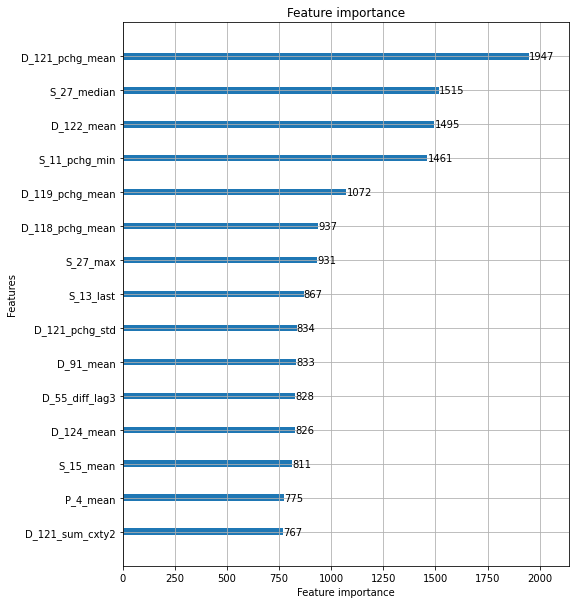

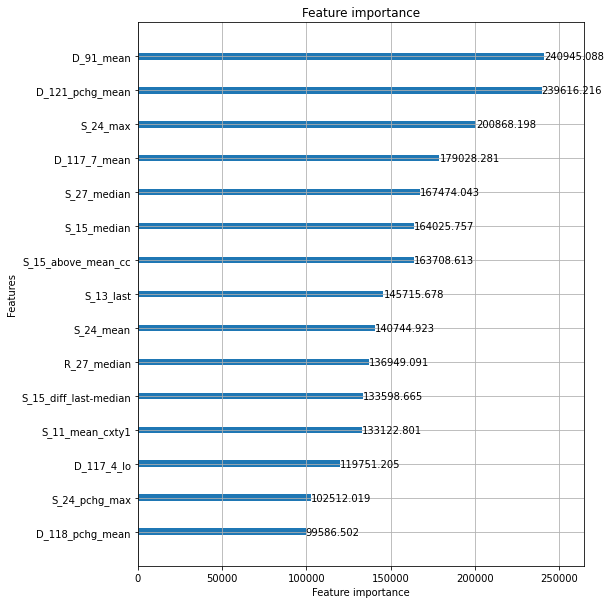

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.942415
[100]	valid_0's auc: 0.962343
[150]	valid_0's auc: 0.972328
[200]	valid_0's auc: 0.977486
[250]	valid_0's auc: 0.980801
[300]	valid_0's auc: 0.983637
[350]	valid_0's auc: 0.985496
[400]	valid_0's auc: 0.987018
[450]	valid_0's auc: 0.988122
[500]	valid_0's auc: 0.988981
[550]	valid_0's auc: 0.989739
[600]	valid_0's auc: 0.99052
[650]	valid_0's auc: 0.991053
[700]	valid_0's auc: 0.991507
[750]	valid_0's auc: 0.991928
[800]	valid_0's auc: 0.992375
[850]	valid_0's auc: 0.992848
[900]	valid_0's auc: 0.993458
[950]	valid_0's auc: 0.993689
[1000]	valid_0's auc: 0.993924
[1050]	valid_0's auc: 0.994205
[1100]	valid_0's auc: 0.994401
[1150]	valid_0's auc: 0.994624
[1200]	valid_0's auc: 0.994765
[1250]	valid_0's auc: 0.994907
[1300]	valid_0's auc: 0.995002
[1350]	valid_0's auc: 0.995185
[1400]	valid_0's auc: 0.995369
[1450]	valid_0's auc: 0.995464
[1500]	valid_0's auc: 0.995571
[1550]	valid_0's auc: 0.99563

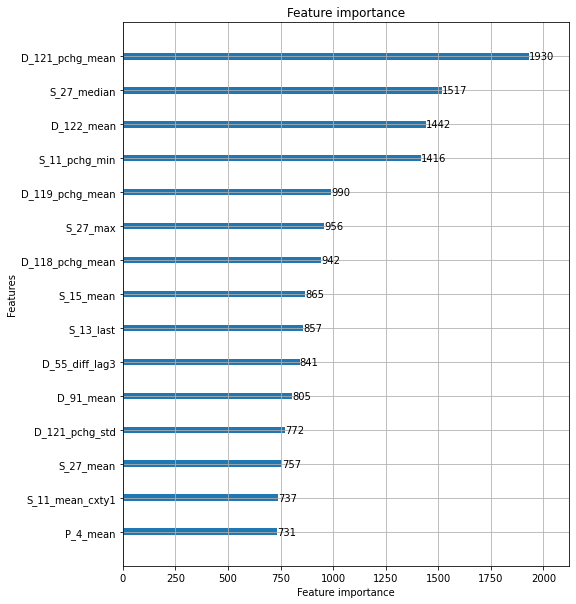

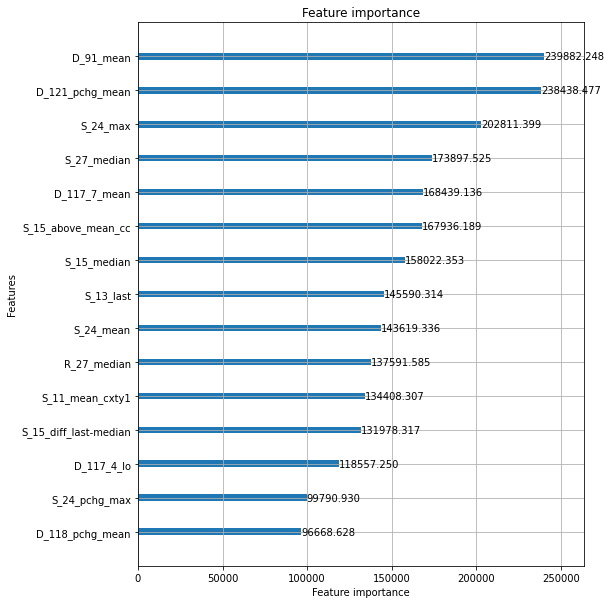

feature to remove: D_91_mean
Elapsed time: 30.851028645038603 min.
----------------------------------------------------------------------------------------------------
ITER: 66/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.939337
[100]	valid_0's auc: 0.962038
[150]	valid_0's auc: 0.971033
[200]	valid_0's auc: 0.975954
[250]	valid_0's auc: 0.979973
[300]	valid_0's auc: 0.982361
[350]	valid_0's auc: 0.984266
[400]	valid_0's auc: 0.985531
[450]	valid_0's auc: 0.986937
[500]	valid_0's auc: 0.988037
[550]	valid_0's auc: 0.98884
[600]	valid_0's auc: 0.989656
[650]	valid_0's auc: 0.9902
[700]	valid_0's auc: 0.990799
[750]	valid_0's auc: 0.99181
[800]	valid_0's auc: 0.992189
[850]	valid_0's auc: 0.992523
[900]	valid_0's auc: 0.992775
[950]	valid_0's auc: 0.993293
[1000]	valid_0's auc: 0.993521
[1050]	valid_0's auc: 0.993819
[1100]	valid_0's auc: 0.994061
[1150]	valid_0's auc: 0.994252
[1200]	valid_0's auc: 0.994406
[1250]	valid_0's auc: 0.994543
[1300]

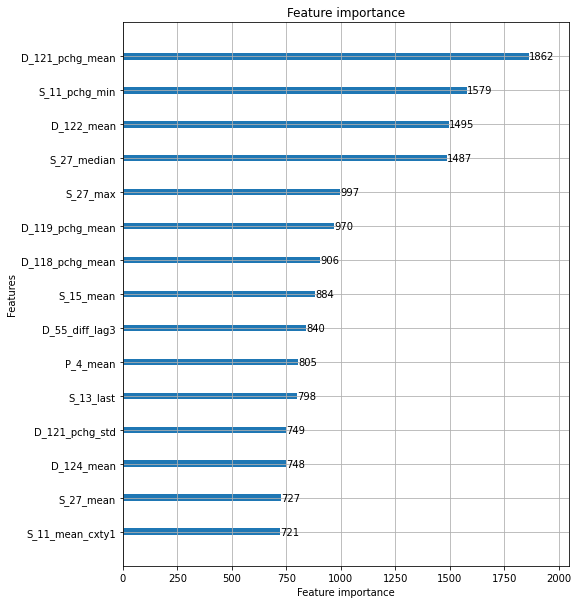

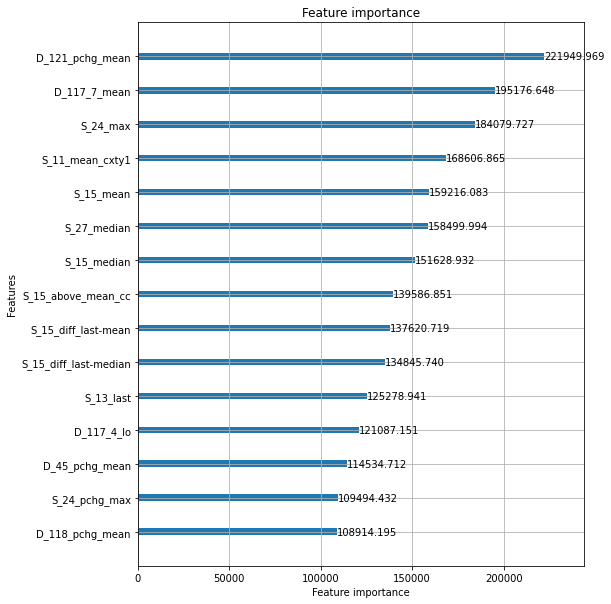

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.939757
[100]	valid_0's auc: 0.96199
[150]	valid_0's auc: 0.971473
[200]	valid_0's auc: 0.976703
[250]	valid_0's auc: 0.980028
[300]	valid_0's auc: 0.982414
[350]	valid_0's auc: 0.984286
[400]	valid_0's auc: 0.985992
[450]	valid_0's auc: 0.987254
[500]	valid_0's auc: 0.988483
[550]	valid_0's auc: 0.989445
[600]	valid_0's auc: 0.990223
[650]	valid_0's auc: 0.990773
[700]	valid_0's auc: 0.991244
[750]	valid_0's auc: 0.991721
[800]	valid_0's auc: 0.992286
[850]	valid_0's auc: 0.992645
[900]	valid_0's auc: 0.992935
[950]	valid_0's auc: 0.993383
[1000]	valid_0's auc: 0.993585
[1050]	valid_0's auc: 0.993823
[1100]	valid_0's auc: 0.994046
[1150]	valid_0's auc: 0.994212
[1200]	valid_0's auc: 0.994494
[1250]	valid_0's auc: 0.994625
[1300]	valid_0's auc: 0.994887
[1350]	valid_0's auc: 0.994999
[1400]	valid_0's auc: 0.995089
[1450]	valid_0's auc: 0.995261
[1500]	valid_0's auc: 0.995357
[1550]	valid_0's auc: 0.99544

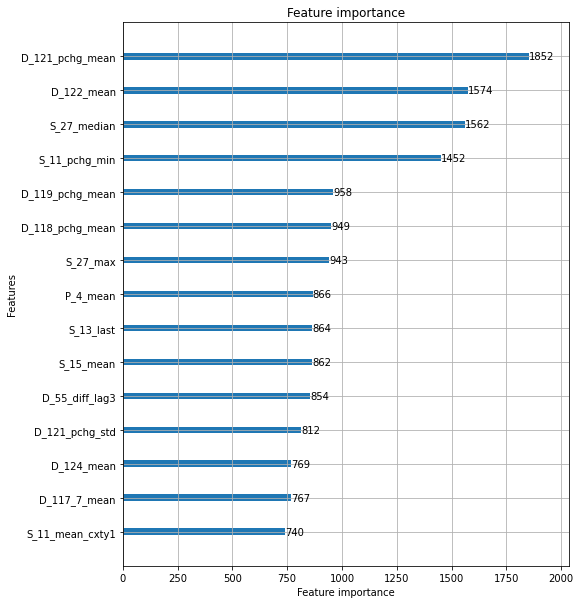

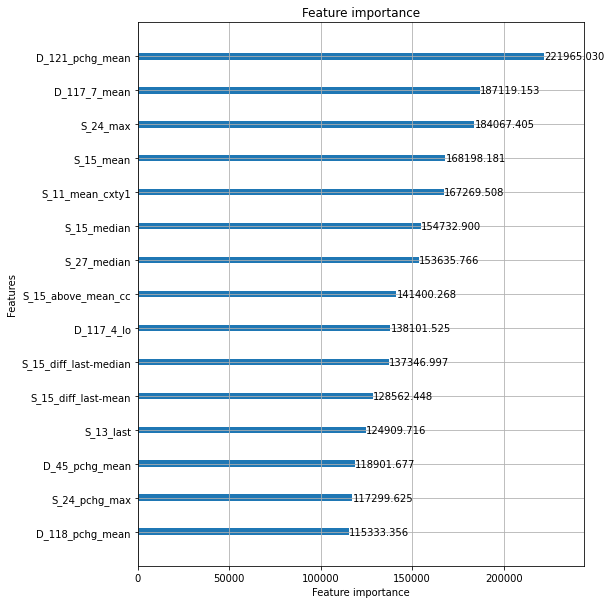

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.939472
[100]	valid_0's auc: 0.961331
[150]	valid_0's auc: 0.970979
[200]	valid_0's auc: 0.975853
[250]	valid_0's auc: 0.980092
[300]	valid_0's auc: 0.982411
[350]	valid_0's auc: 0.984667
[400]	valid_0's auc: 0.986123
[450]	valid_0's auc: 0.987339
[500]	valid_0's auc: 0.988373
[550]	valid_0's auc: 0.98917
[600]	valid_0's auc: 0.989986
[650]	valid_0's auc: 0.990604
[700]	valid_0's auc: 0.991018
[750]	valid_0's auc: 0.991521
[800]	valid_0's auc: 0.992164
[850]	valid_0's auc: 0.992447
[900]	valid_0's auc: 0.992723
[950]	valid_0's auc: 0.993229
[1000]	valid_0's auc: 0.993539
[1050]	valid_0's auc: 0.993747
[1100]	valid_0's auc: 0.993976
[1150]	valid_0's auc: 0.994291
[1200]	valid_0's auc: 0.994525
[1250]	valid_0's auc: 0.994683
[1300]	valid_0's auc: 0.994845
[1350]	valid_0's auc: 0.99495
[1400]	valid_0's auc: 0.995081
[1450]	valid_0's auc: 0.995213
[1500]	valid_0's auc: 0.995342
[1550]	valid_0's auc: 0.995425

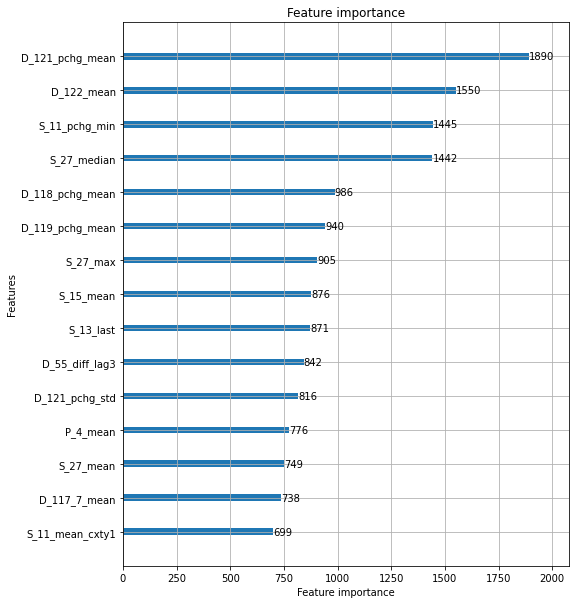

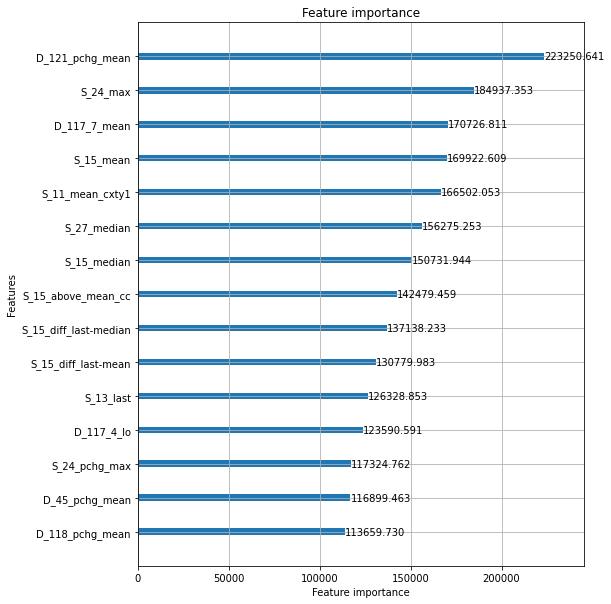

feature to remove: D_121_pchg_mean
Elapsed time: 30.82028901576996 min.
----------------------------------------------------------------------------------------------------
ITER: 67/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.933678
[100]	valid_0's auc: 0.958277
[150]	valid_0's auc: 0.968309
[200]	valid_0's auc: 0.974303
[250]	valid_0's auc: 0.978279
[300]	valid_0's auc: 0.981197
[350]	valid_0's auc: 0.983564
[400]	valid_0's auc: 0.985214
[450]	valid_0's auc: 0.986501
[500]	valid_0's auc: 0.987744
[550]	valid_0's auc: 0.988555
[600]	valid_0's auc: 0.989367
[650]	valid_0's auc: 0.989944
[700]	valid_0's auc: 0.990649
[750]	valid_0's auc: 0.991087
[800]	valid_0's auc: 0.99142
[850]	valid_0's auc: 0.991819
[900]	valid_0's auc: 0.992194
[950]	valid_0's auc: 0.992727
[1000]	valid_0's auc: 0.992967
[1050]	valid_0's auc: 0.993234
[1100]	valid_0's auc: 0.993477
[1150]	valid_0's auc: 0.993683
[1200]	valid_0's auc: 0.993986
[1250]	valid_0's auc: 0.99417

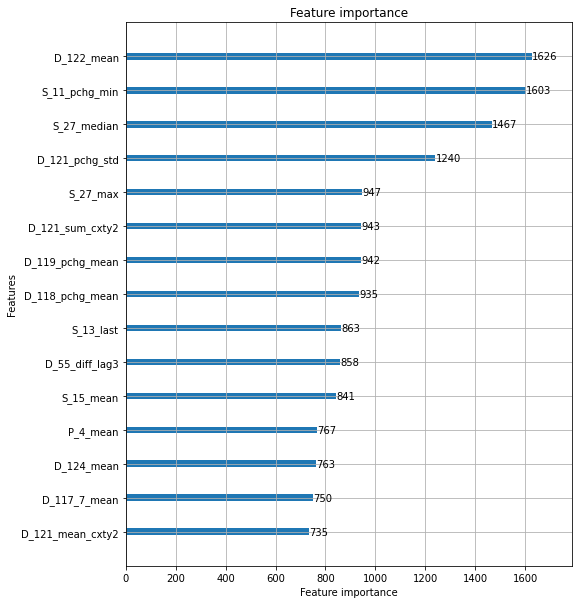

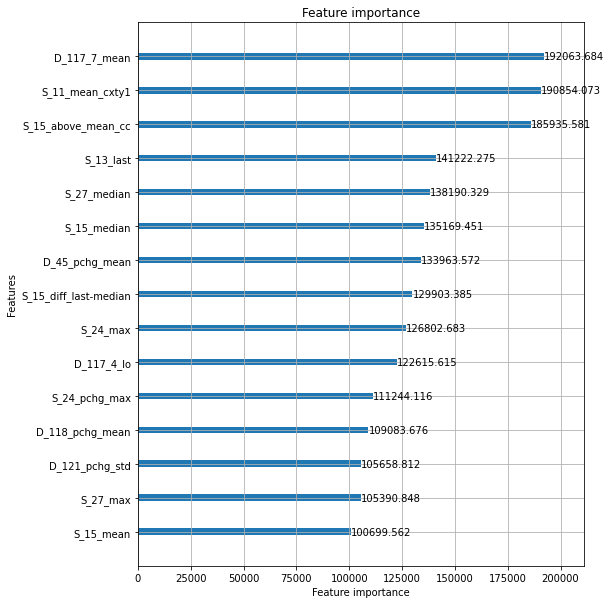

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.932513
[100]	valid_0's auc: 0.95839
[150]	valid_0's auc: 0.968662
[200]	valid_0's auc: 0.97429
[250]	valid_0's auc: 0.978477
[300]	valid_0's auc: 0.981179
[350]	valid_0's auc: 0.983804
[400]	valid_0's auc: 0.985298
[450]	valid_0's auc: 0.986535
[500]	valid_0's auc: 0.987685
[550]	valid_0's auc: 0.988513
[600]	valid_0's auc: 0.989198
[650]	valid_0's auc: 0.989819
[700]	valid_0's auc: 0.990633
[750]	valid_0's auc: 0.991285
[800]	valid_0's auc: 0.991828
[850]	valid_0's auc: 0.992287
[900]	valid_0's auc: 0.992554
[950]	valid_0's auc: 0.992926
[1000]	valid_0's auc: 0.993199
[1050]	valid_0's auc: 0.993473
[1100]	valid_0's auc: 0.99369
[1150]	valid_0's auc: 0.993881
[1200]	valid_0's auc: 0.994012
[1250]	valid_0's auc: 0.994212
[1300]	valid_0's auc: 0.994454
[1350]	valid_0's auc: 0.994565
[1400]	valid_0's auc: 0.994702
[1450]	valid_0's auc: 0.994803
[1500]	valid_0's auc: 0.994936
[1550]	valid_0's auc: 0.995058


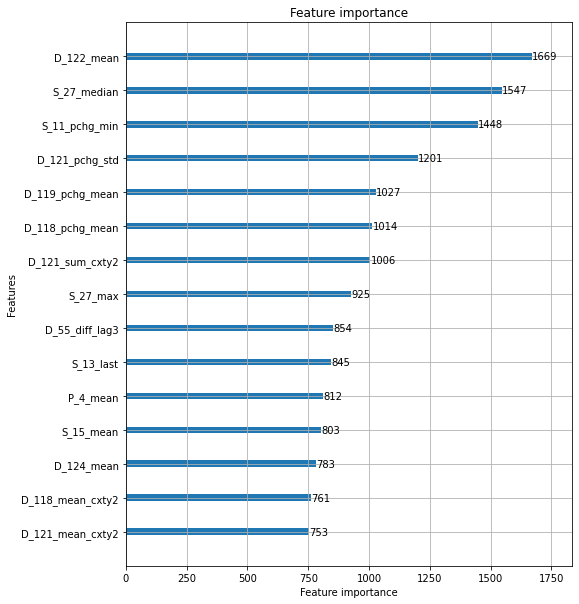

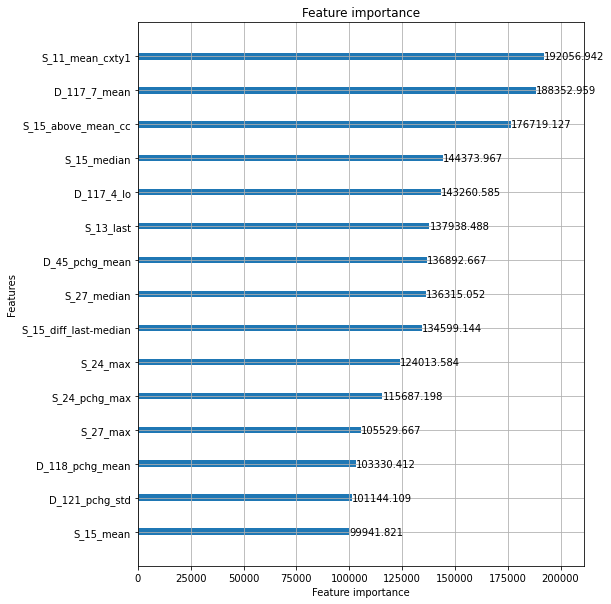

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.933182
[100]	valid_0's auc: 0.957325
[150]	valid_0's auc: 0.968268
[200]	valid_0's auc: 0.974235
[250]	valid_0's auc: 0.978386
[300]	valid_0's auc: 0.981595
[350]	valid_0's auc: 0.983623
[400]	valid_0's auc: 0.985106
[450]	valid_0's auc: 0.9865
[500]	valid_0's auc: 0.987482
[550]	valid_0's auc: 0.988403
[600]	valid_0's auc: 0.989115
[650]	valid_0's auc: 0.989668
[700]	valid_0's auc: 0.990242
[750]	valid_0's auc: 0.990836
[800]	valid_0's auc: 0.991319
[850]	valid_0's auc: 0.991787
[900]	valid_0's auc: 0.992079
[950]	valid_0's auc: 0.992779
[1000]	valid_0's auc: 0.993113
[1050]	valid_0's auc: 0.99338
[1100]	valid_0's auc: 0.993622
[1150]	valid_0's auc: 0.993817
[1200]	valid_0's auc: 0.993982
[1250]	valid_0's auc: 0.994153
[1300]	valid_0's auc: 0.994367
[1350]	valid_0's auc: 0.994503
[1400]	valid_0's auc: 0.994663
[1450]	valid_0's auc: 0.994811
[1500]	valid_0's auc: 0.994942
[1550]	valid_0's auc: 0.995092


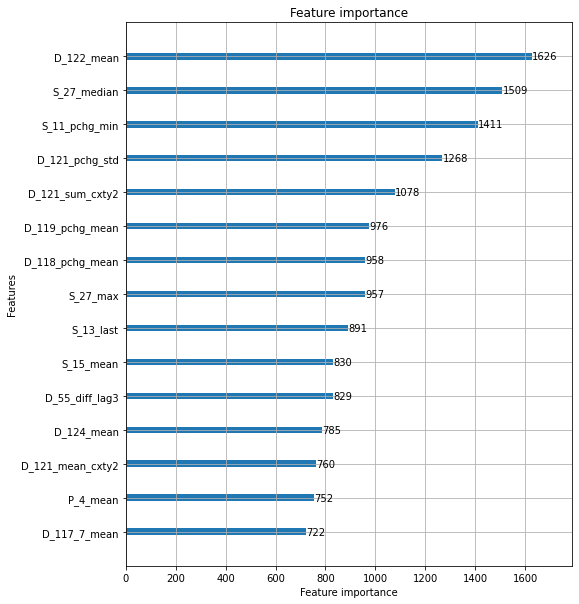

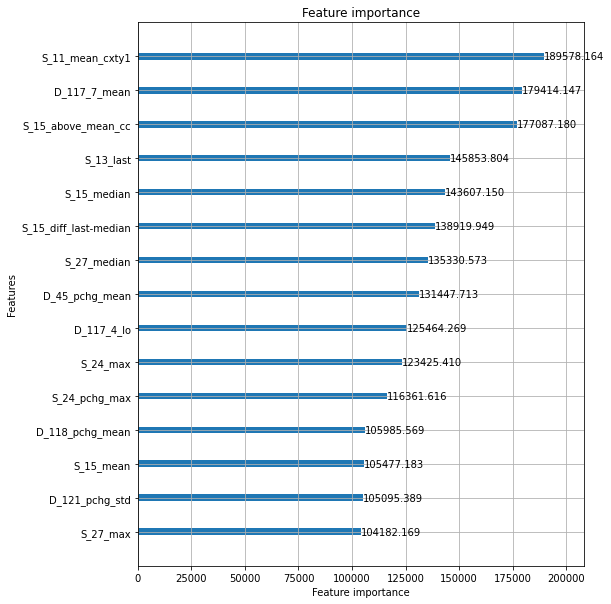

feature to remove: S_11_mean_cxty1
Elapsed time: 30.880350212256115 min.
----------------------------------------------------------------------------------------------------
ITER: 68/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.933012
[100]	valid_0's auc: 0.958799
[150]	valid_0's auc: 0.969336
[200]	valid_0's auc: 0.974764
[250]	valid_0's auc: 0.97887
[300]	valid_0's auc: 0.981285
[350]	valid_0's auc: 0.983416
[400]	valid_0's auc: 0.984984
[450]	valid_0's auc: 0.986378
[500]	valid_0's auc: 0.98752
[550]	valid_0's auc: 0.988425
[600]	valid_0's auc: 0.989143
[650]	valid_0's auc: 0.989727
[700]	valid_0's auc: 0.990374
[750]	valid_0's auc: 0.991041
[800]	valid_0's auc: 0.991504
[850]	valid_0's auc: 0.99205
[900]	valid_0's auc: 0.992534
[950]	valid_0's auc: 0.992845
[1000]	valid_0's auc: 0.993096
[1050]	valid_0's auc: 0.993398
[1100]	valid_0's auc: 0.993585
[1150]	valid_0's auc: 0.99378
[1200]	valid_0's auc: 0.993944
[1250]	valid_0's auc: 0.994116


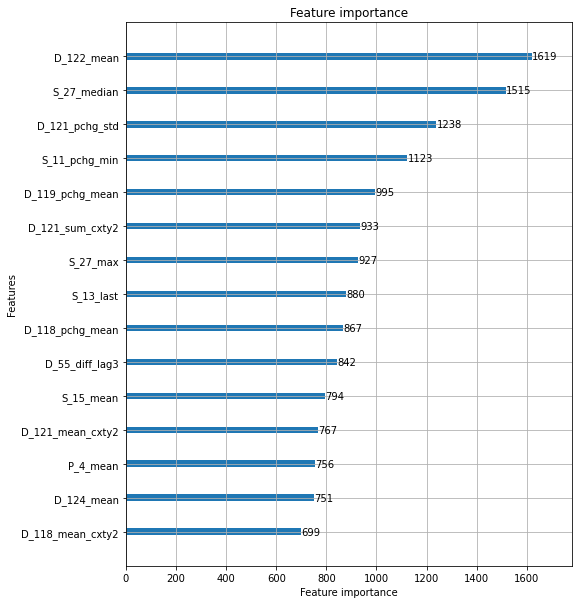

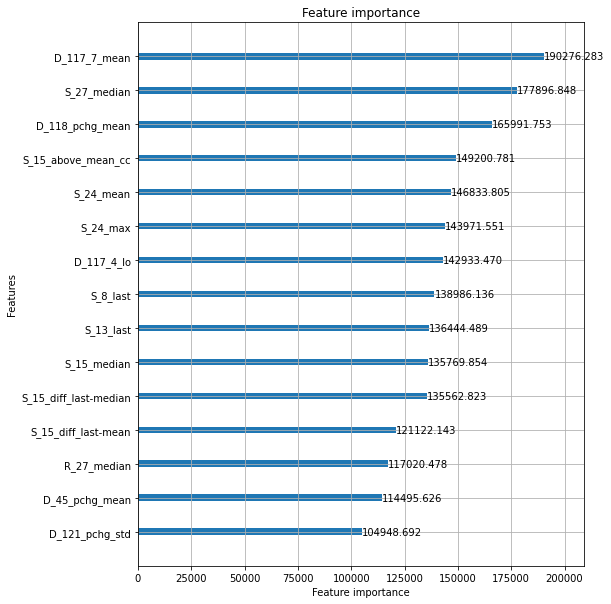

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.930815
[100]	valid_0's auc: 0.957663
[150]	valid_0's auc: 0.9684
[200]	valid_0's auc: 0.974158
[250]	valid_0's auc: 0.978375
[300]	valid_0's auc: 0.980619
[350]	valid_0's auc: 0.983086
[400]	valid_0's auc: 0.984763
[450]	valid_0's auc: 0.986241
[500]	valid_0's auc: 0.987436
[550]	valid_0's auc: 0.988319
[600]	valid_0's auc: 0.989221
[650]	valid_0's auc: 0.989925
[700]	valid_0's auc: 0.990554
[750]	valid_0's auc: 0.991044
[800]	valid_0's auc: 0.991514
[850]	valid_0's auc: 0.992023
[900]	valid_0's auc: 0.992438
[950]	valid_0's auc: 0.99278
[1000]	valid_0's auc: 0.993062
[1050]	valid_0's auc: 0.993313
[1100]	valid_0's auc: 0.993699
[1150]	valid_0's auc: 0.993899
[1200]	valid_0's auc: 0.994102
[1250]	valid_0's auc: 0.994254
[1300]	valid_0's auc: 0.994358
[1350]	valid_0's auc: 0.994524
[1400]	valid_0's auc: 0.994685
[1450]	valid_0's auc: 0.994843
[1500]	valid_0's auc: 0.994955
[1550]	valid_0's auc: 0.995043


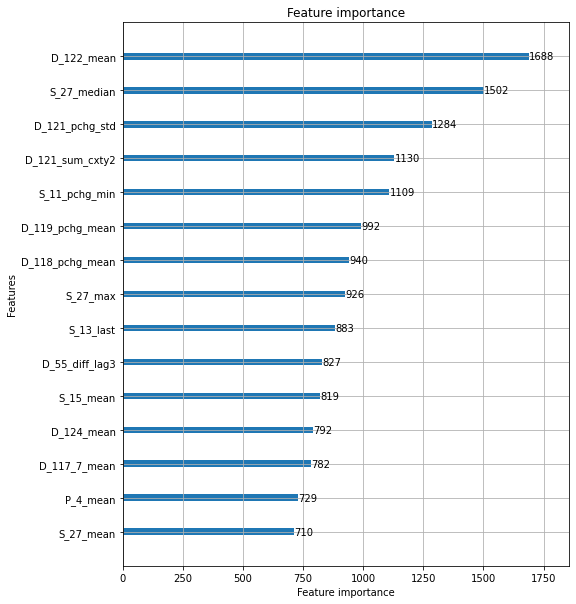

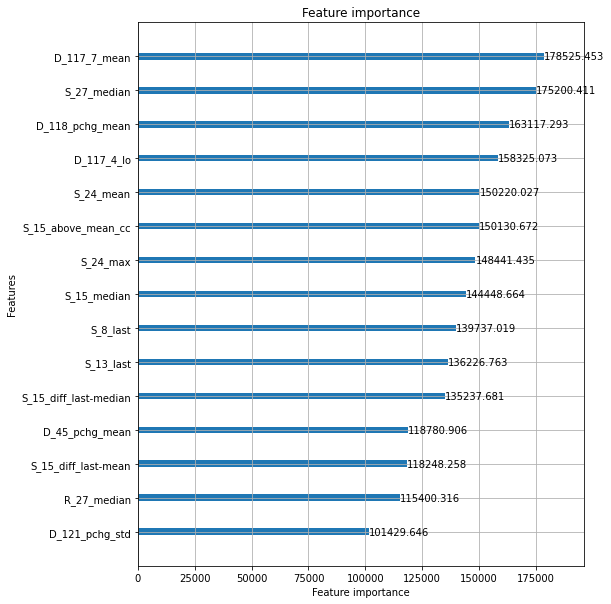

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.930976
[100]	valid_0's auc: 0.956409
[150]	valid_0's auc: 0.968359
[200]	valid_0's auc: 0.974631
[250]	valid_0's auc: 0.978512
[300]	valid_0's auc: 0.981073
[350]	valid_0's auc: 0.983402
[400]	valid_0's auc: 0.985035
[450]	valid_0's auc: 0.986397
[500]	valid_0's auc: 0.987516
[550]	valid_0's auc: 0.988448
[600]	valid_0's auc: 0.989238
[650]	valid_0's auc: 0.989992
[700]	valid_0's auc: 0.990512
[750]	valid_0's auc: 0.990974
[800]	valid_0's auc: 0.991443
[850]	valid_0's auc: 0.991912
[900]	valid_0's auc: 0.992304
[950]	valid_0's auc: 0.992569
[1000]	valid_0's auc: 0.992917
[1050]	valid_0's auc: 0.99314
[1100]	valid_0's auc: 0.993556
[1150]	valid_0's auc: 0.993855
[1200]	valid_0's auc: 0.994099
[1250]	valid_0's auc: 0.994209
[1300]	valid_0's auc: 0.994366
[1350]	valid_0's auc: 0.994488
[1400]	valid_0's auc: 0.994677
[1450]	valid_0's auc: 0.99479
[1500]	valid_0's auc: 0.99488
[1550]	valid_0's auc: 0.995033


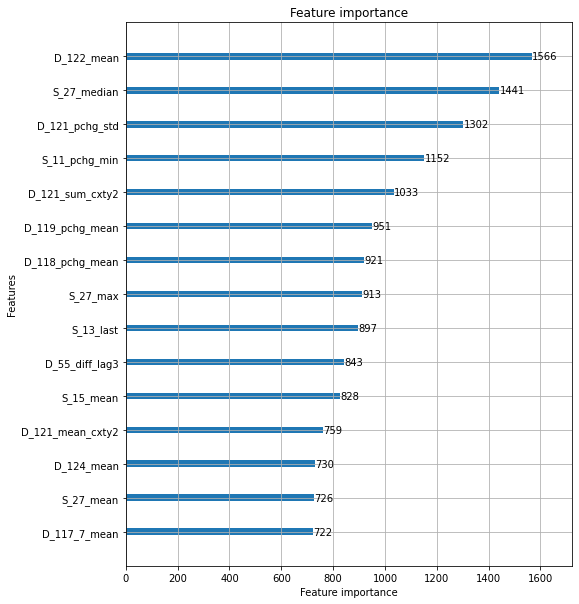

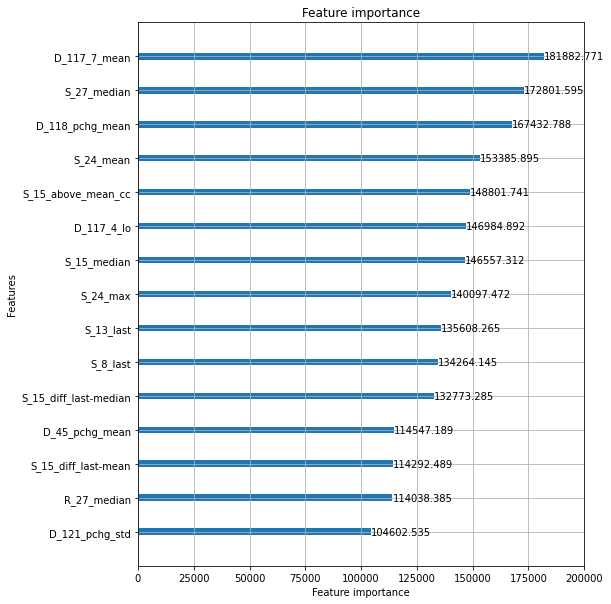

feature to remove: D_117_7_mean
Elapsed time: 30.872605816523233 min.
----------------------------------------------------------------------------------------------------
ITER: 69/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.933575
[100]	valid_0's auc: 0.956898
[150]	valid_0's auc: 0.966272
[200]	valid_0's auc: 0.972256
[250]	valid_0's auc: 0.976622
[300]	valid_0's auc: 0.979313
[350]	valid_0's auc: 0.981881
[400]	valid_0's auc: 0.983701
[450]	valid_0's auc: 0.98532
[500]	valid_0's auc: 0.986358
[550]	valid_0's auc: 0.98719
[600]	valid_0's auc: 0.988161
[650]	valid_0's auc: 0.988943
[700]	valid_0's auc: 0.989458
[750]	valid_0's auc: 0.990034
[800]	valid_0's auc: 0.990436
[850]	valid_0's auc: 0.990911
[900]	valid_0's auc: 0.991787
[950]	valid_0's auc: 0.99221
[1000]	valid_0's auc: 0.99246
[1050]	valid_0's auc: 0.992683
[1100]	valid_0's auc: 0.99289
[1150]	valid_0's auc: 0.993205
[1200]	valid_0's auc: 0.99351
[1250]	valid_0's auc: 0.993668
[1300

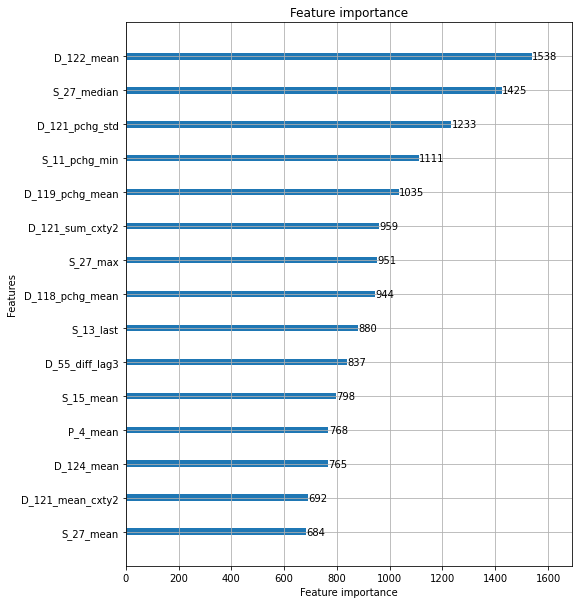

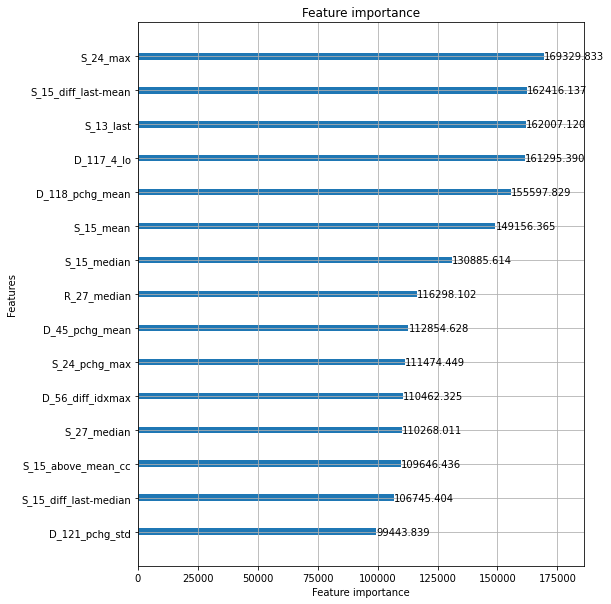

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.935827
[100]	valid_0's auc: 0.957722
[150]	valid_0's auc: 0.967236
[200]	valid_0's auc: 0.972936
[250]	valid_0's auc: 0.977433
[300]	valid_0's auc: 0.979913
[350]	valid_0's auc: 0.982089
[400]	valid_0's auc: 0.983812
[450]	valid_0's auc: 0.985392
[500]	valid_0's auc: 0.986735
[550]	valid_0's auc: 0.987602
[600]	valid_0's auc: 0.988549
[650]	valid_0's auc: 0.989409
[700]	valid_0's auc: 0.989883
[750]	valid_0's auc: 0.990465
[800]	valid_0's auc: 0.990903
[850]	valid_0's auc: 0.991308
[900]	valid_0's auc: 0.991819
[950]	valid_0's auc: 0.992185
[1000]	valid_0's auc: 0.992478
[1050]	valid_0's auc: 0.992759
[1100]	valid_0's auc: 0.993103
[1150]	valid_0's auc: 0.993313
[1200]	valid_0's auc: 0.993565
[1250]	valid_0's auc: 0.993832
[1300]	valid_0's auc: 0.994067
[1350]	valid_0's auc: 0.994167
[1400]	valid_0's auc: 0.994327
[1450]	valid_0's auc: 0.99444
[1500]	valid_0's auc: 0.994546
[1550]	valid_0's auc: 0.99470

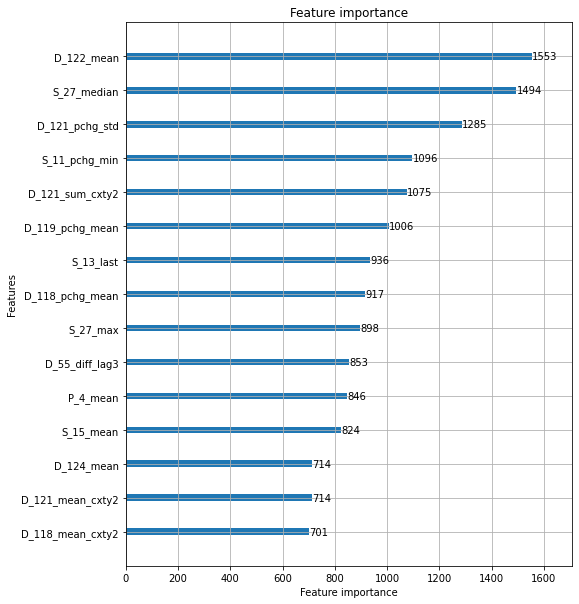

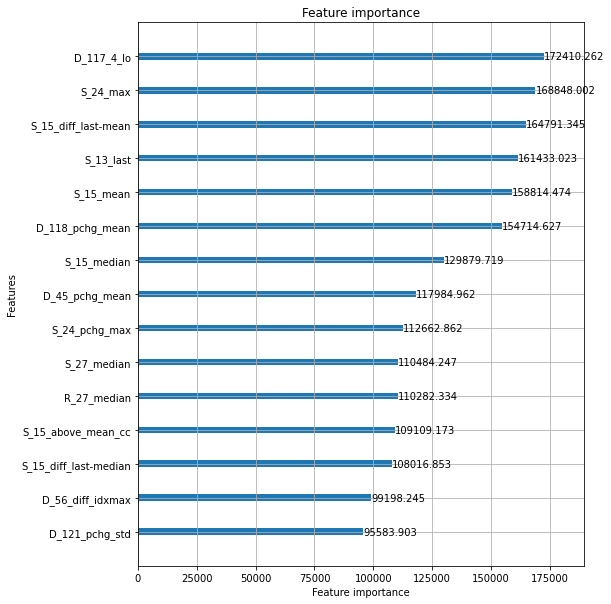

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.93415
[100]	valid_0's auc: 0.956459
[150]	valid_0's auc: 0.966119
[200]	valid_0's auc: 0.972201
[250]	valid_0's auc: 0.976786
[300]	valid_0's auc: 0.979734
[350]	valid_0's auc: 0.98212
[400]	valid_0's auc: 0.983883
[450]	valid_0's auc: 0.985348
[500]	valid_0's auc: 0.986557
[550]	valid_0's auc: 0.987529
[600]	valid_0's auc: 0.988248
[650]	valid_0's auc: 0.988991
[700]	valid_0's auc: 0.98947
[750]	valid_0's auc: 0.990174
[800]	valid_0's auc: 0.990669
[850]	valid_0's auc: 0.991131
[900]	valid_0's auc: 0.991523
[950]	valid_0's auc: 0.991898
[1000]	valid_0's auc: 0.992226
[1050]	valid_0's auc: 0.992499
[1100]	valid_0's auc: 0.992815
[1150]	valid_0's auc: 0.993203
[1200]	valid_0's auc: 0.993455
[1250]	valid_0's auc: 0.993642
[1300]	valid_0's auc: 0.993898
[1350]	valid_0's auc: 0.994105
[1400]	valid_0's auc: 0.994314
[1450]	valid_0's auc: 0.994449
[1500]	valid_0's auc: 0.994557
[1550]	valid_0's auc: 0.994644


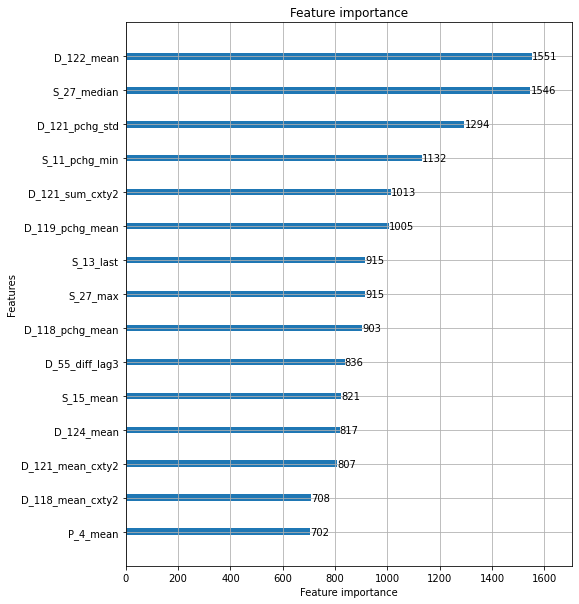

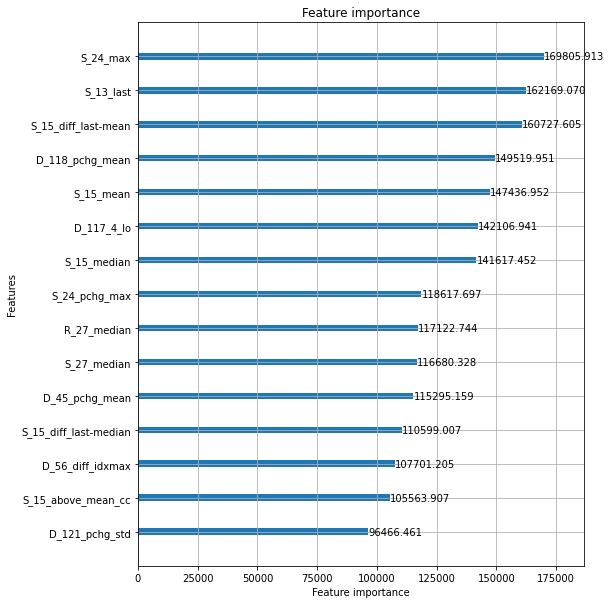

feature to remove: S_24_max
Elapsed time: 30.999325319131216 min.
----------------------------------------------------------------------------------------------------
ITER: 70/100
Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.93286
[100]	valid_0's auc: 0.954969
[150]	valid_0's auc: 0.967224
[200]	valid_0's auc: 0.973496
[250]	valid_0's auc: 0.977148
[300]	valid_0's auc: 0.979996
[350]	valid_0's auc: 0.982363
[400]	valid_0's auc: 0.984193
[450]	valid_0's auc: 0.985455
[500]	valid_0's auc: 0.986864
[550]	valid_0's auc: 0.988078
[600]	valid_0's auc: 0.988793
[650]	valid_0's auc: 0.989465
[700]	valid_0's auc: 0.990018
[750]	valid_0's auc: 0.990682
[800]	valid_0's auc: 0.991106
[850]	valid_0's auc: 0.991442
[900]	valid_0's auc: 0.991792
[950]	valid_0's auc: 0.992203
[1000]	valid_0's auc: 0.9928
[1050]	valid_0's auc: 0.993063
[1100]	valid_0's auc: 0.993325
[1150]	valid_0's auc: 0.993512
[1200]	valid_0's auc: 0.993726
[1250]	valid_0's auc: 0.99389
[1300]	

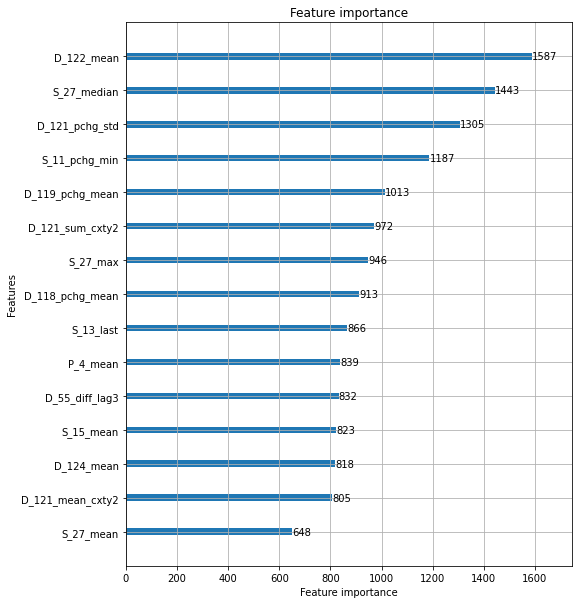

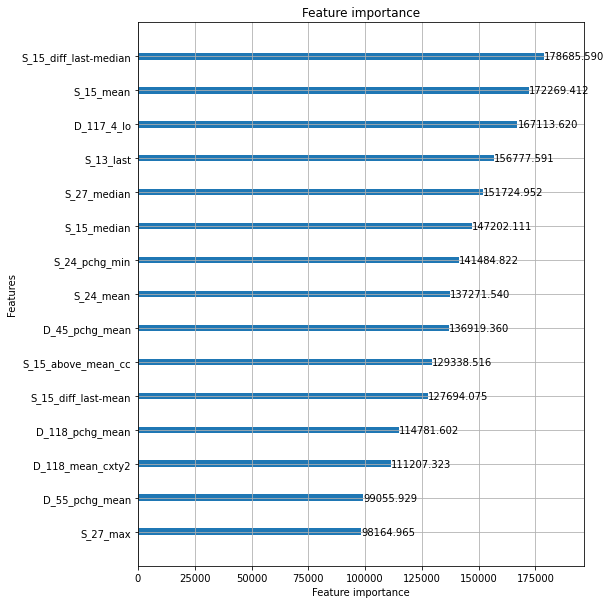

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.93294
[100]	valid_0's auc: 0.954877
[150]	valid_0's auc: 0.967526
[200]	valid_0's auc: 0.973878
[250]	valid_0's auc: 0.977487
[300]	valid_0's auc: 0.980597
[350]	valid_0's auc: 0.98296
[400]	valid_0's auc: 0.984518
[450]	valid_0's auc: 0.985842
[500]	valid_0's auc: 0.986895
[550]	valid_0's auc: 0.987881
[600]	valid_0's auc: 0.988607
[650]	valid_0's auc: 0.989266
[700]	valid_0's auc: 0.989892
[750]	valid_0's auc: 0.990434
[800]	valid_0's auc: 0.991047
[850]	valid_0's auc: 0.991418
[900]	valid_0's auc: 0.991851
[950]	valid_0's auc: 0.992132
[1000]	valid_0's auc: 0.992394
[1050]	valid_0's auc: 0.992624
[1100]	valid_0's auc: 0.993051
[1150]	valid_0's auc: 0.993313
[1200]	valid_0's auc: 0.993532
[1250]	valid_0's auc: 0.993743
[1300]	valid_0's auc: 0.993909
[1350]	valid_0's auc: 0.994036
[1400]	valid_0's auc: 0.994177
[1450]	valid_0's auc: 0.994348
[1500]	valid_0's auc: 0.994442
[1550]	valid_0's auc: 0.99463


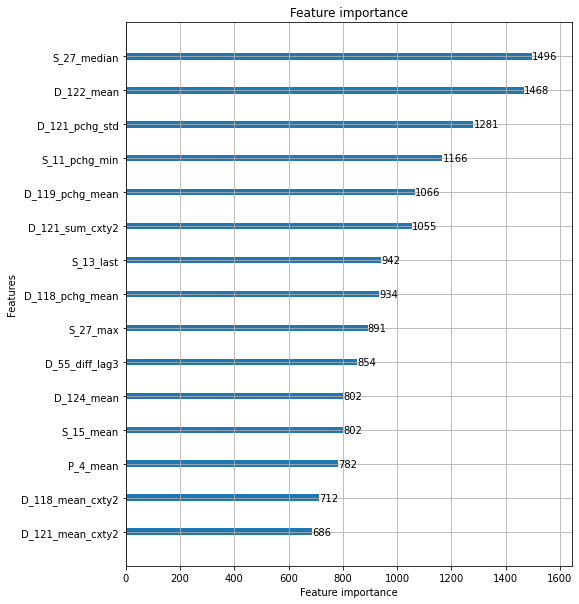

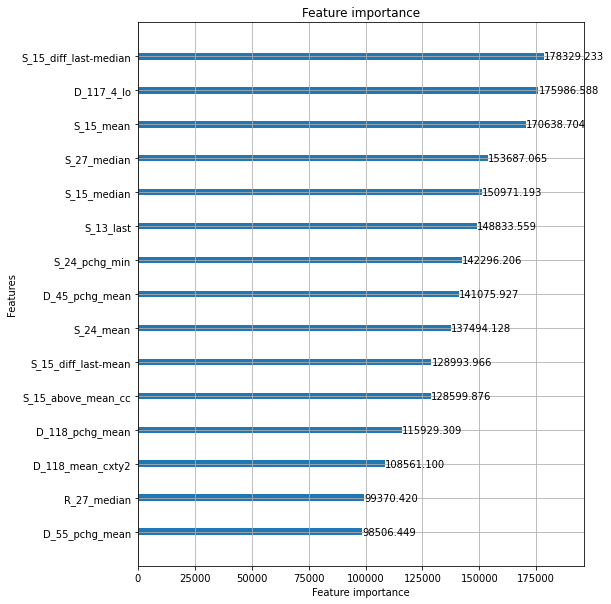

Training until validation scores don't improve for 100 rounds
[50]	valid_0's auc: 0.933562
[100]	valid_0's auc: 0.953608
[150]	valid_0's auc: 0.966681
[200]	valid_0's auc: 0.973468
[250]	valid_0's auc: 0.977228
[300]	valid_0's auc: 0.980576
[350]	valid_0's auc: 0.982619
[400]	valid_0's auc: 0.984382
[450]	valid_0's auc: 0.985911
[500]	valid_0's auc: 0.987046
[550]	valid_0's auc: 0.98801
[600]	valid_0's auc: 0.988954
[650]	valid_0's auc: 0.989633
[700]	valid_0's auc: 0.990205
[750]	valid_0's auc: 0.990718
[800]	valid_0's auc: 0.99124
[850]	valid_0's auc: 0.991779
[900]	valid_0's auc: 0.992064
[950]	valid_0's auc: 0.992357
[1000]	valid_0's auc: 0.992867
[1050]	valid_0's auc: 0.993208
[1100]	valid_0's auc: 0.993444
[1150]	valid_0's auc: 0.993618
[1200]	valid_0's auc: 0.993754
[1250]	valid_0's auc: 0.993901
[1300]	valid_0's auc: 0.994206
[1350]	valid_0's auc: 0.994294
[1400]	valid_0's auc: 0.994434
[1450]	valid_0's auc: 0.994618
[1500]	valid_0's auc: 0.994716
[1550]	valid_0's auc: 0.994875

KeyboardInterrupt: 

In [12]:
ITERATIONS = 100
removed = list()
scores_log = list()

for i in range(ITERATIONS):
    print("-"*100)
    print(f"ITER: {i+1}/{ITERATIONS}")
    
    tic = time.time()

    importances = list()
    scores = list()

    for train_idx,valid_idx in skf_split:
        train_dset = lgb.Dataset(
            data=dset.loc[train_idx,input_feats],
            label=dset.loc[train_idx,"target"].values,
            free_raw_data=True,
        )
        valid_dset = lgb.Dataset(
            data=dset.loc[valid_idx,input_feats],
            label=dset.loc[valid_idx,"target"].values,
            free_raw_data=True,
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            callbacks=[lgb.log_evaluation(period=50), lgb.early_stopping(100)],
        )
        lgb.plot_importance(model, figsize=(8,10), importance_type="split", max_num_features=15)
        lgb.plot_importance(model, figsize=(8,10), importance_type="gain", max_num_features=15)
        plt.show()   

        imp = model.feature_importance(importance_type="gain")
        imp /= imp.sum()
        importances.append(imp)
        scores.append(model.best_score["valid_0"]["auc"])

        del train_dset,valid_dset,model; gc.collect()
        
    importances = np.mean(importances, axis=0)
    score = np.mean(scores)
    to_remove = input_feats[importances.argmax()]
    print("feature to remove:", to_remove)
    input_feats.remove(to_remove)
    removed.append(to_remove)
    scores_log.append(score)
    
    tac = time.time()
    print(f"Elapsed time: {(tac-tic)/60.} min.")

In [ ]:
print(removed)

In [ ]:
print(scores_log)

In [ ]:
plt.figure(figsize=(15,5))
plt.plot(scores_log, "o-")
plt.grid()
plt.show()

***